# benchmarking on omnipath


In [2]:
from scprint import scPrint
from scprint.tasks import GRNfer

from bengrn import BenGRN
import scanpy as sc

from bengrn.base import train_classifier

from anndata.utils import make_index_unique
from bengrn import compute_genie3
from grnndata import utils as grnutils
import numpy as np
import joblib
%load_ext autoreload
%autoreload 2 

import torch
torch.set_float32_matmul_precision('medium')

/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/bitsandbytes/cextension.py:31: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "


/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/bitsandbytes/libbitsandbytes_cpu.so: undefined symbol: cadam32bit_grad_fp32
💡 connected lamindb: jkobject/scprint


/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(


In [2]:
model = scPrint.load_from_checkpoint(
#    '../data/temp/o2uniqsx/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
#    '../data/temp/vbd8bavn/epoch=19-step=100000.ckpt', precpt_gene_emb=None)
#    '../data/temp/1tghqqzx_dir/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
    '/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint_scale/o2uniqsx/checkpoints/epoch=18-step=133000.ckpt', precpt_gene_emb=None)
NUM_GENES = 5000
MAXCELLS = 1024

[d3graph] INFO> Created a temporary directory at /local/scratch/tmp/tmp4cqikjtp


[d3graph] INFO> Writing /local/scratch/tmp/tmp4cqikjtp/_remote_module_non_scriptable.py


RuntimeError caught: scPrint is not attached to a `Trainer`.


In [3]:
#CELLTYPES = [
#    'pigmented ciliary epithelial cell',
#    'non-pigmented ciliary epithelial cell',
#    'ciliary muscle cell',
#    'fibroblast',
#    'Schwann cell',
#    'macrophage',
#    'melanocyte',
#    'lymphocyte',
#    'blood vessel endothelial cell',
#    'pericyte'
#]
CELLTYPES = [
    "microglial cell",
    "retinal rod cell",
    "Mueller cell",
    "amacrine cell",
    "ON-bipolar cell",
    "rod bipolar cell",
    "retinal cone cell",
    "retina horizontal cell",
    "retinal ganglion cell",
    "astrocyte",
    ]

In [4]:
#adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/yBCKp6HmXuHa0cZptMo7.h5ad')
#adata = sc.read_h5ad('/pasteur/zeus/projets/p02/ml4ig_hot/Users/jkalfon/scprint/.lamindb/REIyQZE6OMZm1S3W2Dxi.h5ad')
adata = sc.read_h5ad('../data/gNNpgpo6gATjuxTE7CCp.h5ad')

adata.var["isTF"] = False
adata.var.loc[adata.var.symbol.isin(grnutils.TF), "isTF"] = True
adata

AnnData object with n_obs × n_vars = 51370 × 70116
    obs: 'biosample_id', 'donor_id', 'cell_type_ontology_term_id', 'organism_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'cell_type__custom', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'is_primary_data', 'age', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'uid', 'symbol', 'ncbi_gene_ids', 'biotype', 'desc

In [5]:
#model.normalization = "log"
model.organisms = ['NCBITaxon:9606','NCBITaxon:10090']

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:03<01:33,  3.02s/it]

  6%|▋         | 2/32 [00:03<00:53,  1.77s/it]

  9%|▉         | 3/32 [00:04<00:41,  1.42s/it]

 12%|█▎        | 4/32 [00:05<00:33,  1.21s/it]

 16%|█▌        | 5/32 [00:06<00:30,  1.13s/it]

 19%|█▉        | 6/32 [00:07<00:27,  1.06s/it]

 22%|██▏       | 7/32 [00:08<00:26,  1.04s/it]

 25%|██▌       | 8/32 [00:09<00:23,  1.01it/s]

 28%|██▊       | 9/32 [00:10<00:23,  1.03s/it]

 31%|███▏      | 10/32 [00:11<00:21,  1.02it/s]

 34%|███▍      | 11/32 [00:12<00:20,  1.00it/s]

 38%|███▊      | 12/32 [00:13<00:19,  1.03it/s]

 41%|████      | 13/32 [00:14<00:18,  1.03it/s]

 44%|████▍     | 14/32 [00:15<00:17,  1.05it/s]

 47%|████▋     | 15/32 [00:16<00:16,  1.03it/s]

 50%|█████     | 16/32 [00:17<00:15,  1.04it/s]

 53%|█████▎    | 17/32 [00:18<00:14,  1.03it/s]

 56%|█████▋    | 18/32 [00:19<00:13,  1.05it/s]

 59%|█████▉    | 19/32 [00:20<00:12,  1.03it/s]

 62%|██████▎   | 20/32 [00:21<00:11,  1.04it/s]

 66%|██████▌   | 21/32 [00:22<00:10,  1.03it/s]

 69%|██████▉   | 22/32 [00:23<00:09,  1.04it/s]

 72%|███████▏  | 23/32 [00:24<00:08,  1.05it/s]

 75%|███████▌  | 24/32 [00:24<00:07,  1.07it/s]

 78%|███████▊  | 25/32 [00:26<00:06,  1.04it/s]

 81%|████████▏ | 26/32 [00:26<00:05,  1.06it/s]

 84%|████████▍ | 27/32 [00:27<00:04,  1.04it/s]

 88%|████████▊ | 28/32 [00:28<00:03,  1.06it/s]

 91%|█████████ | 29/32 [00:29<00:02,  1.02it/s]

 94%|█████████▍| 30/32 [00:30<00:01,  1.04it/s]

 97%|█████████▋| 31/32 [00:31<00:01,  1.02s/it]

100%|██████████| 32/32 [00:32<00:00,  1.01s/it]

100%|██████████| 32/32 [00:33<00:00,  1.04s/it]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


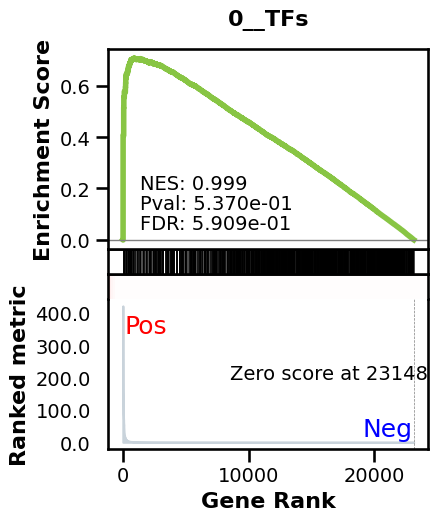

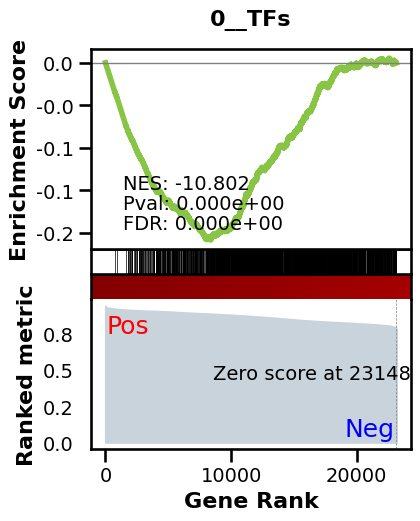

_________________________________________
TF specific enrichment


found some significant results for  43.75 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:57,  2.22it/s]

  2%|▏         | 2/128 [00:00<00:52,  2.39it/s]

  2%|▏         | 3/128 [00:01<00:51,  2.43it/s]

  3%|▎         | 4/128 [00:01<00:49,  2.51it/s]

  4%|▍         | 5/128 [00:01<00:47,  2.59it/s]

  5%|▍         | 6/128 [00:02<00:46,  2.62it/s]

  5%|▌         | 7/128 [00:02<00:46,  2.62it/s]

  6%|▋         | 8/128 [00:03<00:46,  2.59it/s]

  7%|▋         | 9/128 [00:03<00:46,  2.57it/s]

  8%|▊         | 10/128 [00:03<00:45,  2.61it/s]

  9%|▊         | 11/128 [00:04<00:43,  2.68it/s]

  9%|▉         | 12/128 [00:04<00:43,  2.66it/s]

 10%|█         | 13/128 [00:05<00:45,  2.55it/s]

 11%|█         | 14/128 [00:05<00:44,  2.55it/s]

 12%|█▏        | 15/128 [00:05<00:43,  2.61it/s]

 12%|█▎        | 16/128 [00:06<00:41,  2.70it/s]

 13%|█▎        | 17/128 [00:06<00:40,  2.72it/s]

 14%|█▍        | 18/128 [00:06<00:40,  2.69it/s]

 15%|█▍        | 19/128 [00:07<00:40,  2.68it/s]

 16%|█▌        | 20/128 [00:07<00:40,  2.68it/s]

 16%|█▋        | 21/128 [00:08<00:39,  2.68it/s]

 17%|█▋        | 22/128 [00:08<00:39,  2.67it/s]

 18%|█▊        | 23/128 [00:08<00:39,  2.64it/s]

 19%|█▉        | 24/128 [00:09<00:39,  2.67it/s]

 20%|█▉        | 25/128 [00:09<00:38,  2.65it/s]

 20%|██        | 26/128 [00:09<00:39,  2.60it/s]

 21%|██        | 27/128 [00:10<00:39,  2.57it/s]

 22%|██▏       | 28/128 [00:10<00:38,  2.58it/s]

 23%|██▎       | 29/128 [00:11<00:37,  2.63it/s]

 23%|██▎       | 30/128 [00:11<00:36,  2.67it/s]

 24%|██▍       | 31/128 [00:11<00:35,  2.71it/s]

 25%|██▌       | 32/128 [00:12<00:36,  2.63it/s]

 26%|██▌       | 33/128 [00:12<00:35,  2.65it/s]

 27%|██▋       | 34/128 [00:12<00:36,  2.60it/s]

 27%|██▋       | 35/128 [00:13<00:35,  2.59it/s]

 28%|██▊       | 36/128 [00:13<00:35,  2.60it/s]

 29%|██▉       | 37/128 [00:14<00:34,  2.65it/s]

 30%|██▉       | 38/128 [00:14<00:34,  2.63it/s]

 30%|███       | 39/128 [00:14<00:34,  2.60it/s]

 31%|███▏      | 40/128 [00:15<00:33,  2.61it/s]

 32%|███▏      | 41/128 [00:15<00:34,  2.54it/s]

 33%|███▎      | 42/128 [00:16<00:33,  2.59it/s]

 34%|███▎      | 43/128 [00:16<00:32,  2.61it/s]

 34%|███▍      | 44/128 [00:16<00:32,  2.55it/s]

 35%|███▌      | 45/128 [00:17<00:33,  2.50it/s]

 36%|███▌      | 46/128 [00:17<00:32,  2.56it/s]

 37%|███▋      | 47/128 [00:18<00:30,  2.62it/s]

 38%|███▊      | 48/128 [00:18<00:31,  2.55it/s]

 38%|███▊      | 49/128 [00:18<00:31,  2.52it/s]

 39%|███▉      | 50/128 [00:19<00:31,  2.51it/s]

 40%|███▉      | 51/128 [00:19<00:29,  2.62it/s]

 41%|████      | 52/128 [00:19<00:28,  2.66it/s]

 41%|████▏     | 53/128 [00:20<00:29,  2.58it/s]

 42%|████▏     | 54/128 [00:20<00:29,  2.50it/s]

 43%|████▎     | 55/128 [00:21<00:29,  2.51it/s]

 44%|████▍     | 56/128 [00:21<00:27,  2.61it/s]

 45%|████▍     | 57/128 [00:21<00:27,  2.62it/s]

 45%|████▌     | 58/128 [00:22<00:27,  2.56it/s]

 46%|████▌     | 59/128 [00:22<00:27,  2.49it/s]

 47%|████▋     | 60/128 [00:23<00:26,  2.53it/s]

 48%|████▊     | 61/128 [00:23<00:25,  2.63it/s]

 48%|████▊     | 62/128 [00:23<00:25,  2.64it/s]

 49%|████▉     | 63/128 [00:24<00:25,  2.57it/s]

 50%|█████     | 64/128 [00:24<00:25,  2.51it/s]

 51%|█████     | 65/128 [00:25<00:24,  2.58it/s]

 52%|█████▏    | 66/128 [00:25<00:23,  2.60it/s]

 52%|█████▏    | 67/128 [00:25<00:24,  2.53it/s]

 53%|█████▎    | 68/128 [00:26<00:23,  2.58it/s]

 54%|█████▍    | 69/128 [00:26<00:22,  2.57it/s]

 55%|█████▍    | 70/128 [00:26<00:22,  2.57it/s]

 55%|█████▌    | 71/128 [00:27<00:21,  2.61it/s]

 56%|█████▋    | 72/128 [00:27<00:21,  2.63it/s]

 57%|█████▋    | 73/128 [00:28<00:21,  2.60it/s]

 58%|█████▊    | 74/128 [00:28<00:20,  2.59it/s]

 59%|█████▊    | 75/128 [00:28<00:20,  2.53it/s]

 59%|█████▉    | 76/128 [00:29<00:20,  2.53it/s]

 60%|██████    | 77/128 [00:29<00:19,  2.58it/s]

 61%|██████    | 78/128 [00:30<00:19,  2.62it/s]

 62%|██████▏   | 79/128 [00:30<00:19,  2.52it/s]

 62%|██████▎   | 80/128 [00:30<00:18,  2.60it/s]

 63%|██████▎   | 81/128 [00:31<00:17,  2.64it/s]

 64%|██████▍   | 82/128 [00:31<00:17,  2.67it/s]

 65%|██████▍   | 83/128 [00:31<00:17,  2.63it/s]

 66%|██████▌   | 84/128 [00:32<00:16,  2.64it/s]

 66%|██████▋   | 85/128 [00:32<00:16,  2.63it/s]

 67%|██████▋   | 86/128 [00:33<00:15,  2.67it/s]

 68%|██████▊   | 87/128 [00:33<00:15,  2.66it/s]

 69%|██████▉   | 88/128 [00:33<00:14,  2.67it/s]

 70%|██████▉   | 89/128 [00:34<00:14,  2.66it/s]

 70%|███████   | 90/128 [00:34<00:14,  2.68it/s]

 71%|███████   | 91/128 [00:35<00:14,  2.60it/s]

 72%|███████▏  | 92/128 [00:35<00:13,  2.58it/s]

 73%|███████▎  | 93/128 [00:35<00:13,  2.62it/s]

 73%|███████▎  | 94/128 [00:36<00:12,  2.63it/s]

 74%|███████▍  | 95/128 [00:36<00:12,  2.64it/s]

 75%|███████▌  | 96/128 [00:36<00:12,  2.65it/s]

 76%|███████▌  | 97/128 [00:37<00:11,  2.59it/s]

 77%|███████▋  | 98/128 [00:37<00:11,  2.58it/s]

 77%|███████▋  | 99/128 [00:38<00:11,  2.63it/s]

 78%|███████▊  | 100/128 [00:38<00:10,  2.66it/s]

 79%|███████▉  | 101/128 [00:38<00:10,  2.60it/s]

 80%|███████▉  | 102/128 [00:39<00:10,  2.55it/s]

 80%|████████  | 103/128 [00:39<00:09,  2.58it/s]

 81%|████████▏ | 104/128 [00:39<00:09,  2.62it/s]

 82%|████████▏ | 105/128 [00:40<00:08,  2.58it/s]

 83%|████████▎ | 106/128 [00:40<00:08,  2.56it/s]

 84%|████████▎ | 107/128 [00:41<00:08,  2.62it/s]

 84%|████████▍ | 108/128 [00:41<00:07,  2.66it/s]

 85%|████████▌ | 109/128 [00:41<00:07,  2.57it/s]

 86%|████████▌ | 110/128 [00:42<00:06,  2.59it/s]

 87%|████████▋ | 111/128 [00:42<00:06,  2.58it/s]

 88%|████████▊ | 112/128 [00:43<00:06,  2.61it/s]

 88%|████████▊ | 113/128 [00:43<00:05,  2.65it/s]

 89%|████████▉ | 114/128 [00:43<00:05,  2.66it/s]

 90%|████████▉ | 115/128 [00:44<00:04,  2.65it/s]

 91%|█████████ | 116/128 [00:44<00:04,  2.65it/s]

 91%|█████████▏| 117/128 [00:44<00:04,  2.64it/s]

 92%|█████████▏| 118/128 [00:45<00:03,  2.63it/s]

 93%|█████████▎| 119/128 [00:45<00:03,  2.66it/s]

 94%|█████████▍| 120/128 [00:46<00:03,  2.56it/s]

 95%|█████████▍| 121/128 [00:46<00:02,  2.59it/s]

 95%|█████████▌| 122/128 [00:46<00:02,  2.61it/s]

 96%|█████████▌| 123/128 [00:47<00:01,  2.62it/s]

 97%|█████████▋| 124/128 [00:47<00:01,  2.64it/s]

 98%|█████████▊| 125/128 [00:47<00:01,  2.64it/s]

 98%|█████████▊| 126/128 [00:48<00:00,  2.66it/s]

 99%|█████████▉| 127/128 [00:48<00:00,  2.62it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:49<00:00,  2.52it/s]

100%|██████████| 128/128 [00:49<00:00,  2.60it/s]

Average Precision (AP):  0.0006296420580010434
Area Under Precision-Recall Curve (AUPRC):  0.0006292166030988392


EPR: 2.2475197135623852


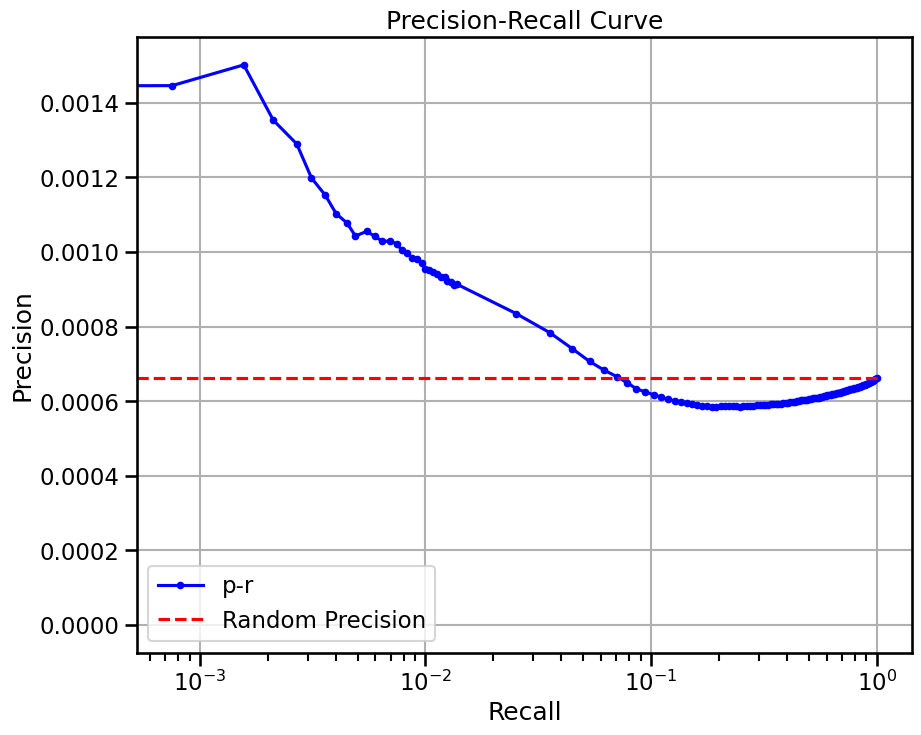

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:02<02:53,  2.75s/it]

  3%|▎         | 2/64 [00:04<02:04,  2.01s/it]

  5%|▍         | 3/64 [00:05<01:45,  1.73s/it]

  6%|▋         | 4/64 [00:07<01:38,  1.65s/it]

  8%|▊         | 5/64 [00:08<01:33,  1.59s/it]

  9%|▉         | 6/64 [00:10<01:27,  1.51s/it]

 11%|█         | 7/64 [00:11<01:26,  1.51s/it]

 12%|█▎        | 8/64 [00:13<01:24,  1.51s/it]

 14%|█▍        | 9/64 [00:14<01:20,  1.46s/it]

 16%|█▌        | 10/64 [00:15<01:19,  1.47s/it]

 17%|█▋        | 11/64 [00:17<01:17,  1.46s/it]

 19%|█▉        | 12/64 [00:18<01:14,  1.43s/it]

 20%|██        | 13/64 [00:20<01:13,  1.44s/it]

 22%|██▏       | 14/64 [00:21<01:13,  1.46s/it]

 23%|██▎       | 15/64 [00:22<01:09,  1.43s/it]

 25%|██▌       | 16/64 [00:24<01:10,  1.47s/it]

 27%|██▋       | 17/64 [00:26<01:15,  1.61s/it]

 28%|██▊       | 18/64 [00:28<01:23,  1.83s/it]

 30%|██▉       | 19/64 [00:30<01:19,  1.76s/it]

 31%|███▏      | 20/64 [00:31<01:13,  1.67s/it]

 33%|███▎      | 21/64 [00:33<01:08,  1.59s/it]

 34%|███▍      | 22/64 [00:34<01:05,  1.57s/it]

 36%|███▌      | 23/64 [00:36<01:03,  1.54s/it]

 38%|███▊      | 24/64 [00:37<01:00,  1.52s/it]

 39%|███▉      | 25/64 [00:39<00:59,  1.52s/it]

 41%|████      | 26/64 [00:40<00:58,  1.53s/it]

 42%|████▏     | 27/64 [00:42<00:56,  1.52s/it]

 44%|████▍     | 28/64 [00:43<00:55,  1.55s/it]

 45%|████▌     | 29/64 [00:45<00:53,  1.53s/it]

 47%|████▋     | 30/64 [00:46<00:51,  1.52s/it]

 48%|████▊     | 31/64 [00:48<00:50,  1.53s/it]

 50%|█████     | 32/64 [00:50<00:49,  1.54s/it]

 52%|█████▏    | 33/64 [00:51<00:48,  1.56s/it]

 53%|█████▎    | 34/64 [00:53<00:46,  1.55s/it]

 55%|█████▍    | 35/64 [00:54<00:44,  1.55s/it]

 56%|█████▋    | 36/64 [00:56<00:43,  1.55s/it]

 58%|█████▊    | 37/64 [00:57<00:42,  1.56s/it]

 59%|█████▉    | 38/64 [00:59<00:40,  1.56s/it]

 61%|██████    | 39/64 [01:00<00:38,  1.53s/it]

 62%|██████▎   | 40/64 [01:02<00:36,  1.52s/it]

 64%|██████▍   | 41/64 [01:03<00:35,  1.54s/it]

 66%|██████▌   | 42/64 [01:05<00:33,  1.54s/it]

 67%|██████▋   | 43/64 [01:06<00:31,  1.50s/it]

 69%|██████▉   | 44/64 [01:08<00:30,  1.53s/it]

 70%|███████   | 45/64 [01:10<00:29,  1.54s/it]

 72%|███████▏  | 46/64 [01:11<00:27,  1.51s/it]

 73%|███████▎  | 47/64 [01:12<00:25,  1.47s/it]

 75%|███████▌  | 48/64 [01:14<00:23,  1.48s/it]

 77%|███████▋  | 49/64 [01:15<00:22,  1.49s/it]

 78%|███████▊  | 50/64 [01:17<00:20,  1.47s/it]

 80%|███████▉  | 51/64 [01:18<00:19,  1.47s/it]

 81%|████████▏ | 52/64 [01:20<00:17,  1.47s/it]

 83%|████████▎ | 53/64 [01:21<00:15,  1.45s/it]

 84%|████████▍ | 54/64 [01:23<00:14,  1.46s/it]

 86%|████████▌ | 55/64 [01:24<00:13,  1.48s/it]

 88%|████████▊ | 56/64 [01:26<00:11,  1.48s/it]

 89%|████████▉ | 57/64 [01:27<00:10,  1.48s/it]

 91%|█████████ | 58/64 [01:29<00:08,  1.46s/it]

 92%|█████████▏| 59/64 [01:30<00:07,  1.46s/it]

 94%|█████████▍| 60/64 [01:32<00:05,  1.47s/it]

 95%|█████████▌| 61/64 [01:33<00:04,  1.47s/it]

 97%|█████████▋| 62/64 [01:34<00:02,  1.46s/it]

 98%|█████████▊| 63/64 [01:36<00:01,  1.46s/it]

100%|██████████| 64/64 [01:37<00:00,  1.47s/it]

100%|██████████| 64/64 [01:38<00:00,  1.53s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


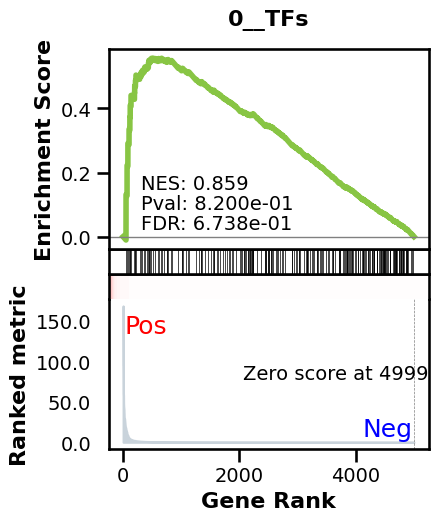

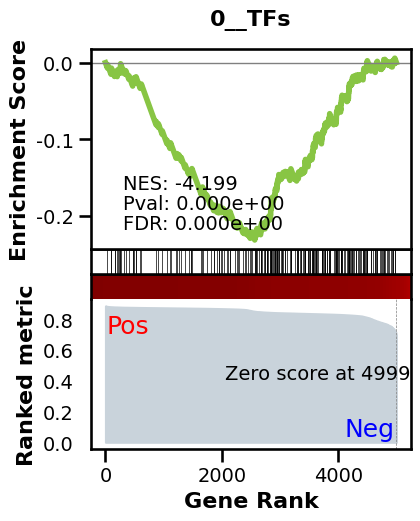

_________________________________________
TF specific enrichment


found some significant results for  62.5 % TFs

_________________________________________
loading GT,  omnipath


intersection of 1713 genes
intersection pct: 0.3426
precision:  0.0002208618126552002 
recall:  1.0 
random precision: 0.00022094140249759845


  0%|          | 0/128 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:00<00:01, 75.44it/s]

 12%|█▎        | 16/128 [00:00<00:01, 77.20it/s]

 19%|█▉        | 24/128 [00:00<00:01, 78.25it/s]

 25%|██▌       | 32/128 [00:00<00:01, 78.09it/s]

 31%|███▏      | 40/128 [00:00<00:01, 77.21it/s]

 38%|███▊      | 48/128 [00:00<00:01, 76.60it/s]

 44%|████▍     | 56/128 [00:00<00:00, 76.14it/s]

 50%|█████     | 64/128 [00:00<00:00, 76.45it/s]

 56%|█████▋    | 72/128 [00:00<00:00, 77.09it/s]

 62%|██████▎   | 80/128 [00:01<00:00, 77.28it/s]

 69%|██████▉   | 88/128 [00:01<00:00, 76.94it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 75.47it/s]

 81%|████████▏ | 104/128 [00:01<00:00, 74.39it/s]

 88%|████████▊ | 112/128 [00:01<00:00, 73.55it/s]

 94%|█████████▍| 120/128 [00:01<00:00, 74.54it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()


100%|██████████| 128/128 [00:01<00:00, 75.94it/s]

100%|██████████| 128/128 [00:01<00:00, 76.11it/s]

Average Precision (AP):  0.00034282500211048973
Area Under Precision-Recall Curve (AUPRC):  0.0003168957101930489
EPR: 13.36894391259976


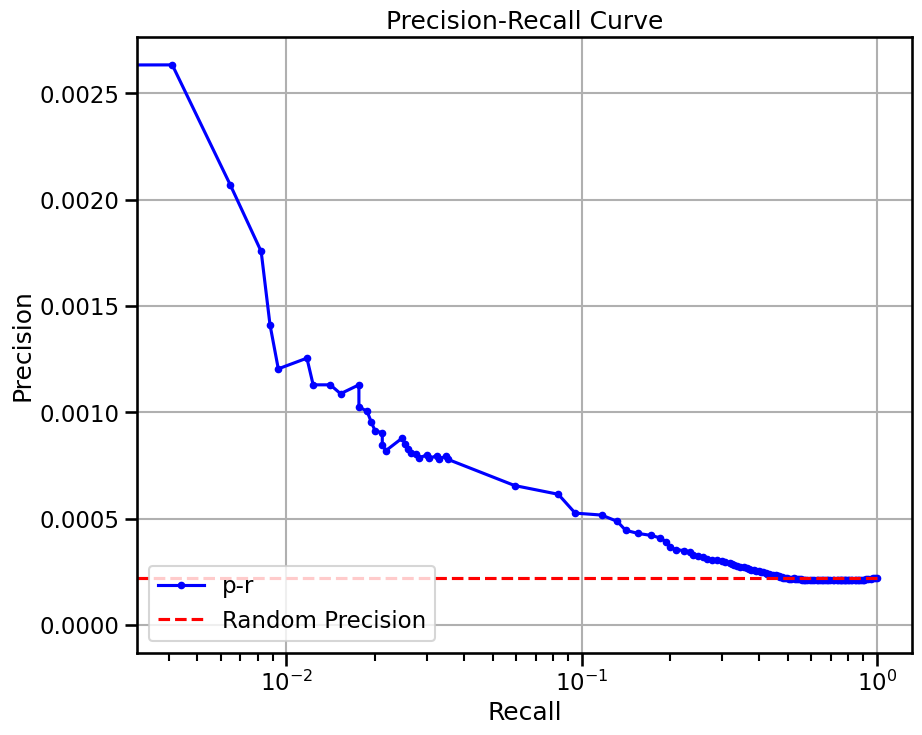

base enrichment


Top central genes: []


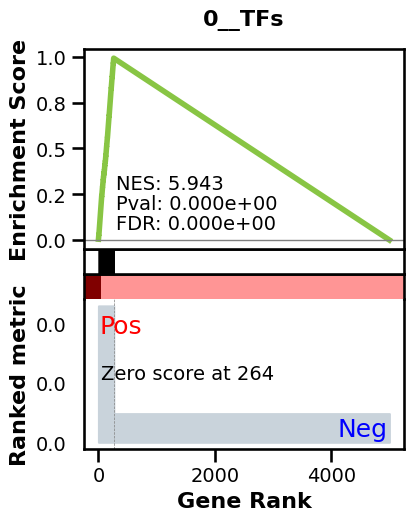

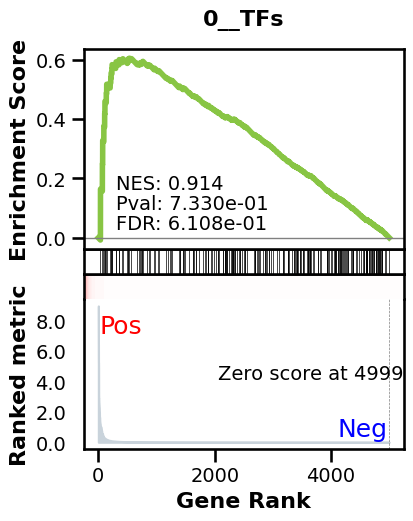

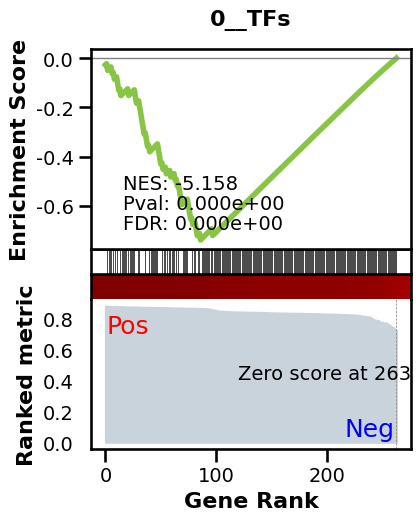

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 1713 genes
intersection pct: 0.3426
precision:  0.0011611002470152327 
recall:  0.42420681551116335 
random precision: 0.00022094140249759845


  0%|          | 0/128 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:00<00:01, 92.34it/s]

 16%|█▌        | 20/128 [00:00<00:01, 92.97it/s]

 23%|██▎       | 30/128 [00:00<00:01, 90.77it/s]

 31%|███▏      | 40/128 [00:00<00:00, 88.81it/s]

 38%|███▊      | 49/128 [00:00<00:00, 87.84it/s]

 45%|████▌     | 58/128 [00:00<00:00, 88.02it/s]

 52%|█████▏    | 67/128 [00:00<00:00, 86.90it/s]

 59%|█████▉    | 76/128 [00:00<00:00, 85.80it/s]

 66%|██████▋   | 85/128 [00:00<00:00, 85.30it/s]

 73%|███████▎  | 94/128 [00:01<00:00, 84.46it/s]

 80%|████████  | 103/128 [00:01<00:00, 84.49it/s]

 88%|████████▊ | 112/128 [00:01<00:00, 84.40it/s]

 95%|█████████▍| 121/128 [00:01<00:00, 84.23it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:01<00:00, 86.12it/s]

Average Precision (AP):  0.0008170870471756374
Area Under Precision-Recall Curve (AUPRC):  0.0007339673570527915
EPR: 10.68256009633727


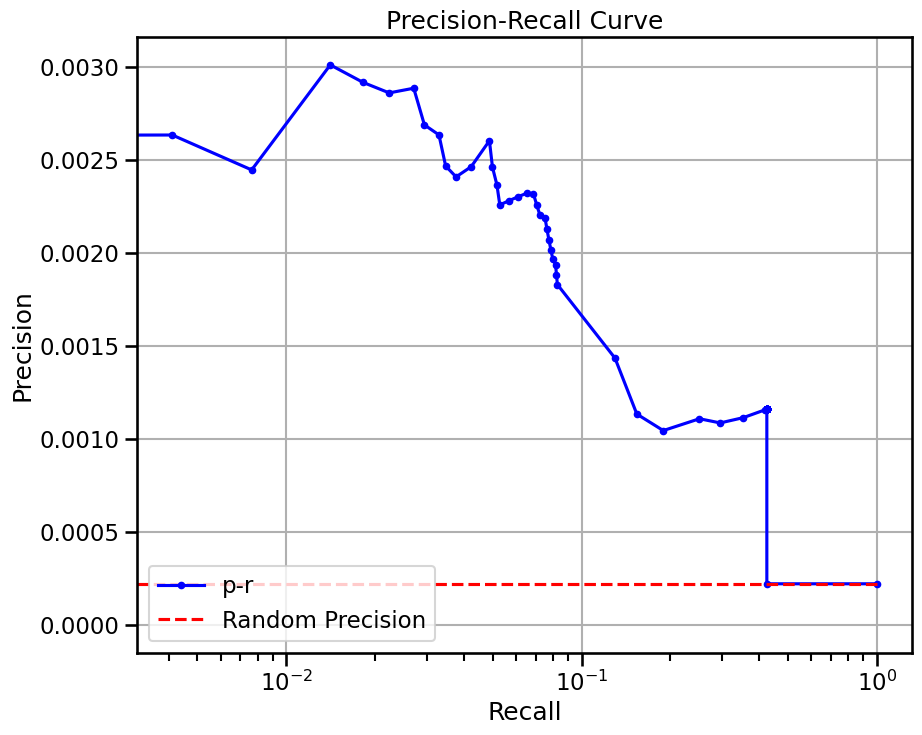

true elem 1702 ...


doing classification....


metrics {'used_heads': 13, 'precision': 0.0002316323495014227, 'random_precision': 0.0002316323495014227, 'recall': 1.0, 'predicted_true': 3082471.0, 'number_of_true': 714.0}


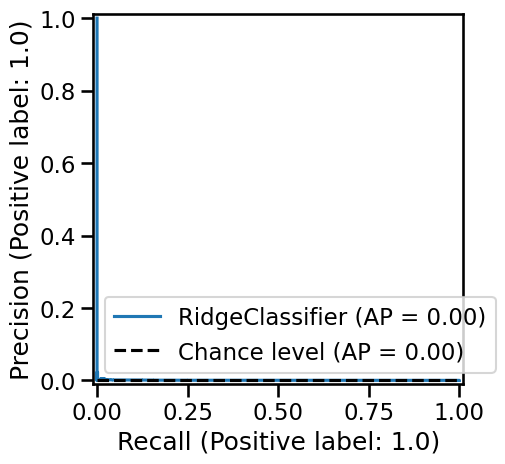

base enrichment


Top central genes: []
The DataFrame contains only the same values.


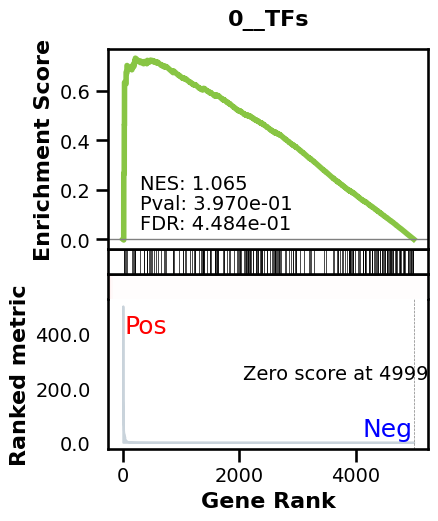

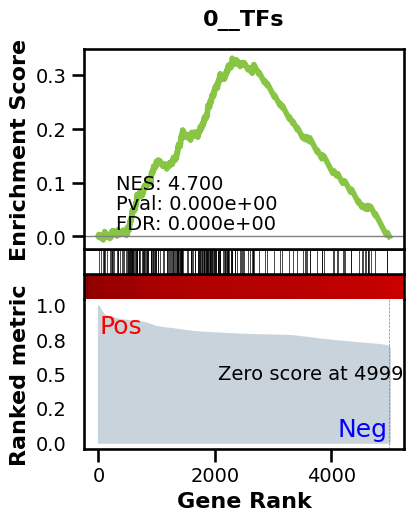

_________________________________________
TF specific enrichment


found some significant results for  25.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 1713 genes
intersection pct: 0.3426
precision:  0.0002208618126552002 
recall:  1.0 
random precision: 0.00022094140249759845


  0%|          | 0/128 [00:00<?, ?it/s]

  8%|▊         | 10/128 [00:00<00:01, 90.33it/s]

 16%|█▌        | 20/128 [00:00<00:01, 87.27it/s]

 23%|██▎       | 29/128 [00:00<00:01, 87.57it/s]

 30%|██▉       | 38/128 [00:00<00:01, 88.07it/s]

 38%|███▊      | 48/128 [00:00<00:00, 89.00it/s]

 45%|████▍     | 57/128 [00:00<00:00, 89.28it/s]

 52%|█████▏    | 67/128 [00:00<00:00, 90.03it/s]

 60%|██████    | 77/128 [00:00<00:00, 89.22it/s]

 67%|██████▋   | 86/128 [00:00<00:00, 88.17it/s]

 74%|███████▍  | 95/128 [00:01<00:00, 88.47it/s]

 81%|████████▏ | 104/128 [00:01<00:00, 88.49it/s]

 88%|████████▊ | 113/128 [00:01<00:00, 87.57it/s]

 95%|█████████▌| 122/128 [00:01<00:00, 87.61it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:01<00:00, 88.34it/s]

Average Precision (AP):  0.00045503059016143885
Area Under Precision-Recall Curve (AUPRC):  0.00040548260734102294
EPR: 13.36894391259976


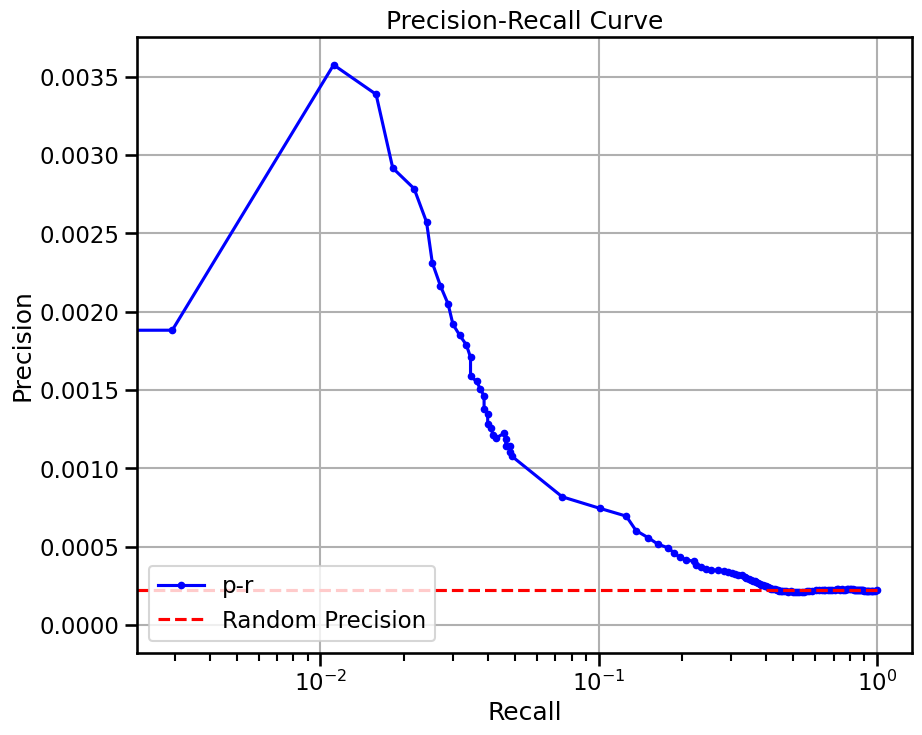

base enrichment


Top central genes: []


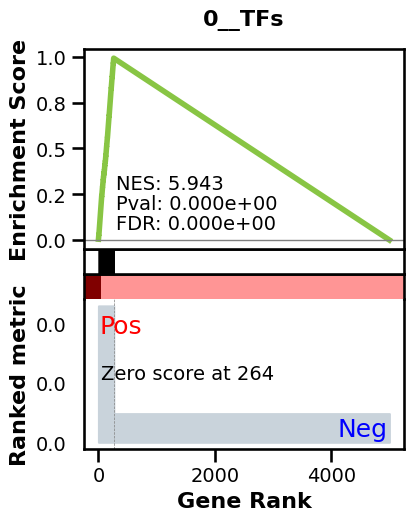

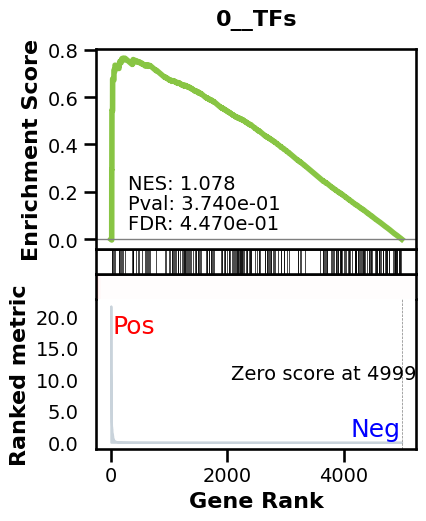

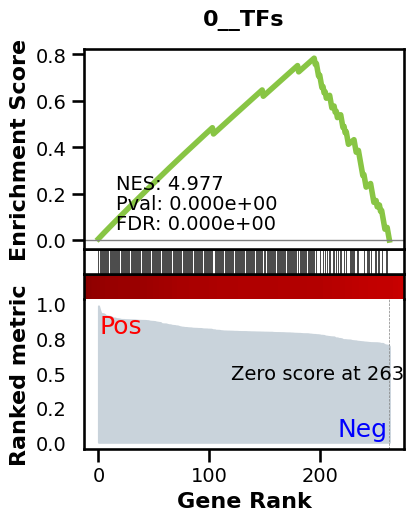

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 1713 genes
intersection pct: 0.3426
precision:  0.0011611002470152327 
recall:  0.42420681551116335 
random precision: 0.00022094140249759845


  0%|          | 0/128 [00:00<?, ?it/s]

  6%|▋         | 8/128 [00:00<00:01, 75.75it/s]

 12%|█▎        | 16/128 [00:00<00:01, 76.99it/s]

 19%|█▉        | 24/128 [00:00<00:01, 77.45it/s]

 25%|██▌       | 32/128 [00:00<00:01, 76.97it/s]

 31%|███▏      | 40/128 [00:00<00:01, 75.96it/s]

 38%|███▊      | 48/128 [00:00<00:01, 76.54it/s]

 44%|████▍     | 56/128 [00:00<00:00, 77.50it/s]

 50%|█████     | 64/128 [00:00<00:00, 78.21it/s]

 56%|█████▋    | 72/128 [00:00<00:00, 78.66it/s]

 62%|██████▎   | 80/128 [00:01<00:00, 78.59it/s]

 70%|██████▉   | 89/128 [00:01<00:00, 79.27it/s]

 77%|███████▋  | 98/128 [00:01<00:00, 80.26it/s]

 84%|████████▎ | 107/128 [00:01<00:00, 80.55it/s]

 91%|█████████ | 116/128 [00:01<00:00, 80.04it/s]

 98%|█████████▊| 125/128 [00:01<00:00, 78.95it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:01<00:00, 78.26it/s]

Average Precision (AP):  0.000939769770791941
Area Under Precision-Recall Curve (AUPRC):  0.0008369297677678327
EPR: 29.62078677913929


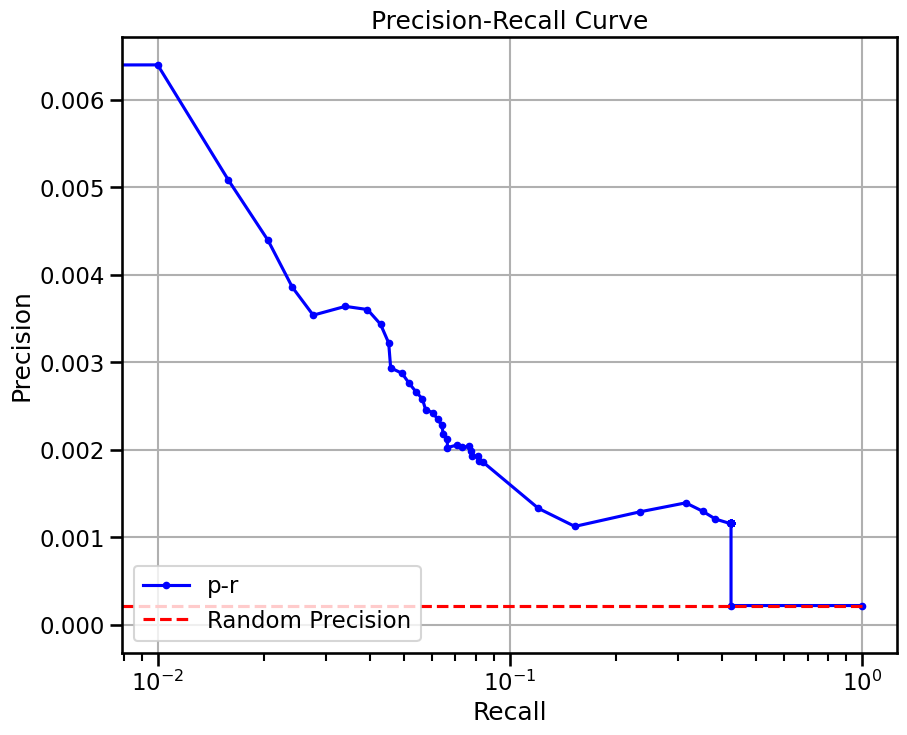

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:02<01:11,  2.31s/it]

  6%|▋         | 2/32 [00:03<00:48,  1.63s/it]

  9%|▉         | 3/32 [00:04<00:38,  1.34s/it]

 12%|█▎        | 4/32 [00:05<00:34,  1.22s/it]

 16%|█▌        | 5/32 [00:06<00:31,  1.17s/it]

 19%|█▉        | 6/32 [00:07<00:28,  1.09s/it]

 22%|██▏       | 7/32 [00:08<00:26,  1.06s/it]

 25%|██▌       | 8/32 [00:09<00:25,  1.05s/it]

 28%|██▊       | 9/32 [00:10<00:23,  1.04s/it]

 31%|███▏      | 10/32 [00:11<00:24,  1.13s/it]

 34%|███▍      | 11/32 [00:12<00:22,  1.07s/it]

 38%|███▊      | 12/32 [00:13<00:20,  1.03s/it]

 41%|████      | 13/32 [00:14<00:18,  1.01it/s]

 44%|████▍     | 14/32 [00:15<00:17,  1.02it/s]

 47%|████▋     | 15/32 [00:16<00:16,  1.06it/s]

 50%|█████     | 16/32 [00:17<00:14,  1.09it/s]

 53%|█████▎    | 17/32 [00:18<00:13,  1.12it/s]

 56%|█████▋    | 18/32 [00:19<00:12,  1.13it/s]

 59%|█████▉    | 19/32 [00:19<00:11,  1.14it/s]

 62%|██████▎   | 20/32 [00:20<00:10,  1.15it/s]

 66%|██████▌   | 21/32 [00:21<00:09,  1.15it/s]

 69%|██████▉   | 22/32 [00:22<00:08,  1.11it/s]

 72%|███████▏  | 23/32 [00:23<00:07,  1.13it/s]

 75%|███████▌  | 24/32 [00:24<00:07,  1.03it/s]

 78%|███████▊  | 25/32 [00:25<00:06,  1.01it/s]

 81%|████████▏ | 26/32 [00:26<00:05,  1.00it/s]

 84%|████████▍ | 27/32 [00:27<00:05,  1.03s/it]

 88%|████████▊ | 28/32 [00:28<00:04,  1.03s/it]

 91%|█████████ | 29/32 [00:30<00:03,  1.23s/it]

 94%|█████████▍| 30/32 [00:31<00:02,  1.17s/it]

 97%|█████████▋| 31/32 [00:32<00:01,  1.13s/it]

100%|██████████| 32/32 [00:33<00:00,  1.11s/it]

100%|██████████| 32/32 [00:33<00:00,  1.06s/it]

avg link count: 535922500, sparsity: 1.0


base enrichment


too many genes for central computation


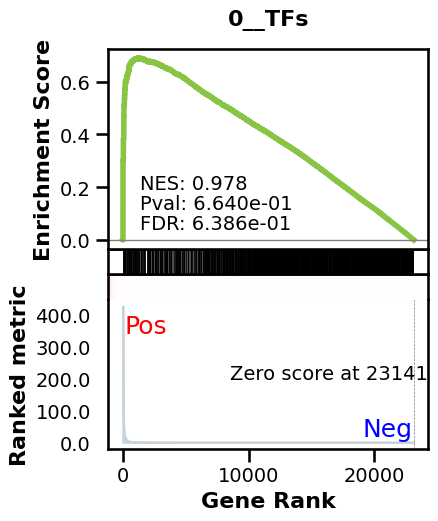

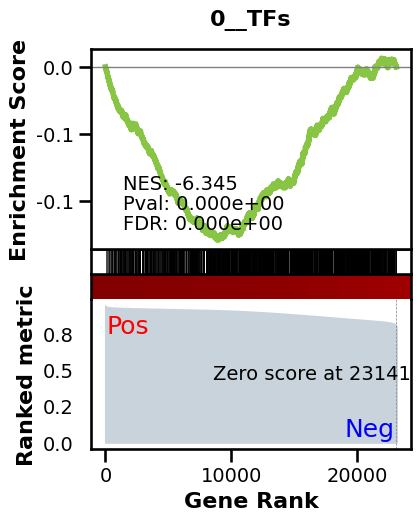

_________________________________________
TF specific enrichment


found some significant results for  38.392857142857146 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12461 genes
intersection pct: 0.5384582145017717


precision:  0.0006617607244225825 
recall:  1.0 
random precision: 0.0006618065590758878


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:44,  2.84it/s]

  2%|▏         | 2/128 [00:00<00:46,  2.70it/s]

  2%|▏         | 3/128 [00:01<00:45,  2.76it/s]

  3%|▎         | 4/128 [00:01<00:43,  2.83it/s]

  4%|▍         | 5/128 [00:01<00:43,  2.82it/s]

  5%|▍         | 6/128 [00:02<00:42,  2.85it/s]

  5%|▌         | 7/128 [00:02<00:42,  2.83it/s]

  6%|▋         | 8/128 [00:02<00:43,  2.77it/s]

  7%|▋         | 9/128 [00:03<00:42,  2.80it/s]

  8%|▊         | 10/128 [00:03<00:41,  2.84it/s]

  9%|▊         | 11/128 [00:03<00:41,  2.82it/s]

  9%|▉         | 12/128 [00:04<00:41,  2.81it/s]

 10%|█         | 13/128 [00:04<00:40,  2.82it/s]

 11%|█         | 14/128 [00:04<00:40,  2.80it/s]

 12%|█▏        | 15/128 [00:05<00:39,  2.86it/s]

 12%|█▎        | 16/128 [00:05<00:39,  2.86it/s]

 13%|█▎        | 17/128 [00:06<00:39,  2.82it/s]

 14%|█▍        | 18/128 [00:06<00:39,  2.78it/s]

 15%|█▍        | 19/128 [00:06<00:38,  2.80it/s]

 16%|█▌        | 20/128 [00:07<00:37,  2.86it/s]

 16%|█▋        | 21/128 [00:07<00:37,  2.86it/s]

 17%|█▋        | 22/128 [00:07<00:37,  2.84it/s]

 18%|█▊        | 23/128 [00:08<00:37,  2.82it/s]

 19%|█▉        | 24/128 [00:08<00:37,  2.76it/s]

 20%|█▉        | 25/128 [00:08<00:37,  2.78it/s]

 20%|██        | 26/128 [00:09<00:36,  2.80it/s]

 21%|██        | 27/128 [00:09<00:36,  2.79it/s]

 22%|██▏       | 28/128 [00:09<00:36,  2.77it/s]

 23%|██▎       | 29/128 [00:10<00:35,  2.77it/s]

 23%|██▎       | 30/128 [00:10<00:36,  2.72it/s]

 24%|██▍       | 31/128 [00:11<00:35,  2.75it/s]

 25%|██▌       | 32/128 [00:11<00:34,  2.79it/s]

 26%|██▌       | 33/128 [00:11<00:33,  2.81it/s]

 27%|██▋       | 34/128 [00:12<00:33,  2.80it/s]

 27%|██▋       | 35/128 [00:12<00:33,  2.74it/s]

 28%|██▊       | 36/128 [00:12<00:33,  2.76it/s]

 29%|██▉       | 37/128 [00:13<00:32,  2.80it/s]

 30%|██▉       | 38/128 [00:13<00:32,  2.80it/s]

 30%|███       | 39/128 [00:13<00:31,  2.79it/s]

 31%|███▏      | 40/128 [00:14<00:31,  2.81it/s]

 32%|███▏      | 41/128 [00:14<00:31,  2.79it/s]

 33%|███▎      | 42/128 [00:15<00:31,  2.77it/s]

 34%|███▎      | 43/128 [00:15<00:30,  2.81it/s]

 34%|███▍      | 44/128 [00:15<00:29,  2.81it/s]

 35%|███▌      | 45/128 [00:16<00:29,  2.82it/s]

 36%|███▌      | 46/128 [00:16<00:29,  2.81it/s]

 37%|███▋      | 47/128 [00:16<00:29,  2.76it/s]

 38%|███▊      | 48/128 [00:17<00:28,  2.79it/s]

 38%|███▊      | 49/128 [00:17<00:28,  2.80it/s]

 39%|███▉      | 50/128 [00:17<00:27,  2.82it/s]

 40%|███▉      | 51/128 [00:18<00:27,  2.75it/s]

 41%|████      | 52/128 [00:18<00:27,  2.77it/s]

 41%|████▏     | 53/128 [00:18<00:26,  2.81it/s]

 42%|████▏     | 54/128 [00:19<00:26,  2.78it/s]

 43%|████▎     | 55/128 [00:19<00:26,  2.79it/s]

 44%|████▍     | 56/128 [00:20<00:25,  2.80it/s]

 45%|████▍     | 57/128 [00:20<00:25,  2.76it/s]

 45%|████▌     | 58/128 [00:20<00:25,  2.77it/s]

 46%|████▌     | 59/128 [00:21<00:24,  2.79it/s]

 47%|████▋     | 60/128 [00:21<00:24,  2.79it/s]

 48%|████▊     | 61/128 [00:21<00:23,  2.84it/s]

 48%|████▊     | 62/128 [00:22<00:23,  2.81it/s]

 49%|████▉     | 63/128 [00:22<00:23,  2.79it/s]

 50%|█████     | 64/128 [00:22<00:22,  2.80it/s]

 51%|█████     | 65/128 [00:23<00:22,  2.77it/s]

 52%|█████▏    | 66/128 [00:23<00:21,  2.84it/s]

 52%|█████▏    | 67/128 [00:23<00:21,  2.85it/s]

 53%|█████▎    | 68/128 [00:24<00:21,  2.79it/s]

 54%|█████▍    | 69/128 [00:24<00:21,  2.77it/s]

 55%|█████▍    | 70/128 [00:25<00:21,  2.75it/s]

 55%|█████▌    | 71/128 [00:25<00:20,  2.79it/s]

 56%|█████▋    | 72/128 [00:25<00:19,  2.80it/s]

 57%|█████▋    | 73/128 [00:26<00:20,  2.74it/s]

 58%|█████▊    | 74/128 [00:26<00:19,  2.75it/s]

 59%|█████▊    | 75/128 [00:26<00:19,  2.72it/s]

 59%|█████▉    | 76/128 [00:27<00:18,  2.76it/s]

 60%|██████    | 77/128 [00:27<00:18,  2.81it/s]

 61%|██████    | 78/128 [00:27<00:18,  2.75it/s]

 62%|██████▏   | 79/128 [00:28<00:18,  2.69it/s]

 62%|██████▎   | 80/128 [00:28<00:17,  2.74it/s]

 63%|██████▎   | 81/128 [00:29<00:16,  2.79it/s]

 64%|██████▍   | 82/128 [00:29<00:16,  2.83it/s]

 65%|██████▍   | 83/128 [00:29<00:16,  2.80it/s]

 66%|██████▌   | 84/128 [00:30<00:16,  2.74it/s]

 66%|██████▋   | 85/128 [00:30<00:15,  2.77it/s]

 67%|██████▋   | 86/128 [00:30<00:14,  2.81it/s]

 68%|██████▊   | 87/128 [00:31<00:14,  2.85it/s]

 69%|██████▉   | 88/128 [00:31<00:14,  2.80it/s]

 70%|██████▉   | 89/128 [00:31<00:14,  2.76it/s]

 70%|███████   | 90/128 [00:32<00:13,  2.77it/s]

 71%|███████   | 91/128 [00:32<00:13,  2.83it/s]

 72%|███████▏  | 92/128 [00:32<00:12,  2.85it/s]

 73%|███████▎  | 93/128 [00:33<00:12,  2.84it/s]

 73%|███████▎  | 94/128 [00:33<00:12,  2.80it/s]

 74%|███████▍  | 95/128 [00:34<00:11,  2.76it/s]

 75%|███████▌  | 96/128 [00:34<00:11,  2.78it/s]

 76%|███████▌  | 97/128 [00:34<00:11,  2.82it/s]

 77%|███████▋  | 98/128 [00:35<00:10,  2.84it/s]

 77%|███████▋  | 99/128 [00:35<00:10,  2.82it/s]

 78%|███████▊  | 100/128 [00:35<00:10,  2.77it/s]

 79%|███████▉  | 101/128 [00:36<00:09,  2.75it/s]

 80%|███████▉  | 102/128 [00:36<00:09,  2.78it/s]

 80%|████████  | 103/128 [00:36<00:08,  2.86it/s]

 81%|████████▏ | 104/128 [00:37<00:08,  2.86it/s]

 82%|████████▏ | 105/128 [00:37<00:08,  2.81it/s]

 83%|████████▎ | 106/128 [00:37<00:08,  2.73it/s]

 84%|████████▎ | 107/128 [00:38<00:07,  2.75it/s]

 84%|████████▍ | 108/128 [00:38<00:07,  2.82it/s]

 85%|████████▌ | 109/128 [00:39<00:06,  2.81it/s]

 86%|████████▌ | 110/128 [00:39<00:06,  2.78it/s]

 87%|████████▋ | 111/128 [00:39<00:06,  2.75it/s]

 88%|████████▊ | 112/128 [00:40<00:05,  2.74it/s]

 88%|████████▊ | 113/128 [00:40<00:05,  2.80it/s]

 89%|████████▉ | 114/128 [00:40<00:04,  2.83it/s]

 90%|████████▉ | 115/128 [00:41<00:04,  2.81it/s]

 91%|█████████ | 116/128 [00:41<00:04,  2.79it/s]

 91%|█████████▏| 117/128 [00:41<00:03,  2.76it/s]

 92%|█████████▏| 118/128 [00:42<00:03,  2.74it/s]

 93%|█████████▎| 119/128 [00:42<00:03,  2.77it/s]

 94%|█████████▍| 120/128 [00:42<00:02,  2.82it/s]

 95%|█████████▍| 121/128 [00:43<00:02,  2.78it/s]

 95%|█████████▌| 122/128 [00:43<00:02,  2.77it/s]

 96%|█████████▌| 123/128 [00:44<00:01,  2.74it/s]

 97%|█████████▋| 124/128 [00:44<00:01,  2.76it/s]

 98%|█████████▊| 125/128 [00:44<00:01,  2.80it/s]

 98%|█████████▊| 126/128 [00:45<00:00,  2.83it/s]

 99%|█████████▉| 127/128 [00:45<00:00,  2.83it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:45<00:00,  2.78it/s]

100%|██████████| 128/128 [00:45<00:00,  2.79it/s]

Average Precision (AP):  0.0006513994534961042
Area Under Precision-Recall Curve (AUPRC):  0.000651038651699786


EPR: 2.226865097169227


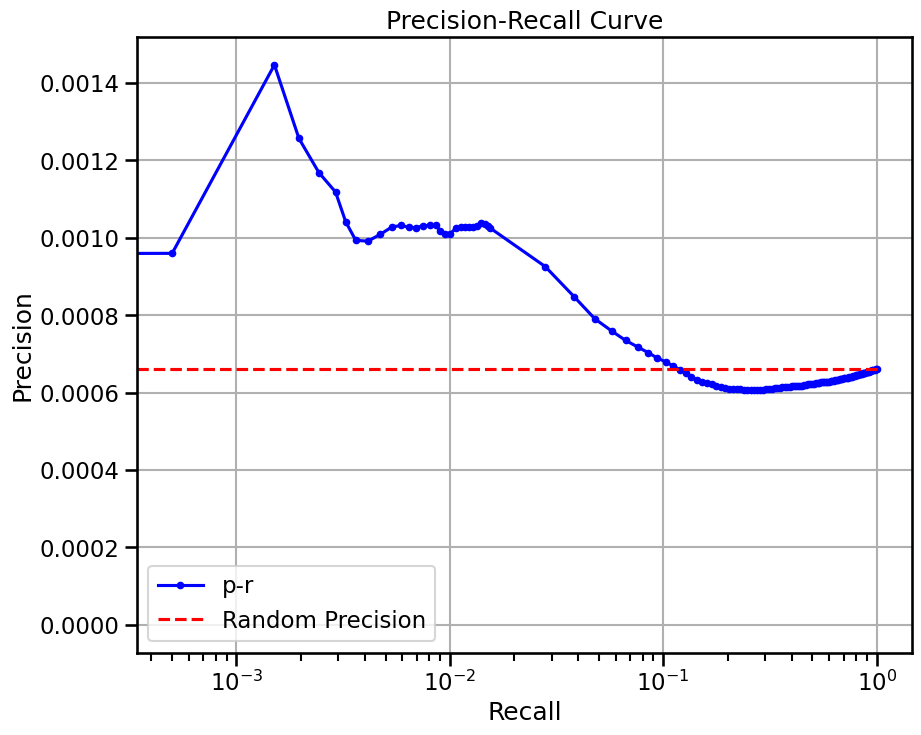

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:02<03:07,  2.97s/it]

  3%|▎         | 2/64 [00:04<02:09,  2.10s/it]

  5%|▍         | 3/64 [00:05<01:50,  1.81s/it]

  6%|▋         | 4/64 [00:07<01:40,  1.68s/it]

  8%|▊         | 5/64 [00:08<01:35,  1.61s/it]

  9%|▉         | 6/64 [00:10<01:31,  1.58s/it]

 11%|█         | 7/64 [00:11<01:27,  1.54s/it]

 12%|█▎        | 8/64 [00:13<01:25,  1.53s/it]

 14%|█▍        | 9/64 [00:15<01:30,  1.64s/it]

 16%|█▌        | 10/64 [00:16<01:24,  1.57s/it]

 17%|█▋        | 11/64 [00:18<01:20,  1.52s/it]

 19%|█▉        | 12/64 [00:19<01:17,  1.49s/it]

 20%|██        | 13/64 [00:20<01:15,  1.48s/it]

 22%|██▏       | 14/64 [00:22<01:12,  1.46s/it]

 23%|██▎       | 15/64 [00:23<01:09,  1.42s/it]

 25%|██▌       | 16/64 [00:25<01:08,  1.42s/it]

 27%|██▋       | 17/64 [00:26<01:06,  1.42s/it]

 28%|██▊       | 18/64 [00:27<01:04,  1.40s/it]

 30%|██▉       | 19/64 [00:29<01:01,  1.37s/it]

 31%|███▏      | 20/64 [00:30<00:59,  1.35s/it]

 33%|███▎      | 21/64 [00:31<00:57,  1.35s/it]

 34%|███▍      | 22/64 [00:33<00:56,  1.34s/it]

 36%|███▌      | 23/64 [00:34<00:54,  1.33s/it]

 38%|███▊      | 24/64 [00:35<00:53,  1.33s/it]

 39%|███▉      | 25/64 [00:37<00:51,  1.33s/it]

 41%|████      | 26/64 [00:38<00:49,  1.31s/it]

 42%|████▏     | 27/64 [00:39<00:48,  1.30s/it]

 44%|████▍     | 28/64 [00:41<00:47,  1.31s/it]

 45%|████▌     | 29/64 [00:42<00:45,  1.29s/it]

 47%|████▋     | 30/64 [00:43<00:43,  1.28s/it]

 48%|████▊     | 31/64 [00:44<00:42,  1.29s/it]

 50%|█████     | 32/64 [00:46<00:40,  1.27s/it]

 52%|█████▏    | 33/64 [00:47<00:39,  1.28s/it]

 53%|█████▎    | 34/64 [00:48<00:38,  1.28s/it]

 55%|█████▍    | 35/64 [00:49<00:36,  1.26s/it]

 56%|█████▋    | 36/64 [00:51<00:35,  1.26s/it]

 58%|█████▊    | 37/64 [00:52<00:35,  1.30s/it]

 59%|█████▉    | 38/64 [00:53<00:33,  1.29s/it]

 61%|██████    | 39/64 [00:55<00:33,  1.32s/it]

 62%|██████▎   | 40/64 [00:56<00:32,  1.34s/it]

 64%|██████▍   | 41/64 [00:57<00:30,  1.33s/it]

 66%|██████▌   | 42/64 [00:59<00:29,  1.35s/it]

 67%|██████▋   | 43/64 [01:00<00:28,  1.36s/it]

 69%|██████▉   | 44/64 [01:02<00:27,  1.36s/it]

 70%|███████   | 45/64 [01:03<00:26,  1.37s/it]

 72%|███████▏  | 46/64 [01:04<00:24,  1.36s/it]

 73%|███████▎  | 47/64 [01:06<00:23,  1.37s/it]

 75%|███████▌  | 48/64 [01:07<00:22,  1.38s/it]

 77%|███████▋  | 49/64 [01:08<00:20,  1.37s/it]

 78%|███████▊  | 50/64 [01:10<00:19,  1.39s/it]

 80%|███████▉  | 51/64 [01:11<00:18,  1.39s/it]

 81%|████████▏ | 52/64 [01:13<00:16,  1.38s/it]

 83%|████████▎ | 53/64 [01:14<00:15,  1.39s/it]

 84%|████████▍ | 54/64 [01:15<00:13,  1.39s/it]

 86%|████████▌ | 55/64 [01:17<00:12,  1.38s/it]

 88%|████████▊ | 56/64 [01:18<00:11,  1.38s/it]

 89%|████████▉ | 57/64 [01:20<00:09,  1.39s/it]

 91%|█████████ | 58/64 [01:21<00:08,  1.39s/it]

 92%|█████████▏| 59/64 [01:22<00:06,  1.38s/it]

 94%|█████████▍| 60/64 [01:24<00:05,  1.39s/it]

 95%|█████████▌| 61/64 [01:25<00:04,  1.39s/it]

 97%|█████████▋| 62/64 [01:26<00:02,  1.38s/it]

 98%|█████████▊| 63/64 [01:28<00:01,  1.39s/it]

100%|██████████| 64/64 [01:29<00:00,  1.39s/it]

100%|██████████| 64/64 [01:30<00:00,  1.41s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


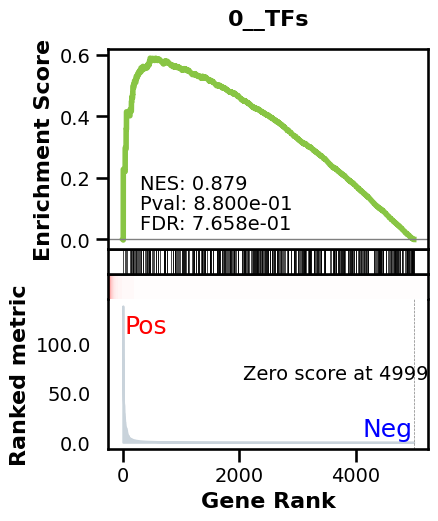

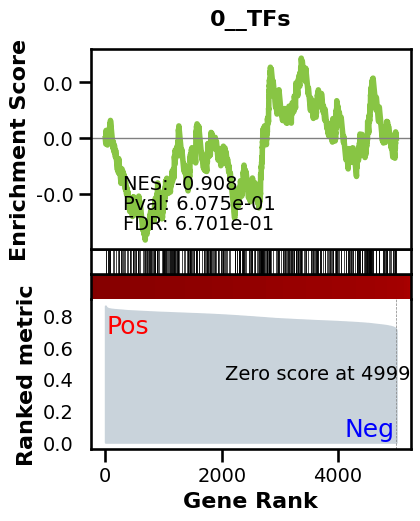

_________________________________________
TF specific enrichment


found some significant results for  24.137931034482758 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.0013761972249491062 
recall:  1.0 
random precision: 0.001376576029580251


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 45.06it/s]

  8%|▊         | 10/128 [00:00<00:02, 45.82it/s]

 12%|█▏        | 15/128 [00:00<00:02, 45.60it/s]

 16%|█▌        | 20/128 [00:00<00:02, 45.24it/s]

 20%|█▉        | 25/128 [00:00<00:02, 45.41it/s]

 23%|██▎       | 30/128 [00:00<00:02, 44.98it/s]

 27%|██▋       | 35/128 [00:00<00:02, 44.64it/s]

 31%|███▏      | 40/128 [00:00<00:01, 44.43it/s]

 35%|███▌      | 45/128 [00:01<00:01, 44.63it/s]

 39%|███▉      | 50/128 [00:01<00:01, 44.86it/s]

 43%|████▎     | 55/128 [00:01<00:01, 44.30it/s]

 47%|████▋     | 60/128 [00:01<00:01, 44.34it/s]

 51%|█████     | 65/128 [00:01<00:01, 43.94it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 43.24it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 42.73it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 42.57it/s]

 66%|██████▋   | 85/128 [00:01<00:01, 42.93it/s]

 70%|███████   | 90/128 [00:02<00:00, 43.09it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 43.48it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 44.05it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 44.42it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 44.57it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 45.48it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 45.97it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 45.86it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 44.50it/s]

Average Precision (AP):  0.0015209058641984334
Area Under Precision-Recall Curve (AUPRC):  0.0015191470179963347
EPR: 2.7714516192137966


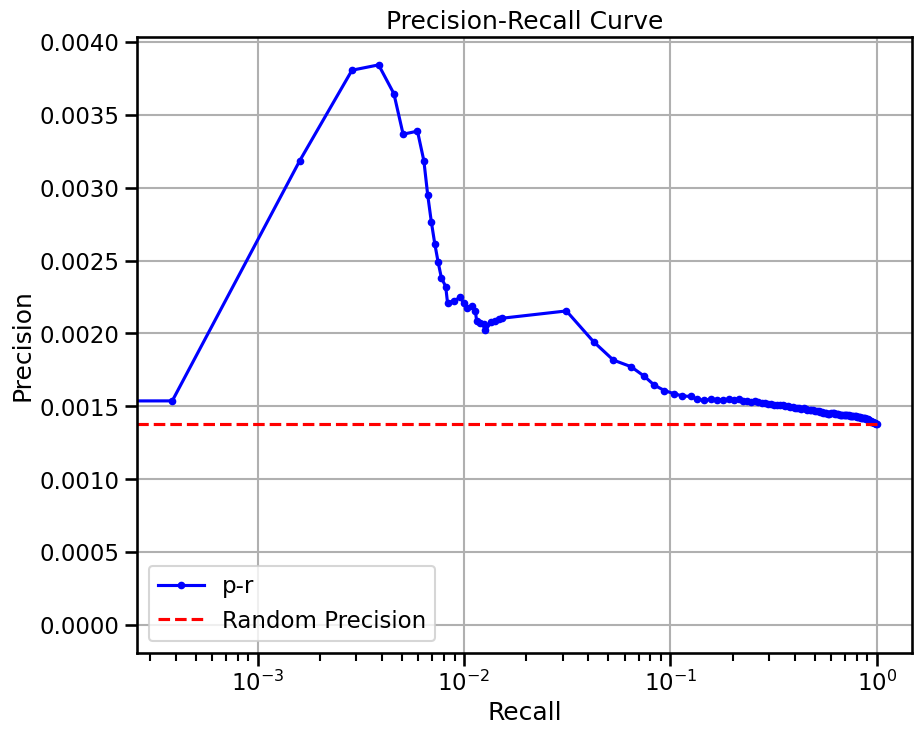

base enrichment


Top central genes: []


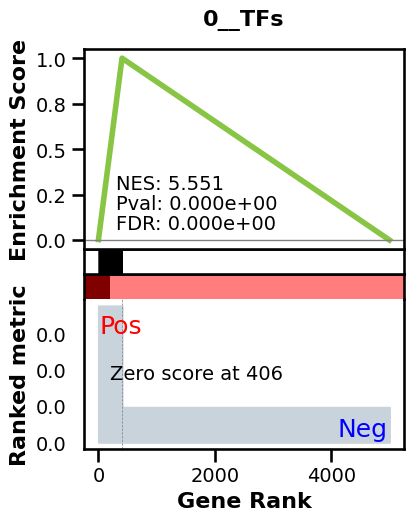

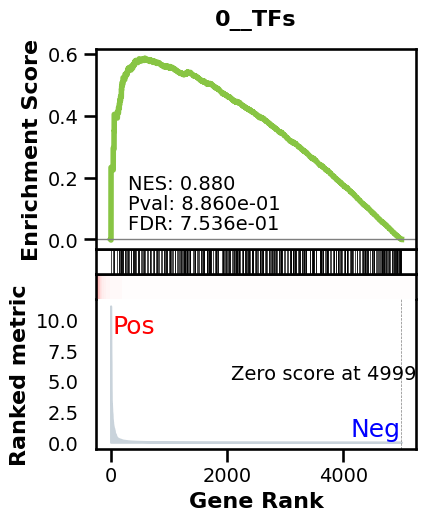

_________________________________________
TF specific enrichment


found some significant results for  5.172413793103448 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.006061686575147085 
recall:  0.4302850225597007 
random precision: 0.001376576029580251


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 43.33it/s]

  8%|▊         | 10/128 [00:00<00:02, 39.95it/s]

 12%|█▏        | 15/128 [00:00<00:02, 41.07it/s]

 16%|█▌        | 20/128 [00:00<00:02, 41.22it/s]

 20%|█▉        | 25/128 [00:00<00:02, 41.76it/s]

 23%|██▎       | 30/128 [00:00<00:02, 42.58it/s]

 27%|██▋       | 35/128 [00:00<00:02, 43.94it/s]

 31%|███▏      | 40/128 [00:00<00:01, 45.32it/s]

 35%|███▌      | 45/128 [00:01<00:01, 46.35it/s]

 39%|███▉      | 50/128 [00:01<00:01, 46.91it/s]

 43%|████▎     | 55/128 [00:01<00:01, 47.58it/s]

 47%|████▋     | 60/128 [00:01<00:01, 47.64it/s]

 51%|█████     | 65/128 [00:01<00:01, 46.39it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 45.91it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 45.47it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 44.78it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 44.22it/s]

 70%|███████   | 90/128 [00:02<00:00, 43.81it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 43.49it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 43.05it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 43.10it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 43.98it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 44.68it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 45.44it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 46.41it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 44.73it/s]

Average Precision (AP):  0.00424849774022638
Area Under Precision-Recall Curve (AUPRC):  0.0037502387208021033
EPR: 9.027728609738205


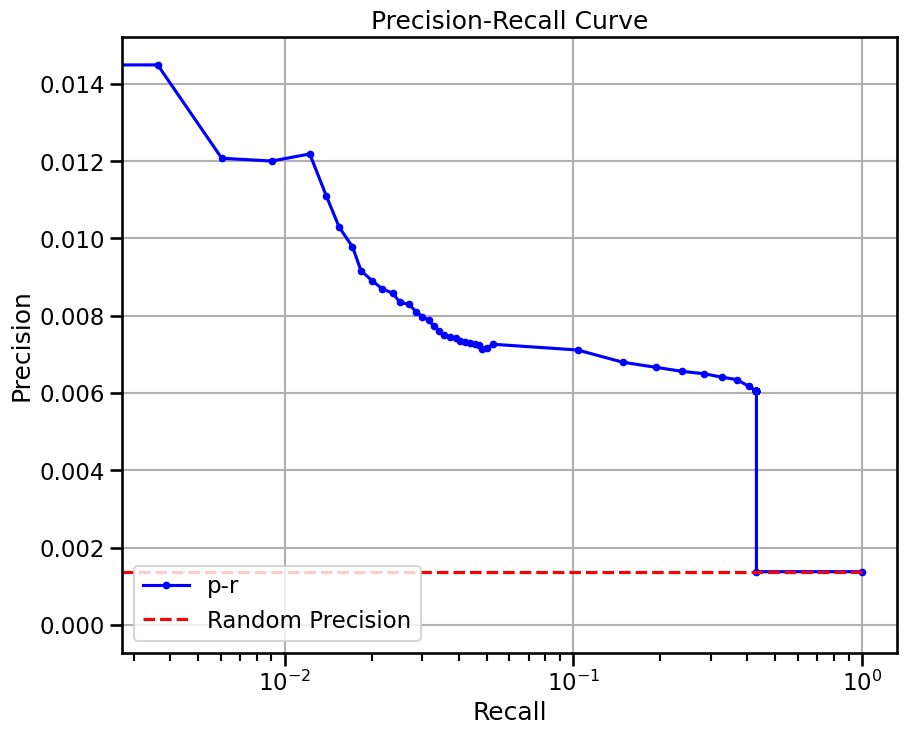

base enrichment


Top central genes: []
The DataFrame contains only the same values.


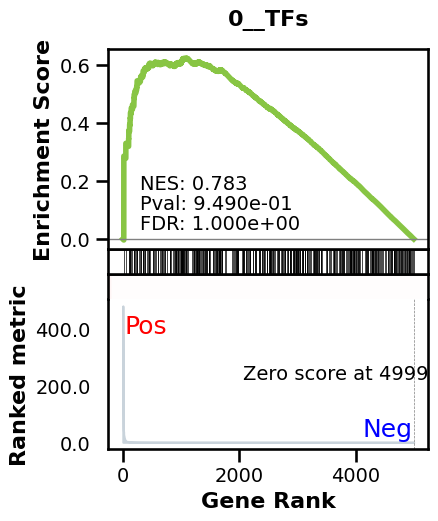

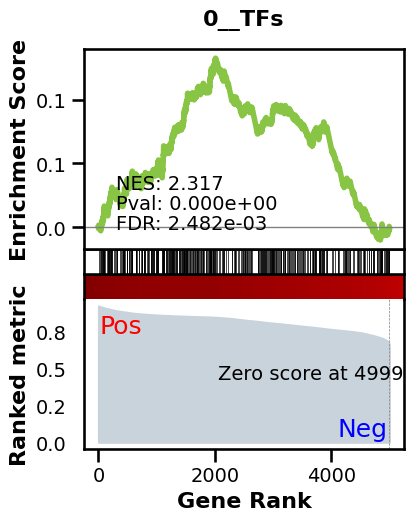

_________________________________________
TF specific enrichment


found some significant results for  8.620689655172415 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.0013761972249491062 
recall:  1.0 
random precision: 0.001376576029580251


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 48.27it/s]

  8%|▊         | 10/128 [00:00<00:02, 48.65it/s]

 12%|█▏        | 15/128 [00:00<00:02, 48.21it/s]

 16%|█▌        | 20/128 [00:00<00:02, 47.73it/s]

 20%|█▉        | 25/128 [00:00<00:02, 46.87it/s]

 23%|██▎       | 30/128 [00:00<00:02, 47.18it/s]

 27%|██▋       | 35/128 [00:00<00:01, 47.22it/s]

 31%|███▏      | 40/128 [00:00<00:01, 46.87it/s]

 35%|███▌      | 45/128 [00:00<00:01, 46.37it/s]

 39%|███▉      | 50/128 [00:01<00:01, 46.85it/s]

 43%|████▎     | 55/128 [00:01<00:01, 47.10it/s]

 47%|████▋     | 60/128 [00:01<00:01, 47.50it/s]

 51%|█████     | 65/128 [00:01<00:01, 47.90it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 48.26it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 48.45it/s]

 62%|██████▎   | 80/128 [00:01<00:00, 48.16it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 48.09it/s]

 70%|███████   | 90/128 [00:01<00:00, 47.70it/s]

 74%|███████▍  | 95/128 [00:01<00:00, 47.54it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 47.76it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 47.90it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 47.33it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 46.88it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 46.81it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 46.75it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 47.38it/s]

Average Precision (AP):  0.0013027556911273707
Area Under Precision-Recall Curve (AUPRC):  0.00129675816153659
EPR: 2.2864260542385515


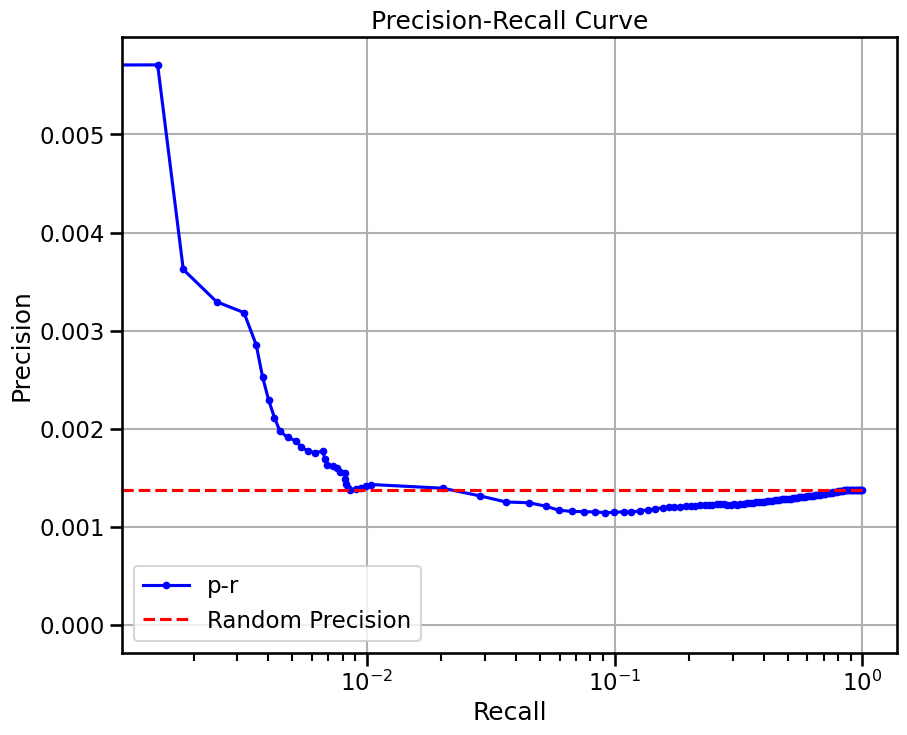

base enrichment


Top central genes: []


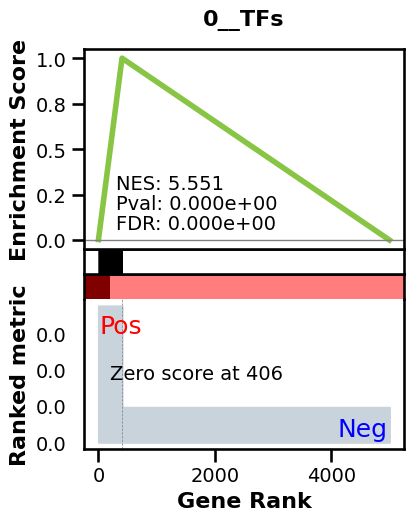

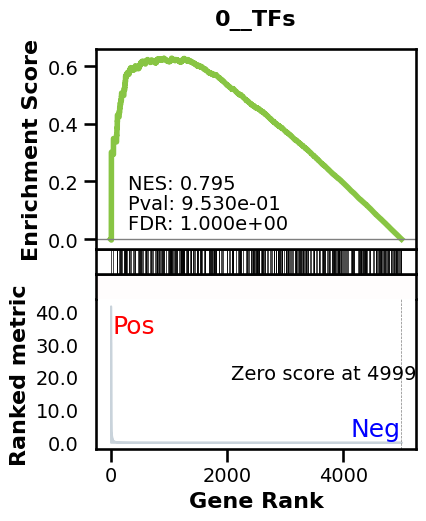

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3634 genes
intersection pct: 0.7268
precision:  0.006061686575147085 
recall:  0.4302850225597007 
random precision: 0.001376576029580251


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 44.19it/s]

  8%|▊         | 10/128 [00:00<00:02, 44.78it/s]

 12%|█▏        | 15/128 [00:00<00:02, 45.44it/s]

 16%|█▌        | 20/128 [00:00<00:02, 45.10it/s]

 20%|█▉        | 25/128 [00:00<00:02, 44.83it/s]

 23%|██▎       | 30/128 [00:00<00:02, 45.00it/s]

 27%|██▋       | 35/128 [00:00<00:02, 45.83it/s]

 31%|███▏      | 40/128 [00:00<00:01, 46.37it/s]

 35%|███▌      | 45/128 [00:00<00:01, 45.97it/s]

 39%|███▉      | 50/128 [00:01<00:01, 45.53it/s]

 43%|████▎     | 55/128 [00:01<00:01, 45.74it/s]

 47%|████▋     | 60/128 [00:01<00:01, 45.55it/s]

 51%|█████     | 65/128 [00:01<00:01, 45.32it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 45.14it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 44.42it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 43.54it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 44.01it/s]

 70%|███████   | 90/128 [00:01<00:00, 44.73it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 45.24it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 45.26it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 44.68it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 44.61it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 45.12it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 45.77it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 45.74it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 45.20it/s]

Average Precision (AP):  0.0037382944905464325
Area Under Precision-Recall Curve (AUPRC):  0.0032387456365162784
EPR: 4.071150911240904


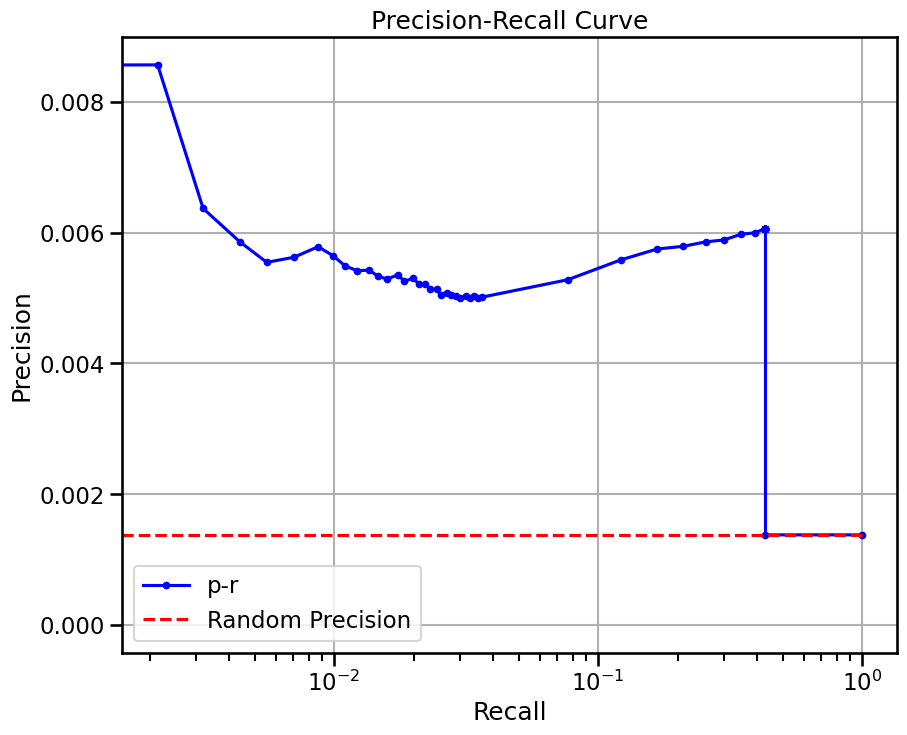

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:02<01:14,  2.40s/it]

  6%|▋         | 2/32 [00:03<00:47,  1.58s/it]

  9%|▉         | 3/32 [00:04<00:37,  1.30s/it]

 12%|█▎        | 4/32 [00:05<00:32,  1.17s/it]

 16%|█▌        | 5/32 [00:06<00:29,  1.10s/it]

 19%|█▉        | 6/32 [00:07<00:27,  1.07s/it]

 22%|██▏       | 7/32 [00:08<00:25,  1.04s/it]

 25%|██▌       | 8/32 [00:09<00:25,  1.04s/it]

 28%|██▊       | 9/32 [00:10<00:23,  1.02s/it]

 31%|███▏      | 10/32 [00:11<00:22,  1.02s/it]

 34%|███▍      | 11/32 [00:12<00:21,  1.00s/it]

 38%|███▊      | 12/32 [00:13<00:20,  1.01s/it]

 41%|████      | 13/32 [00:14<00:18,  1.00it/s]

 44%|████▍     | 14/32 [00:15<00:17,  1.00it/s]

 47%|████▋     | 15/32 [00:16<00:16,  1.02it/s]

 50%|█████     | 16/32 [00:17<00:16,  1.01s/it]

 53%|█████▎    | 17/32 [00:18<00:14,  1.01it/s]

 56%|█████▋    | 18/32 [00:19<00:14,  1.00s/it]

 59%|█████▉    | 19/32 [00:20<00:12,  1.01it/s]

 62%|██████▎   | 20/32 [00:21<00:12,  1.02s/it]

 66%|██████▌   | 21/32 [00:22<00:11,  1.02s/it]

 69%|██████▉   | 22/32 [00:23<00:10,  1.05s/it]

 72%|███████▏  | 23/32 [00:24<00:09,  1.04s/it]

 75%|███████▌  | 24/32 [00:25<00:08,  1.03s/it]

 78%|███████▊  | 25/32 [00:26<00:07,  1.03s/it]

 81%|████████▏ | 26/32 [00:27<00:06,  1.03s/it]

 84%|████████▍ | 27/32 [00:28<00:05,  1.03s/it]

 88%|████████▊ | 28/32 [00:29<00:04,  1.03s/it]

 91%|█████████ | 29/32 [00:30<00:03,  1.03s/it]

 94%|█████████▍| 30/32 [00:31<00:02,  1.03s/it]

 97%|█████████▋| 31/32 [00:32<00:01,  1.01s/it]

100%|██████████| 32/32 [00:33<00:00,  1.02s/it]

100%|██████████| 32/32 [00:34<00:00,  1.06s/it]

avg link count: 536107716, sparsity: 1.0


base enrichment


too many genes for central computation


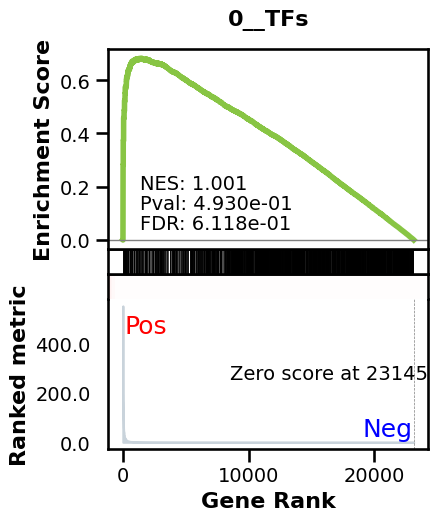

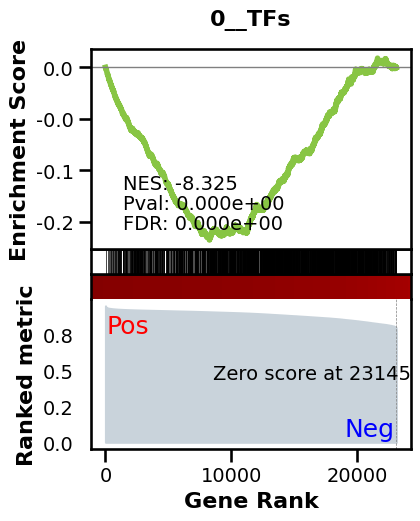

_________________________________________
TF specific enrichment


found some significant results for  31.25 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12461 genes
intersection pct: 0.5383651602868746


precision:  0.0006618854338011657 
recall:  1.0 
random precision: 0.000661931277092051


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<01:07,  1.89it/s]

  2%|▏         | 2/128 [00:01<01:08,  1.85it/s]

  2%|▏         | 3/128 [00:01<01:05,  1.91it/s]

  3%|▎         | 4/128 [00:02<01:02,  1.99it/s]

  4%|▍         | 5/128 [00:02<01:02,  1.98it/s]

  5%|▍         | 6/128 [00:03<01:00,  2.01it/s]

  5%|▌         | 7/128 [00:03<01:00,  1.99it/s]

  6%|▋         | 8/128 [00:04<01:01,  1.97it/s]

  7%|▋         | 9/128 [00:04<00:59,  1.99it/s]

  8%|▊         | 10/128 [00:05<00:59,  1.99it/s]

  9%|▊         | 11/128 [00:05<00:59,  1.98it/s]

  9%|▉         | 12/128 [00:06<00:58,  1.99it/s]

 10%|█         | 13/128 [00:06<00:57,  2.00it/s]

 11%|█         | 14/128 [00:07<00:56,  2.01it/s]

 12%|█▏        | 15/128 [00:07<00:56,  2.00it/s]

 12%|█▎        | 16/128 [00:08<00:55,  2.02it/s]

 13%|█▎        | 17/128 [00:08<00:56,  1.97it/s]

 14%|█▍        | 18/128 [00:09<00:55,  1.99it/s]

 15%|█▍        | 19/128 [00:09<00:55,  1.97it/s]

 16%|█▌        | 20/128 [00:10<00:53,  2.00it/s]

 16%|█▋        | 21/128 [00:10<00:52,  2.04it/s]

 17%|█▋        | 22/128 [00:11<00:53,  1.98it/s]

 18%|█▊        | 23/128 [00:11<00:53,  1.96it/s]

 19%|█▉        | 24/128 [00:12<00:52,  1.99it/s]

 20%|█▉        | 25/128 [00:12<00:51,  2.02it/s]

 20%|██        | 26/128 [00:13<00:48,  2.10it/s]

 21%|██        | 27/128 [00:13<00:45,  2.20it/s]

 22%|██▏       | 28/128 [00:13<00:42,  2.35it/s]

 23%|██▎       | 29/128 [00:14<00:41,  2.40it/s]

 23%|██▎       | 30/128 [00:14<00:39,  2.46it/s]

 24%|██▍       | 31/128 [00:14<00:39,  2.48it/s]

 25%|██▌       | 32/128 [00:15<00:38,  2.49it/s]

 26%|██▌       | 33/128 [00:15<00:38,  2.48it/s]

 27%|██▋       | 34/128 [00:16<00:37,  2.49it/s]

 27%|██▋       | 35/128 [00:16<00:36,  2.54it/s]

 28%|██▊       | 36/128 [00:16<00:35,  2.60it/s]

 29%|██▉       | 37/128 [00:17<00:35,  2.57it/s]

 30%|██▉       | 38/128 [00:17<00:35,  2.53it/s]

 30%|███       | 39/128 [00:18<00:34,  2.59it/s]

 31%|███▏      | 40/128 [00:18<00:33,  2.62it/s]

 32%|███▏      | 41/128 [00:18<00:32,  2.66it/s]

 33%|███▎      | 42/128 [00:19<00:32,  2.66it/s]

 34%|███▎      | 43/128 [00:19<00:32,  2.59it/s]

 34%|███▍      | 44/128 [00:19<00:32,  2.55it/s]

 35%|███▌      | 45/128 [00:20<00:32,  2.54it/s]

 36%|███▌      | 46/128 [00:20<00:31,  2.61it/s]

 37%|███▋      | 47/128 [00:21<00:30,  2.64it/s]

 38%|███▊      | 48/128 [00:21<00:30,  2.58it/s]

 38%|███▊      | 49/128 [00:21<00:31,  2.52it/s]

 39%|███▉      | 50/128 [00:22<00:30,  2.54it/s]

 40%|███▉      | 51/128 [00:22<00:30,  2.54it/s]

 41%|████      | 52/128 [00:23<00:28,  2.62it/s]

 41%|████▏     | 53/128 [00:23<00:28,  2.62it/s]

 42%|████▏     | 54/128 [00:23<00:28,  2.58it/s]

 43%|████▎     | 55/128 [00:24<00:28,  2.58it/s]

 44%|████▍     | 56/128 [00:24<00:27,  2.62it/s]

 45%|████▍     | 57/128 [00:24<00:27,  2.60it/s]

 45%|████▌     | 58/128 [00:25<00:26,  2.65it/s]

 46%|████▌     | 59/128 [00:25<00:26,  2.56it/s]

 47%|████▋     | 60/128 [00:26<00:26,  2.60it/s]

 48%|████▊     | 61/128 [00:26<00:25,  2.67it/s]

 48%|████▊     | 62/128 [00:26<00:25,  2.63it/s]

 49%|████▉     | 63/128 [00:27<00:24,  2.62it/s]

 50%|█████     | 64/128 [00:27<00:24,  2.64it/s]

 51%|█████     | 65/128 [00:28<00:23,  2.66it/s]

 52%|█████▏    | 66/128 [00:28<00:23,  2.66it/s]

 52%|█████▏    | 67/128 [00:28<00:23,  2.64it/s]

 53%|█████▎    | 68/128 [00:29<00:22,  2.63it/s]

 54%|█████▍    | 69/128 [00:29<00:22,  2.63it/s]

 55%|█████▍    | 70/128 [00:29<00:22,  2.60it/s]

 55%|█████▌    | 71/128 [00:30<00:21,  2.63it/s]

 56%|█████▋    | 72/128 [00:30<00:21,  2.62it/s]

 57%|█████▋    | 73/128 [00:31<00:21,  2.61it/s]

 58%|█████▊    | 74/128 [00:31<00:20,  2.60it/s]

 59%|█████▊    | 75/128 [00:31<00:20,  2.60it/s]

 59%|█████▉    | 76/128 [00:32<00:20,  2.59it/s]

 60%|██████    | 77/128 [00:32<00:19,  2.63it/s]

 61%|██████    | 78/128 [00:32<00:19,  2.62it/s]

 62%|██████▏   | 79/128 [00:33<00:18,  2.59it/s]

 62%|██████▎   | 80/128 [00:33<00:18,  2.60it/s]

 63%|██████▎   | 81/128 [00:34<00:18,  2.57it/s]

 64%|██████▍   | 82/128 [00:34<00:17,  2.60it/s]

 65%|██████▍   | 83/128 [00:34<00:17,  2.63it/s]

 66%|██████▌   | 84/128 [00:35<00:16,  2.62it/s]

 66%|██████▋   | 85/128 [00:35<00:16,  2.60it/s]

 67%|██████▋   | 86/128 [00:36<00:16,  2.58it/s]

 68%|██████▊   | 87/128 [00:36<00:15,  2.59it/s]

 69%|██████▉   | 88/128 [00:36<00:15,  2.63it/s]

 70%|██████▉   | 89/128 [00:37<00:15,  2.58it/s]

 70%|███████   | 90/128 [00:37<00:14,  2.57it/s]

 71%|███████   | 91/128 [00:38<00:14,  2.54it/s]

 72%|███████▏  | 92/128 [00:38<00:14,  2.57it/s]

 73%|███████▎  | 93/128 [00:38<00:13,  2.60it/s]

 73%|███████▎  | 94/128 [00:39<00:13,  2.59it/s]

 74%|███████▍  | 95/128 [00:39<00:12,  2.55it/s]

 75%|███████▌  | 96/128 [00:39<00:12,  2.54it/s]

 76%|███████▌  | 97/128 [00:40<00:11,  2.62it/s]

 77%|███████▋  | 98/128 [00:40<00:11,  2.64it/s]

 77%|███████▋  | 99/128 [00:41<00:11,  2.60it/s]

 78%|███████▊  | 100/128 [00:41<00:10,  2.56it/s]

 79%|███████▉  | 101/128 [00:41<00:10,  2.54it/s]

 80%|███████▉  | 102/128 [00:42<00:09,  2.64it/s]

 80%|████████  | 103/128 [00:42<00:09,  2.61it/s]

 81%|████████▏ | 104/128 [00:43<00:09,  2.54it/s]

 82%|████████▏ | 105/128 [00:43<00:09,  2.52it/s]

 83%|████████▎ | 106/128 [00:43<00:08,  2.51it/s]

 84%|████████▎ | 107/128 [00:44<00:08,  2.60it/s]

 84%|████████▍ | 108/128 [00:44<00:07,  2.62it/s]

 85%|████████▌ | 109/128 [00:44<00:07,  2.59it/s]

 86%|████████▌ | 110/128 [00:45<00:07,  2.54it/s]

 87%|████████▋ | 111/128 [00:45<00:06,  2.58it/s]

 88%|████████▊ | 112/128 [00:46<00:06,  2.65it/s]

 88%|████████▊ | 113/128 [00:46<00:05,  2.69it/s]

 89%|████████▉ | 114/128 [00:46<00:05,  2.65it/s]

 90%|████████▉ | 115/128 [00:47<00:04,  2.63it/s]

 91%|█████████ | 116/128 [00:47<00:04,  2.61it/s]

 91%|█████████▏| 117/128 [00:48<00:04,  2.68it/s]

 92%|█████████▏| 118/128 [00:48<00:03,  2.69it/s]

 93%|█████████▎| 119/128 [00:48<00:03,  2.64it/s]

 94%|█████████▍| 120/128 [00:49<00:03,  2.62it/s]

 95%|█████████▍| 121/128 [00:49<00:02,  2.64it/s]

 95%|█████████▌| 122/128 [00:49<00:02,  2.71it/s]

 96%|█████████▌| 123/128 [00:50<00:01,  2.74it/s]

 97%|█████████▋| 124/128 [00:50<00:01,  2.72it/s]

 98%|█████████▊| 125/128 [00:50<00:01,  2.71it/s]

 98%|█████████▊| 126/128 [00:51<00:00,  2.67it/s]

 99%|█████████▉| 127/128 [00:51<00:00,  2.70it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:52<00:00,  2.72it/s]

100%|██████████| 128/128 [00:52<00:00,  2.46it/s]

Average Precision (AP):  0.0006478411827256629
Area Under Precision-Recall Curve (AUPRC):  0.0006468287235835666


EPR: 2.138050782988291


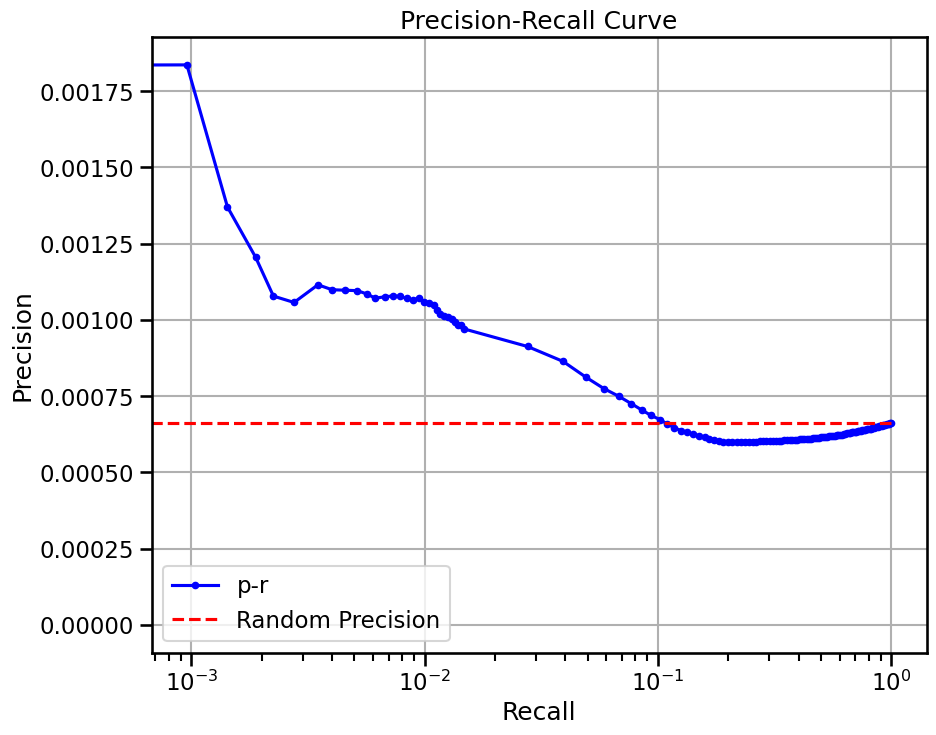

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:03<03:10,  3.03s/it]

  3%|▎         | 2/64 [00:04<02:10,  2.11s/it]

  5%|▍         | 3/64 [00:05<01:49,  1.80s/it]

  6%|▋         | 4/64 [00:07<01:42,  1.71s/it]

  8%|▊         | 5/64 [00:09<01:38,  1.66s/it]

  9%|▉         | 6/64 [00:10<01:34,  1.64s/it]

 11%|█         | 7/64 [00:12<01:30,  1.58s/it]

 12%|█▎        | 8/64 [00:13<01:28,  1.59s/it]

 14%|█▍        | 9/64 [00:15<01:25,  1.56s/it]

 16%|█▌        | 10/64 [00:16<01:22,  1.53s/it]

 17%|█▋        | 11/64 [00:18<01:20,  1.53s/it]

 19%|█▉        | 12/64 [00:19<01:19,  1.52s/it]

 20%|██        | 13/64 [00:21<01:18,  1.53s/it]

 22%|██▏       | 14/64 [00:22<01:16,  1.53s/it]

 23%|██▎       | 15/64 [00:24<01:14,  1.52s/it]

 25%|██▌       | 16/64 [00:25<01:11,  1.48s/it]

 27%|██▋       | 17/64 [00:27<01:08,  1.46s/it]

 28%|██▊       | 18/64 [00:28<01:07,  1.46s/it]

 30%|██▉       | 19/64 [00:29<01:04,  1.43s/it]

 31%|███▏      | 20/64 [00:31<01:02,  1.42s/it]

 33%|███▎      | 21/64 [00:32<01:00,  1.40s/it]

 34%|███▍      | 22/64 [00:33<00:57,  1.38s/it]

 36%|███▌      | 23/64 [00:35<00:55,  1.36s/it]

 38%|███▊      | 24/64 [00:36<00:54,  1.35s/it]

 39%|███▉      | 25/64 [00:38<00:52,  1.35s/it]

 41%|████      | 26/64 [00:39<00:50,  1.32s/it]

 42%|████▏     | 27/64 [00:40<00:48,  1.31s/it]

 44%|████▍     | 28/64 [00:41<00:46,  1.29s/it]

 45%|████▌     | 29/64 [00:43<00:44,  1.27s/it]

 47%|████▋     | 30/64 [00:44<00:43,  1.26s/it]

 48%|████▊     | 31/64 [00:45<00:41,  1.26s/it]

 50%|█████     | 32/64 [00:46<00:39,  1.25s/it]

 52%|█████▏    | 33/64 [00:47<00:38,  1.24s/it]

 53%|█████▎    | 34/64 [00:49<00:37,  1.24s/it]

 55%|█████▍    | 35/64 [00:50<00:35,  1.23s/it]

 56%|█████▋    | 36/64 [00:51<00:34,  1.23s/it]

 58%|█████▊    | 37/64 [00:52<00:33,  1.22s/it]

 59%|█████▉    | 38/64 [00:54<00:33,  1.28s/it]

 61%|██████    | 39/64 [00:55<00:32,  1.31s/it]

 62%|██████▎   | 40/64 [00:56<00:31,  1.31s/it]

 64%|██████▍   | 41/64 [00:58<00:30,  1.33s/it]

 66%|██████▌   | 42/64 [00:59<00:30,  1.37s/it]

 67%|██████▋   | 43/64 [01:01<00:29,  1.40s/it]

 69%|██████▉   | 44/64 [01:02<00:28,  1.44s/it]

 70%|███████   | 45/64 [01:04<00:26,  1.41s/it]

 72%|███████▏  | 46/64 [01:05<00:25,  1.41s/it]

 73%|███████▎  | 47/64 [01:07<00:24,  1.44s/it]

 75%|███████▌  | 48/64 [01:08<00:23,  1.45s/it]

 77%|███████▋  | 49/64 [01:10<00:22,  1.47s/it]

 78%|███████▊  | 50/64 [01:11<00:20,  1.47s/it]

 80%|███████▉  | 51/64 [01:12<00:19,  1.46s/it]

 81%|████████▏ | 52/64 [01:14<00:17,  1.45s/it]

 83%|████████▎ | 53/64 [01:15<00:15,  1.45s/it]

 84%|████████▍ | 54/64 [01:17<00:14,  1.44s/it]

 86%|████████▌ | 55/64 [01:18<00:12,  1.44s/it]

 88%|████████▊ | 56/64 [01:20<00:11,  1.43s/it]

 89%|████████▉ | 57/64 [01:21<00:10,  1.44s/it]

 91%|█████████ | 58/64 [01:22<00:08,  1.45s/it]

 92%|█████████▏| 59/64 [01:24<00:07,  1.46s/it]

 94%|█████████▍| 60/64 [01:25<00:05,  1.47s/it]

 95%|█████████▌| 61/64 [01:27<00:04,  1.47s/it]

 97%|█████████▋| 62/64 [01:28<00:02,  1.47s/it]

 98%|█████████▊| 63/64 [01:30<00:01,  1.46s/it]

100%|██████████| 64/64 [01:31<00:00,  1.48s/it]

100%|██████████| 64/64 [01:32<00:00,  1.44s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


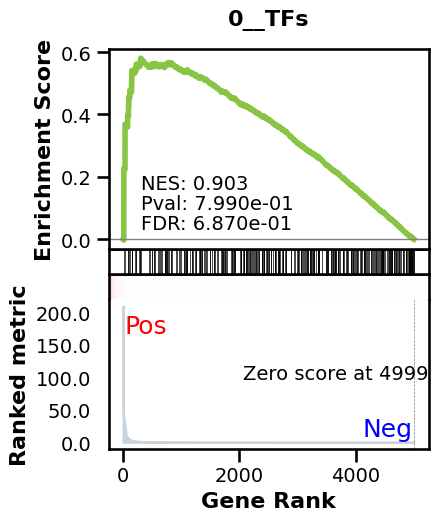

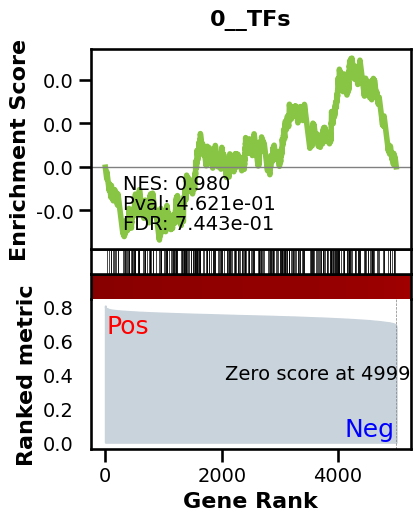

_________________________________________
TF specific enrichment


found some significant results for  17.857142857142858 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.0008182014067845249 
recall:  1.0 
random precision: 0.0008184288112889119


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 48.24it/s]

  8%|▊         | 10/128 [00:00<00:02, 49.19it/s]

 12%|█▎        | 16/128 [00:00<00:02, 50.08it/s]

 17%|█▋        | 22/128 [00:00<00:02, 49.80it/s]

 21%|██        | 27/128 [00:00<00:02, 49.31it/s]

 26%|██▌       | 33/128 [00:00<00:01, 49.73it/s]

 30%|███       | 39/128 [00:00<00:01, 50.29it/s]

 35%|███▌      | 45/128 [00:00<00:01, 50.79it/s]

 40%|███▉      | 51/128 [00:01<00:01, 50.94it/s]

 45%|████▍     | 57/128 [00:01<00:01, 50.81it/s]

 49%|████▉     | 63/128 [00:01<00:01, 50.17it/s]

 54%|█████▍    | 69/128 [00:01<00:01, 48.52it/s]

 58%|█████▊    | 74/128 [00:01<00:01, 48.45it/s]

 62%|██████▎   | 80/128 [00:01<00:00, 48.96it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 49.16it/s]

 71%|███████   | 91/128 [00:01<00:00, 49.53it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 49.27it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 49.82it/s]

 84%|████████▍ | 108/128 [00:02<00:00, 50.28it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 49.43it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 48.38it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 49.07it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 49.55it/s]

Average Precision (AP):  0.0009118828608531099
Area Under Precision-Recall Curve (AUPRC):  0.0009097992623417129


EPR: 1.384361187840497


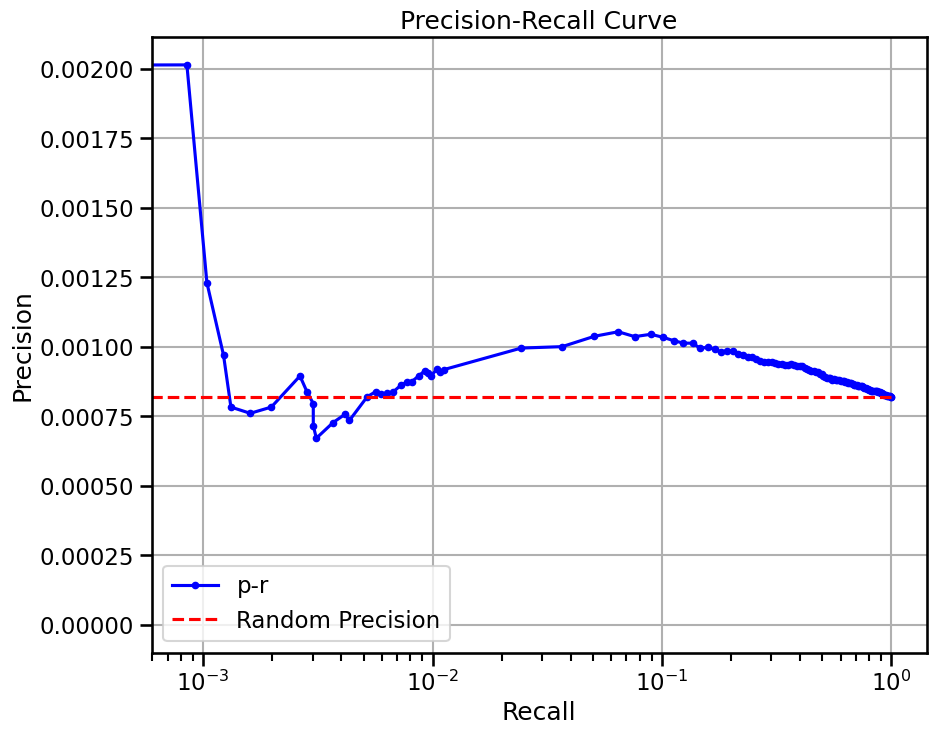

base enrichment


Top central genes: []


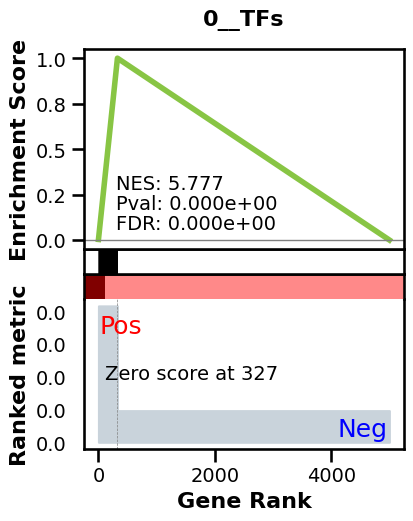

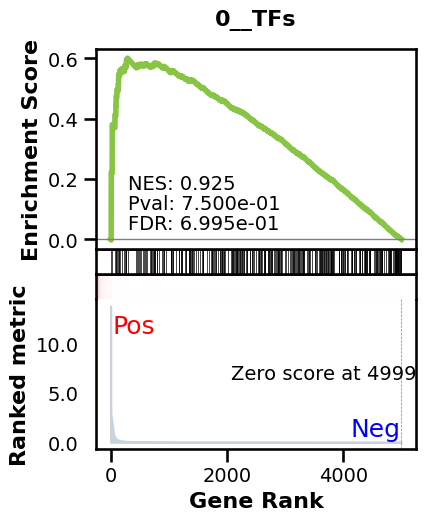

_________________________________________
TF specific enrichment


found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.002897771051454403 
recall:  0.27750518965842613 
random precision: 0.0008184288112889119


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 48.36it/s]

  8%|▊         | 10/128 [00:00<00:02, 48.75it/s]

 12%|█▏        | 15/128 [00:00<00:02, 48.50it/s]

 16%|█▌        | 20/128 [00:00<00:02, 48.15it/s]

 20%|█▉        | 25/128 [00:00<00:02, 47.89it/s]

 23%|██▎       | 30/128 [00:00<00:02, 47.37it/s]

 27%|██▋       | 35/128 [00:00<00:02, 46.38it/s]

 31%|███▏      | 40/128 [00:00<00:01, 45.74it/s]

 35%|███▌      | 45/128 [00:00<00:01, 45.53it/s]

 39%|███▉      | 50/128 [00:01<00:01, 45.30it/s]

 43%|████▎     | 55/128 [00:01<00:01, 45.31it/s]

 47%|████▋     | 60/128 [00:01<00:01, 46.03it/s]

 51%|█████     | 65/128 [00:01<00:01, 46.45it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 46.83it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 47.02it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 46.56it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 45.88it/s]

 70%|███████   | 90/128 [00:01<00:00, 46.73it/s]

 75%|███████▌  | 96/128 [00:02<00:00, 47.88it/s]

 79%|███████▉  | 101/128 [00:02<00:00, 47.65it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 47.69it/s]

 87%|████████▋ | 111/128 [00:02<00:00, 47.65it/s]

 91%|█████████ | 116/128 [00:02<00:00, 47.45it/s]

 95%|█████████▍| 121/128 [00:02<00:00, 47.01it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 46.47it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 46.75it/s]

Average Precision (AP):  0.001735210390586413
Area Under Precision-Recall Curve (AUPRC):  0.001518507295776512
EPR: 3.8221488009794014


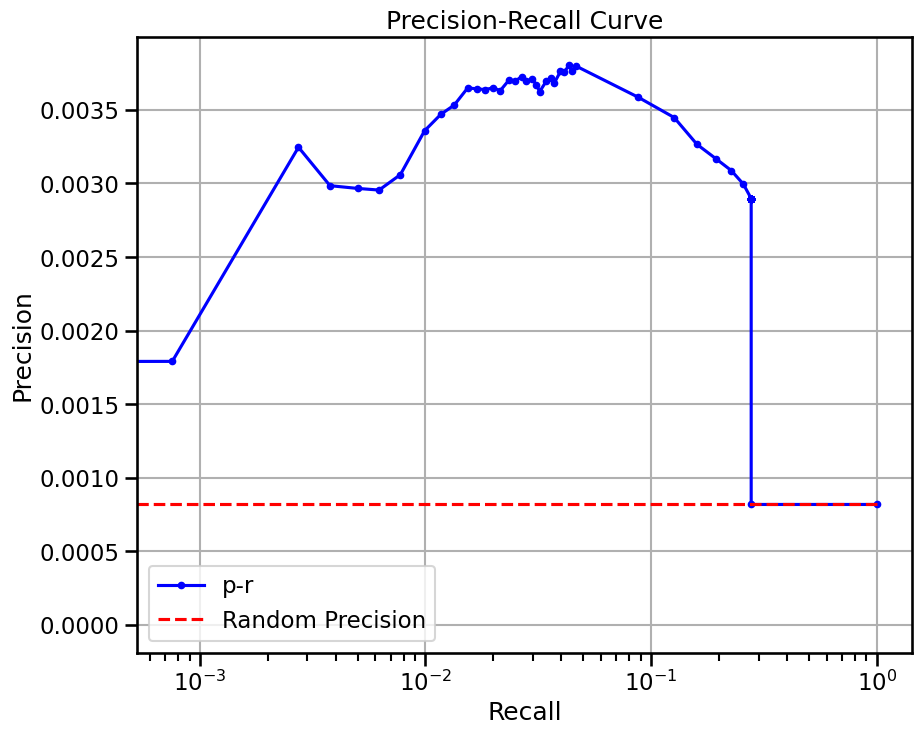

base enrichment


Top central genes: []
The DataFrame contains only the same values.


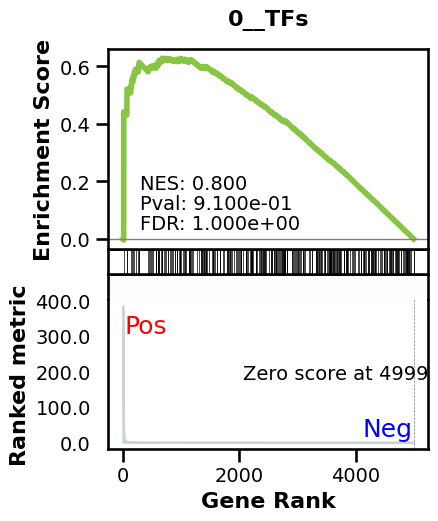

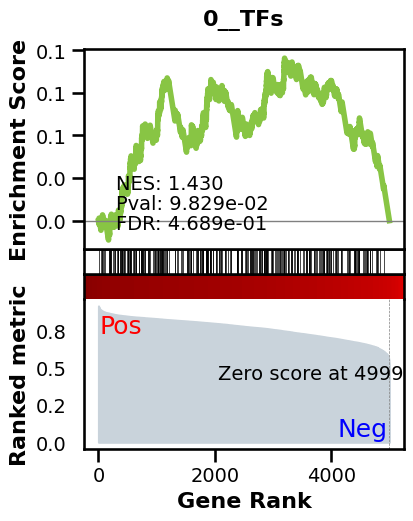

_________________________________________
TF specific enrichment


found some significant results for  7.142857142857143 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.0008182014067845249 
recall:  1.0 
random precision: 0.0008184288112889119


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 46.35it/s]

  8%|▊         | 10/128 [00:00<00:02, 46.57it/s]

 12%|█▏        | 15/128 [00:00<00:02, 47.68it/s]

 16%|█▌        | 20/128 [00:00<00:02, 48.05it/s]

 20%|█▉        | 25/128 [00:00<00:02, 46.98it/s]

 23%|██▎       | 30/128 [00:00<00:02, 46.27it/s]

 27%|██▋       | 35/128 [00:00<00:02, 46.32it/s]

 31%|███▏      | 40/128 [00:00<00:01, 46.62it/s]

 35%|███▌      | 45/128 [00:00<00:01, 47.52it/s]

 39%|███▉      | 50/128 [00:01<00:01, 47.91it/s]

 43%|████▎     | 55/128 [00:01<00:01, 48.03it/s]

 48%|████▊     | 61/128 [00:01<00:01, 48.78it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 48.87it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 48.84it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 48.70it/s]

 63%|██████▎   | 81/128 [00:01<00:00, 47.87it/s]

 67%|██████▋   | 86/128 [00:01<00:00, 47.39it/s]

 71%|███████   | 91/128 [00:01<00:00, 46.98it/s]

 75%|███████▌  | 96/128 [00:02<00:00, 47.37it/s]

 79%|███████▉  | 101/128 [00:02<00:00, 47.25it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 46.70it/s]

 87%|████████▋ | 111/128 [00:02<00:00, 46.30it/s]

 91%|█████████ | 116/128 [00:02<00:00, 45.83it/s]

 95%|█████████▍| 121/128 [00:02<00:00, 45.85it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 45.99it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 47.08it/s]

Average Precision (AP):  0.0008438745537892012
Area Under Precision-Recall Curve (AUPRC):  0.000842459333768
EPR: 1.8472111898685326


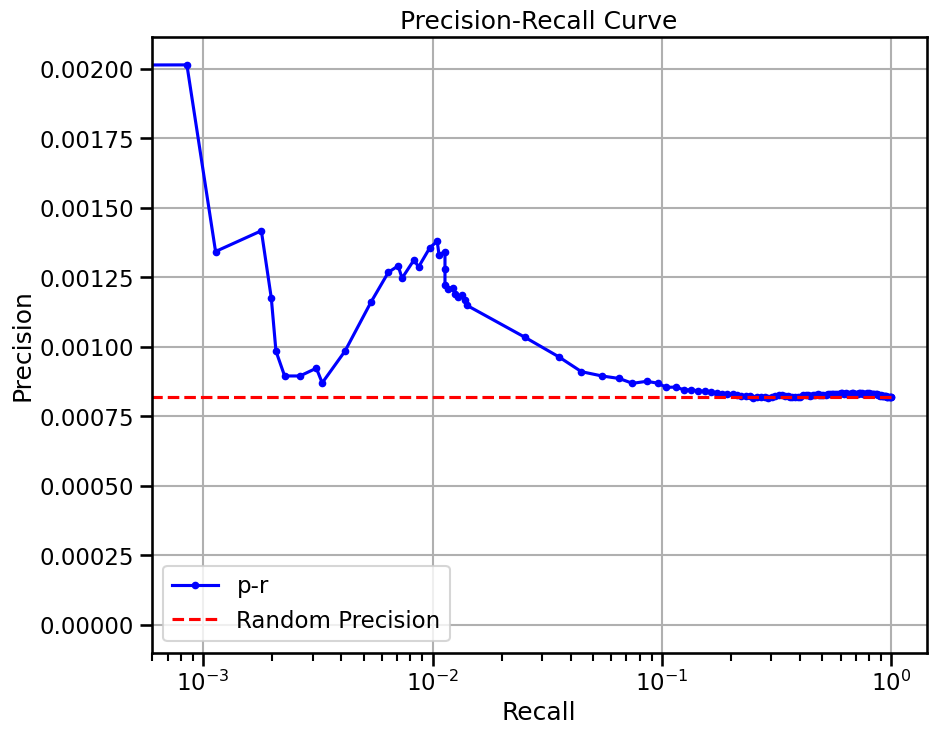

base enrichment


Top central genes: []


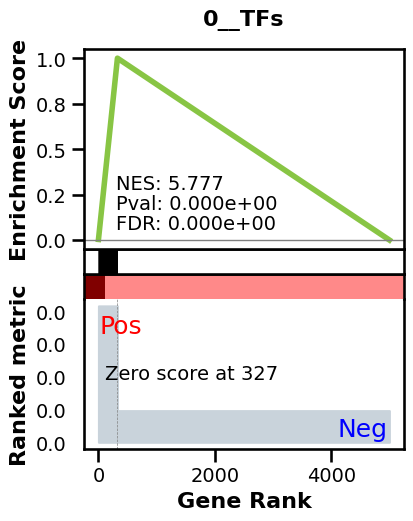

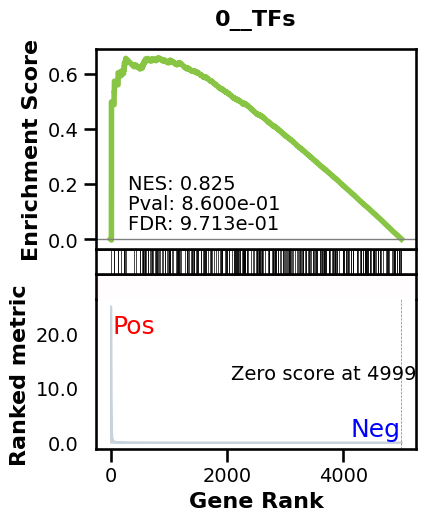

_________________________________________
TF specific enrichment


found some significant results for  3.5714285714285716 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3599 genes
intersection pct: 0.7198
precision:  0.002897771051454403 
recall:  0.27750518965842613 
random precision: 0.0008184288112889119


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 50.97it/s]

  9%|▉         | 12/128 [00:00<00:02, 50.94it/s]

 14%|█▍        | 18/128 [00:00<00:02, 49.14it/s]

 18%|█▊        | 23/128 [00:00<00:02, 48.54it/s]

 22%|██▏       | 28/128 [00:00<00:02, 48.08it/s]

 26%|██▌       | 33/128 [00:00<00:02, 46.84it/s]

 30%|██▉       | 38/128 [00:00<00:01, 45.71it/s]

 34%|███▎      | 43/128 [00:00<00:01, 45.41it/s]

 38%|███▊      | 48/128 [00:01<00:01, 45.34it/s]

 41%|████▏     | 53/128 [00:01<00:01, 45.23it/s]

 45%|████▌     | 58/128 [00:01<00:01, 45.16it/s]

 49%|████▉     | 63/128 [00:01<00:01, 44.96it/s]

 53%|█████▎    | 68/128 [00:01<00:01, 45.12it/s]

 57%|█████▋    | 73/128 [00:01<00:01, 45.56it/s]

 61%|██████    | 78/128 [00:01<00:01, 45.73it/s]

 65%|██████▍   | 83/128 [00:01<00:00, 46.21it/s]

 69%|██████▉   | 88/128 [00:01<00:00, 47.23it/s]

 73%|███████▎  | 94/128 [00:02<00:00, 48.29it/s]

 77%|███████▋  | 99/128 [00:02<00:00, 48.69it/s]

 81%|████████▏ | 104/128 [00:02<00:00, 48.80it/s]

 85%|████████▌ | 109/128 [00:02<00:00, 48.19it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 47.92it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 47.91it/s]

 97%|█████████▋| 124/128 [00:02<00:00, 47.09it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 46.90it/s]

Average Precision (AP):  0.001620206741352549
Area Under Precision-Recall Curve (AUPRC):  0.00140211033470557
EPR: 4.872854941637526


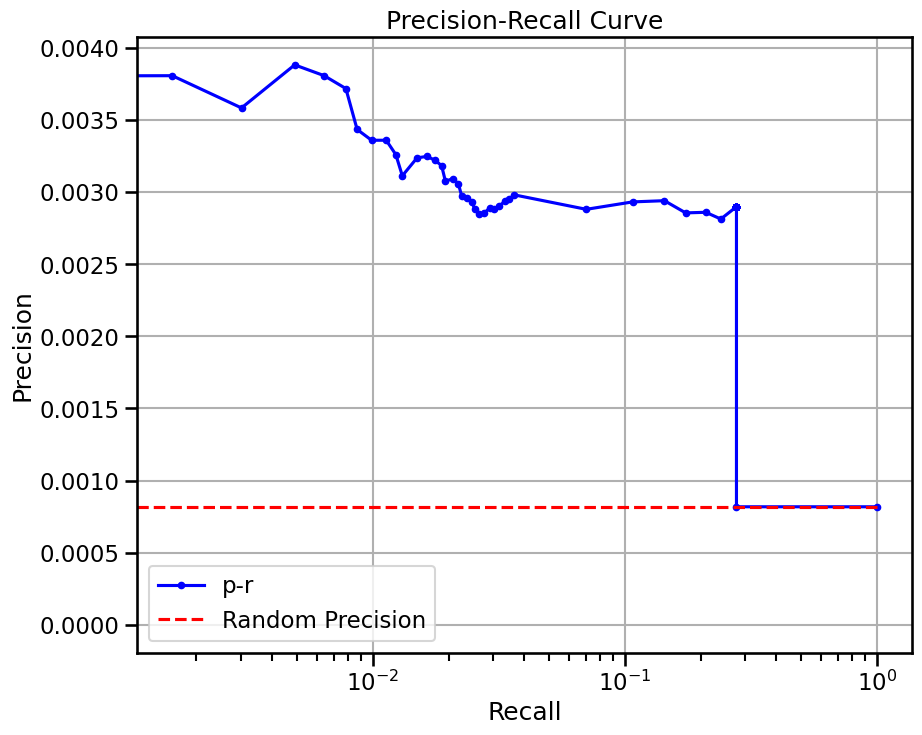

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:02<01:17,  2.49s/it]

  6%|▋         | 2/32 [00:03<00:49,  1.64s/it]

  9%|▉         | 3/32 [00:04<00:39,  1.37s/it]

 12%|█▎        | 4/32 [00:05<00:34,  1.22s/it]

 16%|█▌        | 5/32 [00:06<00:31,  1.16s/it]

 19%|█▉        | 6/32 [00:07<00:29,  1.13s/it]

 22%|██▏       | 7/32 [00:08<00:27,  1.10s/it]

 25%|██▌       | 8/32 [00:09<00:25,  1.07s/it]

 28%|██▊       | 9/32 [00:10<00:24,  1.07s/it]

 31%|███▏      | 10/32 [00:11<00:23,  1.05s/it]

 34%|███▍      | 11/32 [00:12<00:21,  1.04s/it]

 38%|███▊      | 12/32 [00:13<00:20,  1.03s/it]

 41%|████      | 13/32 [00:14<00:19,  1.02s/it]

 44%|████▍     | 14/32 [00:15<00:18,  1.04s/it]

 47%|████▋     | 15/32 [00:16<00:17,  1.02s/it]

 50%|█████     | 16/32 [00:17<00:16,  1.01s/it]

 53%|█████▎    | 17/32 [00:18<00:15,  1.01s/it]

 56%|█████▋    | 18/32 [00:19<00:14,  1.01s/it]

 59%|█████▉    | 19/32 [00:20<00:13,  1.02s/it]

 62%|██████▎   | 20/32 [00:22<00:12,  1.04s/it]

 66%|██████▌   | 21/32 [00:23<00:11,  1.05s/it]

 69%|██████▉   | 22/32 [00:23<00:09,  1.01it/s]

 72%|███████▏  | 23/32 [00:24<00:08,  1.00it/s]

 75%|███████▌  | 24/32 [00:25<00:07,  1.03it/s]

 78%|███████▊  | 25/32 [00:26<00:06,  1.02it/s]

 81%|████████▏ | 26/32 [00:27<00:05,  1.02it/s]

 84%|████████▍ | 27/32 [00:28<00:05,  1.01s/it]

 88%|████████▊ | 28/32 [00:29<00:04,  1.01s/it]

 91%|█████████ | 29/32 [00:31<00:03,  1.03s/it]

 94%|█████████▍| 30/32 [00:31<00:01,  1.00it/s]

 97%|█████████▋| 31/32 [00:32<00:00,  1.00it/s]

100%|██████████| 32/32 [00:33<00:00,  1.03it/s]

100%|██████████| 32/32 [00:34<00:00,  1.07s/it]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


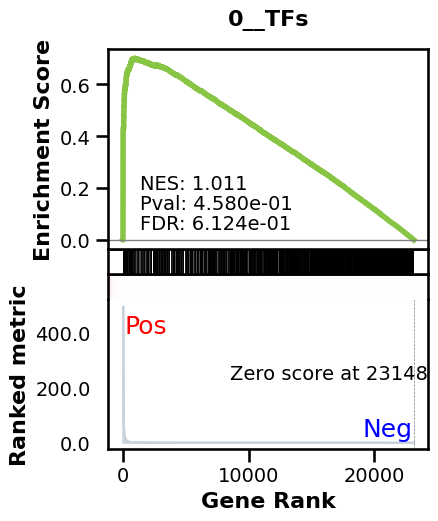

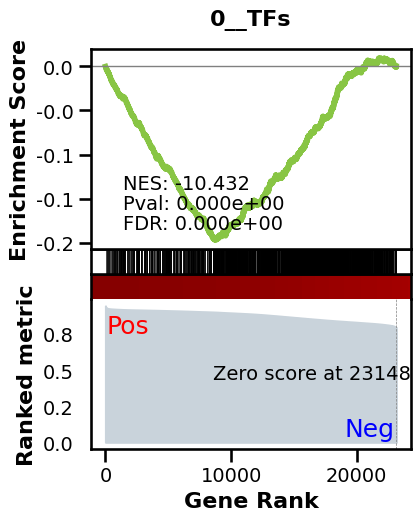

_________________________________________
TF specific enrichment


found some significant results for  40.17857142857143 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:43,  2.93it/s]

  2%|▏         | 2/128 [00:00<00:42,  2.95it/s]

  2%|▏         | 3/128 [00:01<00:44,  2.84it/s]

  3%|▎         | 4/128 [00:01<00:44,  2.79it/s]

  4%|▍         | 5/128 [00:01<00:43,  2.80it/s]

  5%|▍         | 6/128 [00:02<00:43,  2.79it/s]

  5%|▌         | 7/128 [00:02<00:43,  2.81it/s]

  6%|▋         | 8/128 [00:02<00:42,  2.83it/s]

  7%|▋         | 9/128 [00:03<00:42,  2.81it/s]

  8%|▊         | 10/128 [00:03<00:41,  2.82it/s]

  9%|▊         | 11/128 [00:03<00:41,  2.79it/s]

  9%|▉         | 12/128 [00:04<00:41,  2.81it/s]

 10%|█         | 13/128 [00:04<00:40,  2.85it/s]

 11%|█         | 14/128 [00:04<00:40,  2.79it/s]

 12%|█▏        | 15/128 [00:05<00:40,  2.79it/s]

 12%|█▎        | 16/128 [00:05<00:40,  2.76it/s]

 13%|█▎        | 17/128 [00:06<00:40,  2.76it/s]

 14%|█▍        | 18/128 [00:06<00:38,  2.82it/s]

 15%|█▍        | 19/128 [00:06<00:38,  2.80it/s]

 16%|█▌        | 20/128 [00:07<00:39,  2.75it/s]

 16%|█▋        | 21/128 [00:07<00:38,  2.76it/s]

 17%|█▋        | 22/128 [00:07<00:38,  2.76it/s]

 18%|█▊        | 23/128 [00:08<00:37,  2.79it/s]

 19%|█▉        | 24/128 [00:08<00:37,  2.81it/s]

 20%|█▉        | 25/128 [00:08<00:37,  2.77it/s]

 20%|██        | 26/128 [00:09<00:36,  2.76it/s]

 21%|██        | 27/128 [00:09<00:36,  2.73it/s]

 22%|██▏       | 28/128 [00:10<00:36,  2.76it/s]

 23%|██▎       | 29/128 [00:10<00:35,  2.75it/s]

 23%|██▎       | 30/128 [00:10<00:35,  2.75it/s]

 24%|██▍       | 31/128 [00:11<00:35,  2.74it/s]

 25%|██▌       | 32/128 [00:11<00:35,  2.73it/s]

 26%|██▌       | 33/128 [00:11<00:34,  2.76it/s]

 27%|██▋       | 34/128 [00:12<00:34,  2.73it/s]

 27%|██▋       | 35/128 [00:12<00:33,  2.75it/s]

 28%|██▊       | 36/128 [00:12<00:33,  2.73it/s]

 29%|██▉       | 37/128 [00:13<00:32,  2.77it/s]

 30%|██▉       | 38/128 [00:13<00:32,  2.75it/s]

 30%|███       | 39/128 [00:14<00:32,  2.72it/s]

 31%|███▏      | 40/128 [00:14<00:32,  2.73it/s]

 32%|███▏      | 41/128 [00:14<00:31,  2.72it/s]

 33%|███▎      | 42/128 [00:15<00:31,  2.77it/s]

 34%|███▎      | 43/128 [00:15<00:31,  2.73it/s]

 34%|███▍      | 44/128 [00:15<00:30,  2.72it/s]

 35%|███▌      | 45/128 [00:16<00:30,  2.74it/s]

 36%|███▌      | 46/128 [00:16<00:30,  2.73it/s]

 37%|███▋      | 47/128 [00:16<00:29,  2.78it/s]

 38%|███▊      | 48/128 [00:17<00:29,  2.72it/s]

 38%|███▊      | 49/128 [00:17<00:28,  2.73it/s]

 39%|███▉      | 50/128 [00:18<00:28,  2.73it/s]

 40%|███▉      | 51/128 [00:18<00:27,  2.75it/s]

 41%|████      | 52/128 [00:18<00:27,  2.75it/s]

 41%|████▏     | 53/128 [00:19<00:27,  2.74it/s]

 42%|████▏     | 54/128 [00:19<00:27,  2.74it/s]

 43%|████▎     | 55/128 [00:19<00:26,  2.71it/s]

 44%|████▍     | 56/128 [00:20<00:25,  2.77it/s]

 45%|████▍     | 57/128 [00:20<00:25,  2.77it/s]

 45%|████▌     | 58/128 [00:20<00:25,  2.76it/s]

 46%|████▌     | 59/128 [00:21<00:25,  2.76it/s]

 47%|████▋     | 60/128 [00:21<00:24,  2.76it/s]

 48%|████▊     | 61/128 [00:22<00:23,  2.80it/s]

 48%|████▊     | 62/128 [00:22<00:23,  2.79it/s]

 49%|████▉     | 63/128 [00:22<00:23,  2.77it/s]

 50%|█████     | 64/128 [00:23<00:22,  2.79it/s]

 51%|█████     | 65/128 [00:23<00:23,  2.70it/s]

 52%|█████▏    | 66/128 [00:23<00:22,  2.77it/s]

 52%|█████▏    | 67/128 [00:24<00:21,  2.79it/s]

 53%|█████▎    | 68/128 [00:24<00:21,  2.77it/s]

 54%|█████▍    | 69/128 [00:24<00:21,  2.74it/s]

 55%|█████▍    | 70/128 [00:25<00:21,  2.71it/s]

 55%|█████▌    | 71/128 [00:25<00:20,  2.77it/s]

 56%|█████▋    | 72/128 [00:26<00:20,  2.77it/s]

 57%|█████▋    | 73/128 [00:26<00:20,  2.71it/s]

 58%|█████▊    | 74/128 [00:26<00:19,  2.72it/s]

 59%|█████▊    | 75/128 [00:27<00:19,  2.72it/s]

 59%|█████▉    | 76/128 [00:27<00:18,  2.77it/s]

 60%|██████    | 77/128 [00:27<00:18,  2.77it/s]

 61%|██████    | 78/128 [00:28<00:18,  2.77it/s]

 62%|██████▏   | 79/128 [00:28<00:17,  2.80it/s]

 62%|██████▎   | 80/128 [00:28<00:17,  2.74it/s]

 63%|██████▎   | 81/128 [00:29<00:16,  2.77it/s]

 64%|██████▍   | 82/128 [00:29<00:16,  2.76it/s]

 65%|██████▍   | 83/128 [00:30<00:15,  2.83it/s]

 66%|██████▌   | 84/128 [00:30<00:15,  2.83it/s]

 66%|██████▋   | 85/128 [00:30<00:15,  2.80it/s]

 67%|██████▋   | 86/128 [00:31<00:15,  2.65it/s]

 68%|██████▊   | 87/128 [00:31<00:15,  2.66it/s]

 69%|██████▉   | 88/128 [00:31<00:14,  2.74it/s]

 70%|██████▉   | 89/128 [00:32<00:14,  2.78it/s]

 70%|███████   | 90/128 [00:32<00:13,  2.76it/s]

 71%|███████   | 91/128 [00:32<00:13,  2.77it/s]

 72%|███████▏  | 92/128 [00:33<00:13,  2.76it/s]

 73%|███████▎  | 93/128 [00:33<00:12,  2.77it/s]

 73%|███████▎  | 94/128 [00:34<00:12,  2.80it/s]

 74%|███████▍  | 95/128 [00:34<00:11,  2.79it/s]

 75%|███████▌  | 96/128 [00:34<00:11,  2.77it/s]

 76%|███████▌  | 97/128 [00:35<00:11,  2.77it/s]

 77%|███████▋  | 98/128 [00:35<00:10,  2.74it/s]

 77%|███████▋  | 99/128 [00:35<00:10,  2.77it/s]

 78%|███████▊  | 100/128 [00:36<00:09,  2.80it/s]

 79%|███████▉  | 101/128 [00:36<00:09,  2.81it/s]

 80%|███████▉  | 102/128 [00:36<00:09,  2.78it/s]

 80%|████████  | 103/128 [00:37<00:09,  2.73it/s]

 81%|████████▏ | 104/128 [00:37<00:08,  2.72it/s]

 82%|████████▏ | 105/128 [00:37<00:08,  2.79it/s]

 83%|████████▎ | 106/128 [00:38<00:07,  2.79it/s]

 84%|████████▎ | 107/128 [00:38<00:07,  2.74it/s]

 84%|████████▍ | 108/128 [00:39<00:07,  2.75it/s]

 85%|████████▌ | 109/128 [00:39<00:06,  2.72it/s]

 86%|████████▌ | 110/128 [00:39<00:06,  2.76it/s]

 87%|████████▋ | 111/128 [00:40<00:06,  2.80it/s]

 88%|████████▊ | 112/128 [00:40<00:05,  2.73it/s]

 88%|████████▊ | 113/128 [00:40<00:05,  2.75it/s]

 89%|████████▉ | 114/128 [00:41<00:05,  2.76it/s]

 90%|████████▉ | 115/128 [00:41<00:04,  2.76it/s]

 91%|█████████ | 116/128 [00:41<00:04,  2.79it/s]

 91%|█████████▏| 117/128 [00:42<00:03,  2.79it/s]

 92%|█████████▏| 118/128 [00:42<00:03,  2.82it/s]

 93%|█████████▎| 119/128 [00:43<00:03,  2.76it/s]

 94%|█████████▍| 120/128 [00:43<00:02,  2.69it/s]

 95%|█████████▍| 121/128 [00:43<00:02,  2.77it/s]

 95%|█████████▌| 122/128 [00:44<00:02,  2.86it/s]

 96%|█████████▌| 123/128 [00:44<00:01,  2.85it/s]

 97%|█████████▋| 124/128 [00:44<00:01,  2.76it/s]

 98%|█████████▊| 125/128 [00:45<00:01,  2.72it/s]

 98%|█████████▊| 126/128 [00:45<00:00,  2.76it/s]

 99%|█████████▉| 127/128 [00:45<00:00,  2.85it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:46<00:00,  2.87it/s]

100%|██████████| 128/128 [00:46<00:00,  2.77it/s]

Average Precision (AP):  0.000652394730045561
Area Under Precision-Recall Curve (AUPRC):  0.0006509206200421668


EPR: 2.6986294363354952


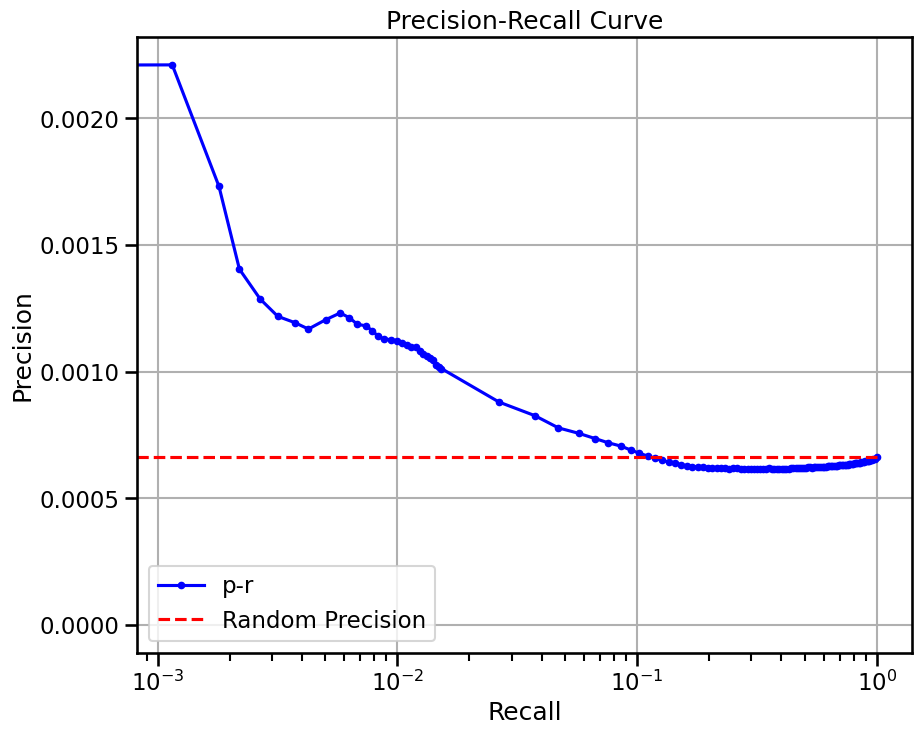

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:03<03:22,  3.22s/it]

  3%|▎         | 2/64 [00:04<02:17,  2.21s/it]

  5%|▍         | 3/64 [00:06<01:54,  1.89s/it]

  6%|▋         | 4/64 [00:07<01:42,  1.71s/it]

  8%|▊         | 5/64 [00:09<01:36,  1.64s/it]

  9%|▉         | 6/64 [00:13<02:33,  2.64s/it]

 11%|█         | 7/64 [00:15<02:08,  2.25s/it]

 12%|█▎        | 8/64 [00:16<01:51,  1.98s/it]

 14%|█▍        | 9/64 [00:18<01:39,  1.81s/it]

 16%|█▌        | 10/64 [00:19<01:30,  1.68s/it]

 17%|█▋        | 11/64 [00:20<01:24,  1.59s/it]

 19%|█▉        | 12/64 [00:22<01:20,  1.55s/it]

 20%|██        | 13/64 [00:23<01:16,  1.50s/it]

 22%|██▏       | 14/64 [00:25<01:14,  1.48s/it]

 23%|██▎       | 15/64 [00:26<01:12,  1.48s/it]

 25%|██▌       | 16/64 [00:28<01:12,  1.51s/it]

 27%|██▋       | 17/64 [00:29<01:10,  1.51s/it]

 28%|██▊       | 18/64 [00:31<01:09,  1.51s/it]

 30%|██▉       | 19/64 [00:32<01:08,  1.53s/it]

 31%|███▏      | 20/64 [00:34<01:07,  1.53s/it]

 33%|███▎      | 21/64 [00:35<01:05,  1.52s/it]

 34%|███▍      | 22/64 [00:37<01:03,  1.52s/it]

 36%|███▌      | 23/64 [00:38<01:02,  1.51s/it]

 38%|███▊      | 24/64 [00:40<01:00,  1.51s/it]

 39%|███▉      | 25/64 [00:41<00:58,  1.50s/it]

 41%|████      | 26/64 [00:43<00:57,  1.51s/it]

 42%|████▏     | 27/64 [00:44<00:56,  1.52s/it]

 44%|████▍     | 28/64 [00:46<00:54,  1.52s/it]

 45%|████▌     | 29/64 [00:47<00:53,  1.52s/it]

 47%|████▋     | 30/64 [00:49<00:51,  1.53s/it]

 48%|████▊     | 31/64 [00:51<00:50,  1.53s/it]

 50%|█████     | 32/64 [00:52<00:48,  1.53s/it]

 52%|█████▏    | 33/64 [00:54<00:47,  1.52s/it]

 53%|█████▎    | 34/64 [00:55<00:45,  1.52s/it]

 55%|█████▍    | 35/64 [00:57<00:44,  1.53s/it]

 56%|█████▋    | 36/64 [00:58<00:42,  1.53s/it]

 58%|█████▊    | 37/64 [01:00<00:40,  1.52s/it]

 59%|█████▉    | 38/64 [01:01<00:39,  1.50s/it]

 61%|██████    | 39/64 [01:03<00:44,  1.77s/it]

 62%|██████▎   | 40/64 [01:05<00:39,  1.66s/it]

 64%|██████▍   | 41/64 [01:06<00:36,  1.59s/it]

 66%|██████▌   | 42/64 [01:08<00:33,  1.53s/it]

 67%|██████▋   | 43/64 [01:09<00:31,  1.48s/it]

 69%|██████▉   | 44/64 [01:10<00:29,  1.45s/it]

 70%|███████   | 45/64 [01:12<00:26,  1.41s/it]

 72%|███████▏  | 46/64 [01:13<00:24,  1.38s/it]

 73%|███████▎  | 47/64 [01:14<00:23,  1.38s/it]

 75%|███████▌  | 48/64 [01:16<00:21,  1.37s/it]

 77%|███████▋  | 49/64 [01:17<00:20,  1.35s/it]

 78%|███████▊  | 50/64 [01:18<00:18,  1.33s/it]

 80%|███████▉  | 51/64 [01:20<00:17,  1.33s/it]

 81%|████████▏ | 52/64 [01:21<00:15,  1.32s/it]

 83%|████████▎ | 53/64 [01:22<00:14,  1.32s/it]

 84%|████████▍ | 54/64 [01:24<00:13,  1.32s/it]

 86%|████████▌ | 55/64 [01:25<00:13,  1.45s/it]

 88%|████████▊ | 56/64 [01:27<00:11,  1.46s/it]

 89%|████████▉ | 57/64 [01:28<00:10,  1.44s/it]

 91%|█████████ | 58/64 [01:30<00:08,  1.45s/it]

 92%|█████████▏| 59/64 [01:31<00:07,  1.47s/it]

 94%|█████████▍| 60/64 [01:33<00:05,  1.45s/it]

 95%|█████████▌| 61/64 [01:34<00:04,  1.46s/it]

 97%|█████████▋| 62/64 [01:36<00:02,  1.48s/it]

 98%|█████████▊| 63/64 [01:37<00:01,  1.47s/it]

100%|██████████| 64/64 [01:39<00:00,  1.45s/it]

100%|██████████| 64/64 [01:39<00:00,  1.55s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


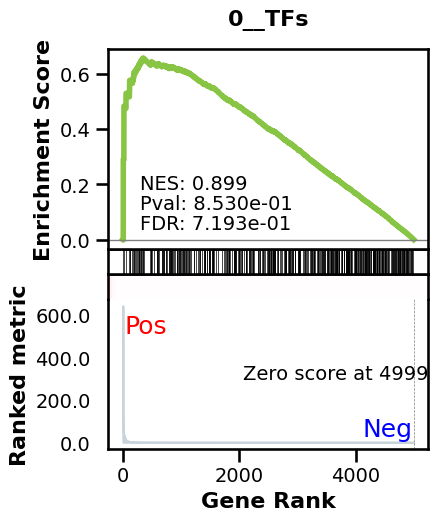

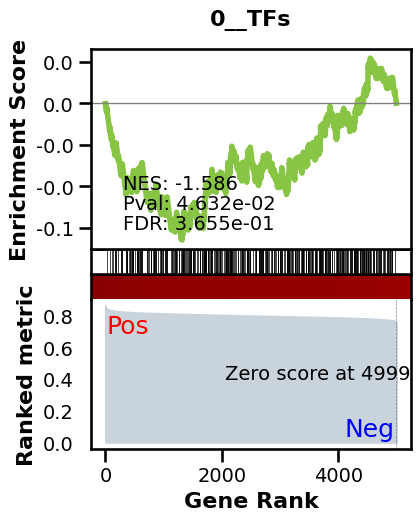

_________________________________________
TF specific enrichment


found some significant results for  10.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.0007672685726278598 
recall:  1.0 
random precision: 0.0007674970623755156


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 57.38it/s]

  9%|▉         | 12/128 [00:00<00:02, 56.57it/s]

 14%|█▍        | 18/128 [00:00<00:01, 56.12it/s]

 19%|█▉        | 24/128 [00:00<00:01, 55.17it/s]

 23%|██▎       | 30/128 [00:00<00:01, 54.77it/s]

 28%|██▊       | 36/128 [00:00<00:01, 54.65it/s]

 33%|███▎      | 42/128 [00:00<00:01, 54.45it/s]

 38%|███▊      | 48/128 [00:00<00:01, 53.68it/s]

 42%|████▏     | 54/128 [00:00<00:01, 53.43it/s]

 47%|████▋     | 60/128 [00:01<00:01, 53.84it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 54.40it/s]

 56%|█████▋    | 72/128 [00:01<00:01, 55.26it/s]

 61%|██████    | 78/128 [00:01<00:00, 56.16it/s]

 66%|██████▌   | 84/128 [00:01<00:00, 56.44it/s]

 70%|███████   | 90/128 [00:01<00:00, 57.17it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 57.49it/s]

 80%|███████▉  | 102/128 [00:01<00:00, 57.73it/s]

 84%|████████▍ | 108/128 [00:01<00:00, 57.55it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 57.04it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 56.11it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 55.57it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 55.60it/s]

Average Precision (AP):  0.0008219677148834056
Area Under Precision-Recall Curve (AUPRC):  0.0008201634543030816
EPR: 1.3552987525897235


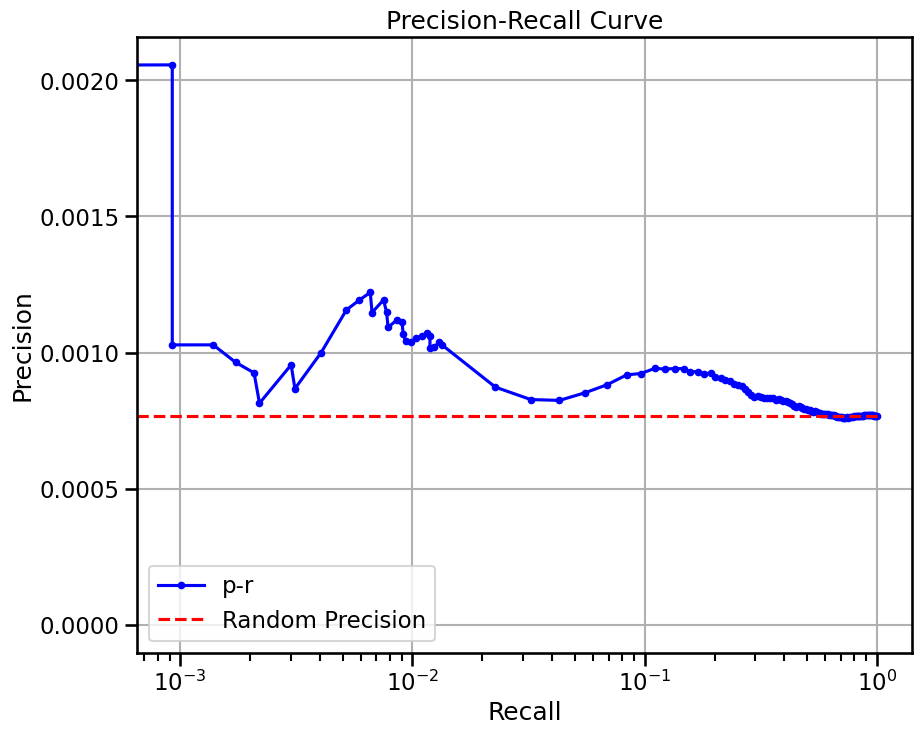

base enrichment


Top central genes: []


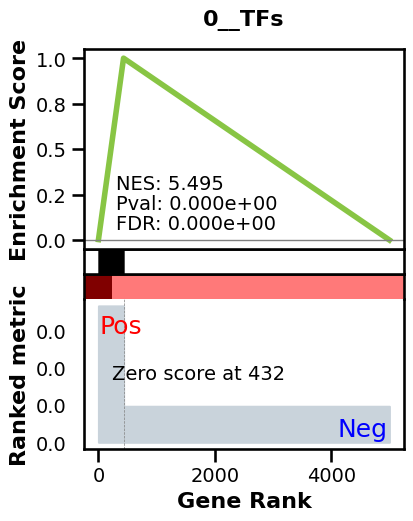

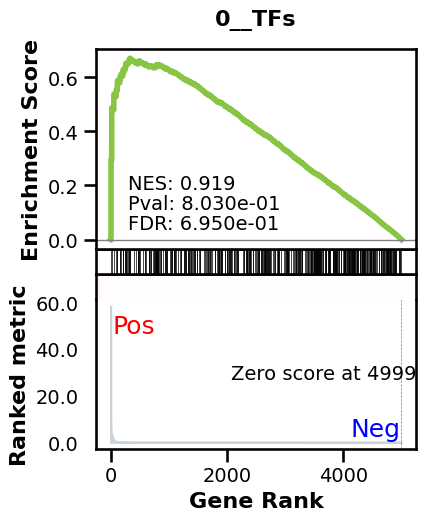

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.002657346649973288 
recall:  0.37634284394131917 
random precision: 0.0007674970623755156


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 54.89it/s]

  9%|▉         | 12/128 [00:00<00:02, 55.72it/s]

 14%|█▍        | 18/128 [00:00<00:01, 56.33it/s]

 19%|█▉        | 24/128 [00:00<00:01, 56.92it/s]

 23%|██▎       | 30/128 [00:00<00:01, 57.52it/s]

 28%|██▊       | 36/128 [00:00<00:01, 57.83it/s]

 33%|███▎      | 42/128 [00:00<00:01, 57.77it/s]

 38%|███▊      | 48/128 [00:00<00:01, 56.85it/s]

 42%|████▏     | 54/128 [00:00<00:01, 56.15it/s]

 47%|████▋     | 60/128 [00:01<00:01, 55.19it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 54.45it/s]

 56%|█████▋    | 72/128 [00:01<00:01, 54.27it/s]

 61%|██████    | 78/128 [00:01<00:00, 54.20it/s]

 66%|██████▌   | 84/128 [00:01<00:00, 54.19it/s]

 70%|███████   | 90/128 [00:01<00:00, 54.20it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 54.53it/s]

 80%|███████▉  | 102/128 [00:01<00:00, 55.26it/s]

 84%|████████▍ | 108/128 [00:01<00:00, 55.99it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 56.44it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 57.24it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 57.78it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 56.05it/s]

Average Precision (AP):  0.0017595912774399666
Area Under Precision-Recall Curve (AUPRC):  0.0014749116412873329
EPR: 3.930752156534792


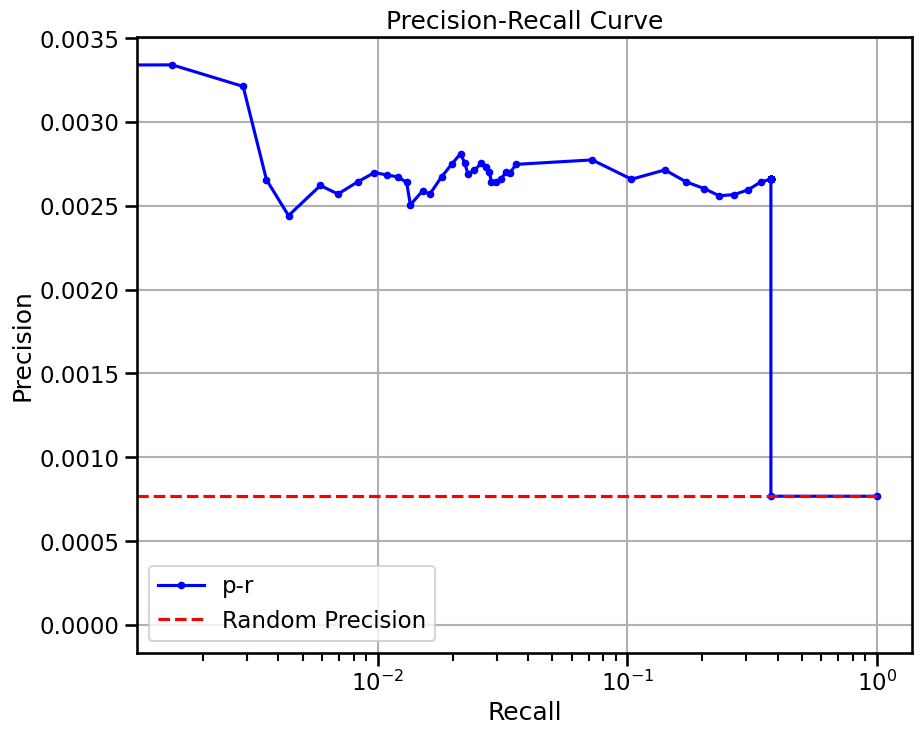

base enrichment


Top central genes: []
The DataFrame contains only the same values.


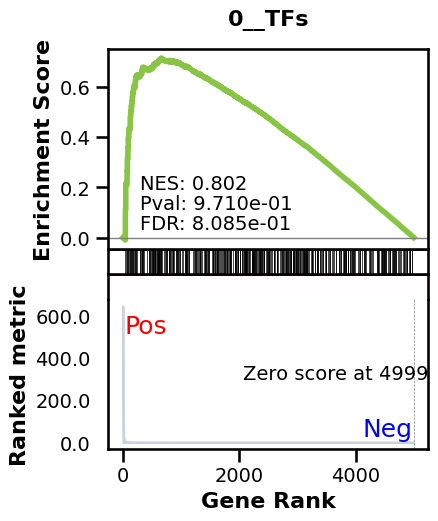

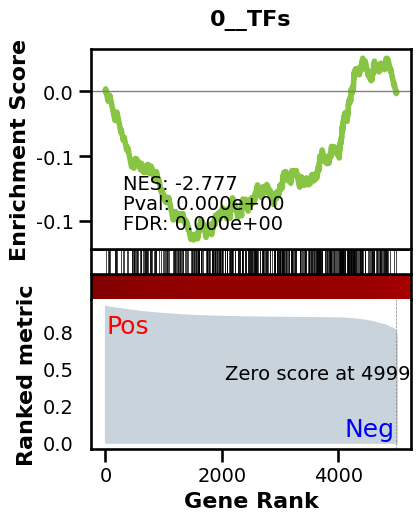

_________________________________________
TF specific enrichment


found some significant results for  3.3333333333333335 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.0007672685726278598 
recall:  1.0 
random precision: 0.0007674970623755156


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 54.55it/s]

  9%|▉         | 12/128 [00:00<00:02, 54.66it/s]

 14%|█▍        | 18/128 [00:00<00:02, 54.04it/s]

 19%|█▉        | 24/128 [00:00<00:01, 53.65it/s]

 23%|██▎       | 30/128 [00:00<00:01, 53.54it/s]

 28%|██▊       | 36/128 [00:00<00:01, 53.28it/s]

 33%|███▎      | 42/128 [00:00<00:01, 53.48it/s]

 38%|███▊      | 48/128 [00:00<00:01, 54.43it/s]

 42%|████▏     | 54/128 [00:00<00:01, 55.22it/s]

 47%|████▋     | 60/128 [00:01<00:01, 55.85it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 56.40it/s]

 56%|█████▋    | 72/128 [00:01<00:00, 56.56it/s]

 61%|██████    | 78/128 [00:01<00:00, 57.03it/s]

 66%|██████▌   | 84/128 [00:01<00:00, 57.47it/s]

 70%|███████   | 90/128 [00:01<00:00, 57.50it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 57.08it/s]

 80%|███████▉  | 102/128 [00:01<00:00, 56.64it/s]

 84%|████████▍ | 108/128 [00:01<00:00, 56.55it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 56.11it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 54.49it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 53.75it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 55.15it/s]

Average Precision (AP):  0.000783519891956153
Area Under Precision-Recall Curve (AUPRC):  0.0007834514362512937
EPR: 1.2044313335913635


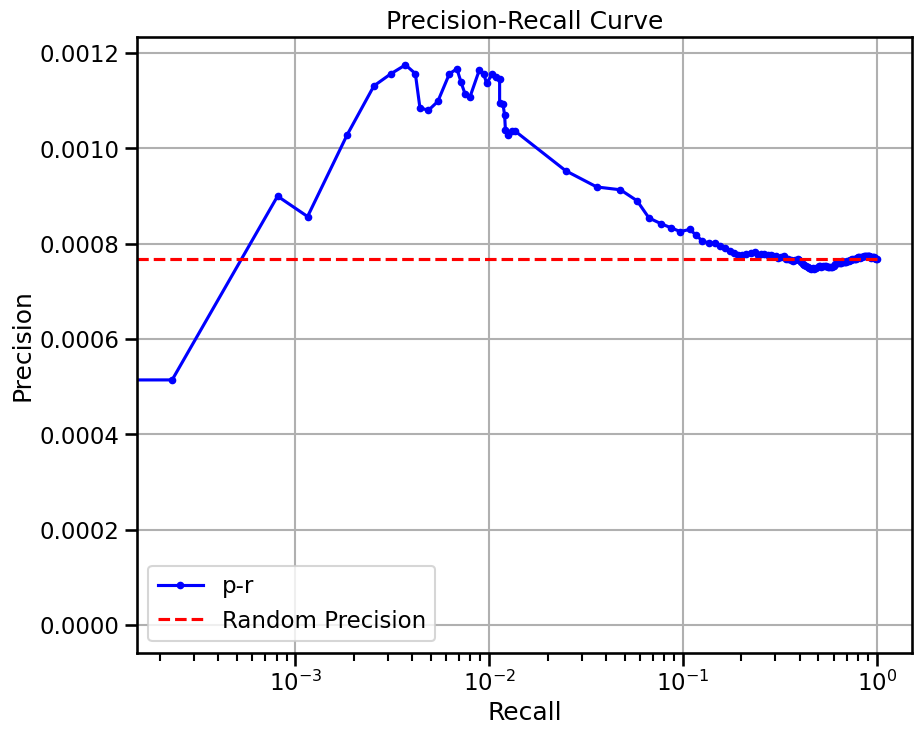

base enrichment


Top central genes: []


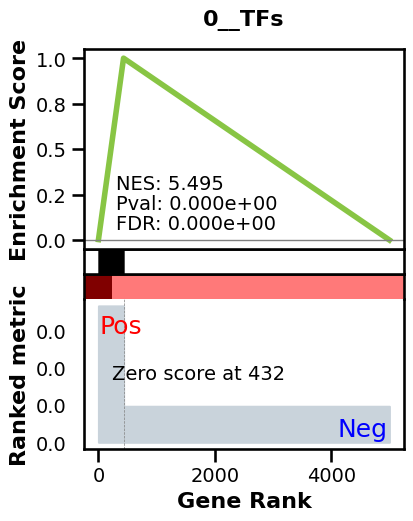

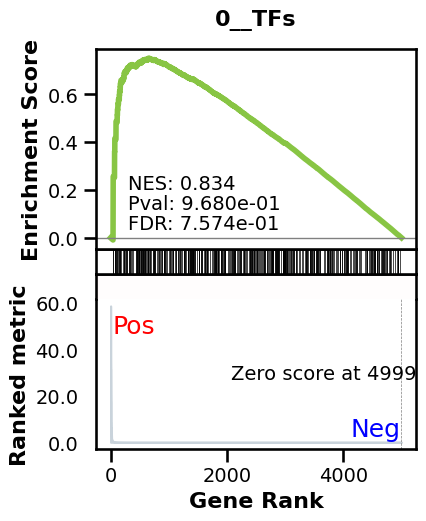

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3359 genes
intersection pct: 0.6718
precision:  0.002657346649973288 
recall:  0.37634284394131917 
random precision: 0.0007674970623755156


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 58.87it/s]

  9%|▉         | 12/128 [00:00<00:02, 57.84it/s]

 14%|█▍        | 18/128 [00:00<00:01, 57.46it/s]

 19%|█▉        | 24/128 [00:00<00:01, 57.72it/s]

 23%|██▎       | 30/128 [00:00<00:01, 57.99it/s]

 28%|██▊       | 36/128 [00:00<00:01, 58.22it/s]

 33%|███▎      | 42/128 [00:00<00:01, 58.48it/s]

 38%|███▊      | 48/128 [00:00<00:01, 58.91it/s]

 42%|████▏     | 54/128 [00:00<00:01, 58.83it/s]

 48%|████▊     | 61/128 [00:01<00:01, 59.71it/s]

 53%|█████▎    | 68/128 [00:01<00:00, 60.26it/s]

 59%|█████▊    | 75/128 [00:01<00:00, 60.35it/s]

 64%|██████▍   | 82/128 [00:01<00:00, 59.88it/s]

 69%|██████▉   | 88/128 [00:01<00:00, 59.05it/s]

 73%|███████▎  | 94/128 [00:01<00:00, 58.83it/s]

 78%|███████▊  | 100/128 [00:01<00:00, 58.36it/s]

 83%|████████▎ | 106/128 [00:01<00:00, 57.36it/s]

 88%|████████▊ | 112/128 [00:01<00:00, 56.13it/s]

 92%|█████████▏| 118/128 [00:02<00:00, 55.51it/s]

 97%|█████████▋| 124/128 [00:02<00:00, 55.64it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 57.92it/s]

Average Precision (AP):  0.0017831491282893318
Area Under Precision-Recall Curve (AUPRC):  0.0015273352955521408
EPR: 4.235080961510411


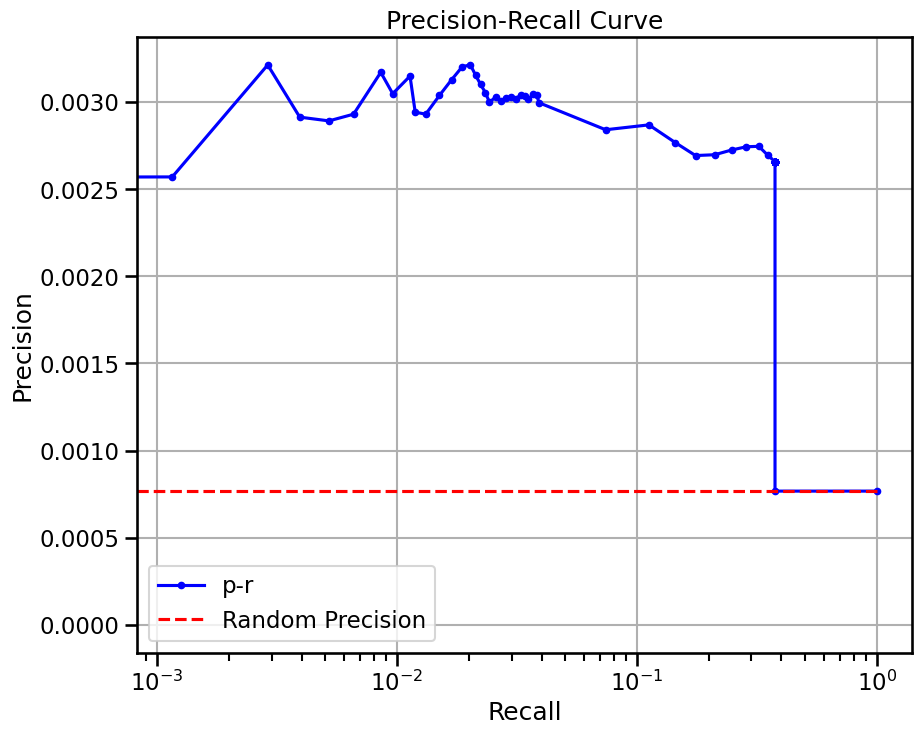

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:03<01:33,  3.03s/it]

  6%|▋         | 2/32 [00:04<00:55,  1.85s/it]

  9%|▉         | 3/32 [00:05<00:43,  1.48s/it]

 12%|█▎        | 4/32 [00:06<00:36,  1.29s/it]

 16%|█▌        | 5/32 [00:07<00:32,  1.21s/it]

 19%|█▉        | 6/32 [00:08<00:28,  1.11s/it]

 22%|██▏       | 7/32 [00:10<00:36,  1.45s/it]

 25%|██▌       | 8/32 [00:11<00:31,  1.33s/it]

 28%|██▊       | 9/32 [00:13<00:35,  1.53s/it]

 31%|███▏      | 10/32 [00:14<00:30,  1.40s/it]

 34%|███▍      | 11/32 [00:15<00:27,  1.29s/it]

 38%|███▊      | 12/32 [00:16<00:24,  1.23s/it]

 41%|████      | 13/32 [00:17<00:22,  1.17s/it]

 44%|████▍     | 14/32 [00:18<00:20,  1.15s/it]

 47%|████▋     | 15/32 [00:19<00:19,  1.13s/it]

 50%|█████     | 16/32 [00:20<00:17,  1.12s/it]

 53%|█████▎    | 17/32 [00:22<00:18,  1.25s/it]

 56%|█████▋    | 18/32 [00:23<00:16,  1.19s/it]

 59%|█████▉    | 19/32 [00:24<00:15,  1.16s/it]

 62%|██████▎   | 20/32 [00:25<00:13,  1.13s/it]

 66%|██████▌   | 21/32 [00:26<00:12,  1.13s/it]

 69%|██████▉   | 22/32 [00:27<00:10,  1.08s/it]

 72%|███████▏  | 23/32 [00:28<00:09,  1.07s/it]

 75%|███████▌  | 24/32 [00:29<00:08,  1.05s/it]

 78%|███████▊  | 25/32 [00:30<00:07,  1.07s/it]

 81%|████████▏ | 26/32 [00:31<00:06,  1.03s/it]

 84%|████████▍ | 27/32 [00:32<00:05,  1.03s/it]

 88%|████████▊ | 28/32 [00:33<00:04,  1.02s/it]

 91%|█████████ | 29/32 [00:35<00:03,  1.27s/it]

 94%|█████████▍| 30/32 [00:36<00:02,  1.19s/it]

 97%|█████████▋| 31/32 [00:38<00:01,  1.25s/it]

100%|██████████| 32/32 [00:39<00:00,  1.19s/it]

100%|██████████| 32/32 [00:39<00:00,  1.23s/it]

avg link count: 536246649, sparsity: 1.0


base enrichment


too many genes for central computation


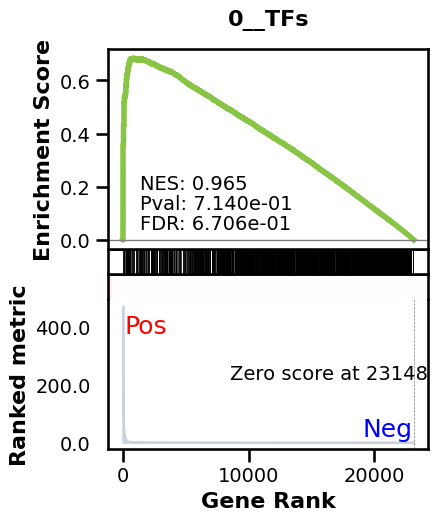

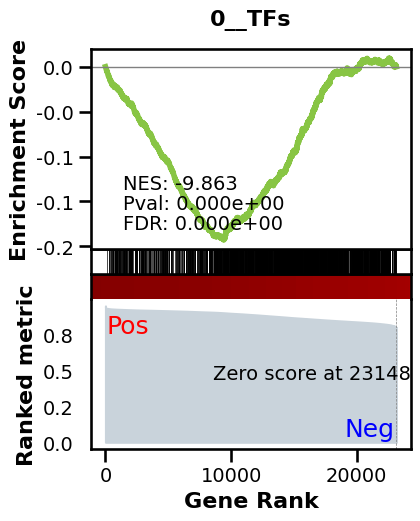

_________________________________________
TF specific enrichment


found some significant results for  41.07142857142857 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12463 genes
intersection pct: 0.5383817875502181


precision:  0.0006618214377693767 
recall:  1.0 
random precision: 0.0006618672671051408


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:53,  2.38it/s]

  2%|▏         | 2/128 [00:00<00:54,  2.30it/s]

  2%|▏         | 3/128 [00:01<00:57,  2.18it/s]

  3%|▎         | 4/128 [00:01<00:58,  2.13it/s]

  4%|▍         | 5/128 [00:02<00:55,  2.23it/s]

  5%|▍         | 6/128 [00:02<00:54,  2.25it/s]

  5%|▌         | 7/128 [00:03<00:55,  2.18it/s]

  6%|▋         | 8/128 [00:03<00:55,  2.16it/s]

  7%|▋         | 9/128 [00:04<00:53,  2.22it/s]

  8%|▊         | 10/128 [00:04<00:52,  2.24it/s]

  9%|▊         | 11/128 [00:04<00:53,  2.20it/s]

  9%|▉         | 12/128 [00:05<00:53,  2.17it/s]

 10%|█         | 13/128 [00:05<00:51,  2.23it/s]

 11%|█         | 14/128 [00:06<00:51,  2.23it/s]

 12%|█▏        | 15/128 [00:06<00:51,  2.19it/s]

 12%|█▎        | 16/128 [00:07<00:51,  2.19it/s]

 13%|█▎        | 17/128 [00:07<00:50,  2.18it/s]

 14%|█▍        | 18/128 [00:08<00:49,  2.21it/s]

 15%|█▍        | 19/128 [00:08<00:49,  2.22it/s]

 16%|█▌        | 20/128 [00:08<00:46,  2.33it/s]

 16%|█▋        | 21/128 [00:09<00:48,  2.22it/s]

 17%|█▋        | 22/128 [00:09<00:47,  2.23it/s]

 18%|█▊        | 23/128 [00:10<00:46,  2.26it/s]

 19%|█▉        | 24/128 [00:10<00:45,  2.28it/s]

 20%|█▉        | 25/128 [00:11<00:45,  2.25it/s]

 20%|██        | 26/128 [00:11<00:46,  2.20it/s]

 21%|██        | 27/128 [00:12<00:45,  2.23it/s]

 22%|██▏       | 28/128 [00:12<00:44,  2.23it/s]

 23%|██▎       | 29/128 [00:13<00:45,  2.19it/s]

 23%|██▎       | 30/128 [00:13<00:45,  2.17it/s]

 24%|██▍       | 31/128 [00:13<00:43,  2.21it/s]

 25%|██▌       | 32/128 [00:14<00:43,  2.23it/s]

 26%|██▌       | 33/128 [00:14<00:43,  2.19it/s]

 27%|██▋       | 34/128 [00:15<00:43,  2.16it/s]

 27%|██▋       | 35/128 [00:15<00:42,  2.17it/s]

 28%|██▊       | 36/128 [00:16<00:43,  2.12it/s]

 29%|██▉       | 37/128 [00:16<00:43,  2.11it/s]

 30%|██▉       | 38/128 [00:17<00:43,  2.06it/s]

 30%|███       | 39/128 [00:17<00:43,  2.05it/s]

 31%|███▏      | 40/128 [00:18<00:40,  2.18it/s]

 32%|███▏      | 41/128 [00:18<00:37,  2.31it/s]

 33%|███▎      | 42/128 [00:18<00:35,  2.42it/s]

 34%|███▎      | 43/128 [00:19<00:33,  2.55it/s]

 34%|███▍      | 44/128 [00:19<00:32,  2.59it/s]

 35%|███▌      | 45/128 [00:20<00:32,  2.57it/s]

 36%|███▌      | 46/128 [00:20<00:31,  2.58it/s]

 37%|███▋      | 47/128 [00:20<00:30,  2.66it/s]

 38%|███▊      | 48/128 [00:21<00:29,  2.68it/s]

 38%|███▊      | 49/128 [00:21<00:29,  2.66it/s]

 39%|███▉      | 50/128 [00:21<00:29,  2.66it/s]

 40%|███▉      | 51/128 [00:22<00:28,  2.69it/s]

 41%|████      | 52/128 [00:22<00:28,  2.71it/s]

 41%|████▏     | 53/128 [00:23<00:27,  2.70it/s]

 42%|████▏     | 54/128 [00:23<00:27,  2.70it/s]

 43%|████▎     | 55/128 [00:23<00:27,  2.66it/s]

 44%|████▍     | 56/128 [00:24<00:27,  2.62it/s]

 45%|████▍     | 57/128 [00:24<00:26,  2.65it/s]

 45%|████▌     | 58/128 [00:24<00:25,  2.74it/s]

 46%|████▌     | 59/128 [00:25<00:25,  2.70it/s]

 47%|████▋     | 60/128 [00:25<00:25,  2.68it/s]

 48%|████▊     | 61/128 [00:26<00:25,  2.66it/s]

 48%|████▊     | 62/128 [00:26<00:24,  2.73it/s]

 49%|████▉     | 63/128 [00:26<00:23,  2.76it/s]

 50%|█████     | 64/128 [00:27<00:23,  2.71it/s]

 51%|█████     | 65/128 [00:27<00:23,  2.65it/s]

 52%|█████▏    | 66/128 [00:27<00:23,  2.66it/s]

 52%|█████▏    | 67/128 [00:28<00:22,  2.70it/s]

 53%|█████▎    | 68/128 [00:28<00:21,  2.74it/s]

 54%|█████▍    | 69/128 [00:28<00:21,  2.70it/s]

 55%|█████▍    | 70/128 [00:29<00:21,  2.68it/s]

 55%|█████▌    | 71/128 [00:29<00:21,  2.69it/s]

 56%|█████▋    | 72/128 [00:30<00:20,  2.71it/s]

 57%|█████▋    | 73/128 [00:30<00:20,  2.73it/s]

 58%|█████▊    | 74/128 [00:30<00:19,  2.71it/s]

 59%|█████▊    | 75/128 [00:31<00:19,  2.69it/s]

 59%|█████▉    | 76/128 [00:31<00:19,  2.71it/s]

 60%|██████    | 77/128 [00:31<00:18,  2.75it/s]

 61%|██████    | 78/128 [00:32<00:18,  2.65it/s]

 62%|██████▏   | 79/128 [00:32<00:18,  2.68it/s]

 62%|██████▎   | 80/128 [00:33<00:17,  2.71it/s]

 63%|██████▎   | 81/128 [00:33<00:17,  2.71it/s]

 64%|██████▍   | 82/128 [00:33<00:17,  2.68it/s]

 65%|██████▍   | 83/128 [00:34<00:16,  2.67it/s]

 66%|██████▌   | 84/128 [00:34<00:16,  2.69it/s]

 66%|██████▋   | 85/128 [00:34<00:15,  2.73it/s]

 67%|██████▋   | 86/128 [00:35<00:15,  2.75it/s]

 68%|██████▊   | 87/128 [00:35<00:15,  2.72it/s]

 69%|██████▉   | 88/128 [00:35<00:14,  2.71it/s]

 70%|██████▉   | 89/128 [00:36<00:14,  2.72it/s]

 70%|███████   | 90/128 [00:36<00:14,  2.66it/s]

 71%|███████   | 91/128 [00:37<00:13,  2.74it/s]

 72%|███████▏  | 92/128 [00:37<00:12,  2.77it/s]

 73%|███████▎  | 93/128 [00:37<00:12,  2.73it/s]

 73%|███████▎  | 94/128 [00:38<00:13,  2.60it/s]

 74%|███████▍  | 95/128 [00:38<00:12,  2.63it/s]

 75%|███████▌  | 96/128 [00:38<00:11,  2.71it/s]

 76%|███████▌  | 97/128 [00:39<00:11,  2.69it/s]

 77%|███████▋  | 98/128 [00:39<00:11,  2.64it/s]

 77%|███████▋  | 99/128 [00:40<00:11,  2.60it/s]

 78%|███████▊  | 100/128 [00:40<00:10,  2.66it/s]

 79%|███████▉  | 101/128 [00:40<00:10,  2.67it/s]

 80%|███████▉  | 102/128 [00:41<00:09,  2.73it/s]

 80%|████████  | 103/128 [00:41<00:09,  2.68it/s]

 81%|████████▏ | 104/128 [00:41<00:09,  2.65it/s]

 82%|████████▏ | 105/128 [00:42<00:09,  2.54it/s]

 83%|████████▎ | 106/128 [00:42<00:08,  2.53it/s]

 84%|████████▎ | 107/128 [00:43<00:08,  2.47it/s]

 84%|████████▍ | 108/128 [00:43<00:08,  2.39it/s]

 85%|████████▌ | 109/128 [00:44<00:07,  2.39it/s]

 86%|████████▌ | 110/128 [00:44<00:07,  2.40it/s]

 87%|████████▋ | 111/128 [00:44<00:07,  2.38it/s]

 88%|████████▊ | 112/128 [00:45<00:06,  2.37it/s]

 88%|████████▊ | 113/128 [00:45<00:06,  2.38it/s]

 89%|████████▉ | 114/128 [00:46<00:05,  2.40it/s]

 90%|████████▉ | 115/128 [00:46<00:05,  2.38it/s]

 91%|█████████ | 116/128 [00:47<00:05,  2.34it/s]

 91%|█████████▏| 117/128 [00:47<00:04,  2.36it/s]

 92%|█████████▏| 118/128 [00:47<00:04,  2.38it/s]

 93%|█████████▎| 119/128 [00:48<00:03,  2.39it/s]

 94%|█████████▍| 120/128 [00:48<00:03,  2.37it/s]

 95%|█████████▍| 121/128 [00:49<00:02,  2.38it/s]

 95%|█████████▌| 122/128 [00:49<00:02,  2.38it/s]

 96%|█████████▌| 123/128 [00:49<00:02,  2.40it/s]

 97%|█████████▋| 124/128 [00:50<00:01,  2.38it/s]

 98%|█████████▊| 125/128 [00:50<00:01,  2.38it/s]

 98%|█████████▊| 126/128 [00:51<00:00,  2.35it/s]

 99%|█████████▉| 127/128 [00:51<00:00,  2.36it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:52<00:00,  2.32it/s]

100%|██████████| 128/128 [00:52<00:00,  2.46it/s]

Average Precision (AP):  0.0006399539281457358
Area Under Precision-Recall Curve (AUPRC):  0.0006394339425206373


EPR: 2.401496855485344


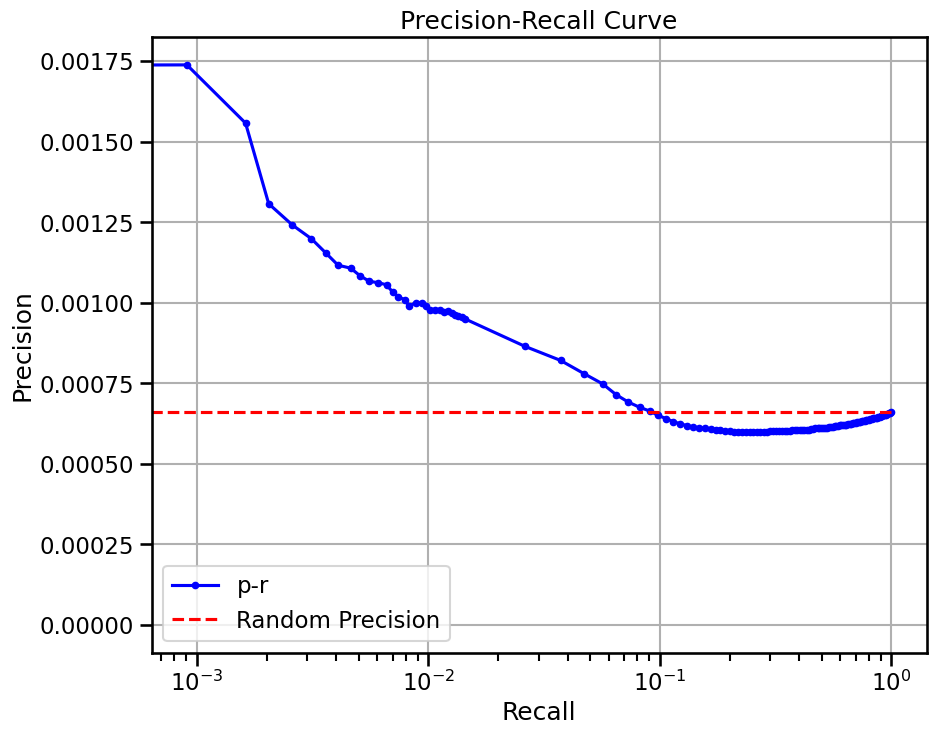

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:03<03:13,  3.07s/it]

  3%|▎         | 2/64 [00:04<02:14,  2.17s/it]

  5%|▍         | 3/64 [00:06<01:53,  1.87s/it]

  6%|▋         | 4/64 [00:07<01:42,  1.71s/it]

  8%|▊         | 5/64 [00:09<01:36,  1.64s/it]

  9%|▉         | 6/64 [00:10<01:32,  1.60s/it]

 11%|█         | 7/64 [00:12<01:29,  1.58s/it]

 12%|█▎        | 8/64 [00:13<01:26,  1.55s/it]

 14%|█▍        | 9/64 [00:15<01:24,  1.54s/it]

 16%|█▌        | 10/64 [00:16<01:22,  1.52s/it]

 17%|█▋        | 11/64 [00:18<01:19,  1.50s/it]

 19%|█▉        | 12/64 [00:19<01:17,  1.50s/it]

 20%|██        | 13/64 [00:21<01:17,  1.52s/it]

 22%|██▏       | 14/64 [00:22<01:15,  1.52s/it]

 23%|██▎       | 15/64 [00:24<01:13,  1.51s/it]

 25%|██▌       | 16/64 [00:25<01:12,  1.50s/it]

 27%|██▋       | 17/64 [00:27<01:10,  1.50s/it]

 28%|██▊       | 18/64 [00:28<01:07,  1.46s/it]

 30%|██▉       | 19/64 [00:29<01:04,  1.44s/it]

 31%|███▏      | 20/64 [00:31<01:03,  1.44s/it]

 33%|███▎      | 21/64 [00:32<01:01,  1.44s/it]

 34%|███▍      | 22/64 [00:34<00:59,  1.43s/it]

 36%|███▌      | 23/64 [00:35<00:58,  1.43s/it]

 38%|███▊      | 24/64 [00:37<00:56,  1.42s/it]

 39%|███▉      | 25/64 [00:38<00:55,  1.43s/it]

 41%|████      | 26/64 [00:39<00:53,  1.42s/it]

 42%|████▏     | 27/64 [00:41<00:51,  1.41s/it]

 44%|████▍     | 28/64 [00:42<00:50,  1.41s/it]

 45%|████▌     | 29/64 [00:44<00:48,  1.40s/it]

 47%|████▋     | 30/64 [00:45<00:47,  1.38s/it]

 48%|████▊     | 31/64 [00:46<00:45,  1.39s/it]

 50%|█████     | 32/64 [00:48<00:44,  1.38s/it]

 52%|█████▏    | 33/64 [00:49<00:42,  1.36s/it]

 53%|█████▎    | 34/64 [00:50<00:41,  1.38s/it]

 55%|█████▍    | 35/64 [00:52<00:40,  1.38s/it]

 56%|█████▋    | 36/64 [00:53<00:38,  1.37s/it]

 58%|█████▊    | 37/64 [00:54<00:36,  1.37s/it]

 59%|█████▉    | 38/64 [00:56<00:35,  1.36s/it]

 61%|██████    | 39/64 [00:57<00:33,  1.35s/it]

 62%|██████▎   | 40/64 [00:58<00:32,  1.34s/it]

 64%|██████▍   | 41/64 [01:00<00:30,  1.34s/it]

 66%|██████▌   | 42/64 [01:01<00:29,  1.34s/it]

 67%|██████▋   | 43/64 [01:03<00:28,  1.38s/it]

 69%|██████▉   | 44/64 [01:04<00:27,  1.39s/it]

 70%|███████   | 45/64 [01:05<00:26,  1.41s/it]

 72%|███████▏  | 46/64 [01:07<00:25,  1.41s/it]

 73%|███████▎  | 47/64 [01:08<00:23,  1.40s/it]

 75%|███████▌  | 48/64 [01:10<00:22,  1.40s/it]

 77%|███████▋  | 49/64 [01:11<00:21,  1.42s/it]

 78%|███████▊  | 50/64 [01:13<00:19,  1.43s/it]

 80%|███████▉  | 51/64 [01:14<00:18,  1.43s/it]

 81%|████████▏ | 52/64 [01:15<00:17,  1.42s/it]

 83%|████████▎ | 53/64 [01:17<00:16,  1.49s/it]

 84%|████████▍ | 54/64 [01:18<00:14,  1.46s/it]

 86%|████████▌ | 55/64 [01:20<00:13,  1.45s/it]

 88%|████████▊ | 56/64 [01:21<00:11,  1.45s/it]

 89%|████████▉ | 57/64 [01:23<00:10,  1.45s/it]

 91%|█████████ | 58/64 [01:24<00:08,  1.44s/it]

 92%|█████████▏| 59/64 [01:26<00:07,  1.43s/it]

 94%|█████████▍| 60/64 [01:27<00:05,  1.43s/it]

 95%|█████████▌| 61/64 [01:28<00:04,  1.43s/it]

 97%|█████████▋| 62/64 [01:30<00:02,  1.43s/it]

 98%|█████████▊| 63/64 [01:31<00:01,  1.43s/it]

100%|██████████| 64/64 [01:33<00:00,  1.41s/it]

100%|██████████| 64/64 [01:33<00:00,  1.46s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


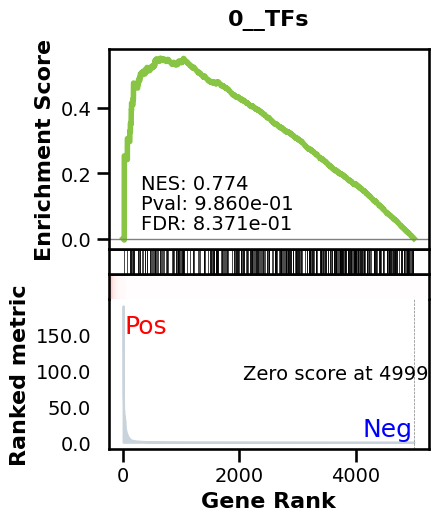

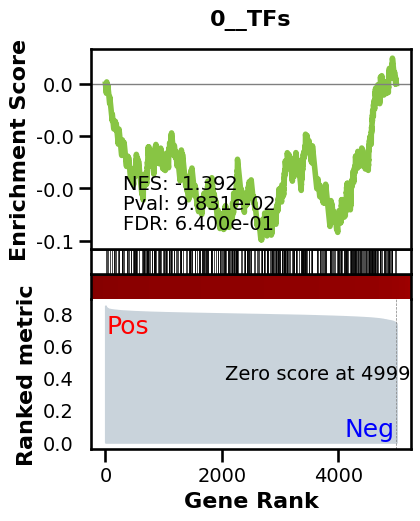

_________________________________________
TF specific enrichment


found some significant results for  3.5714285714285716 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0006722946797520661 
recall:  1.0 
random precision: 0.0006724857268335529


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 48.09it/s]

  8%|▊         | 10/128 [00:00<00:02, 48.78it/s]

 12%|█▎        | 16/128 [00:00<00:02, 50.88it/s]

 17%|█▋        | 22/128 [00:00<00:02, 51.50it/s]

 22%|██▏       | 28/128 [00:00<00:01, 52.24it/s]

 27%|██▋       | 34/128 [00:00<00:01, 52.40it/s]

 31%|███▏      | 40/128 [00:00<00:01, 52.47it/s]

 36%|███▌      | 46/128 [00:00<00:01, 52.01it/s]

 41%|████      | 52/128 [00:01<00:01, 51.32it/s]

 45%|████▌     | 58/128 [00:01<00:01, 51.02it/s]

 50%|█████     | 64/128 [00:01<00:01, 50.28it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 50.12it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 49.74it/s]

 63%|██████▎   | 81/128 [00:01<00:00, 49.09it/s]

 67%|██████▋   | 86/128 [00:01<00:00, 48.56it/s]

 71%|███████   | 91/128 [00:01<00:00, 48.34it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 48.45it/s]

 79%|███████▉  | 101/128 [00:02<00:00, 48.60it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 48.85it/s]

 88%|████████▊ | 112/128 [00:02<00:00, 49.74it/s]

 92%|█████████▏| 118/128 [00:02<00:00, 50.57it/s]

 97%|█████████▋| 124/128 [00:02<00:00, 50.91it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 50.34it/s]

Average Precision (AP):  0.0007204726228216037
Area Under Precision-Recall Curve (AUPRC):  0.0007204337784150512
EPR: 0.5352068388595964


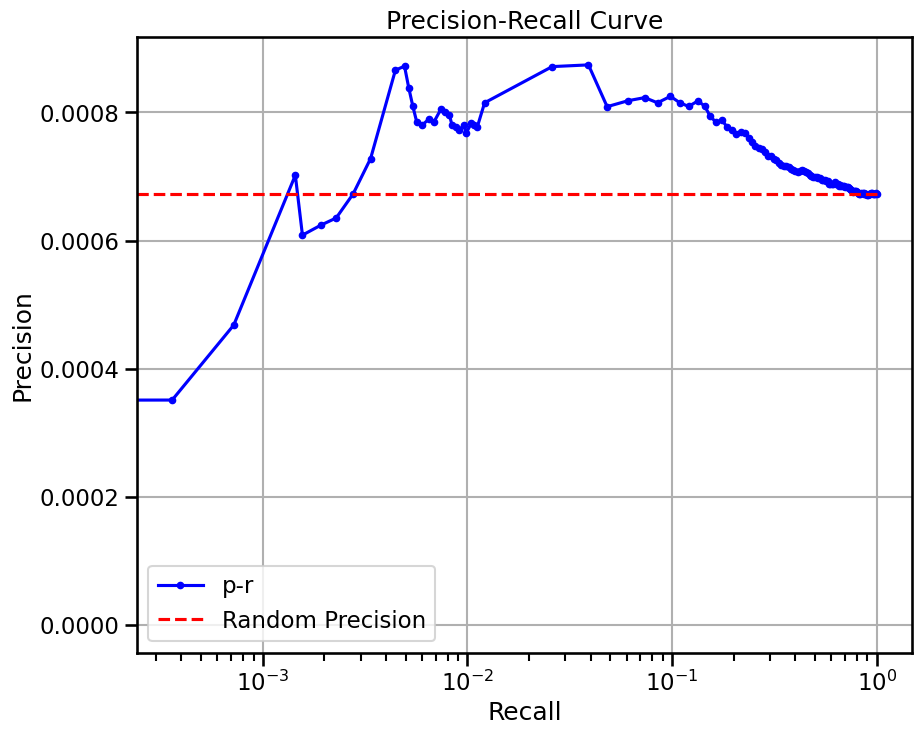

base enrichment


Top central genes: []


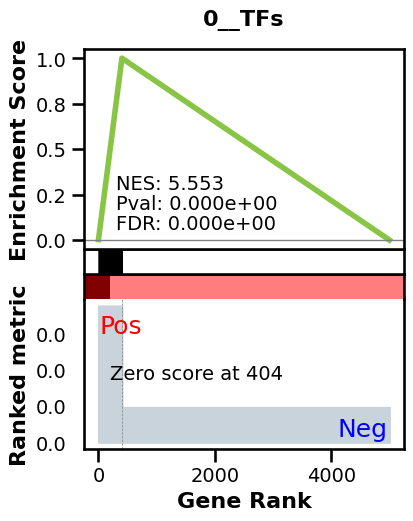

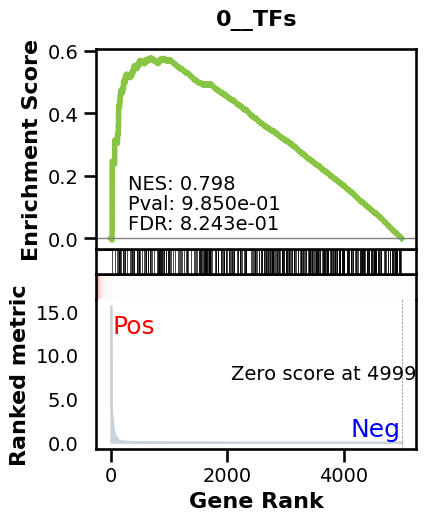

_________________________________________
TF specific enrichment


found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0016893262987012986 
recall:  0.2398559423769508 
random precision: 0.0006724857268335529


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 49.00it/s]

  8%|▊         | 10/128 [00:00<00:02, 49.31it/s]

 12%|█▎        | 16/128 [00:00<00:02, 49.82it/s]

 16%|█▋        | 21/128 [00:00<00:02, 49.36it/s]

 20%|██        | 26/128 [00:00<00:02, 49.21it/s]

 24%|██▍       | 31/128 [00:00<00:01, 49.33it/s]

 29%|██▉       | 37/128 [00:00<00:01, 49.58it/s]

 33%|███▎      | 42/128 [00:00<00:01, 49.20it/s]

 37%|███▋      | 47/128 [00:00<00:01, 48.91it/s]

 41%|████      | 52/128 [00:01<00:01, 48.29it/s]

 45%|████▍     | 57/128 [00:01<00:01, 48.48it/s]

 48%|████▊     | 62/128 [00:01<00:01, 48.92it/s]

 52%|█████▏    | 67/128 [00:01<00:01, 49.14it/s]

 57%|█████▋    | 73/128 [00:01<00:01, 49.96it/s]

 62%|██████▏   | 79/128 [00:01<00:00, 50.42it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 51.08it/s]

 71%|███████   | 91/128 [00:01<00:00, 51.17it/s]

 76%|███████▌  | 97/128 [00:01<00:00, 49.71it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 49.71it/s]

 84%|████████▍ | 108/128 [00:02<00:00, 49.89it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 50.37it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 50.62it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 49.88it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 49.67it/s]

Average Precision (AP):  0.0010821396739942942
Area Under Precision-Recall Curve (AUPRC):  0.000974425595452439
EPR: 2.8633730133630975


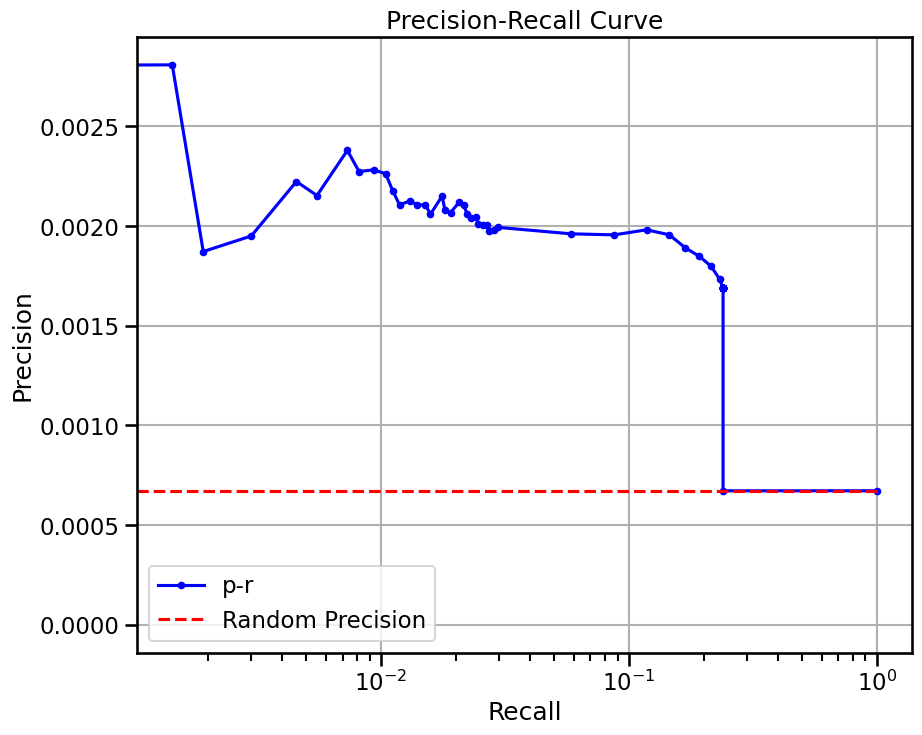

base enrichment


Top central genes: []
The DataFrame contains only the same values.


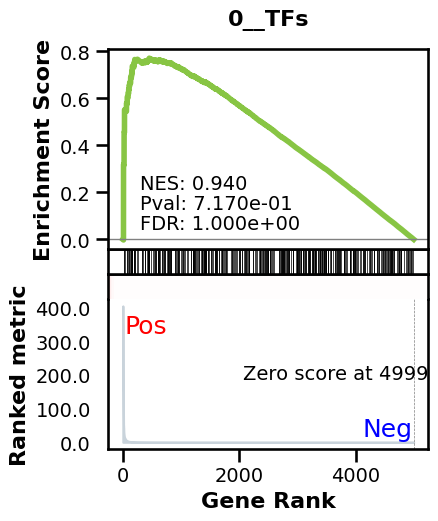

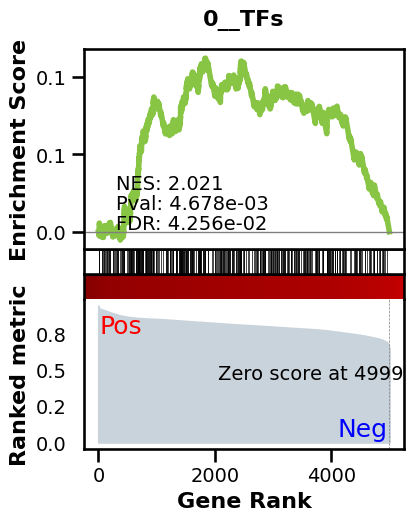

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0006722946797520661 
recall:  1.0 
random precision: 0.0006724857268335529


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 49.37it/s]

  8%|▊         | 10/128 [00:00<00:02, 49.23it/s]

 12%|█▏        | 15/128 [00:00<00:02, 49.28it/s]

 16%|█▌        | 20/128 [00:00<00:02, 49.17it/s]

 20%|█▉        | 25/128 [00:00<00:02, 48.82it/s]

 23%|██▎       | 30/128 [00:00<00:02, 48.13it/s]

 27%|██▋       | 35/128 [00:00<00:01, 47.97it/s]

 31%|███▏      | 40/128 [00:00<00:01, 47.92it/s]

 36%|███▌      | 46/128 [00:00<00:01, 48.95it/s]

 41%|████      | 52/128 [00:01<00:01, 50.33it/s]

 45%|████▌     | 58/128 [00:01<00:01, 51.12it/s]

 50%|█████     | 64/128 [00:01<00:01, 51.80it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 51.39it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 50.87it/s]

 64%|██████▍   | 82/128 [00:01<00:00, 50.67it/s]

 69%|██████▉   | 88/128 [00:01<00:00, 49.70it/s]

 73%|███████▎  | 93/128 [00:01<00:00, 49.39it/s]

 77%|███████▋  | 98/128 [00:01<00:00, 49.54it/s]

 80%|████████  | 103/128 [00:02<00:00, 49.60it/s]

 84%|████████▍ | 108/128 [00:02<00:00, 49.65it/s]

 88%|████████▊ | 113/128 [00:02<00:00, 49.08it/s]

 92%|█████████▏| 118/128 [00:02<00:00, 48.53it/s]

 96%|█████████▌| 123/128 [00:02<00:00, 48.76it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()


100%|██████████| 128/128 [00:02<00:00, 48.80it/s]

100%|██████████| 128/128 [00:02<00:00, 49.49it/s]

Average Precision (AP):  0.0006810431240760642
Area Under Precision-Recall Curve (AUPRC):  0.000679969478470061
EPR: 2.6837663424778047


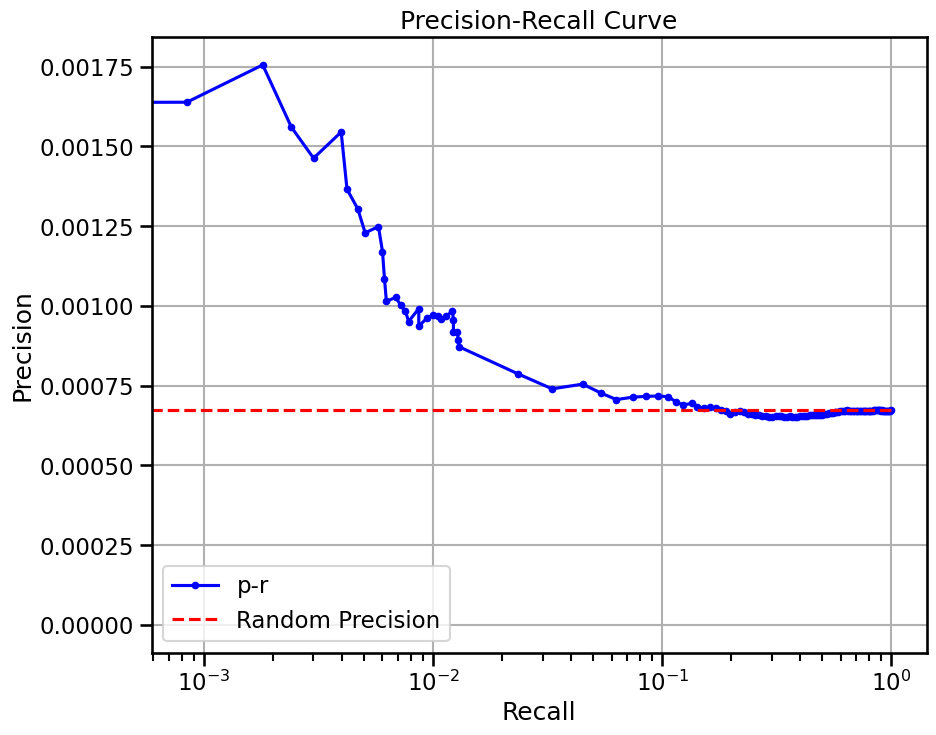

base enrichment


Top central genes: []


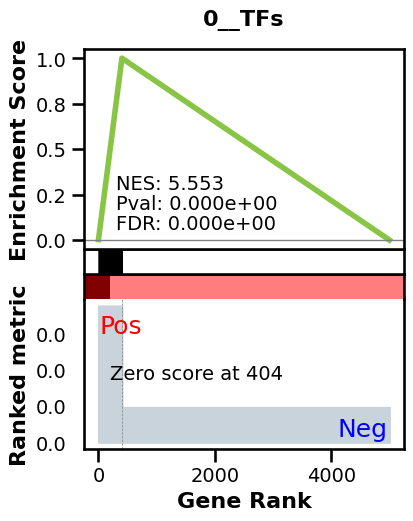

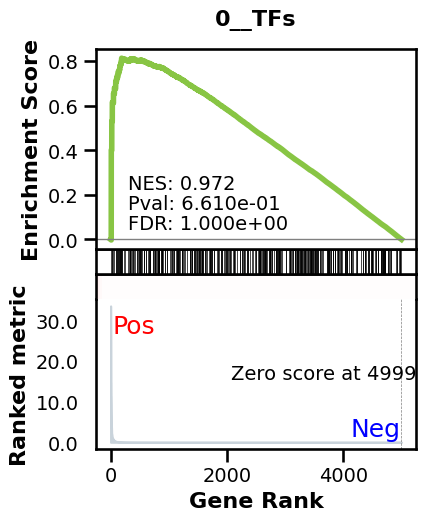

_________________________________________
TF specific enrichment


found some significant results for  10.714285714285714 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3520 genes
intersection pct: 0.704
precision:  0.0016893262987012986 
recall:  0.2398559423769508 
random precision: 0.0006724857268335529


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 48.98it/s]

  8%|▊         | 10/128 [00:00<00:02, 49.20it/s]

 12%|█▏        | 15/128 [00:00<00:02, 49.18it/s]

 16%|█▌        | 20/128 [00:00<00:02, 49.08it/s]

 20%|█▉        | 25/128 [00:00<00:02, 49.32it/s]

 23%|██▎       | 30/128 [00:00<00:01, 49.28it/s]

 27%|██▋       | 35/128 [00:00<00:01, 48.45it/s]

 32%|███▏      | 41/128 [00:00<00:01, 49.60it/s]

 37%|███▋      | 47/128 [00:00<00:01, 51.21it/s]

 41%|████▏     | 53/128 [00:01<00:01, 52.21it/s]

 46%|████▌     | 59/128 [00:01<00:01, 52.39it/s]

 51%|█████     | 65/128 [00:01<00:01, 52.23it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 52.15it/s]

 60%|██████    | 77/128 [00:01<00:00, 52.14it/s]

 65%|██████▍   | 83/128 [00:01<00:00, 51.09it/s]

 70%|██████▉   | 89/128 [00:01<00:00, 50.64it/s]

 74%|███████▍  | 95/128 [00:01<00:00, 50.39it/s]

 79%|███████▉  | 101/128 [00:01<00:00, 49.97it/s]

 84%|████████▎ | 107/128 [00:02<00:00, 49.69it/s]

 88%|████████▊ | 112/128 [00:02<00:00, 49.63it/s]

 92%|█████████▏| 118/128 [00:02<00:00, 50.25it/s]

 97%|█████████▋| 124/128 [00:02<00:00, 50.70it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 50.52it/s]

Average Precision (AP):  0.001017428306296528
Area Under Precision-Recall Curve (AUPRC):  0.0009076739292242401
EPR: 3.582663950034827


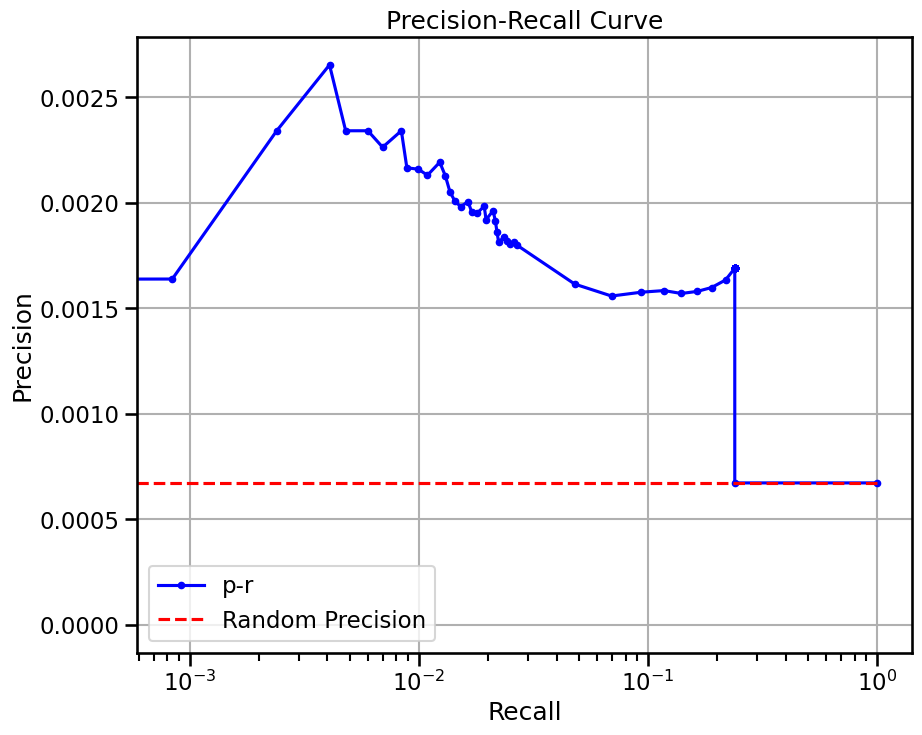

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:02<01:11,  2.31s/it]

  6%|▋         | 2/32 [00:03<00:44,  1.49s/it]

  9%|▉         | 3/32 [00:04<00:35,  1.24s/it]

 12%|█▎        | 4/32 [00:05<00:30,  1.10s/it]

 16%|█▌        | 5/32 [00:05<00:27,  1.03s/it]

 19%|█▉        | 6/32 [00:06<00:25,  1.01it/s]

 22%|██▏       | 7/32 [00:07<00:24,  1.04it/s]

 25%|██▌       | 8/32 [00:08<00:22,  1.07it/s]

 28%|██▊       | 9/32 [00:09<00:21,  1.08it/s]

 31%|███▏      | 10/32 [00:10<00:20,  1.10it/s]

 34%|███▍      | 11/32 [00:11<00:19,  1.10it/s]

 38%|███▊      | 12/32 [00:12<00:18,  1.10it/s]

 41%|████      | 13/32 [00:13<00:17,  1.10it/s]

 44%|████▍     | 14/32 [00:14<00:16,  1.11it/s]

 47%|████▋     | 15/32 [00:14<00:15,  1.11it/s]

 50%|█████     | 16/32 [00:15<00:14,  1.13it/s]

 53%|█████▎    | 17/32 [00:18<00:21,  1.46s/it]

 56%|█████▋    | 18/32 [00:19<00:18,  1.31s/it]

 59%|█████▉    | 19/32 [00:20<00:15,  1.22s/it]

 62%|██████▎   | 20/32 [00:21<00:13,  1.14s/it]

 66%|██████▌   | 21/32 [00:22<00:11,  1.09s/it]

 69%|██████▉   | 22/32 [00:23<00:10,  1.05s/it]

 72%|███████▏  | 23/32 [00:24<00:09,  1.02s/it]

 75%|███████▌  | 24/32 [00:25<00:08,  1.01s/it]

 78%|███████▊  | 25/32 [00:26<00:07,  1.02s/it]

 81%|████████▏ | 26/32 [00:27<00:05,  1.01it/s]

 84%|████████▍ | 27/32 [00:28<00:04,  1.00it/s]

 88%|████████▊ | 28/32 [00:29<00:03,  1.02it/s]

 91%|█████████ | 29/32 [00:30<00:02,  1.03it/s]

 94%|█████████▍| 30/32 [00:31<00:01,  1.02it/s]

 97%|█████████▋| 31/32 [00:32<00:00,  1.02it/s]

100%|██████████| 32/32 [00:33<00:00,  1.02it/s]

100%|██████████| 32/32 [00:33<00:00,  1.04s/it]

avg link count: 534904384, sparsity: 1.0


base enrichment


too many genes for central computation


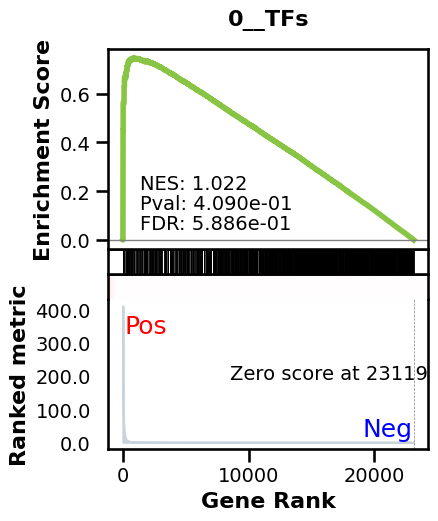

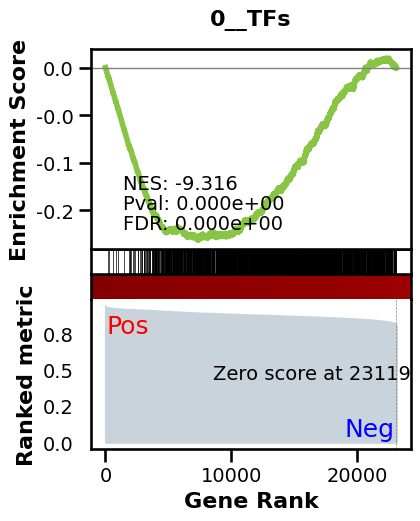

_________________________________________
TF specific enrichment


found some significant results for  34.82142857142857 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12455 genes
intersection pct: 0.5387110726643599


precision:  0.0006625615775268696 
recall:  1.0 
random precision: 0.0006626075185598419


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:43,  2.94it/s]

  2%|▏         | 2/128 [00:00<00:42,  2.94it/s]

  2%|▏         | 3/128 [00:01<00:44,  2.80it/s]

  3%|▎         | 4/128 [00:01<00:45,  2.73it/s]

  4%|▍         | 5/128 [00:01<00:45,  2.71it/s]

  5%|▍         | 6/128 [00:02<00:43,  2.80it/s]

  5%|▌         | 7/128 [00:02<00:42,  2.84it/s]

  6%|▋         | 8/128 [00:02<00:43,  2.76it/s]

  7%|▋         | 9/128 [00:03<00:43,  2.72it/s]

  8%|▊         | 10/128 [00:03<00:43,  2.72it/s]

  9%|▊         | 11/128 [00:03<00:41,  2.81it/s]

  9%|▉         | 12/128 [00:04<00:40,  2.84it/s]

 10%|█         | 13/128 [00:04<00:40,  2.83it/s]

 11%|█         | 14/128 [00:05<00:41,  2.77it/s]

 12%|█▏        | 15/128 [00:05<00:40,  2.76it/s]

 12%|█▎        | 16/128 [00:05<00:40,  2.75it/s]

 13%|█▎        | 17/128 [00:06<00:39,  2.81it/s]

 14%|█▍        | 18/128 [00:06<00:39,  2.77it/s]

 15%|█▍        | 19/128 [00:06<00:39,  2.77it/s]

 16%|█▌        | 20/128 [00:07<00:39,  2.76it/s]

 16%|█▋        | 21/128 [00:07<00:39,  2.73it/s]

 17%|█▋        | 22/128 [00:07<00:38,  2.76it/s]

 18%|█▊        | 23/128 [00:08<00:37,  2.80it/s]

 19%|█▉        | 24/128 [00:08<00:36,  2.83it/s]

 20%|█▉        | 25/128 [00:08<00:36,  2.80it/s]

 20%|██        | 26/128 [00:09<00:36,  2.76it/s]

 21%|██        | 27/128 [00:09<00:36,  2.73it/s]

 22%|██▏       | 28/128 [00:10<00:35,  2.79it/s]

 23%|██▎       | 29/128 [00:10<00:35,  2.83it/s]

 23%|██▎       | 30/128 [00:10<00:35,  2.76it/s]

 24%|██▍       | 31/128 [00:11<00:35,  2.73it/s]

 25%|██▌       | 32/128 [00:11<00:35,  2.72it/s]

 26%|██▌       | 33/128 [00:11<00:34,  2.77it/s]

 27%|██▋       | 34/128 [00:12<00:33,  2.83it/s]

 27%|██▋       | 35/128 [00:12<00:33,  2.79it/s]

 28%|██▊       | 36/128 [00:12<00:33,  2.77it/s]

 29%|██▉       | 37/128 [00:13<00:33,  2.75it/s]

 30%|██▉       | 38/128 [00:13<00:31,  2.83it/s]

 30%|███       | 39/128 [00:13<00:30,  2.88it/s]

 31%|███▏      | 40/128 [00:14<00:30,  2.84it/s]

 32%|███▏      | 41/128 [00:14<00:30,  2.86it/s]

 33%|███▎      | 42/128 [00:15<00:30,  2.85it/s]

 34%|███▎      | 43/128 [00:15<00:29,  2.91it/s]

 34%|███▍      | 44/128 [00:15<00:29,  2.88it/s]

 35%|███▌      | 45/128 [00:16<00:29,  2.85it/s]

 36%|███▌      | 46/128 [00:16<00:28,  2.84it/s]

 37%|███▋      | 47/128 [00:16<00:28,  2.85it/s]

 38%|███▊      | 48/128 [00:17<00:27,  2.89it/s]

 38%|███▊      | 49/128 [00:17<00:27,  2.88it/s]

 39%|███▉      | 50/128 [00:17<00:27,  2.84it/s]

 40%|███▉      | 51/128 [00:18<00:26,  2.86it/s]

 41%|████      | 52/128 [00:18<00:26,  2.89it/s]

 41%|████▏     | 53/128 [00:18<00:25,  2.90it/s]

 42%|████▏     | 54/128 [00:19<00:26,  2.84it/s]

 43%|████▎     | 55/128 [00:19<00:25,  2.83it/s]

 44%|████▍     | 56/128 [00:19<00:25,  2.87it/s]

 45%|████▍     | 57/128 [00:20<00:24,  2.92it/s]

 45%|████▌     | 58/128 [00:20<00:24,  2.91it/s]

 46%|████▌     | 59/128 [00:20<00:24,  2.85it/s]

 47%|████▋     | 60/128 [00:21<00:23,  2.90it/s]

 48%|████▊     | 61/128 [00:21<00:22,  2.97it/s]

 48%|████▊     | 62/128 [00:21<00:22,  2.98it/s]

 49%|████▉     | 63/128 [00:22<00:22,  2.93it/s]

 50%|█████     | 64/128 [00:22<00:21,  2.92it/s]

 51%|█████     | 65/128 [00:22<00:21,  2.94it/s]

 52%|█████▏    | 66/128 [00:23<00:20,  3.00it/s]

 52%|█████▏    | 67/128 [00:23<00:20,  3.03it/s]

 53%|█████▎    | 68/128 [00:23<00:20,  2.97it/s]

 54%|█████▍    | 69/128 [00:24<00:20,  2.93it/s]

 55%|█████▍    | 70/128 [00:24<00:19,  2.96it/s]

 55%|█████▌    | 71/128 [00:24<00:19,  2.99it/s]

 56%|█████▋    | 72/128 [00:25<00:18,  2.98it/s]

 57%|█████▋    | 73/128 [00:25<00:18,  2.98it/s]

 58%|█████▊    | 74/128 [00:26<00:18,  2.94it/s]

 59%|█████▊    | 75/128 [00:26<00:18,  2.92it/s]

 59%|█████▉    | 76/128 [00:26<00:17,  2.99it/s]

 60%|██████    | 77/128 [00:26<00:16,  3.05it/s]

 61%|██████    | 78/128 [00:27<00:16,  3.04it/s]

 62%|██████▏   | 79/128 [00:27<00:16,  3.03it/s]

 62%|██████▎   | 80/128 [00:27<00:16,  2.99it/s]

 63%|██████▎   | 81/128 [00:28<00:15,  3.00it/s]

 64%|██████▍   | 82/128 [00:28<00:14,  3.07it/s]

 65%|██████▍   | 83/128 [00:28<00:14,  3.12it/s]

 66%|██████▌   | 84/128 [00:29<00:14,  3.08it/s]

 66%|██████▋   | 85/128 [00:29<00:14,  3.05it/s]

 67%|██████▋   | 86/128 [00:29<00:13,  3.02it/s]

 68%|██████▊   | 87/128 [00:30<00:13,  3.07it/s]

 69%|██████▉   | 88/128 [00:30<00:12,  3.11it/s]

 70%|██████▉   | 89/128 [00:30<00:12,  3.09it/s]

 70%|███████   | 90/128 [00:31<00:12,  3.05it/s]

 71%|███████   | 91/128 [00:31<00:12,  3.05it/s]

 72%|███████▏  | 92/128 [00:31<00:11,  3.07it/s]

 73%|███████▎  | 93/128 [00:32<00:11,  3.09it/s]

 73%|███████▎  | 94/128 [00:32<00:11,  3.08it/s]

 74%|███████▍  | 95/128 [00:32<00:10,  3.08it/s]

 75%|███████▌  | 96/128 [00:33<00:10,  3.07it/s]

 76%|███████▌  | 97/128 [00:33<00:10,  3.07it/s]

 77%|███████▋  | 98/128 [00:33<00:09,  3.08it/s]

 77%|███████▋  | 99/128 [00:34<00:09,  3.08it/s]

 78%|███████▊  | 100/128 [00:34<00:09,  3.06it/s]

 79%|███████▉  | 101/128 [00:34<00:08,  3.06it/s]

 80%|███████▉  | 102/128 [00:35<00:08,  3.04it/s]

 80%|████████  | 103/128 [00:35<00:08,  3.06it/s]

 81%|████████▏ | 104/128 [00:35<00:07,  3.07it/s]

 82%|████████▏ | 105/128 [00:36<00:07,  3.07it/s]

 83%|████████▎ | 106/128 [00:36<00:07,  3.06it/s]

 84%|████████▎ | 107/128 [00:36<00:06,  3.04it/s]

 84%|████████▍ | 108/128 [00:37<00:06,  3.04it/s]

 85%|████████▌ | 109/128 [00:37<00:06,  2.94it/s]

 86%|████████▌ | 110/128 [00:37<00:06,  2.86it/s]

 87%|████████▋ | 111/128 [00:38<00:06,  2.81it/s]

 88%|████████▊ | 112/128 [00:38<00:05,  2.85it/s]

 88%|████████▊ | 113/128 [00:38<00:05,  2.86it/s]

 89%|████████▉ | 114/128 [00:39<00:04,  2.86it/s]

 90%|████████▉ | 115/128 [00:39<00:04,  2.84it/s]

 91%|█████████ | 116/128 [00:39<00:04,  2.78it/s]

 91%|█████████▏| 117/128 [00:40<00:03,  2.76it/s]

 92%|█████████▏| 118/128 [00:40<00:03,  2.81it/s]

 93%|█████████▎| 119/128 [00:41<00:03,  2.86it/s]

 94%|█████████▍| 120/128 [00:41<00:02,  2.82it/s]

 95%|█████████▍| 121/128 [00:41<00:02,  2.78it/s]

 95%|█████████▌| 122/128 [00:42<00:02,  2.70it/s]

 96%|█████████▌| 123/128 [00:42<00:01,  2.76it/s]

 97%|█████████▋| 124/128 [00:42<00:01,  2.83it/s]

 98%|█████████▊| 125/128 [00:43<00:01,  2.84it/s]

 98%|█████████▊| 126/128 [00:43<00:00,  2.80it/s]

 99%|█████████▉| 127/128 [00:43<00:00,  2.77it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:44<00:00,  2.73it/s]

100%|██████████| 128/128 [00:44<00:00,  2.89it/s]

Average Precision (AP):  0.0006185991843648016
Area Under Precision-Recall Curve (AUPRC):  0.0006182595505065465


EPR: 1.863595037241407


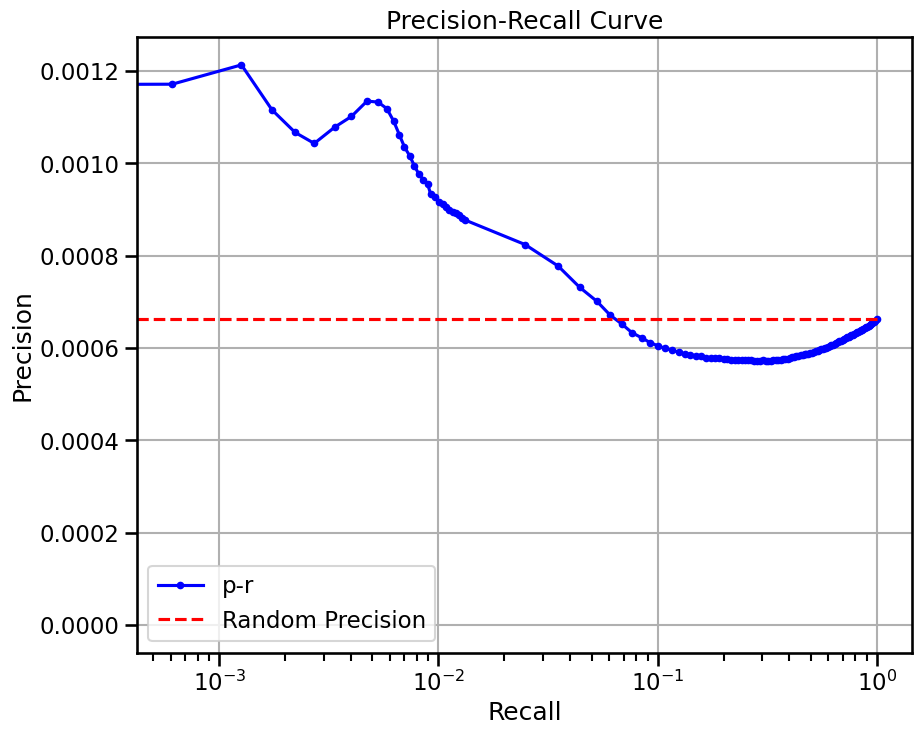

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:02<03:06,  2.96s/it]

  3%|▎         | 2/64 [00:05<02:30,  2.42s/it]

  5%|▍         | 3/64 [00:06<01:57,  1.93s/it]

  6%|▋         | 4/64 [00:07<01:42,  1.71s/it]

  8%|▊         | 5/64 [00:09<01:36,  1.63s/it]

  9%|▉         | 6/64 [00:10<01:29,  1.54s/it]

 11%|█         | 7/64 [00:11<01:24,  1.47s/it]

 12%|█▎        | 8/64 [00:13<01:19,  1.43s/it]

 14%|█▍        | 9/64 [00:14<01:16,  1.39s/it]

 16%|█▌        | 10/64 [00:15<01:13,  1.37s/it]

 17%|█▋        | 11/64 [00:17<01:10,  1.34s/it]

 19%|█▉        | 12/64 [00:18<01:07,  1.30s/it]

 20%|██        | 13/64 [00:19<01:06,  1.30s/it]

 22%|██▏       | 14/64 [00:20<01:04,  1.29s/it]

 23%|██▎       | 15/64 [00:22<01:03,  1.29s/it]

 25%|██▌       | 16/64 [00:23<01:02,  1.29s/it]

 27%|██▋       | 17/64 [00:24<00:59,  1.27s/it]

 28%|██▊       | 18/64 [00:26<01:03,  1.38s/it]

 30%|██▉       | 19/64 [00:27<01:03,  1.41s/it]

 31%|███▏      | 20/64 [00:29<01:04,  1.46s/it]

 33%|███▎      | 21/64 [00:30<01:03,  1.48s/it]

 34%|███▍      | 22/64 [00:32<01:02,  1.50s/it]

 36%|███▌      | 23/64 [00:33<00:58,  1.42s/it]

 38%|███▊      | 24/64 [00:35<00:55,  1.39s/it]

 39%|███▉      | 25/64 [00:37<01:08,  1.76s/it]

 41%|████      | 26/64 [00:39<01:03,  1.67s/it]

 42%|████▏     | 27/64 [00:41<01:14,  2.02s/it]

 44%|████▍     | 28/64 [00:43<01:08,  1.90s/it]

 45%|████▌     | 29/64 [00:45<01:02,  1.78s/it]

 47%|████▋     | 30/64 [00:46<00:57,  1.70s/it]

 48%|████▊     | 31/64 [00:48<00:54,  1.66s/it]

 50%|█████     | 32/64 [00:49<00:52,  1.63s/it]

 52%|█████▏    | 33/64 [00:51<00:49,  1.59s/it]

 53%|█████▎    | 34/64 [00:52<00:46,  1.56s/it]

 55%|█████▍    | 35/64 [00:54<00:44,  1.55s/it]

 56%|█████▋    | 36/64 [00:55<00:43,  1.56s/it]

 58%|█████▊    | 37/64 [00:57<00:42,  1.56s/it]

 59%|█████▉    | 38/64 [00:58<00:40,  1.55s/it]

 61%|██████    | 39/64 [01:00<00:37,  1.50s/it]

 62%|██████▎   | 40/64 [01:01<00:35,  1.47s/it]

 64%|██████▍   | 41/64 [01:03<00:33,  1.47s/it]

 66%|██████▌   | 42/64 [01:04<00:31,  1.45s/it]

 67%|██████▋   | 43/64 [01:05<00:29,  1.42s/it]

 69%|██████▉   | 44/64 [01:08<00:38,  1.92s/it]

 70%|███████   | 45/64 [01:10<00:33,  1.75s/it]

 72%|███████▏  | 46/64 [01:11<00:29,  1.62s/it]

 73%|███████▎  | 47/64 [01:13<00:26,  1.54s/it]

 75%|███████▌  | 48/64 [01:14<00:23,  1.46s/it]

 77%|███████▋  | 49/64 [01:15<00:21,  1.43s/it]

 78%|███████▊  | 50/64 [01:17<00:20,  1.45s/it]

 80%|███████▉  | 51/64 [01:18<00:18,  1.45s/it]

 81%|████████▏ | 52/64 [01:19<00:17,  1.42s/it]

 83%|████████▎ | 53/64 [01:21<00:15,  1.42s/it]

 84%|████████▍ | 54/64 [01:22<00:14,  1.42s/it]

 86%|████████▌ | 55/64 [01:24<00:12,  1.42s/it]

 88%|████████▊ | 56/64 [01:25<00:11,  1.43s/it]

 89%|████████▉ | 57/64 [01:27<00:10,  1.45s/it]

 91%|█████████ | 58/64 [01:28<00:08,  1.43s/it]

 92%|█████████▏| 59/64 [01:29<00:07,  1.42s/it]

 94%|█████████▍| 60/64 [01:31<00:05,  1.43s/it]

 95%|█████████▌| 61/64 [01:32<00:04,  1.43s/it]

 97%|█████████▋| 62/64 [01:34<00:02,  1.42s/it]

 98%|█████████▊| 63/64 [01:35<00:01,  1.42s/it]

100%|██████████| 64/64 [01:36<00:00,  1.40s/it]

100%|██████████| 64/64 [01:37<00:00,  1.52s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


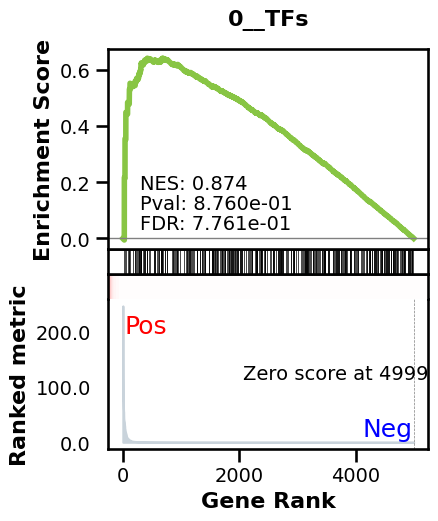

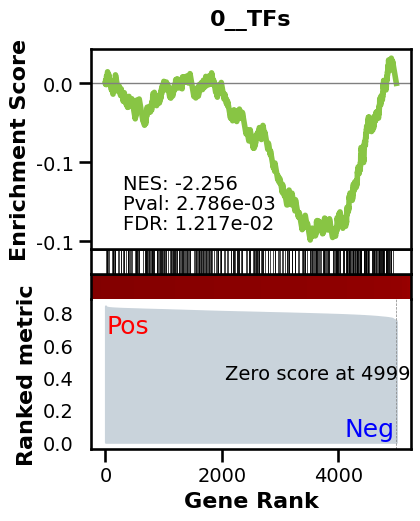

_________________________________________
TF specific enrichment


found some significant results for  6.0606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.0007678674904977909 
recall:  1.0 
random precision: 0.0007680855727160522


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 51.62it/s]

  9%|▉         | 12/128 [00:00<00:02, 52.46it/s]

 14%|█▍        | 18/128 [00:00<00:02, 53.14it/s]

 19%|█▉        | 24/128 [00:00<00:01, 53.82it/s]

 23%|██▎       | 30/128 [00:00<00:01, 53.89it/s]

 28%|██▊       | 36/128 [00:00<00:01, 53.54it/s]

 33%|███▎      | 42/128 [00:00<00:01, 52.68it/s]

 38%|███▊      | 48/128 [00:00<00:01, 52.85it/s]

 42%|████▏     | 54/128 [00:01<00:01, 52.53it/s]

 47%|████▋     | 60/128 [00:01<00:01, 52.13it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 52.34it/s]

 56%|█████▋    | 72/128 [00:01<00:01, 53.23it/s]

 61%|██████    | 78/128 [00:01<00:00, 54.01it/s]

 66%|██████▌   | 84/128 [00:01<00:00, 54.39it/s]

 70%|███████   | 90/128 [00:01<00:00, 54.41it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 54.68it/s]

 80%|███████▉  | 102/128 [00:01<00:00, 54.96it/s]

 84%|████████▍ | 108/128 [00:02<00:00, 54.99it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 55.16it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 55.17it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 55.10it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 53.88it/s]

Average Precision (AP):  0.0008130800340910347
Area Under Precision-Recall Curve (AUPRC):  0.0008129267185718436


EPR: 0.4096875050872142


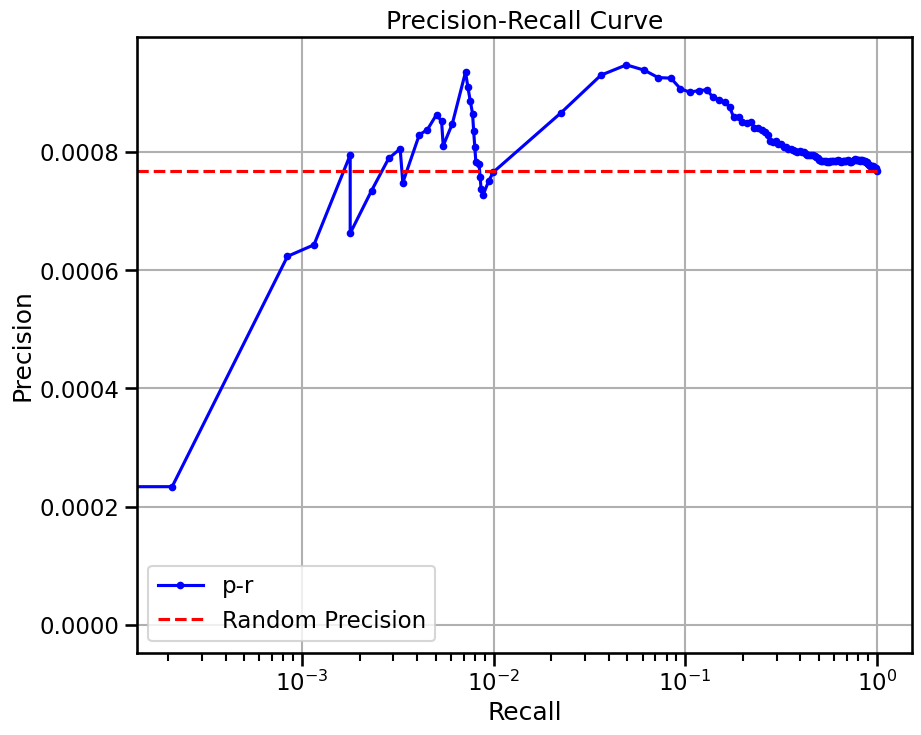

base enrichment


Top central genes: []


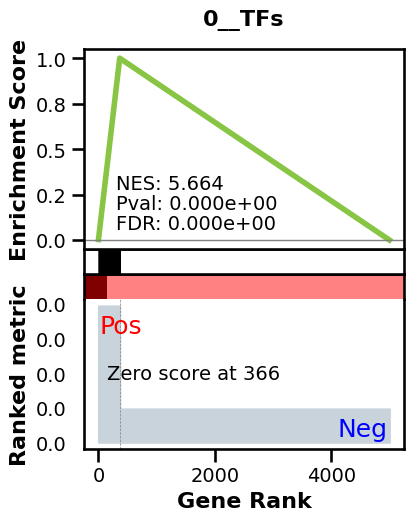

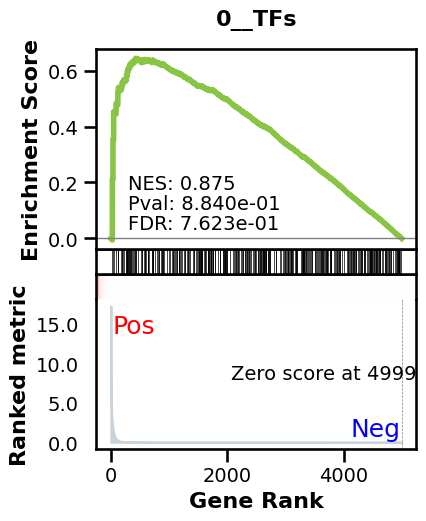

_________________________________________
TF specific enrichment


found some significant results for  12.121212121212121 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.002834563694870339 
recall:  0.3144356955380577 
random precision: 0.0007680855727160522


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 45.01it/s]

  8%|▊         | 10/128 [00:00<00:02, 46.50it/s]

 12%|█▏        | 15/128 [00:00<00:02, 46.86it/s]

 16%|█▌        | 20/128 [00:00<00:02, 47.03it/s]

 20%|█▉        | 25/128 [00:00<00:02, 47.35it/s]

 23%|██▎       | 30/128 [00:00<00:02, 47.82it/s]

 27%|██▋       | 35/128 [00:00<00:01, 47.86it/s]

 31%|███▏      | 40/128 [00:00<00:01, 47.48it/s]

 35%|███▌      | 45/128 [00:00<00:01, 47.32it/s]

 39%|███▉      | 50/128 [00:01<00:01, 47.11it/s]

 43%|████▎     | 55/128 [00:01<00:01, 47.02it/s]

 47%|████▋     | 60/128 [00:01<00:01, 47.54it/s]

 51%|█████     | 65/128 [00:01<00:01, 48.12it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 48.83it/s]

 60%|██████    | 77/128 [00:01<00:01, 49.53it/s]

 64%|██████▍   | 82/128 [00:01<00:00, 49.63it/s]

 68%|██████▊   | 87/128 [00:01<00:00, 49.14it/s]

 72%|███████▏  | 92/128 [00:01<00:00, 48.40it/s]

 76%|███████▌  | 97/128 [00:02<00:00, 48.15it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 48.58it/s]

 84%|████████▎ | 107/128 [00:02<00:00, 48.55it/s]

 88%|████████▊ | 112/128 [00:02<00:00, 48.57it/s]

 91%|█████████▏| 117/128 [00:02<00:00, 48.67it/s]

 95%|█████████▌| 122/128 [00:02<00:00, 48.64it/s]

 99%|█████████▉| 127/128 [00:02<00:00, 48.51it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 48.09it/s]

Average Precision (AP):  0.0017868251721057753
Area Under Precision-Recall Curve (AUPRC):  0.0015550639340620135
EPR: 3.292010110979294


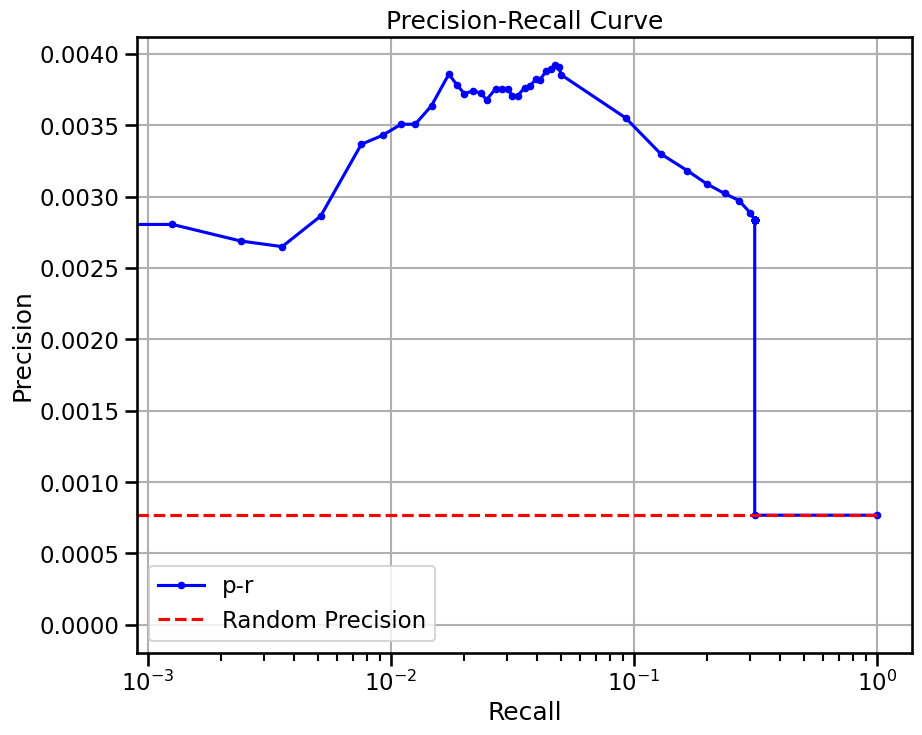

base enrichment


Top central genes: []
The DataFrame contains only the same values.


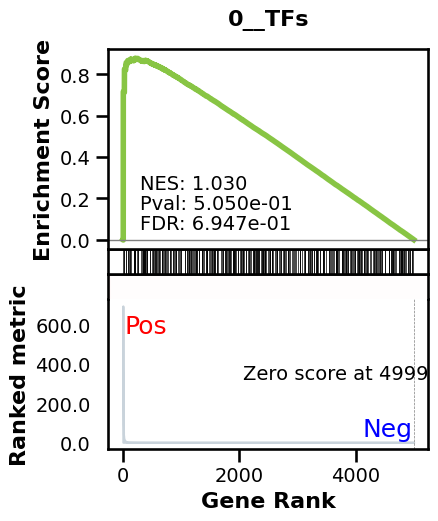

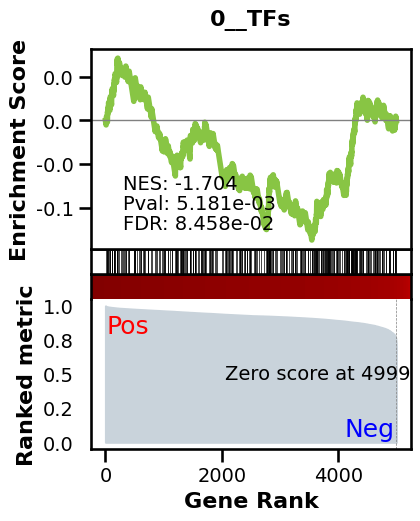

_________________________________________
TF specific enrichment


found some significant results for  9.090909090909092 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.0007678674904977909 
recall:  1.0 
random precision: 0.0007680855727160522


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 47.02it/s]

  8%|▊         | 10/128 [00:00<00:02, 47.04it/s]

 12%|█▎        | 16/128 [00:00<00:02, 48.85it/s]

 16%|█▋        | 21/128 [00:00<00:02, 49.13it/s]

 20%|██        | 26/128 [00:00<00:02, 49.11it/s]

 24%|██▍       | 31/128 [00:00<00:01, 48.67it/s]

 28%|██▊       | 36/128 [00:00<00:01, 48.16it/s]

 32%|███▏      | 41/128 [00:00<00:01, 47.50it/s]

 36%|███▌      | 46/128 [00:00<00:01, 47.47it/s]

 40%|███▉      | 51/128 [00:01<00:01, 47.19it/s]

 44%|████▍     | 56/128 [00:01<00:01, 47.09it/s]

 48%|████▊     | 61/128 [00:01<00:01, 47.40it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 47.41it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 47.23it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 47.00it/s]

 63%|██████▎   | 81/128 [00:01<00:00, 47.39it/s]

 67%|██████▋   | 86/128 [00:01<00:00, 47.73it/s]

 72%|███████▏  | 92/128 [00:01<00:00, 48.87it/s]

 77%|███████▋  | 98/128 [00:02<00:00, 49.35it/s]

 81%|████████▏ | 104/128 [00:02<00:00, 49.70it/s]

 85%|████████▌ | 109/128 [00:02<00:00, 49.18it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 48.99it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 48.70it/s]

 97%|█████████▋| 124/128 [00:02<00:00, 48.72it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 48.21it/s]

Average Precision (AP):  0.0007863058589177266
Area Under Precision-Recall Curve (AUPRC):  0.0007850568987151718
EPR: 2.190980751490905


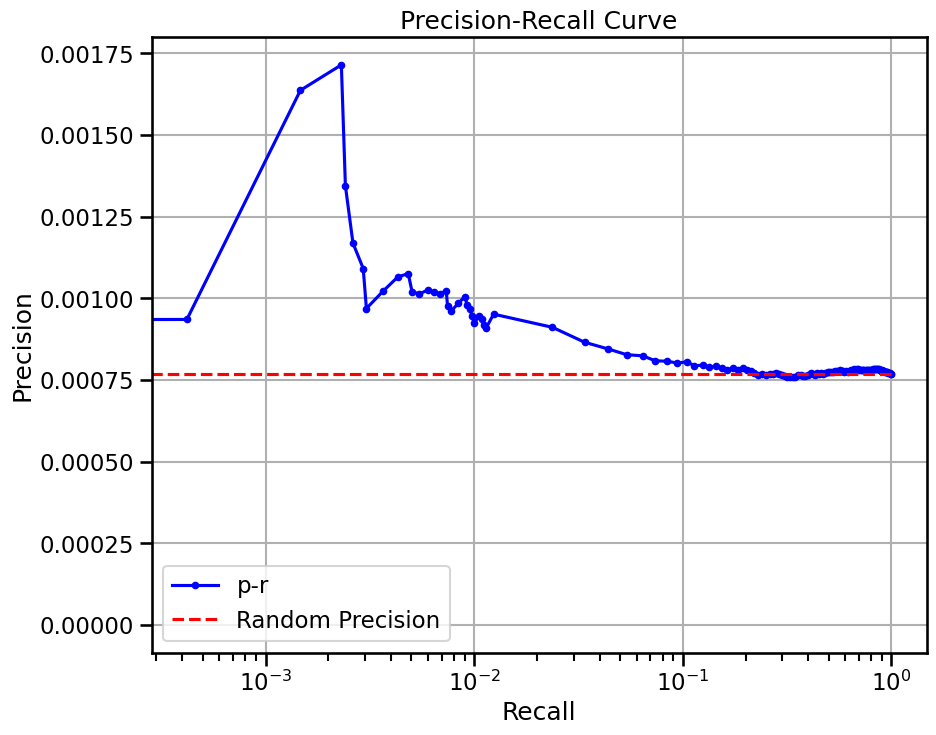

base enrichment


Top central genes: []


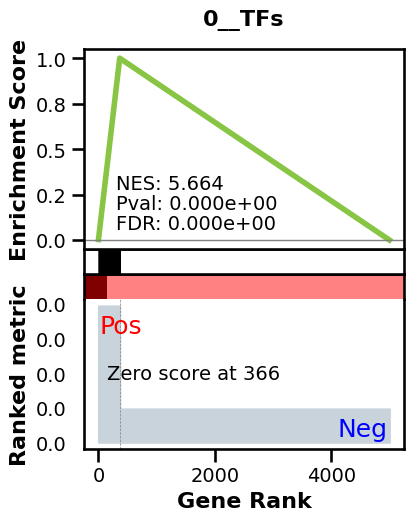

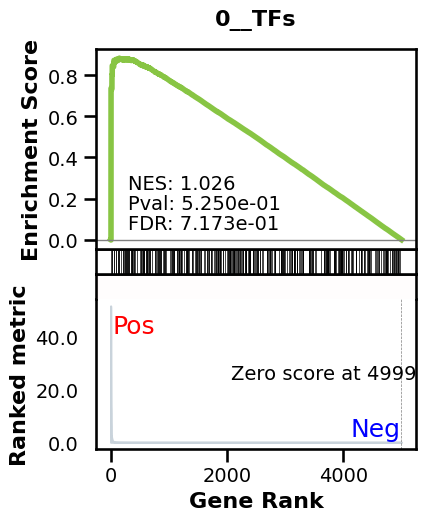

_________________________________________
TF specific enrichment


found some significant results for  3.0303030303030303 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3522 genes
intersection pct: 0.7044
precision:  0.002834563694870339 
recall:  0.3144356955380577 
random precision: 0.0007680855727160522


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 51.35it/s]

  9%|▉         | 12/128 [00:00<00:02, 50.56it/s]

 14%|█▍        | 18/128 [00:00<00:02, 49.80it/s]

 19%|█▉        | 24/128 [00:00<00:02, 49.95it/s]

 23%|██▎       | 29/128 [00:00<00:01, 49.61it/s]

 27%|██▋       | 34/128 [00:00<00:01, 49.36it/s]

 30%|███       | 39/128 [00:00<00:01, 48.85it/s]

 34%|███▍      | 44/128 [00:00<00:01, 48.24it/s]

 38%|███▊      | 49/128 [00:00<00:01, 48.54it/s]

 42%|████▏     | 54/128 [00:01<00:01, 48.33it/s]

 46%|████▌     | 59/128 [00:01<00:01, 48.21it/s]

 50%|█████     | 64/128 [00:01<00:01, 47.93it/s]

 54%|█████▍    | 69/128 [00:01<00:01, 47.20it/s]

 58%|█████▊    | 74/128 [00:01<00:01, 47.15it/s]

 62%|██████▏   | 79/128 [00:01<00:01, 47.70it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 48.78it/s]

 71%|███████   | 91/128 [00:01<00:00, 49.38it/s]

 76%|███████▌  | 97/128 [00:01<00:00, 49.82it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 49.79it/s]

 84%|████████▎ | 107/128 [00:02<00:00, 49.47it/s]

 88%|████████▊ | 112/128 [00:02<00:00, 49.46it/s]

 92%|█████████▏| 118/128 [00:02<00:00, 50.01it/s]

 96%|█████████▌| 123/128 [00:02<00:00, 49.59it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()


100%|██████████| 128/128 [00:02<00:00, 49.43it/s]

100%|██████████| 128/128 [00:02<00:00, 49.03it/s]

Average Precision (AP):  0.001754277400634308
Area Under Precision-Recall Curve (AUPRC):  0.0015132141484086171
EPR: 4.3967508079409034


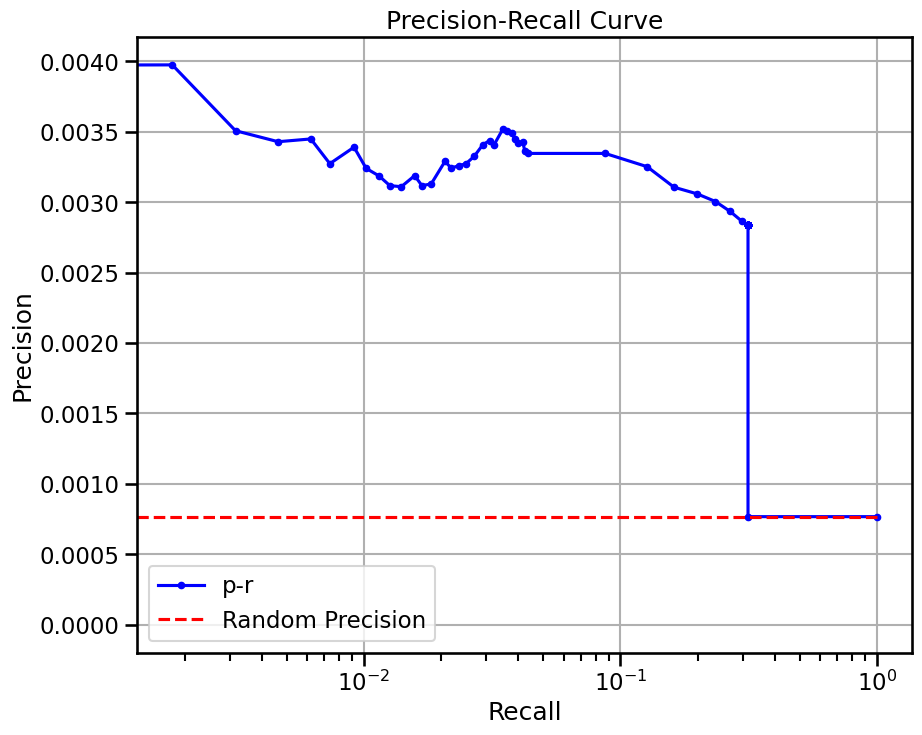

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:02<01:18,  2.55s/it]

  6%|▋         | 2/32 [00:03<00:49,  1.66s/it]

  9%|▉         | 3/32 [00:04<00:40,  1.41s/it]

 12%|█▎        | 4/32 [00:05<00:35,  1.26s/it]

 16%|█▌        | 5/32 [00:06<00:32,  1.19s/it]

 19%|█▉        | 6/32 [00:07<00:29,  1.15s/it]

 22%|██▏       | 7/32 [00:08<00:27,  1.09s/it]

 25%|██▌       | 8/32 [00:09<00:25,  1.05s/it]

 28%|██▊       | 9/32 [00:10<00:23,  1.04s/it]

 31%|███▏      | 10/32 [00:11<00:22,  1.01s/it]

 34%|███▍      | 11/32 [00:13<00:24,  1.15s/it]

 38%|███▊      | 12/32 [00:14<00:22,  1.10s/it]

 41%|████      | 13/32 [00:15<00:21,  1.12s/it]

 44%|████▍     | 14/32 [00:16<00:20,  1.15s/it]

 47%|████▋     | 15/32 [00:17<00:19,  1.13s/it]

 50%|█████     | 16/32 [00:18<00:18,  1.18s/it]

 53%|█████▎    | 17/32 [00:20<00:18,  1.25s/it]

 56%|█████▋    | 18/32 [00:21<00:17,  1.22s/it]

 59%|█████▉    | 19/32 [00:22<00:15,  1.20s/it]

 62%|██████▎   | 20/32 [00:23<00:13,  1.17s/it]

 66%|██████▌   | 21/32 [00:24<00:12,  1.18s/it]

 69%|██████▉   | 22/32 [00:26<00:11,  1.16s/it]

 72%|███████▏  | 23/32 [00:27<00:10,  1.16s/it]

 75%|███████▌  | 24/32 [00:28<00:09,  1.15s/it]

 78%|███████▊  | 25/32 [00:29<00:08,  1.16s/it]

 81%|████████▏ | 26/32 [00:30<00:06,  1.17s/it]

 84%|████████▍ | 27/32 [00:31<00:05,  1.15s/it]

 88%|████████▊ | 28/32 [00:33<00:04,  1.16s/it]

 91%|█████████ | 29/32 [00:34<00:03,  1.13s/it]

 94%|█████████▍| 30/32 [00:35<00:02,  1.14s/it]

 97%|█████████▋| 31/32 [00:36<00:01,  1.13s/it]

100%|██████████| 32/32 [00:37<00:00,  1.16s/it]

100%|██████████| 32/32 [00:37<00:00,  1.18s/it]

avg link count: 534210769, sparsity: 1.0


base enrichment


too many genes for central computation


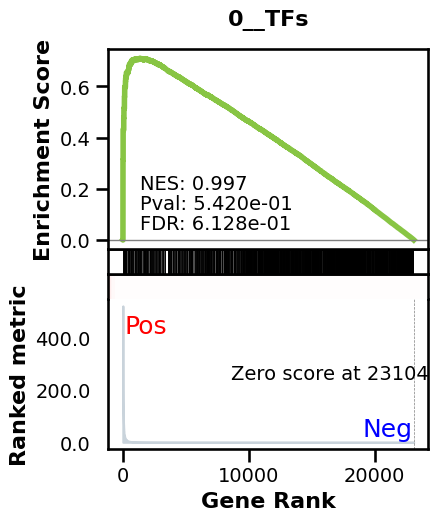

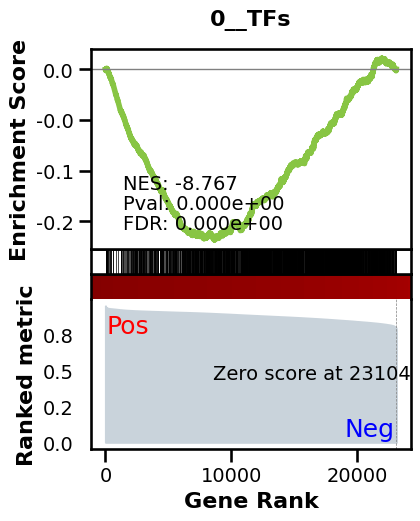

_________________________________________
TF specific enrichment


found some significant results for  27.678571428571427 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12453 genes
intersection pct: 0.5389742479982688


precision:  0.0006635390569010207 
recall:  1.0 
random precision: 0.0006635850976349161


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:43,  2.89it/s]

  2%|▏         | 2/128 [00:00<00:43,  2.89it/s]

  2%|▏         | 3/128 [00:01<00:44,  2.79it/s]

  3%|▎         | 4/128 [00:01<00:46,  2.69it/s]

  4%|▍         | 5/128 [00:01<00:45,  2.68it/s]

  5%|▍         | 6/128 [00:02<00:44,  2.74it/s]

  5%|▌         | 7/128 [00:02<00:43,  2.77it/s]

  6%|▋         | 8/128 [00:02<00:43,  2.75it/s]

  7%|▋         | 9/128 [00:03<00:43,  2.71it/s]

  8%|▊         | 10/128 [00:03<00:44,  2.68it/s]

  9%|▊         | 11/128 [00:04<00:42,  2.73it/s]

  9%|▉         | 12/128 [00:04<00:41,  2.77it/s]

 10%|█         | 13/128 [00:04<00:42,  2.69it/s]

 11%|█         | 14/128 [00:05<00:42,  2.68it/s]

 12%|█▏        | 15/128 [00:05<00:42,  2.65it/s]

 12%|█▎        | 16/128 [00:05<00:42,  2.63it/s]

 13%|█▎        | 17/128 [00:06<00:41,  2.68it/s]

 14%|█▍        | 18/128 [00:06<00:40,  2.69it/s]

 15%|█▍        | 19/128 [00:07<00:40,  2.67it/s]

 16%|█▌        | 20/128 [00:07<00:40,  2.66it/s]

 16%|█▋        | 21/128 [00:07<00:40,  2.64it/s]

 17%|█▋        | 22/128 [00:08<00:39,  2.68it/s]

 18%|█▊        | 23/128 [00:08<00:38,  2.72it/s]

 19%|█▉        | 24/128 [00:08<00:38,  2.72it/s]

 20%|█▉        | 25/128 [00:09<00:38,  2.67it/s]

 20%|██        | 26/128 [00:09<00:38,  2.66it/s]

 21%|██        | 27/128 [00:10<00:37,  2.66it/s]

 22%|██▏       | 28/128 [00:10<00:36,  2.75it/s]

 23%|██▎       | 29/128 [00:10<00:35,  2.77it/s]

 23%|██▎       | 30/128 [00:11<00:35,  2.72it/s]

 24%|██▍       | 31/128 [00:11<00:36,  2.68it/s]

 25%|██▌       | 32/128 [00:11<00:35,  2.69it/s]

 26%|██▌       | 33/128 [00:12<00:35,  2.64it/s]

 27%|██▋       | 34/128 [00:12<00:35,  2.68it/s]

 27%|██▋       | 35/128 [00:12<00:34,  2.69it/s]

 28%|██▊       | 36/128 [00:13<00:34,  2.70it/s]

 29%|██▉       | 37/128 [00:13<00:33,  2.69it/s]

 30%|██▉       | 38/128 [00:14<00:33,  2.68it/s]

 30%|███       | 39/128 [00:14<00:32,  2.72it/s]

 31%|███▏      | 40/128 [00:14<00:31,  2.77it/s]

 32%|███▏      | 41/128 [00:15<00:31,  2.74it/s]

 33%|███▎      | 42/128 [00:15<00:31,  2.70it/s]

 34%|███▎      | 43/128 [00:15<00:31,  2.69it/s]

 34%|███▍      | 44/128 [00:16<00:31,  2.70it/s]

 35%|███▌      | 45/128 [00:16<00:30,  2.75it/s]

 36%|███▌      | 46/128 [00:16<00:29,  2.75it/s]

 37%|███▋      | 47/128 [00:17<00:29,  2.74it/s]

 38%|███▊      | 48/128 [00:17<00:29,  2.71it/s]

 38%|███▊      | 49/128 [00:18<00:29,  2.65it/s]

 39%|███▉      | 50/128 [00:18<00:28,  2.69it/s]

 40%|███▉      | 51/128 [00:18<00:28,  2.71it/s]

 41%|████      | 52/128 [00:19<00:27,  2.74it/s]

 41%|████▏     | 53/128 [00:19<00:27,  2.75it/s]

 42%|████▏     | 54/128 [00:19<00:27,  2.67it/s]

 43%|████▎     | 55/128 [00:20<00:27,  2.62it/s]

 44%|████▍     | 56/128 [00:20<00:26,  2.69it/s]

 45%|████▍     | 57/128 [00:21<00:25,  2.76it/s]

 45%|████▌     | 58/128 [00:21<00:25,  2.74it/s]

 46%|████▌     | 59/128 [00:21<00:25,  2.67it/s]

 47%|████▋     | 60/128 [00:22<00:25,  2.63it/s]

 48%|████▊     | 61/128 [00:22<00:25,  2.65it/s]

 48%|████▊     | 62/128 [00:22<00:23,  2.77it/s]

 49%|████▉     | 63/128 [00:23<00:23,  2.78it/s]

 50%|█████     | 64/128 [00:23<00:23,  2.74it/s]

 51%|█████     | 65/128 [00:24<00:23,  2.68it/s]

 52%|█████▏    | 66/128 [00:24<00:23,  2.64it/s]

 52%|█████▏    | 67/128 [00:24<00:22,  2.75it/s]

 53%|█████▎    | 68/128 [00:25<00:21,  2.79it/s]

 54%|█████▍    | 69/128 [00:25<00:21,  2.78it/s]

 55%|█████▍    | 70/128 [00:25<00:21,  2.71it/s]

 55%|█████▌    | 71/128 [00:26<00:21,  2.64it/s]

 56%|█████▋    | 72/128 [00:26<00:20,  2.71it/s]

 57%|█████▋    | 73/128 [00:26<00:19,  2.79it/s]

 58%|█████▊    | 74/128 [00:27<00:19,  2.77it/s]

 59%|█████▊    | 75/128 [00:27<00:19,  2.68it/s]

 59%|█████▉    | 76/128 [00:28<00:19,  2.63it/s]

 60%|██████    | 77/128 [00:28<00:19,  2.67it/s]

 61%|██████    | 78/128 [00:28<00:18,  2.73it/s]

 62%|██████▏   | 79/128 [00:29<00:17,  2.76it/s]

 62%|██████▎   | 80/128 [00:29<00:17,  2.71it/s]

 63%|██████▎   | 81/128 [00:29<00:17,  2.66it/s]

 64%|██████▍   | 82/128 [00:30<00:17,  2.70it/s]

 65%|██████▍   | 83/128 [00:30<00:16,  2.71it/s]

 66%|██████▌   | 84/128 [00:31<00:16,  2.74it/s]

 66%|██████▋   | 85/128 [00:31<00:15,  2.69it/s]

 67%|██████▋   | 86/128 [00:31<00:15,  2.64it/s]

 68%|██████▊   | 87/128 [00:32<00:15,  2.71it/s]

 69%|██████▉   | 88/128 [00:32<00:14,  2.73it/s]

 70%|██████▉   | 89/128 [00:32<00:14,  2.75it/s]

 70%|███████   | 90/128 [00:33<00:13,  2.72it/s]

 71%|███████   | 91/128 [00:33<00:13,  2.69it/s]

 72%|███████▏  | 92/128 [00:33<00:13,  2.73it/s]

 73%|███████▎  | 93/128 [00:34<00:12,  2.75it/s]

 73%|███████▎  | 94/128 [00:34<00:12,  2.76it/s]

 74%|███████▍  | 95/128 [00:35<00:12,  2.75it/s]

 75%|███████▌  | 96/128 [00:35<00:11,  2.69it/s]

 76%|███████▌  | 97/128 [00:35<00:11,  2.73it/s]

 77%|███████▋  | 98/128 [00:36<00:11,  2.72it/s]

 77%|███████▋  | 99/128 [00:36<00:10,  2.75it/s]

 78%|███████▊  | 100/128 [00:36<00:10,  2.74it/s]

 79%|███████▉  | 101/128 [00:37<00:09,  2.74it/s]

 80%|███████▉  | 102/128 [00:37<00:09,  2.78it/s]

 80%|████████  | 103/128 [00:37<00:08,  2.78it/s]

 81%|████████▏ | 104/128 [00:38<00:08,  2.72it/s]

 82%|████████▏ | 105/128 [00:38<00:08,  2.73it/s]

 83%|████████▎ | 106/128 [00:39<00:08,  2.70it/s]

 84%|████████▎ | 107/128 [00:39<00:07,  2.74it/s]

 84%|████████▍ | 108/128 [00:39<00:07,  2.78it/s]

 85%|████████▌ | 109/128 [00:40<00:06,  2.74it/s]

 86%|████████▌ | 110/128 [00:40<00:06,  2.72it/s]

 87%|████████▋ | 111/128 [00:40<00:06,  2.72it/s]

 88%|████████▊ | 112/128 [00:41<00:05,  2.75it/s]

 88%|████████▊ | 113/128 [00:41<00:05,  2.76it/s]

 89%|████████▉ | 114/128 [00:42<00:05,  2.72it/s]

 90%|████████▉ | 115/128 [00:42<00:04,  2.73it/s]

 91%|█████████ | 116/128 [00:42<00:04,  2.73it/s]

 91%|█████████▏| 117/128 [00:43<00:03,  2.79it/s]

 92%|█████████▏| 118/128 [00:43<00:03,  2.78it/s]

 93%|█████████▎| 119/128 [00:43<00:03,  2.71it/s]

 94%|█████████▍| 120/128 [00:44<00:02,  2.67it/s]

 95%|█████████▍| 121/128 [00:44<00:02,  2.66it/s]

 95%|█████████▌| 122/128 [00:44<00:02,  2.65it/s]

 96%|█████████▌| 123/128 [00:45<00:01,  2.72it/s]

 97%|█████████▋| 124/128 [00:45<00:01,  2.71it/s]

 98%|█████████▊| 125/128 [00:46<00:01,  2.68it/s]

 98%|█████████▊| 126/128 [00:46<00:00,  2.68it/s]

 99%|█████████▉| 127/128 [00:46<00:00,  2.73it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:47<00:00,  2.77it/s]

100%|██████████| 128/128 [00:47<00:00,  2.71it/s]

Average Precision (AP):  0.0006350220767396989
Area Under Precision-Recall Curve (AUPRC):  0.0006342323151636383


EPR: 2.1680312127978247


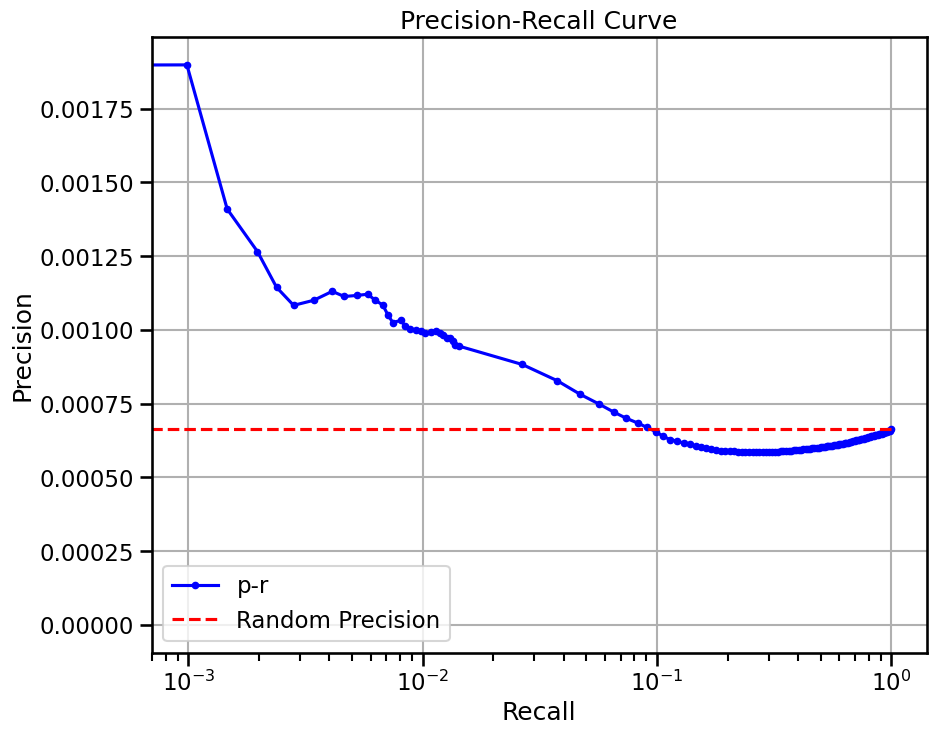

  0%|          | 0/64 [00:00<?, ?it/s]

  2%|▏         | 1/64 [00:03<03:10,  3.03s/it]

  3%|▎         | 2/64 [00:04<02:11,  2.12s/it]

  5%|▍         | 3/64 [00:06<01:51,  1.83s/it]

  6%|▋         | 4/64 [00:07<01:42,  1.70s/it]

  8%|▊         | 5/64 [00:08<01:35,  1.61s/it]

  9%|▉         | 6/64 [00:10<01:30,  1.56s/it]

 11%|█         | 7/64 [00:11<01:27,  1.54s/it]

 12%|█▎        | 8/64 [00:13<01:25,  1.54s/it]

 14%|█▍        | 9/64 [00:14<01:24,  1.53s/it]

 16%|█▌        | 10/64 [00:16<01:20,  1.49s/it]

 17%|█▋        | 11/64 [00:17<01:18,  1.47s/it]

 19%|█▉        | 12/64 [00:19<01:17,  1.48s/it]

 20%|██        | 13/64 [00:20<01:15,  1.48s/it]

 22%|██▏       | 14/64 [00:22<01:13,  1.46s/it]

 23%|██▎       | 15/64 [00:23<01:10,  1.44s/it]

 25%|██▌       | 16/64 [00:24<01:08,  1.43s/it]

 27%|██▋       | 17/64 [00:26<01:06,  1.41s/it]

 28%|██▊       | 18/64 [00:27<01:03,  1.38s/it]

 30%|██▉       | 19/64 [00:28<01:00,  1.36s/it]

 31%|███▏      | 20/64 [00:30<00:58,  1.33s/it]

 33%|███▎      | 21/64 [00:31<00:56,  1.31s/it]

 34%|███▍      | 22/64 [00:32<00:54,  1.29s/it]

 36%|███▌      | 23/64 [00:34<00:52,  1.29s/it]

 38%|███▊      | 24/64 [00:35<00:50,  1.27s/it]

 39%|███▉      | 25/64 [00:36<00:49,  1.27s/it]

 41%|████      | 26/64 [00:37<00:48,  1.27s/it]

 42%|████▏     | 27/64 [00:39<00:46,  1.27s/it]

 44%|████▍     | 28/64 [00:40<00:45,  1.26s/it]

 45%|████▌     | 29/64 [00:41<00:44,  1.26s/it]

 47%|████▋     | 30/64 [00:42<00:44,  1.32s/it]

 48%|████▊     | 31/64 [00:44<00:44,  1.34s/it]

 50%|█████     | 32/64 [00:45<00:42,  1.34s/it]

 52%|█████▏    | 33/64 [00:47<00:42,  1.37s/it]

 53%|█████▎    | 34/64 [00:48<00:40,  1.35s/it]

 55%|█████▍    | 35/64 [00:49<00:39,  1.36s/it]

 56%|█████▋    | 36/64 [00:51<00:38,  1.39s/it]

 58%|█████▊    | 37/64 [00:52<00:36,  1.36s/it]

 59%|█████▉    | 38/64 [00:53<00:35,  1.37s/it]

 61%|██████    | 39/64 [00:55<00:34,  1.36s/it]

 62%|██████▎   | 40/64 [00:56<00:32,  1.37s/it]

 64%|██████▍   | 41/64 [00:58<00:31,  1.38s/it]

 66%|██████▌   | 42/64 [00:59<00:30,  1.38s/it]

 67%|██████▋   | 43/64 [01:00<00:29,  1.38s/it]

 69%|██████▉   | 44/64 [01:02<00:27,  1.39s/it]

 70%|███████   | 45/64 [01:03<00:25,  1.36s/it]

 72%|███████▏  | 46/64 [01:04<00:24,  1.37s/it]

 73%|███████▎  | 47/64 [01:06<00:23,  1.39s/it]

 75%|███████▌  | 48/64 [01:07<00:21,  1.36s/it]

 77%|███████▋  | 49/64 [01:09<00:20,  1.35s/it]

 78%|███████▊  | 50/64 [01:10<00:18,  1.36s/it]

 80%|███████▉  | 51/64 [01:11<00:17,  1.35s/it]

 81%|████████▏ | 52/64 [01:13<00:16,  1.35s/it]

 83%|████████▎ | 53/64 [01:14<00:14,  1.35s/it]

 84%|████████▍ | 54/64 [01:15<00:13,  1.33s/it]

 86%|████████▌ | 55/64 [01:17<00:12,  1.37s/it]

 88%|████████▊ | 56/64 [01:18<00:10,  1.36s/it]

 89%|████████▉ | 57/64 [01:19<00:09,  1.33s/it]

 91%|█████████ | 58/64 [01:21<00:07,  1.32s/it]

 92%|█████████▏| 59/64 [01:22<00:06,  1.32s/it]

 94%|█████████▍| 60/64 [01:23<00:05,  1.30s/it]

 95%|█████████▌| 61/64 [01:24<00:03,  1.28s/it]

 97%|█████████▋| 62/64 [01:26<00:02,  1.27s/it]

 98%|█████████▊| 63/64 [01:27<00:01,  1.26s/it]

100%|██████████| 64/64 [01:28<00:00,  1.24s/it]

100%|██████████| 64/64 [01:28<00:00,  1.39s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


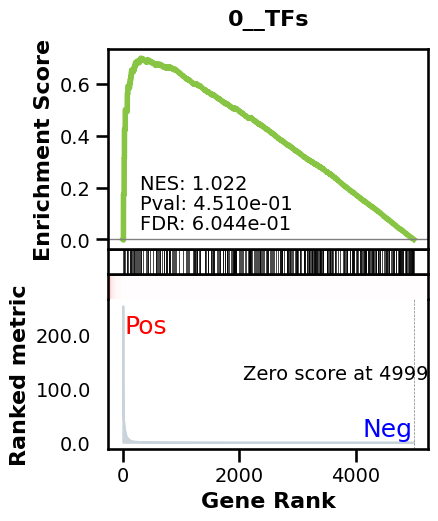

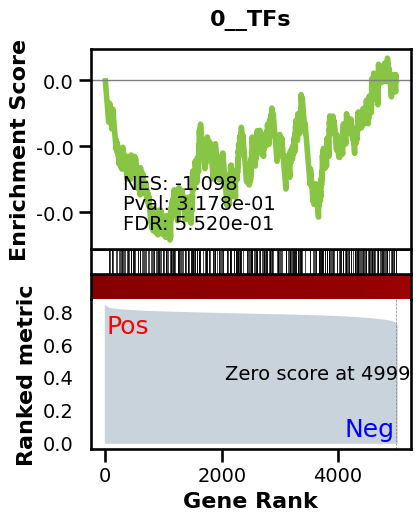

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.0010244792699861138 
recall:  1.0 
random precision: 0.0010247679370106238


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 47.76it/s]

  8%|▊         | 10/128 [00:00<00:02, 47.76it/s]

 12%|█▏        | 15/128 [00:00<00:02, 47.41it/s]

 16%|█▌        | 20/128 [00:00<00:02, 46.99it/s]

 20%|█▉        | 25/128 [00:00<00:02, 47.12it/s]

 23%|██▎       | 30/128 [00:00<00:02, 47.07it/s]

 27%|██▋       | 35/128 [00:00<00:01, 46.98it/s]

 31%|███▏      | 40/128 [00:00<00:01, 46.91it/s]

 35%|███▌      | 45/128 [00:00<00:01, 46.95it/s]

 39%|███▉      | 50/128 [00:01<00:01, 47.34it/s]

 43%|████▎     | 55/128 [00:01<00:01, 47.62it/s]

 47%|████▋     | 60/128 [00:01<00:01, 48.09it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 48.88it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 49.16it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 48.57it/s]

 63%|██████▎   | 81/128 [00:01<00:00, 48.08it/s]

 67%|██████▋   | 86/128 [00:01<00:00, 47.60it/s]

 71%|███████   | 91/128 [00:01<00:00, 47.23it/s]

 75%|███████▌  | 96/128 [00:02<00:00, 47.02it/s]

 79%|███████▉  | 101/128 [00:02<00:00, 47.11it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 47.65it/s]

 87%|████████▋ | 111/128 [00:02<00:00, 48.12it/s]

 91%|█████████ | 116/128 [00:02<00:00, 48.49it/s]

 95%|█████████▍| 121/128 [00:02<00:00, 48.13it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 47.61it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 47.64it/s]

Average Precision (AP):  0.0010698878395251487
Area Under Precision-Recall Curve (AUPRC):  0.001066901881790021
EPR: 1.8929884104809642


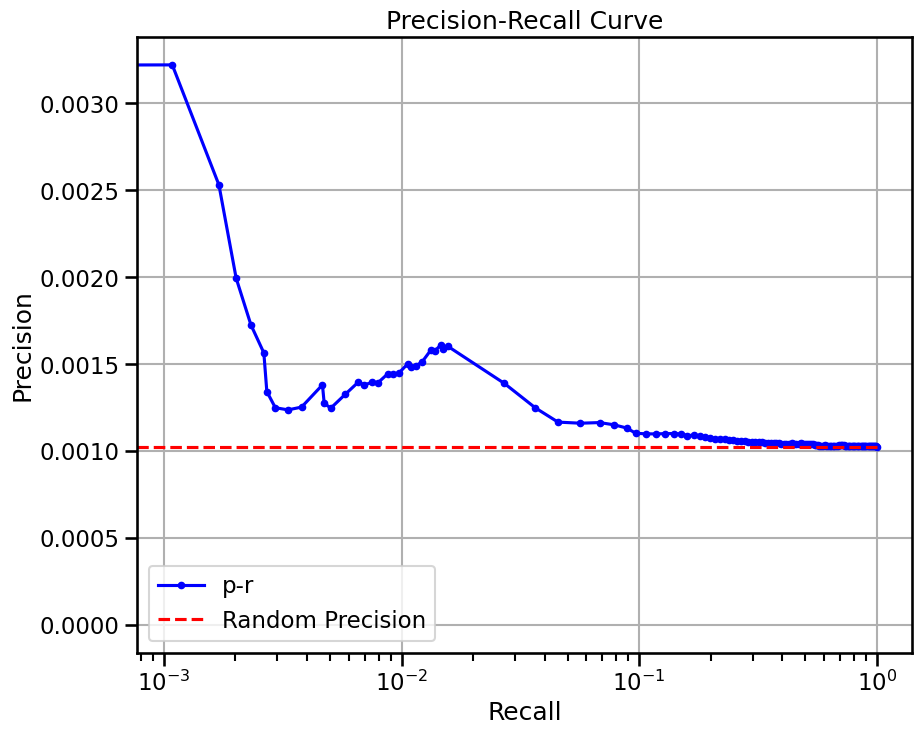

base enrichment


Top central genes: []


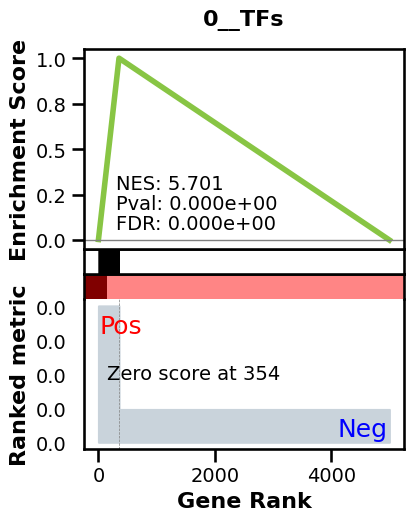

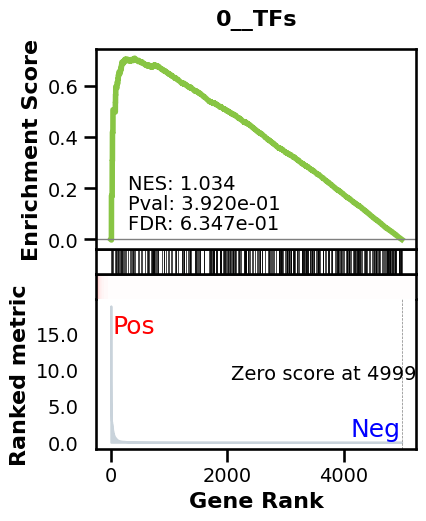

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.003774647887323944 
recall:  0.3165517775540237 
random precision: 0.0010247679370106238


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 47.12it/s]

  8%|▊         | 10/128 [00:00<00:02, 47.96it/s]

 12%|█▏        | 15/128 [00:00<00:02, 48.64it/s]

 16%|█▌        | 20/128 [00:00<00:02, 48.73it/s]

 20%|█▉        | 25/128 [00:00<00:02, 48.33it/s]

 23%|██▎       | 30/128 [00:00<00:02, 48.80it/s]

 27%|██▋       | 35/128 [00:00<00:01, 48.93it/s]

 31%|███▏      | 40/128 [00:00<00:01, 48.99it/s]

 35%|███▌      | 45/128 [00:00<00:01, 48.98it/s]

 39%|███▉      | 50/128 [00:01<00:01, 48.95it/s]

 43%|████▎     | 55/128 [00:01<00:01, 49.15it/s]

 47%|████▋     | 60/128 [00:01<00:01, 48.89it/s]

 51%|█████     | 65/128 [00:01<00:01, 48.81it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 46.56it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 47.06it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 47.34it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 47.23it/s]

 70%|███████   | 90/128 [00:01<00:00, 47.00it/s]

 74%|███████▍  | 95/128 [00:01<00:00, 47.11it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 47.24it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 47.16it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 47.58it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 47.66it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 48.04it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 48.57it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 48.08it/s]

Average Precision (AP):  0.0023205879075807088
Area Under Precision-Recall Curve (AUPRC):  0.00200275369737945
EPR: 4.952484253457326


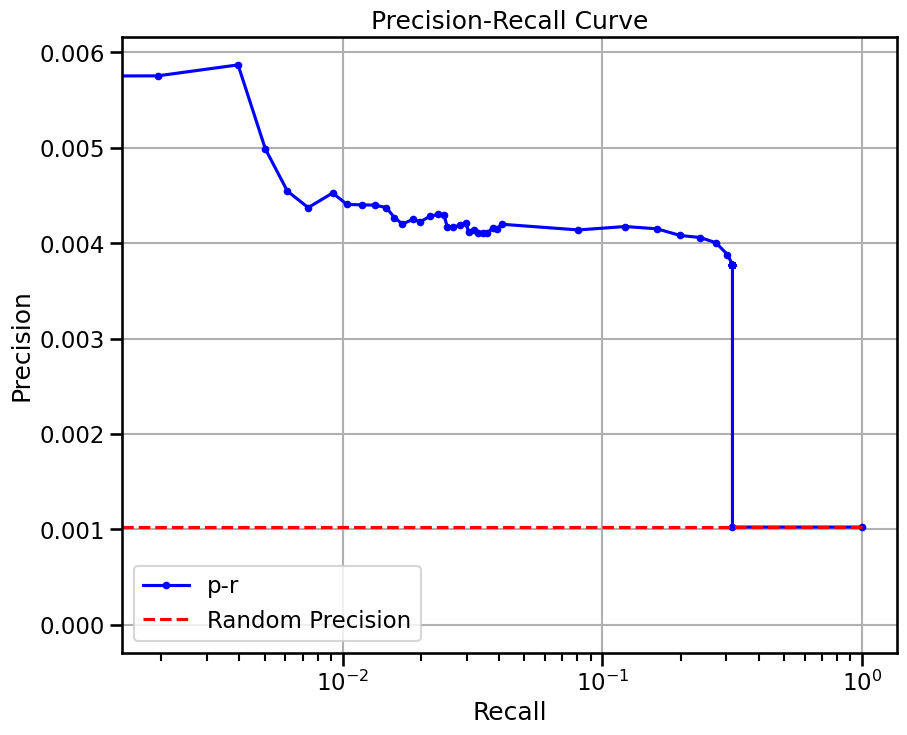

base enrichment


Top central genes: []
The DataFrame contains only the same values.


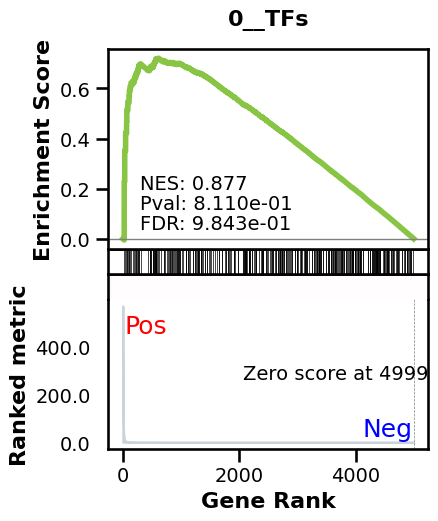

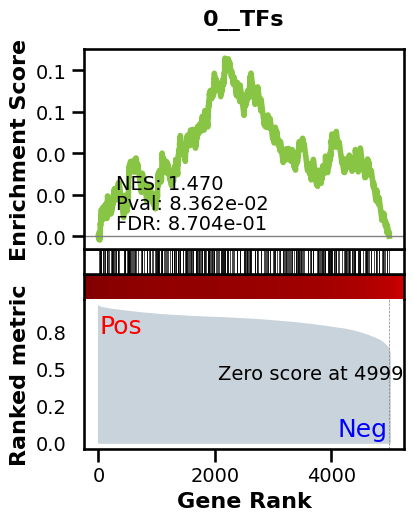

_________________________________________
TF specific enrichment


found some significant results for  15.384615384615385 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.0010244792699861138 
recall:  1.0 
random precision: 0.0010247679370106238


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 46.21it/s]

  8%|▊         | 10/128 [00:00<00:02, 46.46it/s]

 12%|█▏        | 15/128 [00:00<00:02, 46.45it/s]

 16%|█▌        | 20/128 [00:00<00:02, 46.45it/s]

 20%|█▉        | 25/128 [00:00<00:02, 46.48it/s]

 23%|██▎       | 30/128 [00:00<00:02, 46.64it/s]

 28%|██▊       | 36/128 [00:00<00:01, 48.00it/s]

 33%|███▎      | 42/128 [00:00<00:01, 48.80it/s]

 37%|███▋      | 47/128 [00:00<00:01, 48.88it/s]

 41%|████      | 52/128 [00:01<00:01, 49.05it/s]

 45%|████▌     | 58/128 [00:01<00:01, 49.37it/s]

 50%|█████     | 64/128 [00:01<00:01, 49.63it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 49.95it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 49.61it/s]

 62%|██████▎   | 80/128 [00:01<00:00, 48.95it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 48.20it/s]

 70%|███████   | 90/128 [00:01<00:00, 47.71it/s]

 74%|███████▍  | 95/128 [00:01<00:00, 47.23it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 46.93it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 47.07it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 46.86it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 46.81it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 46.71it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 46.56it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 47.68it/s]

Average Precision (AP):  0.0009749518045342067
Area Under Precision-Recall Curve (AUPRC):  0.0009738342851721021
EPR: 2.5780660332142165


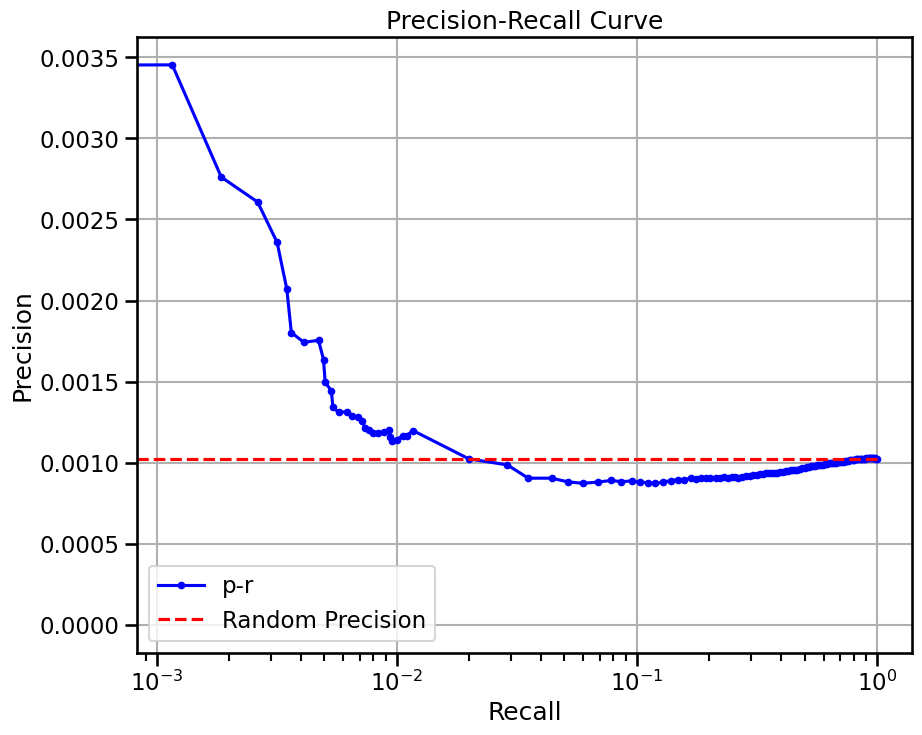

base enrichment


Top central genes: []


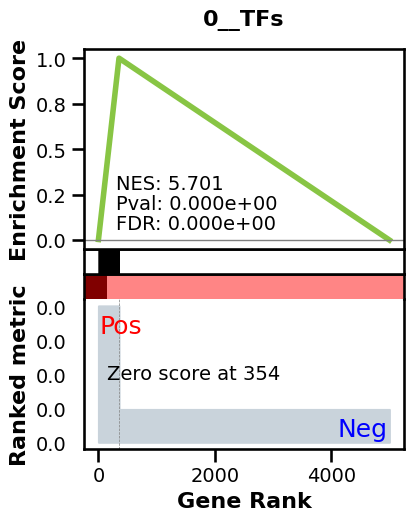

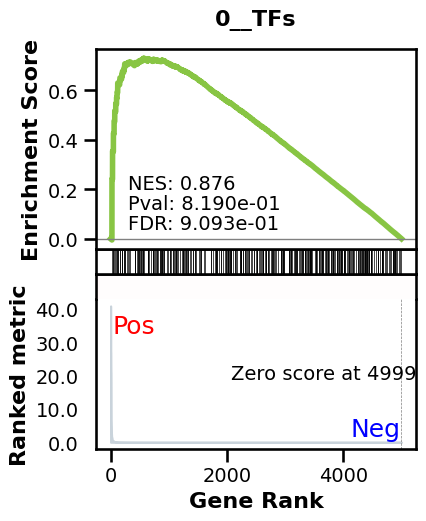

_________________________________________
TF specific enrichment


found some significant results for  3.8461538461538463 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3550 genes
intersection pct: 0.71
precision:  0.003774647887323944 
recall:  0.3165517775540237 
random precision: 0.0010247679370106238


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 46.66it/s]

  8%|▊         | 10/128 [00:00<00:02, 47.00it/s]

 12%|█▏        | 15/128 [00:00<00:02, 46.82it/s]

 16%|█▌        | 20/128 [00:00<00:02, 46.59it/s]

 20%|█▉        | 25/128 [00:00<00:02, 46.88it/s]

 23%|██▎       | 30/128 [00:00<00:02, 47.89it/s]

 28%|██▊       | 36/128 [00:00<00:01, 49.55it/s]

 33%|███▎      | 42/128 [00:00<00:01, 49.97it/s]

 37%|███▋      | 47/128 [00:00<00:01, 49.75it/s]

 41%|████▏     | 53/128 [00:01<00:01, 50.17it/s]

 46%|████▌     | 59/128 [00:01<00:01, 50.68it/s]

 51%|█████     | 65/128 [00:01<00:01, 50.85it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 50.58it/s]

 60%|██████    | 77/128 [00:01<00:01, 50.38it/s]

 65%|██████▍   | 83/128 [00:01<00:00, 50.15it/s]

 70%|██████▉   | 89/128 [00:01<00:00, 49.22it/s]

 73%|███████▎  | 94/128 [00:01<00:00, 48.52it/s]

 77%|███████▋  | 99/128 [00:02<00:00, 48.22it/s]

 81%|████████▏ | 104/128 [00:02<00:00, 47.84it/s]

 85%|████████▌ | 109/128 [00:02<00:00, 47.69it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 47.92it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 48.41it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 49.47it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 49.01it/s]

Average Precision (AP):  0.00218757364781966
Area Under Precision-Recall Curve (AUPRC):  0.001872645900390126
EPR: 4.798605048403869


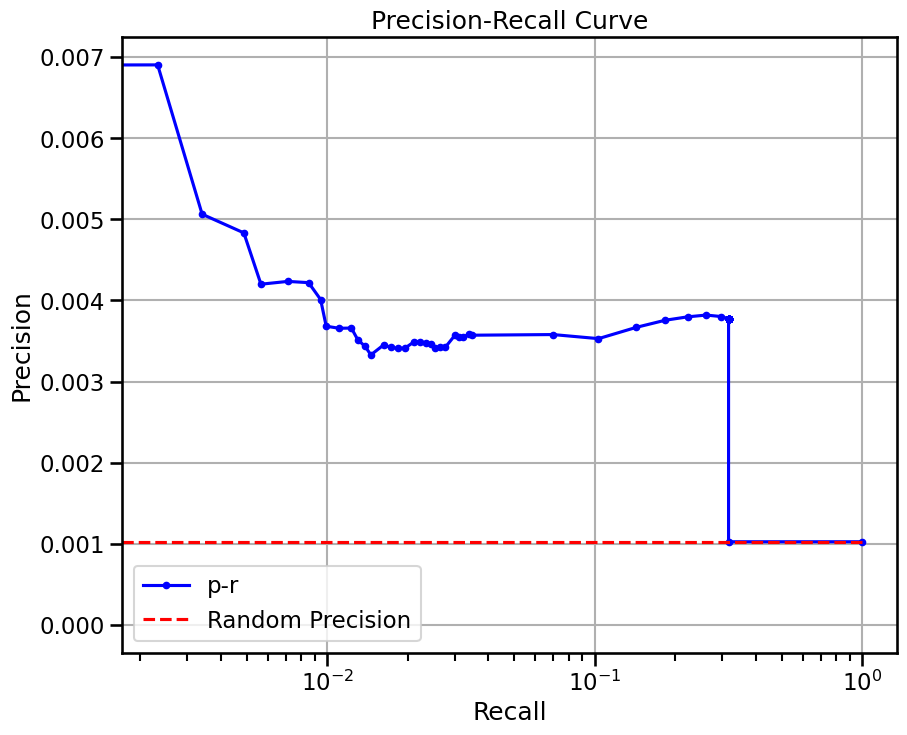

  0%|          | 0/16 [00:00<?, ?it/s]

  6%|▋         | 1/16 [00:02<00:38,  2.57s/it]

 12%|█▎        | 2/16 [00:05<00:42,  3.03s/it]

 19%|█▉        | 3/16 [00:06<00:27,  2.09s/it]

 25%|██▌       | 4/16 [00:07<00:20,  1.67s/it]

 31%|███▏      | 5/16 [00:08<00:15,  1.41s/it]

 38%|███▊      | 6/16 [00:09<00:12,  1.26s/it]

 44%|████▍     | 7/16 [00:10<00:10,  1.18s/it]

 50%|█████     | 8/16 [00:11<00:08,  1.12s/it]

 56%|█████▋    | 9/16 [00:12<00:07,  1.08s/it]

 62%|██████▎   | 10/16 [00:13<00:06,  1.04s/it]

 69%|██████▉   | 11/16 [00:14<00:05,  1.04s/it]

 75%|███████▌  | 12/16 [00:15<00:04,  1.00s/it]

 81%|████████▏ | 13/16 [00:16<00:03,  1.01s/it]

 88%|████████▊ | 14/16 [00:17<00:02,  1.00s/it]

 94%|█████████▍| 15/16 [00:18<00:00,  1.01it/s]

100%|██████████| 16/16 [00:19<00:00,  1.16it/s]

100%|██████████| 16/16 [00:19<00:00,  1.22s/it]

avg link count: 369100944, sparsity: 1.0


base enrichment


too many genes for central computation


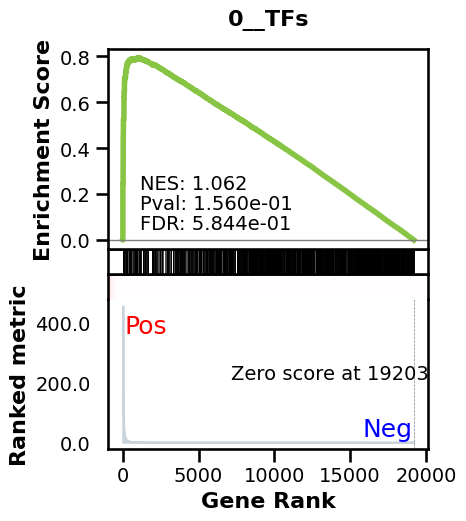

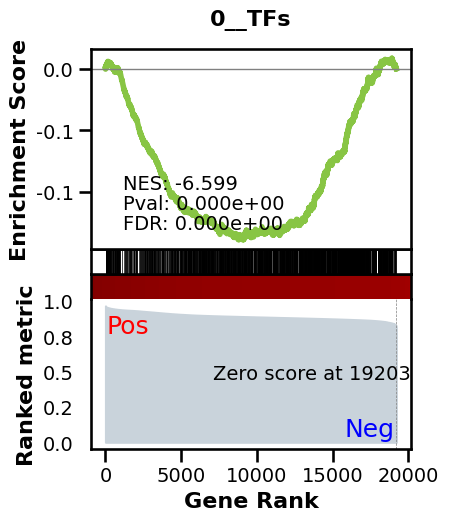

_________________________________________
TF specific enrichment


found some significant results for  19.444444444444443 % TFs

_________________________________________
loading GT,  omnipath


intersection of 11527 genes
intersection pct: 0.6002395334305353


precision:  0.0007857020165640248 
recall:  1.0 
random precision: 0.0007857653081716101


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:39,  3.20it/s]

  2%|▏         | 2/128 [00:00<00:36,  3.46it/s]

  2%|▏         | 3/128 [00:00<00:34,  3.64it/s]

  3%|▎         | 4/128 [00:01<00:33,  3.73it/s]

  4%|▍         | 5/128 [00:01<00:31,  3.86it/s]

  5%|▍         | 6/128 [00:01<00:31,  3.88it/s]

  5%|▌         | 7/128 [00:01<00:31,  3.89it/s]

  6%|▋         | 8/128 [00:02<00:31,  3.83it/s]

  7%|▋         | 9/128 [00:02<00:30,  3.92it/s]

  8%|▊         | 10/128 [00:02<00:29,  3.98it/s]

  9%|▊         | 11/128 [00:02<00:29,  3.94it/s]

  9%|▉         | 12/128 [00:03<00:29,  3.94it/s]

 10%|█         | 13/128 [00:03<00:29,  3.86it/s]

 11%|█         | 14/128 [00:03<00:29,  3.88it/s]

 12%|█▏        | 15/128 [00:03<00:28,  3.90it/s]

 12%|█▎        | 16/128 [00:04<00:28,  3.96it/s]

 13%|█▎        | 17/128 [00:04<00:28,  3.96it/s]

 14%|█▍        | 18/128 [00:04<00:27,  4.00it/s]

 15%|█▍        | 19/128 [00:04<00:27,  3.93it/s]

 16%|█▌        | 20/128 [00:05<00:27,  3.99it/s]

 16%|█▋        | 21/128 [00:05<00:27,  3.94it/s]

 17%|█▋        | 22/128 [00:05<00:26,  3.93it/s]

 18%|█▊        | 23/128 [00:05<00:27,  3.87it/s]

 19%|█▉        | 24/128 [00:06<00:26,  3.91it/s]

 20%|█▉        | 25/128 [00:06<00:26,  3.91it/s]

 20%|██        | 26/128 [00:06<00:25,  3.98it/s]

 21%|██        | 27/128 [00:06<00:25,  3.93it/s]

 22%|██▏       | 28/128 [00:07<00:25,  3.93it/s]

 23%|██▎       | 29/128 [00:07<00:25,  3.93it/s]

 23%|██▎       | 30/128 [00:07<00:25,  3.90it/s]

 24%|██▍       | 31/128 [00:07<00:24,  3.92it/s]

 25%|██▌       | 32/128 [00:08<00:24,  3.94it/s]

 26%|██▌       | 33/128 [00:08<00:24,  3.86it/s]

 27%|██▋       | 34/128 [00:08<00:24,  3.87it/s]

 27%|██▋       | 35/128 [00:08<00:23,  3.93it/s]

 28%|██▊       | 36/128 [00:09<00:23,  3.92it/s]

 29%|██▉       | 37/128 [00:09<00:22,  3.98it/s]

 30%|██▉       | 38/128 [00:09<00:22,  3.98it/s]

 30%|███       | 39/128 [00:10<00:22,  3.92it/s]

 31%|███▏      | 40/128 [00:10<00:22,  3.93it/s]

 32%|███▏      | 41/128 [00:10<00:21,  3.99it/s]

 33%|███▎      | 42/128 [00:10<00:21,  3.98it/s]

 34%|███▎      | 43/128 [00:10<00:21,  4.01it/s]

 34%|███▍      | 44/128 [00:11<00:20,  4.02it/s]

 35%|███▌      | 45/128 [00:11<00:20,  4.00it/s]

 36%|███▌      | 46/128 [00:11<00:20,  3.94it/s]

 37%|███▋      | 47/128 [00:11<00:20,  4.02it/s]

 38%|███▊      | 48/128 [00:12<00:19,  4.08it/s]

 38%|███▊      | 49/128 [00:12<00:19,  4.04it/s]

 39%|███▉      | 50/128 [00:12<00:19,  4.09it/s]

 40%|███▉      | 51/128 [00:12<00:18,  4.10it/s]

 41%|████      | 52/128 [00:13<00:18,  4.09it/s]

 41%|████▏     | 53/128 [00:13<00:18,  4.06it/s]

 42%|████▏     | 54/128 [00:13<00:18,  4.11it/s]

 43%|████▎     | 55/128 [00:13<00:17,  4.10it/s]

 44%|████▍     | 56/128 [00:14<00:17,  4.10it/s]

 45%|████▍     | 57/128 [00:14<00:17,  4.13it/s]

 45%|████▌     | 58/128 [00:14<00:16,  4.13it/s]

 46%|████▌     | 59/128 [00:14<00:16,  4.12it/s]

 47%|████▋     | 60/128 [00:15<00:16,  4.12it/s]

 48%|████▊     | 61/128 [00:15<00:16,  4.11it/s]

 48%|████▊     | 62/128 [00:15<00:16,  4.09it/s]

 49%|████▉     | 63/128 [00:15<00:15,  4.10it/s]

 50%|█████     | 64/128 [00:16<00:15,  4.18it/s]

 51%|█████     | 65/128 [00:16<00:15,  4.19it/s]

 52%|█████▏    | 66/128 [00:16<00:14,  4.19it/s]

 52%|█████▏    | 67/128 [00:16<00:14,  4.11it/s]

 53%|█████▎    | 68/128 [00:17<00:14,  4.08it/s]

 54%|█████▍    | 69/128 [00:17<00:14,  4.07it/s]

 55%|█████▍    | 70/128 [00:17<00:14,  4.07it/s]

 55%|█████▌    | 71/128 [00:17<00:13,  4.09it/s]

 56%|█████▋    | 72/128 [00:18<00:13,  4.15it/s]

 57%|█████▋    | 73/128 [00:18<00:13,  4.18it/s]

 58%|█████▊    | 74/128 [00:18<00:12,  4.17it/s]

 59%|█████▊    | 75/128 [00:18<00:12,  4.16it/s]

 59%|█████▉    | 76/128 [00:19<00:12,  4.12it/s]

 60%|██████    | 77/128 [00:19<00:12,  4.16it/s]

 61%|██████    | 78/128 [00:19<00:11,  4.22it/s]

 62%|██████▏   | 79/128 [00:19<00:11,  4.24it/s]

 62%|██████▎   | 80/128 [00:19<00:11,  4.20it/s]

 63%|██████▎   | 81/128 [00:20<00:11,  4.17it/s]

 64%|██████▍   | 82/128 [00:20<00:11,  4.13it/s]

 65%|██████▍   | 83/128 [00:20<00:10,  4.17it/s]

 66%|██████▌   | 84/128 [00:20<00:10,  4.23it/s]

 66%|██████▋   | 85/128 [00:21<00:10,  4.28it/s]

 67%|██████▋   | 86/128 [00:21<00:09,  4.25it/s]

 68%|██████▊   | 87/128 [00:21<00:09,  4.25it/s]

 69%|██████▉   | 88/128 [00:21<00:09,  4.18it/s]

 70%|██████▉   | 89/128 [00:22<00:09,  4.24it/s]

 70%|███████   | 90/128 [00:22<00:08,  4.23it/s]

 71%|███████   | 91/128 [00:22<00:08,  4.19it/s]

 72%|███████▏  | 92/128 [00:22<00:08,  4.07it/s]

 73%|███████▎  | 93/128 [00:23<00:08,  4.00it/s]

 73%|███████▎  | 94/128 [00:23<00:08,  3.85it/s]

 74%|███████▍  | 95/128 [00:23<00:08,  3.92it/s]

 75%|███████▌  | 96/128 [00:23<00:07,  4.04it/s]

 76%|███████▌  | 97/128 [00:24<00:07,  4.09it/s]

 77%|███████▋  | 98/128 [00:24<00:07,  4.08it/s]

 77%|███████▋  | 99/128 [00:24<00:07,  4.05it/s]

 78%|███████▊  | 100/128 [00:24<00:07,  3.97it/s]

 79%|███████▉  | 101/128 [00:25<00:06,  4.02it/s]

 80%|███████▉  | 102/128 [00:25<00:06,  4.05it/s]

 80%|████████  | 103/128 [00:25<00:06,  4.03it/s]

 81%|████████▏ | 104/128 [00:25<00:05,  4.09it/s]

 82%|████████▏ | 105/128 [00:26<00:05,  4.11it/s]

 83%|████████▎ | 106/128 [00:26<00:05,  4.08it/s]

 84%|████████▎ | 107/128 [00:26<00:05,  4.08it/s]

 84%|████████▍ | 108/128 [00:26<00:04,  4.06it/s]

 85%|████████▌ | 109/128 [00:27<00:04,  4.08it/s]

 86%|████████▌ | 110/128 [00:27<00:04,  4.05it/s]

 87%|████████▋ | 111/128 [00:27<00:04,  4.01it/s]

 88%|████████▊ | 112/128 [00:27<00:03,  4.08it/s]

 88%|████████▊ | 113/128 [00:28<00:03,  4.17it/s]

 89%|████████▉ | 114/128 [00:28<00:03,  4.17it/s]

 90%|████████▉ | 115/128 [00:28<00:03,  4.18it/s]

 91%|█████████ | 116/128 [00:28<00:02,  4.01it/s]

 91%|█████████▏| 117/128 [00:29<00:02,  4.05it/s]

 92%|█████████▏| 118/128 [00:29<00:02,  4.08it/s]

 93%|█████████▎| 119/128 [00:29<00:02,  4.08it/s]

 94%|█████████▍| 120/128 [00:29<00:01,  4.16it/s]

 95%|█████████▍| 121/128 [00:29<00:01,  4.17it/s]

 95%|█████████▌| 122/128 [00:30<00:01,  4.14it/s]

 96%|█████████▌| 123/128 [00:30<00:01,  4.15it/s]

 97%|█████████▋| 124/128 [00:30<00:00,  4.17it/s]

 98%|█████████▊| 125/128 [00:30<00:00,  4.17it/s]

 98%|█████████▊| 126/128 [00:31<00:00,  4.14it/s]

 99%|█████████▉| 127/128 [00:31<00:00,  4.18it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()


100%|██████████| 128/128 [00:31<00:00,  4.23it/s]

100%|██████████| 128/128 [00:31<00:00,  4.05it/s]

Average Precision (AP):  0.0007891324961484173
Area Under Precision-Recall Curve (AUPRC):  0.0007887722570565905


EPR: 2.2427561457269345


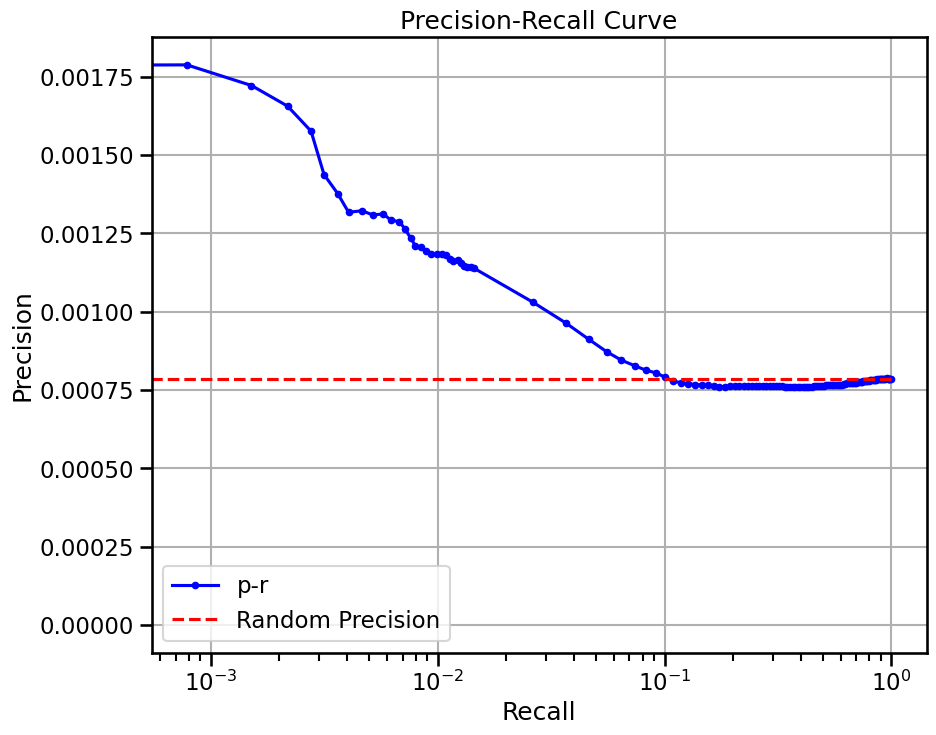

/pasteur/appa/homes/jkalfon/miniconda3/envs/scprint17/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (


  0%|          | 0/31 [00:00<?, ?it/s]

  3%|▎         | 1/31 [00:02<01:24,  2.82s/it]

  6%|▋         | 2/31 [00:04<00:57,  1.97s/it]

 10%|▉         | 3/31 [00:05<00:47,  1.69s/it]

 13%|█▎        | 4/31 [00:06<00:42,  1.56s/it]

 16%|█▌        | 5/31 [00:08<00:38,  1.49s/it]

 19%|█▉        | 6/31 [00:09<00:35,  1.43s/it]

 23%|██▎       | 7/31 [00:11<00:34,  1.46s/it]

 26%|██▌       | 8/31 [00:12<00:33,  1.45s/it]

 29%|██▉       | 9/31 [00:13<00:31,  1.44s/it]

 32%|███▏      | 10/31 [00:15<00:29,  1.43s/it]

 35%|███▌      | 11/31 [00:16<00:28,  1.42s/it]

 39%|███▊      | 12/31 [00:18<00:26,  1.40s/it]

 42%|████▏     | 13/31 [00:19<00:25,  1.40s/it]

 45%|████▌     | 14/31 [00:20<00:23,  1.41s/it]

 48%|████▊     | 15/31 [00:22<00:22,  1.39s/it]

 52%|█████▏    | 16/31 [00:23<00:21,  1.40s/it]

 55%|█████▍    | 17/31 [00:25<00:19,  1.38s/it]

 58%|█████▊    | 18/31 [00:26<00:17,  1.37s/it]

 61%|██████▏   | 19/31 [00:27<00:16,  1.39s/it]

 65%|██████▍   | 20/31 [00:29<00:15,  1.37s/it]

 68%|██████▊   | 21/31 [00:30<00:13,  1.36s/it]

 71%|███████   | 22/31 [00:31<00:12,  1.36s/it]

 74%|███████▍  | 23/31 [00:33<00:10,  1.37s/it]

 77%|███████▋  | 24/31 [00:34<00:09,  1.40s/it]

 81%|████████  | 25/31 [00:36<00:09,  1.53s/it]

 84%|████████▍ | 26/31 [00:37<00:07,  1.49s/it]

 87%|████████▋ | 27/31 [00:39<00:05,  1.48s/it]

 90%|█████████ | 28/31 [00:40<00:04,  1.47s/it]

 94%|█████████▎| 29/31 [00:42<00:02,  1.45s/it]

 97%|█████████▋| 30/31 [00:43<00:01,  1.44s/it]

100%|██████████| 31/31 [00:44<00:00,  1.35s/it]

100%|██████████| 31/31 [00:45<00:00,  1.46s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


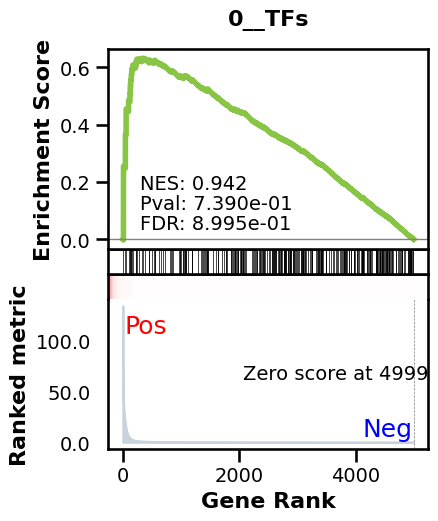

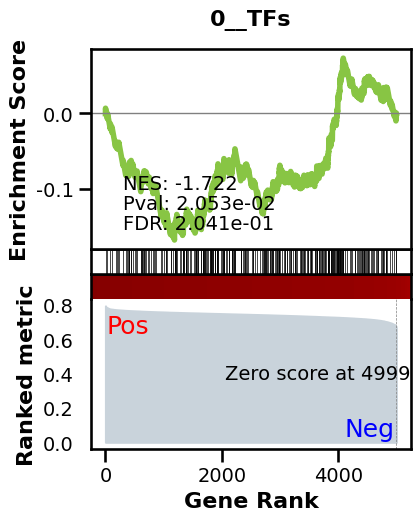

_________________________________________
TF specific enrichment


found some significant results for  8.333333333333334 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.000953231915752681 
recall:  1.0 
random precision: 0.0009534912985868993


  0%|          | 0/128 [00:00<?, ?it/s]

  5%|▍         | 6/128 [00:00<00:02, 50.34it/s]

  9%|▉         | 12/128 [00:00<00:02, 50.24it/s]

 14%|█▍        | 18/128 [00:00<00:02, 50.41it/s]

 19%|█▉        | 24/128 [00:00<00:02, 50.39it/s]

 23%|██▎       | 30/128 [00:00<00:01, 50.66it/s]

 28%|██▊       | 36/128 [00:00<00:01, 50.69it/s]

 33%|███▎      | 42/128 [00:00<00:01, 50.78it/s]

 38%|███▊      | 48/128 [00:00<00:01, 50.76it/s]

 42%|████▏     | 54/128 [00:01<00:01, 50.52it/s]

 47%|████▋     | 60/128 [00:01<00:01, 50.43it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 50.24it/s]

 56%|█████▋    | 72/128 [00:01<00:01, 50.49it/s]

 61%|██████    | 78/128 [00:01<00:00, 50.53it/s]

 66%|██████▌   | 84/128 [00:01<00:00, 50.50it/s]

 70%|███████   | 90/128 [00:01<00:00, 50.41it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 50.57it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 50.68it/s]

 84%|████████▍ | 108/128 [00:02<00:00, 50.54it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 50.66it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 50.42it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 49.59it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 50.33it/s]

Average Precision (AP):  0.0009817733107169602
Area Under Precision-Recall Curve (AUPRC):  0.0009812891409238514
EPR: 0.8954468418570982


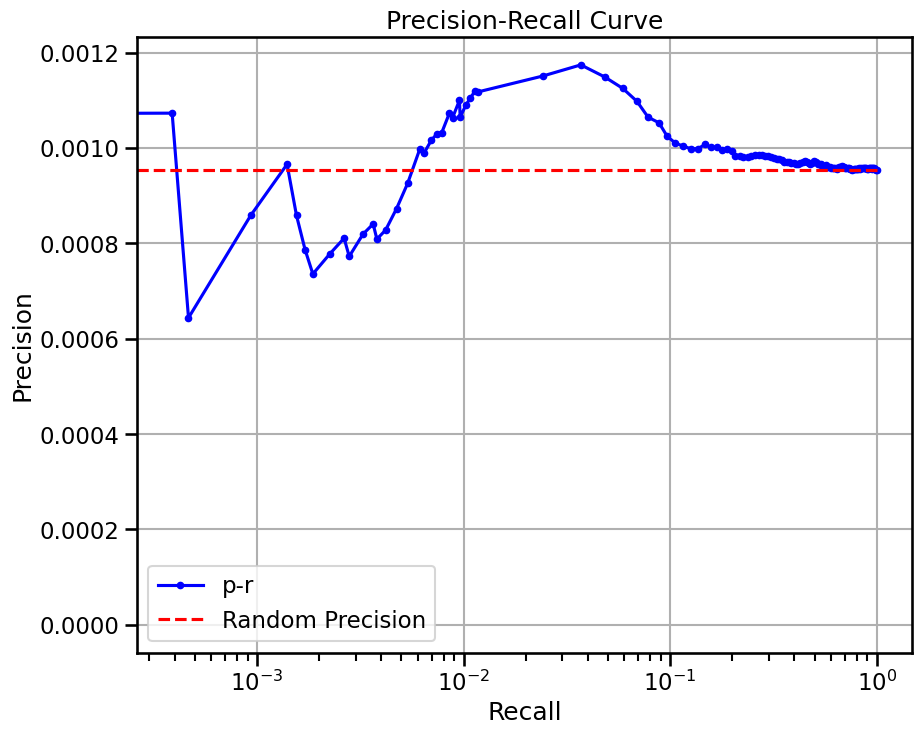

base enrichment


Top central genes: []


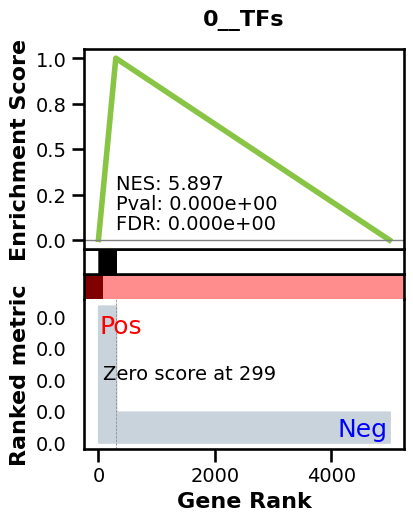

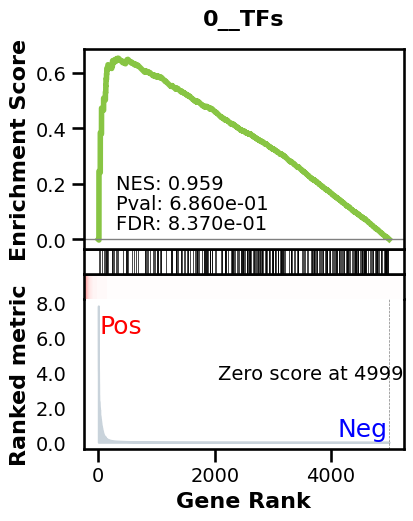

_________________________________________
TF specific enrichment


found some significant results for  4.166666666666667 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.0031289255990017686 
recall:  0.23127086406334912 
random precision: 0.0009534912985868993


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 41.81it/s]

  8%|▊         | 10/128 [00:00<00:02, 43.85it/s]

 12%|█▏        | 15/128 [00:00<00:02, 44.09it/s]

 16%|█▌        | 20/128 [00:00<00:02, 43.52it/s]

 20%|█▉        | 25/128 [00:00<00:02, 42.66it/s]

 23%|██▎       | 30/128 [00:00<00:02, 42.14it/s]

 27%|██▋       | 35/128 [00:00<00:02, 41.80it/s]

 31%|███▏      | 40/128 [00:00<00:02, 41.52it/s]

 35%|███▌      | 45/128 [00:01<00:01, 41.53it/s]

 39%|███▉      | 50/128 [00:01<00:01, 41.70it/s]

 43%|████▎     | 55/128 [00:01<00:01, 42.22it/s]

 47%|████▋     | 60/128 [00:01<00:01, 42.80it/s]

 51%|█████     | 65/128 [00:01<00:01, 43.46it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 43.52it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 43.26it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 43.81it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 44.67it/s]

 70%|███████   | 90/128 [00:02<00:00, 44.99it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 44.63it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 44.10it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 43.59it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 42.99it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 42.21it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 41.66it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 41.32it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 42.71it/s]

Average Precision (AP):  0.0017455987745239236
Area Under Precision-Recall Curve (AUPRC):  0.0015530578063691985
EPR: 3.270901388654989


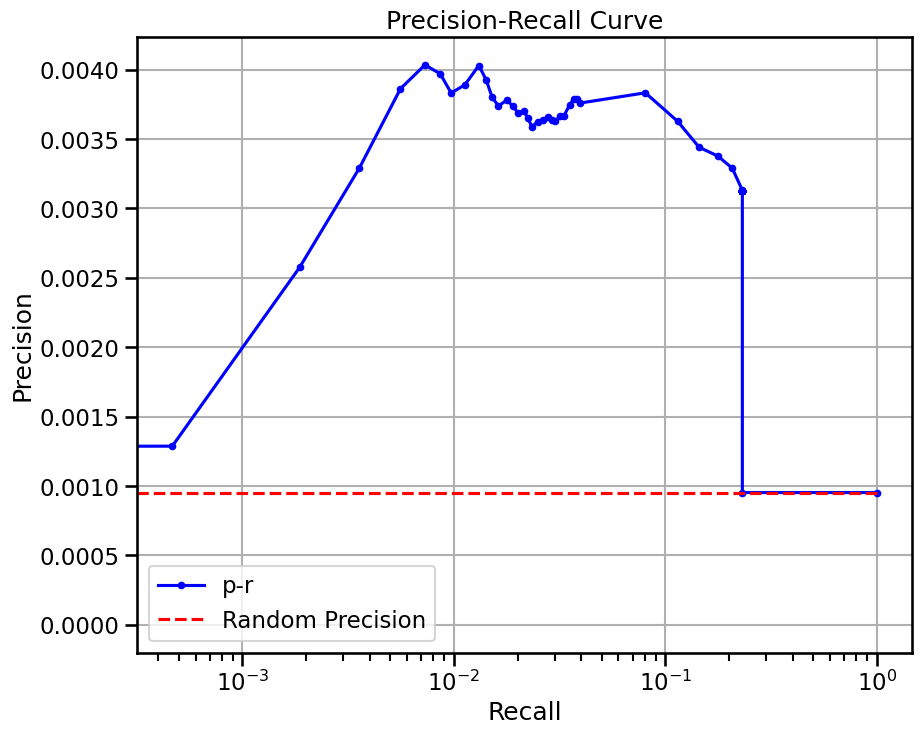

base enrichment


Top central genes: []
The DataFrame contains only the same values.


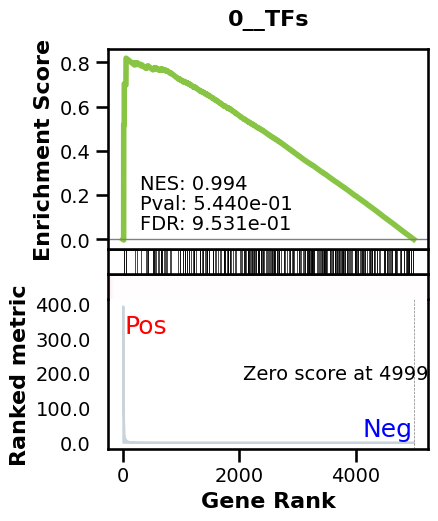

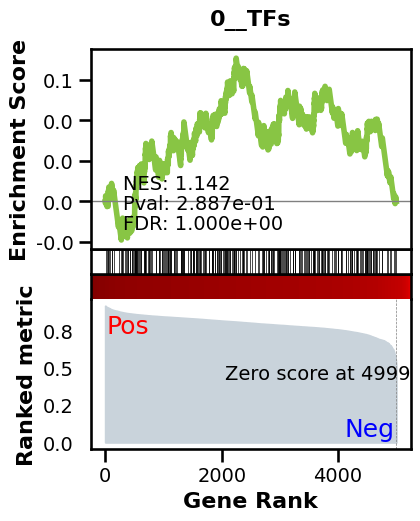

_________________________________________
TF specific enrichment


found some significant results for  16.666666666666668 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.000953231915752681 
recall:  1.0 
random precision: 0.0009534912985868993


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 43.05it/s]

  8%|▊         | 10/128 [00:00<00:02, 42.88it/s]

 12%|█▏        | 15/128 [00:00<00:02, 42.69it/s]

 16%|█▌        | 20/128 [00:00<00:02, 43.07it/s]

 20%|█▉        | 25/128 [00:00<00:02, 43.39it/s]

 23%|██▎       | 30/128 [00:00<00:02, 43.54it/s]

 27%|██▋       | 35/128 [00:00<00:02, 43.75it/s]

 31%|███▏      | 40/128 [00:00<00:01, 44.07it/s]

 35%|███▌      | 45/128 [00:01<00:01, 43.65it/s]

 39%|███▉      | 50/128 [00:01<00:01, 42.92it/s]

 43%|████▎     | 55/128 [00:01<00:01, 42.38it/s]

 47%|████▋     | 60/128 [00:01<00:01, 42.16it/s]

 51%|█████     | 65/128 [00:01<00:01, 41.98it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 41.57it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 41.33it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 41.79it/s]

 66%|██████▋   | 85/128 [00:01<00:01, 42.10it/s]

 70%|███████   | 90/128 [00:02<00:00, 42.53it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 42.39it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 42.98it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 44.09it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 44.60it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 44.20it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 44.31it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 43.95it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 43.01it/s]

Average Precision (AP):  0.0009760541533100918
Area Under Precision-Recall Curve (AUPRC):  0.0009740184253918943
EPR: 0.8139160355411694


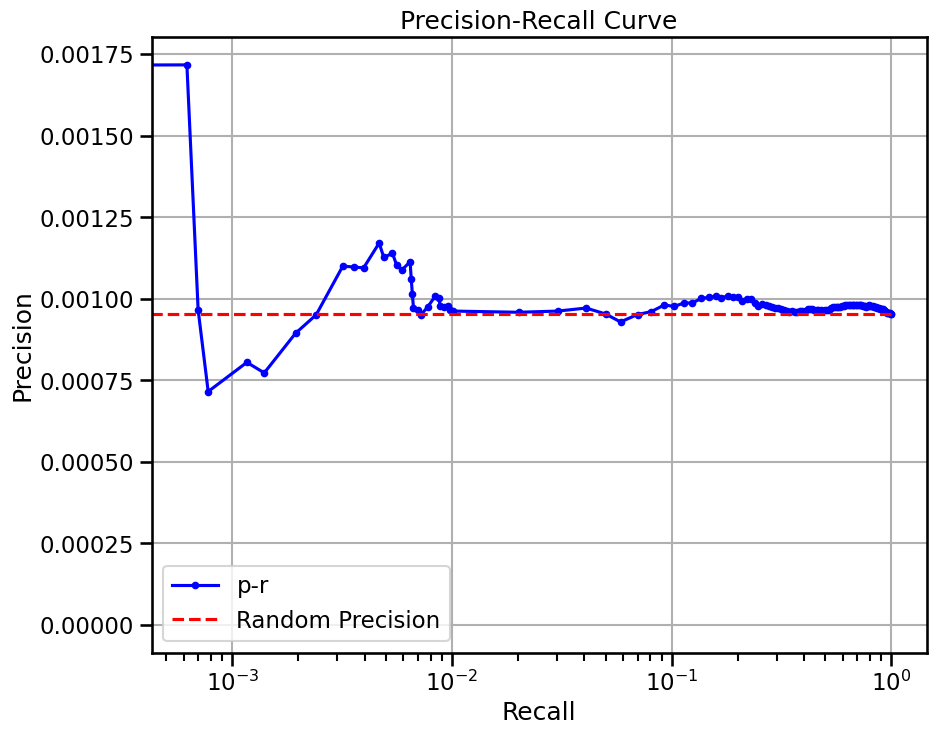

base enrichment


Top central genes: []


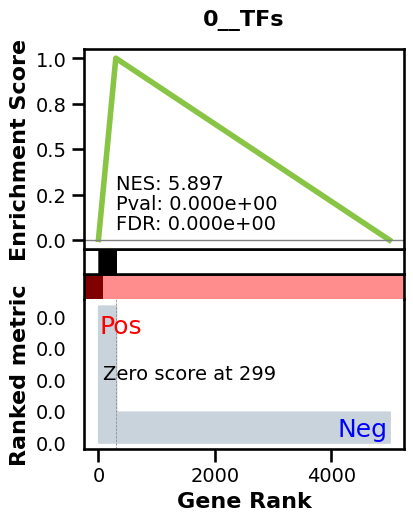

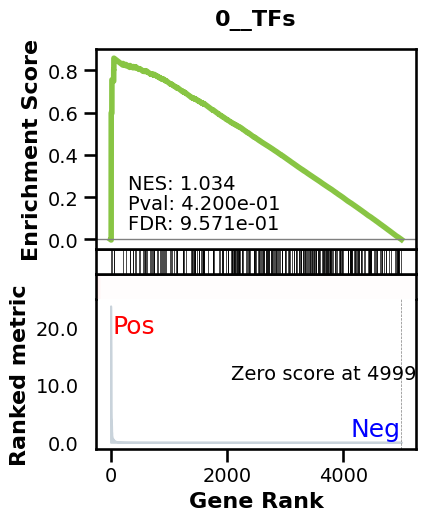

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3676 genes
intersection pct: 0.7352
precision:  0.0031289255990017686 
recall:  0.23127086406334912 
random precision: 0.0009534912985868993


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 41.27it/s]

  8%|▊         | 10/128 [00:00<00:02, 40.60it/s]

 12%|█▏        | 15/128 [00:00<00:02, 40.61it/s]

 16%|█▌        | 20/128 [00:00<00:02, 41.93it/s]

 20%|█▉        | 25/128 [00:00<00:02, 43.08it/s]

 23%|██▎       | 30/128 [00:00<00:02, 44.01it/s]

 27%|██▋       | 35/128 [00:00<00:02, 44.76it/s]

 31%|███▏      | 40/128 [00:00<00:01, 44.99it/s]

 35%|███▌      | 45/128 [00:01<00:01, 44.74it/s]

 39%|███▉      | 50/128 [00:01<00:01, 44.90it/s]

 43%|████▎     | 55/128 [00:01<00:01, 44.95it/s]

 47%|████▋     | 60/128 [00:01<00:01, 45.23it/s]

 51%|█████     | 65/128 [00:01<00:01, 45.15it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 44.30it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 44.23it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 43.49it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 43.08it/s]

 70%|███████   | 90/128 [00:02<00:00, 42.71it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 42.37it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 42.77it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 43.47it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 44.25it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 44.34it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 44.14it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 43.92it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 43.68it/s]

Average Precision (AP):  0.0017165873264429956
Area Under Precision-Recall Curve (AUPRC):  0.0015223487177504521
EPR: 4.17755685749677


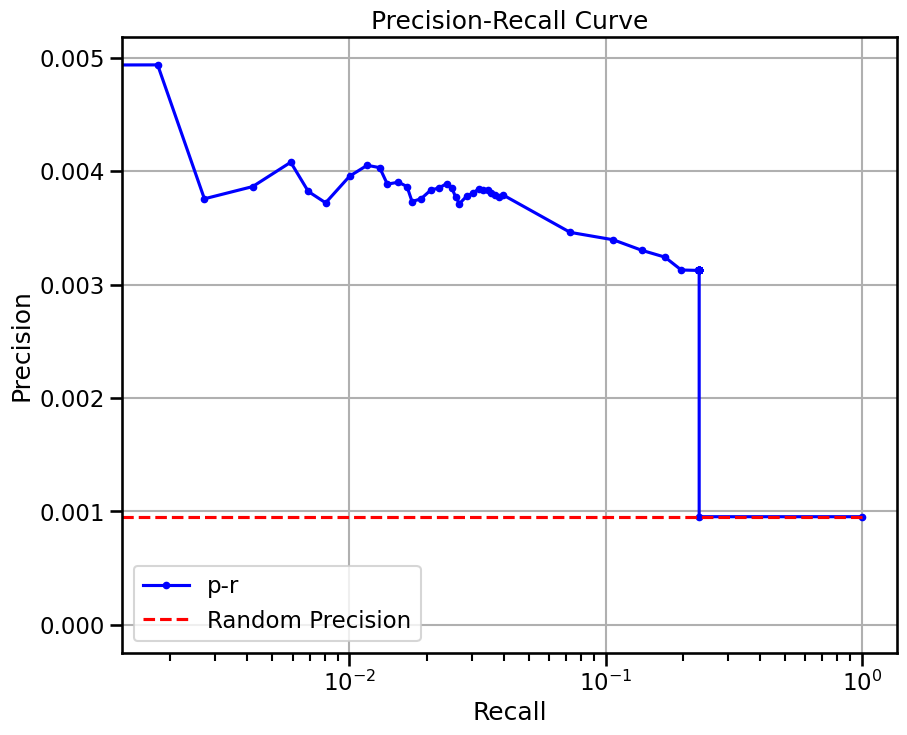

  0%|          | 0/8 [00:00<?, ?it/s]

 12%|█▎        | 1/8 [00:03<00:21,  3.06s/it]

 25%|██▌       | 2/8 [00:04<00:12,  2.15s/it]

 38%|███▊      | 3/8 [00:05<00:09,  1.80s/it]

 50%|█████     | 4/8 [00:06<00:05,  1.50s/it]

 62%|██████▎   | 5/8 [00:08<00:03,  1.33s/it]

 75%|███████▌  | 6/8 [00:09<00:02,  1.23s/it]

 88%|████████▊ | 7/8 [00:10<00:01,  1.16s/it]

100%|██████████| 8/8 [00:10<00:00,  1.13it/s]

100%|██████████| 8/8 [00:10<00:00,  1.33s/it]

avg link count: 482988529, sparsity: 1.0


base enrichment


too many genes for central computation


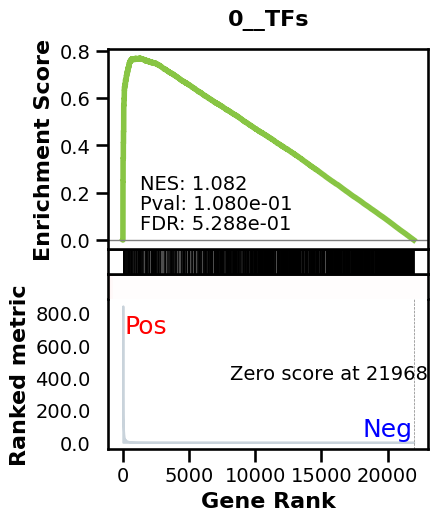

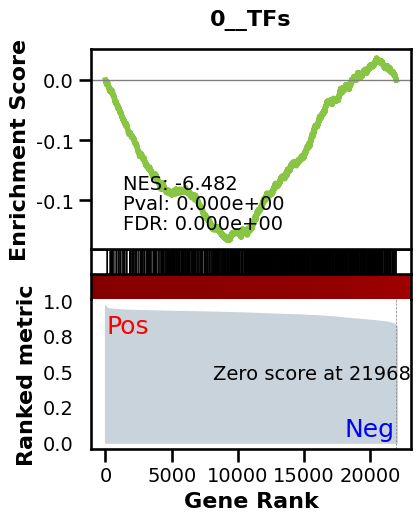

_________________________________________
TF specific enrichment


found some significant results for  35.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12149 genes
intersection pct: 0.5530065091720151


precision:  0.0006843210855807559 
recall:  1.0 
random precision: 0.0006843705521909613


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:43,  2.90it/s]

  2%|▏         | 2/128 [00:00<00:43,  2.88it/s]

  2%|▏         | 3/128 [00:01<00:42,  2.91it/s]

  3%|▎         | 4/128 [00:01<00:40,  3.04it/s]

  4%|▍         | 5/128 [00:01<00:38,  3.16it/s]

  5%|▍         | 6/128 [00:01<00:39,  3.12it/s]

  5%|▌         | 7/128 [00:02<00:40,  3.00it/s]

  6%|▋         | 8/128 [00:02<00:40,  2.98it/s]

  7%|▋         | 9/128 [00:03<00:40,  2.96it/s]

  8%|▊         | 10/128 [00:03<00:38,  3.03it/s]

  9%|▊         | 11/128 [00:03<00:37,  3.10it/s]

  9%|▉         | 12/128 [00:03<00:37,  3.08it/s]

 10%|█         | 13/128 [00:04<00:37,  3.09it/s]

 11%|█         | 14/128 [00:04<00:37,  3.03it/s]

 12%|█▏        | 15/128 [00:04<00:37,  2.99it/s]

 12%|█▎        | 16/128 [00:05<00:37,  3.00it/s]

 13%|█▎        | 17/128 [00:05<00:35,  3.10it/s]

 14%|█▍        | 18/128 [00:05<00:35,  3.12it/s]

 15%|█▍        | 19/128 [00:06<00:35,  3.08it/s]

 16%|█▌        | 20/128 [00:06<00:35,  3.02it/s]

 16%|█▋        | 21/128 [00:06<00:36,  2.95it/s]

 17%|█▋        | 22/128 [00:07<00:35,  2.99it/s]

 18%|█▊        | 23/128 [00:07<00:33,  3.10it/s]

 19%|█▉        | 24/128 [00:07<00:33,  3.10it/s]

 20%|█▉        | 25/128 [00:08<00:33,  3.05it/s]

 20%|██        | 26/128 [00:08<00:34,  3.00it/s]

 21%|██        | 27/128 [00:08<00:34,  2.95it/s]

 22%|██▏       | 28/128 [00:09<00:33,  3.02it/s]

 23%|██▎       | 29/128 [00:09<00:32,  3.07it/s]

 23%|██▎       | 30/128 [00:09<00:31,  3.08it/s]

 24%|██▍       | 31/128 [00:10<00:31,  3.06it/s]

 25%|██▌       | 32/128 [00:10<00:31,  3.01it/s]

 26%|██▌       | 33/128 [00:10<00:31,  3.03it/s]

 27%|██▋       | 34/128 [00:11<00:31,  3.01it/s]

 27%|██▋       | 35/128 [00:11<00:30,  3.00it/s]

 28%|██▊       | 36/128 [00:11<00:30,  3.02it/s]

 29%|██▉       | 37/128 [00:12<00:30,  3.02it/s]

 30%|██▉       | 38/128 [00:12<00:30,  3.00it/s]

 30%|███       | 39/128 [00:12<00:29,  3.02it/s]

 31%|███▏      | 40/128 [00:13<00:29,  3.01it/s]

 32%|███▏      | 41/128 [00:13<00:28,  3.01it/s]

 33%|███▎      | 42/128 [00:13<00:28,  3.07it/s]

 34%|███▎      | 43/128 [00:14<00:27,  3.11it/s]

 34%|███▍      | 44/128 [00:14<00:27,  3.07it/s]

 35%|███▌      | 45/128 [00:14<00:27,  2.98it/s]

 36%|███▌      | 46/128 [00:15<00:27,  2.95it/s]

 37%|███▋      | 47/128 [00:15<00:26,  3.01it/s]

 38%|███▊      | 48/128 [00:15<00:25,  3.10it/s]

 38%|███▊      | 49/128 [00:16<00:25,  3.13it/s]

 39%|███▉      | 50/128 [00:16<00:25,  3.06it/s]

 40%|███▉      | 51/128 [00:16<00:25,  3.01it/s]

 41%|████      | 52/128 [00:17<00:25,  2.95it/s]

 41%|████▏     | 53/128 [00:17<00:25,  2.99it/s]

 42%|████▏     | 54/128 [00:17<00:24,  3.04it/s]

 43%|████▎     | 55/128 [00:18<00:23,  3.12it/s]

 44%|████▍     | 56/128 [00:18<00:23,  3.09it/s]

 45%|████▍     | 57/128 [00:18<00:23,  2.98it/s]

 45%|████▌     | 58/128 [00:19<00:23,  3.00it/s]

 46%|████▌     | 59/128 [00:19<00:22,  3.02it/s]

 47%|████▋     | 60/128 [00:19<00:21,  3.09it/s]

 48%|████▊     | 61/128 [00:20<00:21,  3.09it/s]

 48%|████▊     | 62/128 [00:20<00:21,  3.03it/s]

 49%|████▉     | 63/128 [00:20<00:21,  2.97it/s]

 50%|█████     | 64/128 [00:21<00:21,  2.99it/s]

 51%|█████     | 65/128 [00:21<00:20,  3.02it/s]

 52%|█████▏    | 66/128 [00:21<00:20,  3.08it/s]

 52%|█████▏    | 67/128 [00:22<00:19,  3.13it/s]

 53%|█████▎    | 68/128 [00:22<00:19,  3.10it/s]

 54%|█████▍    | 69/128 [00:22<00:19,  3.04it/s]

 55%|█████▍    | 70/128 [00:23<00:19,  3.02it/s]

 55%|█████▌    | 71/128 [00:23<00:18,  3.04it/s]

 56%|█████▋    | 72/128 [00:23<00:18,  3.07it/s]

 57%|█████▋    | 73/128 [00:24<00:17,  3.08it/s]

 58%|█████▊    | 74/128 [00:24<00:17,  3.09it/s]

 59%|█████▊    | 75/128 [00:24<00:17,  3.02it/s]

 59%|█████▉    | 76/128 [00:25<00:17,  3.05it/s]

 60%|██████    | 77/128 [00:25<00:16,  3.00it/s]

 61%|██████    | 78/128 [00:25<00:16,  3.02it/s]

 62%|██████▏   | 79/128 [00:25<00:15,  3.09it/s]

 62%|██████▎   | 80/128 [00:26<00:15,  3.10it/s]

 63%|██████▎   | 81/128 [00:26<00:15,  3.10it/s]

 64%|██████▍   | 82/128 [00:26<00:15,  3.03it/s]

 65%|██████▍   | 83/128 [00:27<00:15,  2.98it/s]

 66%|██████▌   | 84/128 [00:27<00:14,  2.99it/s]

 66%|██████▋   | 85/128 [00:27<00:14,  3.05it/s]

 67%|██████▋   | 86/128 [00:28<00:13,  3.11it/s]

 68%|██████▊   | 87/128 [00:28<00:13,  3.09it/s]

 69%|██████▉   | 88/128 [00:28<00:13,  3.01it/s]

 70%|██████▉   | 89/128 [00:29<00:13,  2.97it/s]

 70%|███████   | 90/128 [00:29<00:12,  3.00it/s]

 71%|███████   | 91/128 [00:29<00:11,  3.11it/s]

 72%|███████▏  | 92/128 [00:30<00:11,  3.11it/s]

 73%|███████▎  | 93/128 [00:30<00:11,  3.01it/s]

 73%|███████▎  | 94/128 [00:30<00:11,  2.97it/s]

 74%|███████▍  | 95/128 [00:31<00:11,  2.98it/s]

 75%|███████▌  | 96/128 [00:31<00:10,  3.02it/s]

 76%|███████▌  | 97/128 [00:31<00:10,  3.01it/s]

 77%|███████▋  | 98/128 [00:32<00:09,  3.07it/s]

 77%|███████▋  | 99/128 [00:32<00:09,  3.02it/s]

 78%|███████▊  | 100/128 [00:32<00:09,  3.03it/s]

 79%|███████▉  | 101/128 [00:33<00:08,  3.02it/s]

 80%|███████▉  | 102/128 [00:33<00:08,  3.01it/s]

 80%|████████  | 103/128 [00:33<00:08,  3.05it/s]

 81%|████████▏ | 104/128 [00:34<00:07,  3.05it/s]

 82%|████████▏ | 105/128 [00:34<00:07,  3.06it/s]

 83%|████████▎ | 106/128 [00:34<00:07,  3.05it/s]

 84%|████████▎ | 107/128 [00:35<00:06,  3.04it/s]

 84%|████████▍ | 108/128 [00:35<00:06,  3.03it/s]

 85%|████████▌ | 109/128 [00:35<00:06,  3.03it/s]

 86%|████████▌ | 110/128 [00:36<00:05,  3.07it/s]

 87%|████████▋ | 111/128 [00:36<00:05,  3.08it/s]

 88%|████████▊ | 112/128 [00:36<00:05,  3.13it/s]

 88%|████████▊ | 113/128 [00:37<00:04,  3.07it/s]

 89%|████████▉ | 114/128 [00:37<00:04,  3.01it/s]

 90%|████████▉ | 115/128 [00:37<00:04,  2.93it/s]

 91%|█████████ | 116/128 [00:38<00:03,  3.02it/s]

 91%|█████████▏| 117/128 [00:38<00:03,  3.11it/s]

 92%|█████████▏| 118/128 [00:38<00:03,  3.12it/s]

 93%|█████████▎| 119/128 [00:39<00:02,  3.07it/s]

 94%|█████████▍| 120/128 [00:39<00:02,  3.00it/s]

 95%|█████████▍| 121/128 [00:39<00:02,  2.95it/s]

 95%|█████████▌| 122/128 [00:40<00:01,  3.03it/s]

 96%|█████████▌| 123/128 [00:40<00:01,  3.13it/s]

 97%|█████████▋| 124/128 [00:40<00:01,  3.15it/s]

 98%|█████████▊| 125/128 [00:41<00:00,  3.11it/s]

 98%|█████████▊| 126/128 [00:41<00:00,  3.04it/s]

 99%|█████████▉| 127/128 [00:41<00:00,  2.99it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()


100%|██████████| 128/128 [00:42<00:00,  3.04it/s]

100%|██████████| 128/128 [00:42<00:00,  3.04it/s]

Average Precision (AP):  0.0006886180124388286
Area Under Precision-Recall Curve (AUPRC):  0.0006873754218974428


EPR: 1.4175623872540997


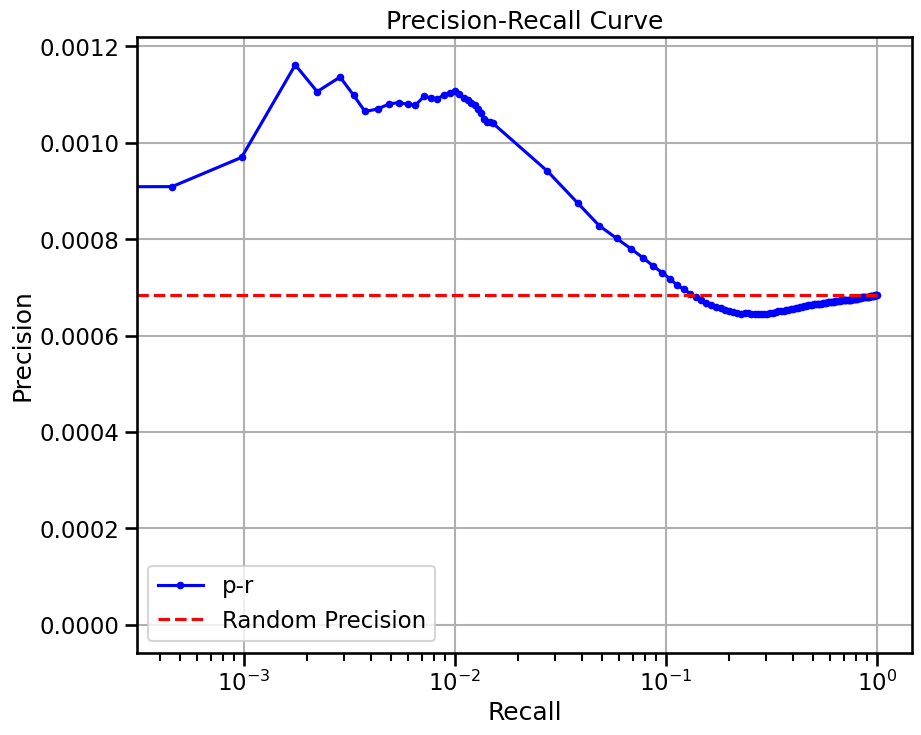

  0%|          | 0/15 [00:00<?, ?it/s]

  7%|▋         | 1/15 [00:02<00:41,  2.97s/it]

 13%|█▎        | 2/15 [00:04<00:27,  2.13s/it]

 20%|██        | 3/15 [00:06<00:27,  2.26s/it]

 27%|██▋       | 4/15 [00:08<00:21,  1.95s/it]

 33%|███▎      | 5/15 [00:09<00:17,  1.77s/it]

 40%|████      | 6/15 [00:11<00:14,  1.66s/it]

 47%|████▋     | 7/15 [00:12<00:12,  1.60s/it]

 53%|█████▎    | 8/15 [00:14<00:10,  1.55s/it]

 60%|██████    | 9/15 [00:15<00:09,  1.52s/it]

 67%|██████▋   | 10/15 [00:17<00:07,  1.49s/it]

 73%|███████▎  | 11/15 [00:18<00:05,  1.48s/it]

 80%|████████  | 12/15 [00:19<00:04,  1.46s/it]

 87%|████████▋ | 13/15 [00:21<00:02,  1.44s/it]

 93%|█████████▎| 14/15 [00:22<00:01,  1.44s/it]

100%|██████████| 15/15 [00:23<00:00,  1.24s/it]

100%|██████████| 15/15 [00:23<00:00,  1.59s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


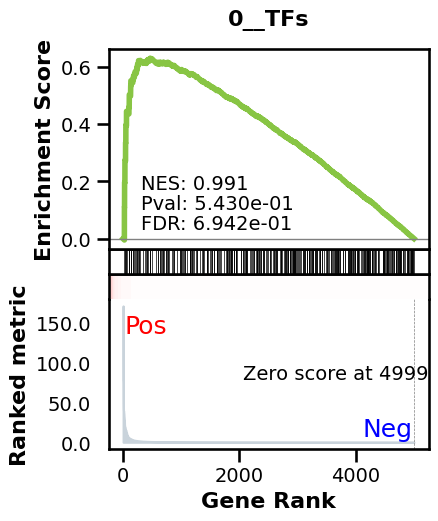

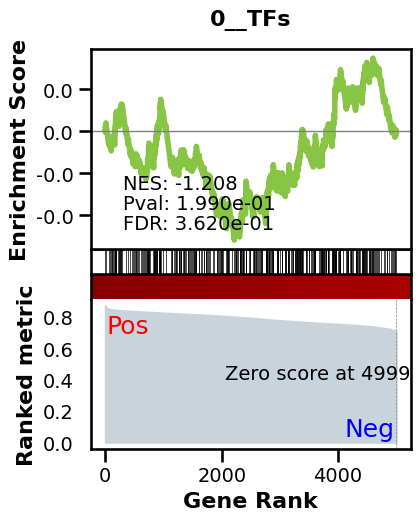

_________________________________________
TF specific enrichment


found some significant results for  18.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.0014311278203977488 
recall:  1.0 
random precision: 0.001431520555804005


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 42.45it/s]

  8%|▊         | 10/128 [00:00<00:02, 42.42it/s]

 12%|█▏        | 15/128 [00:00<00:02, 42.70it/s]

 16%|█▌        | 20/128 [00:00<00:02, 43.08it/s]

 20%|█▉        | 25/128 [00:00<00:02, 42.92it/s]

 23%|██▎       | 30/128 [00:00<00:02, 43.14it/s]

 27%|██▋       | 35/128 [00:00<00:02, 44.25it/s]

 31%|███▏      | 40/128 [00:00<00:01, 44.98it/s]

 35%|███▌      | 45/128 [00:01<00:01, 45.41it/s]

 39%|███▉      | 50/128 [00:01<00:01, 45.93it/s]

 43%|████▎     | 55/128 [00:01<00:01, 45.26it/s]

 47%|████▋     | 60/128 [00:01<00:01, 44.48it/s]

 51%|█████     | 65/128 [00:01<00:01, 44.06it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 43.92it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 43.91it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 43.59it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 43.80it/s]

 70%|███████   | 90/128 [00:02<00:00, 43.82it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 43.55it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 43.18it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 43.00it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 43.44it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 43.98it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 44.03it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 44.15it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 43.95it/s]

Average Precision (AP):  0.0015453786886486791
Area Under Precision-Recall Curve (AUPRC):  0.001542043772071902
EPR: 2.06364761584625


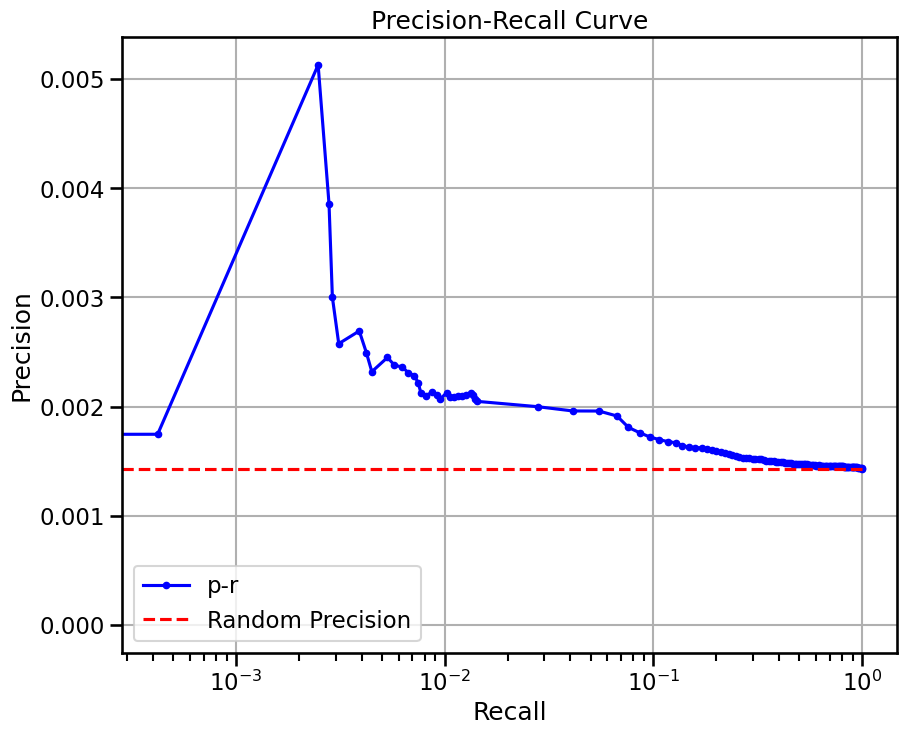

base enrichment


Top central genes: []


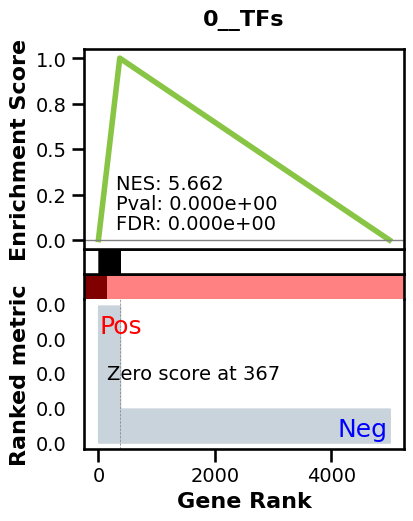

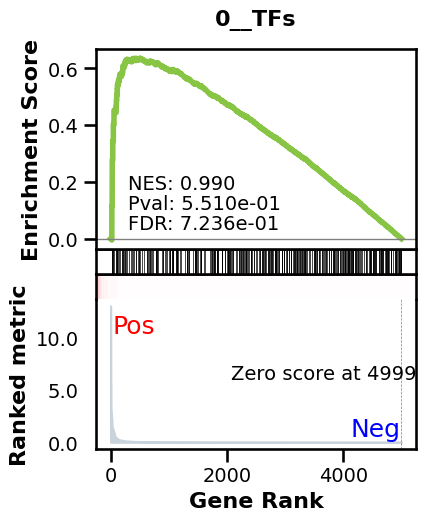

_________________________________________
TF specific enrichment


found some significant results for  8.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.00664551720623272 
recall:  0.4114862732723257 
random precision: 0.001431520555804005


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 45.98it/s]

  8%|▊         | 10/128 [00:00<00:02, 46.30it/s]

 12%|█▏        | 15/128 [00:00<00:02, 45.40it/s]

 16%|█▌        | 20/128 [00:00<00:02, 45.54it/s]

 20%|█▉        | 25/128 [00:00<00:02, 44.67it/s]

 23%|██▎       | 30/128 [00:00<00:02, 43.62it/s]

 27%|██▋       | 35/128 [00:00<00:02, 43.27it/s]

 31%|███▏      | 40/128 [00:00<00:02, 42.93it/s]

 35%|███▌      | 45/128 [00:01<00:01, 42.86it/s]

 39%|███▉      | 50/128 [00:01<00:01, 42.79it/s]

 43%|████▎     | 55/128 [00:01<00:01, 42.55it/s]

 47%|████▋     | 60/128 [00:01<00:01, 42.50it/s]

 51%|█████     | 65/128 [00:01<00:01, 42.45it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 42.20it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 42.83it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 44.00it/s]

 66%|██████▋   | 85/128 [00:01<00:00, 44.92it/s]

 70%|███████   | 90/128 [00:02<00:00, 45.65it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 46.09it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 45.90it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 45.44it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 45.68it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 45.02it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 44.14it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 43.64it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 43.99it/s]

Average Precision (AP):  0.00438166805233727
Area Under Precision-Recall Curve (AUPRC):  0.00377791473112482
EPR: 7.101771872006855


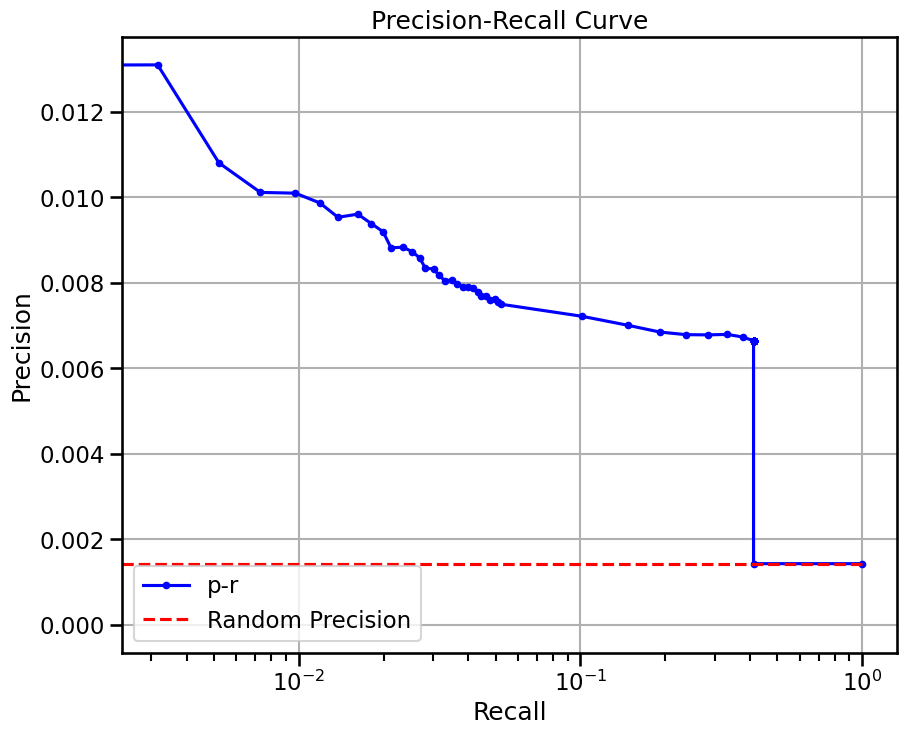

base enrichment


Top central genes: []
The DataFrame contains only the same values.


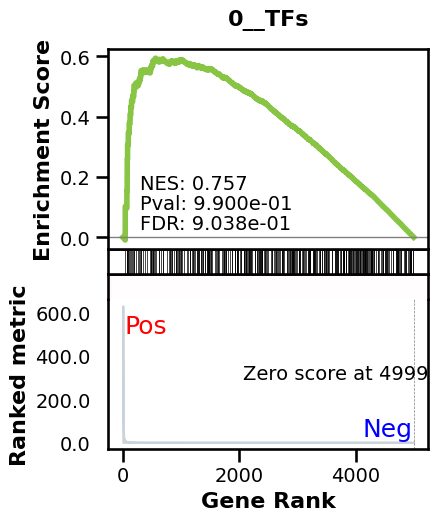

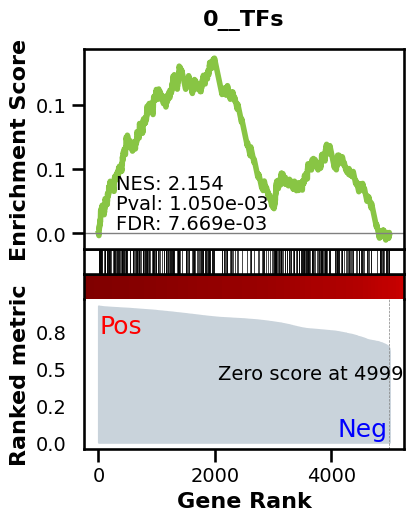

_________________________________________
TF specific enrichment


found some significant results for  2.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.0014311278203977488 
recall:  1.0 
random precision: 0.001431520555804005


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 42.21it/s]

  8%|▊         | 10/128 [00:00<00:02, 43.46it/s]

 12%|█▏        | 15/128 [00:00<00:02, 44.12it/s]

 16%|█▌        | 20/128 [00:00<00:02, 45.07it/s]

 20%|█▉        | 25/128 [00:00<00:02, 45.59it/s]

 23%|██▎       | 30/128 [00:00<00:02, 45.56it/s]

 27%|██▋       | 35/128 [00:00<00:02, 45.63it/s]

 31%|███▏      | 40/128 [00:00<00:01, 45.63it/s]

 35%|███▌      | 45/128 [00:00<00:01, 45.47it/s]

 39%|███▉      | 50/128 [00:01<00:01, 44.89it/s]

 43%|████▎     | 55/128 [00:01<00:01, 44.67it/s]

 47%|████▋     | 60/128 [00:01<00:01, 44.04it/s]

 51%|█████     | 65/128 [00:01<00:01, 43.08it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 42.60it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 42.63it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 42.78it/s]

 66%|██████▋   | 85/128 [00:01<00:01, 42.68it/s]

 70%|███████   | 90/128 [00:02<00:00, 42.59it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 43.45it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 44.32it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 44.55it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 44.54it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 44.96it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 45.24it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 44.79it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 44.18it/s]

Average Precision (AP):  0.001275878510459289
Area Under Precision-Recall Curve (AUPRC):  0.0012586228202724264
EPR: 2.174888933312672


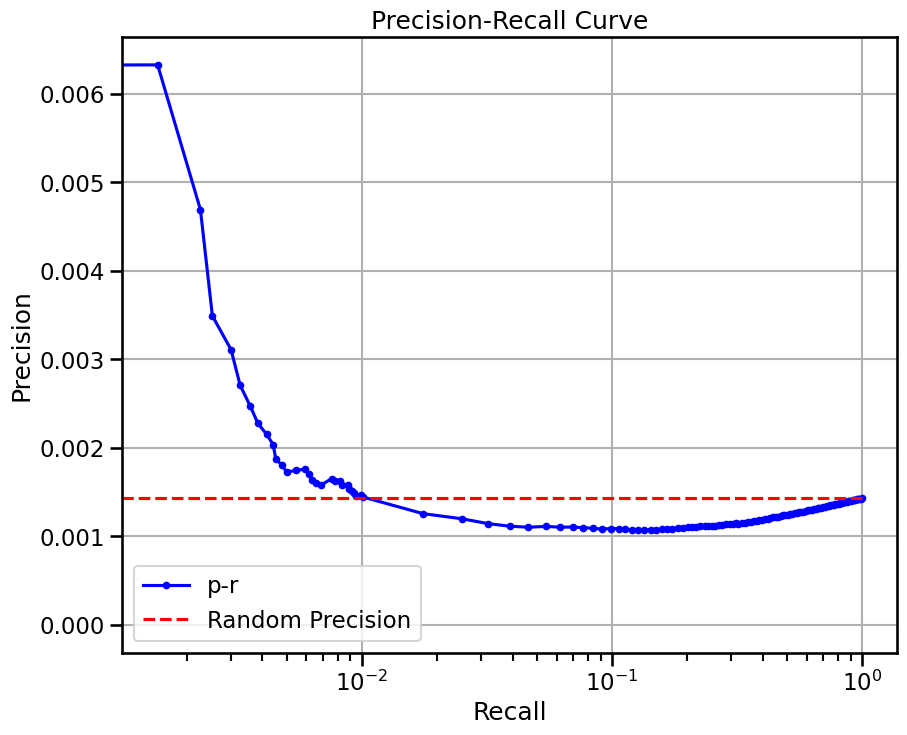

base enrichment


Top central genes: []


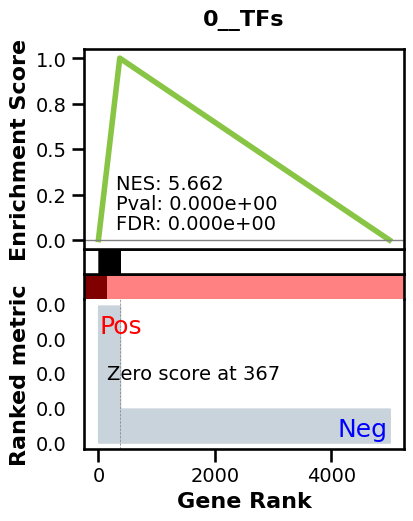

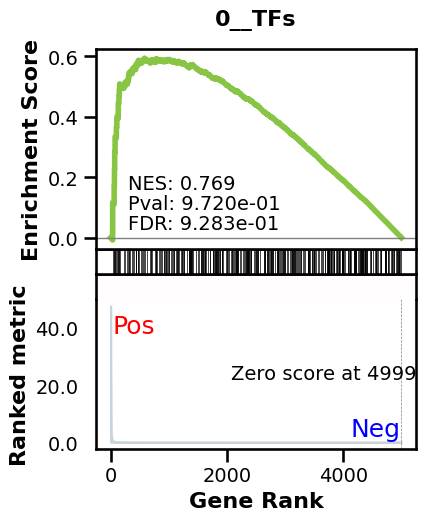

_________________________________________
TF specific enrichment


found some significant results for  0.0 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3645 genes
intersection pct: 0.729
precision:  0.00664551720623272 
recall:  0.4114862732723257 
random precision: 0.001431520555804005


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 49.20it/s]

  8%|▊         | 10/128 [00:00<00:02, 49.57it/s]

 12%|█▎        | 16/128 [00:00<00:02, 50.01it/s]

 16%|█▋        | 21/128 [00:00<00:02, 49.44it/s]

 20%|██        | 26/128 [00:00<00:02, 49.20it/s]

 24%|██▍       | 31/128 [00:00<00:01, 49.16it/s]

 28%|██▊       | 36/128 [00:00<00:01, 49.10it/s]

 32%|███▏      | 41/128 [00:00<00:01, 49.15it/s]

 36%|███▌      | 46/128 [00:00<00:01, 49.27it/s]

 40%|███▉      | 51/128 [00:01<00:01, 49.21it/s]

 44%|████▍     | 56/128 [00:01<00:01, 49.34it/s]

 48%|████▊     | 61/128 [00:01<00:01, 49.19it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 49.39it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 49.36it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 49.38it/s]

 63%|██████▎   | 81/128 [00:01<00:00, 49.37it/s]

 67%|██████▋   | 86/128 [00:01<00:00, 49.16it/s]

 71%|███████   | 91/128 [00:01<00:00, 49.31it/s]

 75%|███████▌  | 96/128 [00:01<00:00, 49.32it/s]

 79%|███████▉  | 101/128 [00:02<00:00, 49.01it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 48.98it/s]

 87%|████████▋ | 111/128 [00:02<00:00, 48.85it/s]

 91%|█████████ | 116/128 [00:02<00:00, 48.81it/s]

 95%|█████████▍| 121/128 [00:02<00:00, 48.93it/s]

 98%|█████████▊| 126/128 [00:02<00:00, 49.14it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:02<00:00, 49.18it/s]

Average Precision (AP):  0.0038393288836781813
Area Under Precision-Recall Curve (AUPRC):  0.0032176949159785917
EPR: 3.8519833965392025


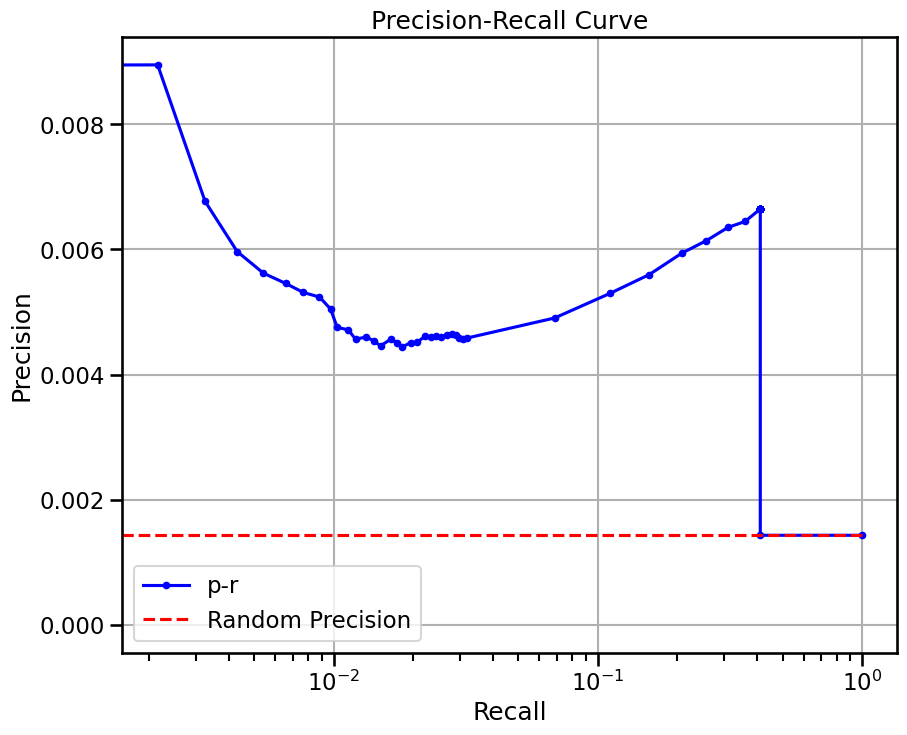

  0%|          | 0/8 [00:00<?, ?it/s]

 12%|█▎        | 1/8 [00:02<00:16,  2.40s/it]

 25%|██▌       | 2/8 [00:03<00:09,  1.59s/it]

 38%|███▊      | 3/8 [00:04<00:06,  1.32s/it]

 50%|█████     | 4/8 [00:05<00:04,  1.19s/it]

 62%|██████▎   | 5/8 [00:06<00:03,  1.13s/it]

 75%|███████▌  | 6/8 [00:07<00:02,  1.07s/it]

 88%|████████▊ | 7/8 [00:08<00:01,  1.04s/it]

100%|██████████| 8/8 [00:08<00:00,  1.29it/s]

100%|██████████| 8/8 [00:08<00:00,  1.11s/it]

avg link count: 512614881, sparsity: 1.0


base enrichment


too many genes for central computation


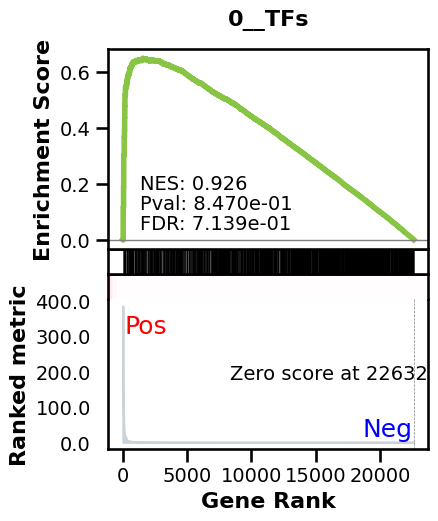

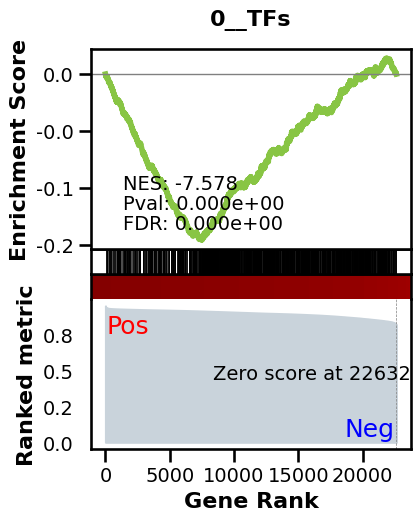

_________________________________________
TF specific enrichment


found some significant results for  35.714285714285715 % TFs

_________________________________________
loading GT,  omnipath


intersection of 12346 genes
intersection pct: 0.5454866787434277


precision:  0.0006785689419140051 
recall:  1.0 
random precision: 0.0006786168059855233


  0%|          | 0/128 [00:00<?, ?it/s]

  1%|          | 1/128 [00:00<00:45,  2.80it/s]

  2%|▏         | 2/128 [00:00<00:44,  2.84it/s]

  2%|▏         | 3/128 [00:01<00:44,  2.81it/s]

  3%|▎         | 4/128 [00:01<00:43,  2.88it/s]

  4%|▍         | 5/128 [00:01<00:41,  2.97it/s]

  5%|▍         | 6/128 [00:02<00:41,  2.95it/s]

  5%|▌         | 7/128 [00:02<00:41,  2.93it/s]

  6%|▋         | 8/128 [00:02<00:42,  2.86it/s]

  7%|▋         | 9/128 [00:03<00:41,  2.85it/s]

  8%|▊         | 10/128 [00:03<00:40,  2.89it/s]

  9%|▊         | 11/128 [00:03<00:39,  2.93it/s]

  9%|▉         | 12/128 [00:04<00:39,  2.91it/s]

 10%|█         | 13/128 [00:04<00:40,  2.84it/s]

 11%|█         | 14/128 [00:04<00:39,  2.87it/s]

 12%|█▏        | 15/128 [00:05<00:39,  2.86it/s]

 12%|█▎        | 16/128 [00:05<00:39,  2.86it/s]

 13%|█▎        | 17/128 [00:05<00:38,  2.89it/s]

 14%|█▍        | 18/128 [00:06<00:38,  2.83it/s]

 15%|█▍        | 19/128 [00:06<00:38,  2.86it/s]

 16%|█▌        | 20/128 [00:06<00:37,  2.88it/s]

 16%|█▋        | 21/128 [00:07<00:37,  2.86it/s]

 17%|█▋        | 22/128 [00:07<00:38,  2.72it/s]

 18%|█▊        | 23/128 [00:08<00:37,  2.78it/s]

 19%|█▉        | 24/128 [00:08<00:37,  2.79it/s]

 20%|█▉        | 25/128 [00:08<00:36,  2.80it/s]

 20%|██        | 26/128 [00:09<00:35,  2.86it/s]

 21%|██        | 27/128 [00:09<00:35,  2.88it/s]

 22%|██▏       | 28/128 [00:09<00:34,  2.87it/s]

 23%|██▎       | 29/128 [00:10<00:34,  2.90it/s]

 23%|██▎       | 30/128 [00:10<00:33,  2.89it/s]

 24%|██▍       | 31/128 [00:10<00:33,  2.92it/s]

 25%|██▌       | 32/128 [00:11<00:33,  2.90it/s]

 26%|██▌       | 33/128 [00:11<00:32,  2.90it/s]

 27%|██▋       | 34/128 [00:11<00:32,  2.92it/s]

 27%|██▋       | 35/128 [00:12<00:31,  2.92it/s]

 28%|██▊       | 36/128 [00:12<00:31,  2.90it/s]

 29%|██▉       | 37/128 [00:12<00:31,  2.89it/s]

 30%|██▉       | 38/128 [00:13<00:31,  2.89it/s]

 30%|███       | 39/128 [00:13<00:30,  2.92it/s]

 31%|███▏      | 40/128 [00:13<00:30,  2.91it/s]

 32%|███▏      | 41/128 [00:14<00:29,  2.92it/s]

 33%|███▎      | 42/128 [00:14<00:29,  2.94it/s]

 34%|███▎      | 43/128 [00:14<00:28,  2.96it/s]

 34%|███▍      | 44/128 [00:15<00:28,  2.94it/s]

 35%|███▌      | 45/128 [00:15<00:28,  2.94it/s]

 36%|███▌      | 46/128 [00:15<00:27,  2.96it/s]

 37%|███▋      | 47/128 [00:16<00:27,  2.98it/s]

 38%|███▊      | 48/128 [00:16<00:26,  2.99it/s]

 38%|███▊      | 49/128 [00:16<00:26,  2.97it/s]

 39%|███▉      | 50/128 [00:17<00:25,  3.00it/s]

 40%|███▉      | 51/128 [00:17<00:25,  2.98it/s]

 41%|████      | 52/128 [00:17<00:25,  2.96it/s]

 41%|████▏     | 53/128 [00:18<00:24,  3.02it/s]

 42%|████▏     | 54/128 [00:18<00:24,  3.07it/s]

 43%|████▎     | 55/128 [00:18<00:23,  3.04it/s]

 44%|████▍     | 56/128 [00:19<00:23,  3.03it/s]

 45%|████▍     | 57/128 [00:19<00:23,  3.07it/s]

 45%|████▌     | 58/128 [00:19<00:22,  3.11it/s]

 46%|████▌     | 59/128 [00:20<00:21,  3.15it/s]

 47%|████▋     | 60/128 [00:20<00:22,  3.09it/s]

 48%|████▊     | 61/128 [00:20<00:21,  3.13it/s]

 48%|████▊     | 62/128 [00:21<00:20,  3.15it/s]

 49%|████▉     | 63/128 [00:21<00:20,  3.19it/s]

 50%|█████     | 64/128 [00:21<00:20,  3.19it/s]

 51%|█████     | 65/128 [00:22<00:19,  3.18it/s]

 52%|█████▏    | 66/128 [00:22<00:19,  3.21it/s]

 52%|█████▏    | 67/128 [00:22<00:18,  3.22it/s]

 53%|█████▎    | 68/128 [00:22<00:18,  3.23it/s]

 54%|█████▍    | 69/128 [00:23<00:18,  3.21it/s]

 55%|█████▍    | 70/128 [00:23<00:17,  3.22it/s]

 55%|█████▌    | 71/128 [00:23<00:17,  3.25it/s]

 56%|█████▋    | 72/128 [00:24<00:17,  3.23it/s]

 57%|█████▋    | 73/128 [00:24<00:16,  3.25it/s]

 58%|█████▊    | 74/128 [00:24<00:16,  3.24it/s]

 59%|█████▊    | 75/128 [00:25<00:16,  3.28it/s]

 59%|█████▉    | 76/128 [00:25<00:15,  3.29it/s]

 60%|██████    | 77/128 [00:25<00:15,  3.28it/s]

 61%|██████    | 78/128 [00:26<00:15,  3.29it/s]

 62%|██████▏   | 79/128 [00:26<00:14,  3.30it/s]

 62%|██████▎   | 80/128 [00:26<00:14,  3.34it/s]

 63%|██████▎   | 81/128 [00:26<00:14,  3.34it/s]

 64%|██████▍   | 82/128 [00:27<00:13,  3.34it/s]

 65%|██████▍   | 83/128 [00:27<00:13,  3.34it/s]

 66%|██████▌   | 84/128 [00:27<00:13,  3.36it/s]

 66%|██████▋   | 85/128 [00:28<00:12,  3.37it/s]

 67%|██████▋   | 86/128 [00:28<00:12,  3.37it/s]

 68%|██████▊   | 87/128 [00:28<00:12,  3.37it/s]

 69%|██████▉   | 88/128 [00:29<00:11,  3.37it/s]

 70%|██████▉   | 89/128 [00:29<00:11,  3.37it/s]

 70%|███████   | 90/128 [00:29<00:11,  3.37it/s]

 71%|███████   | 91/128 [00:29<00:10,  3.37it/s]

 72%|███████▏  | 92/128 [00:30<00:10,  3.38it/s]

 73%|███████▎  | 93/128 [00:30<00:10,  3.38it/s]

 73%|███████▎  | 94/128 [00:30<00:10,  3.37it/s]

 74%|███████▍  | 95/128 [00:31<00:09,  3.39it/s]

 75%|███████▌  | 96/128 [00:31<00:09,  3.37it/s]

 76%|███████▌  | 97/128 [00:31<00:09,  3.38it/s]

 77%|███████▋  | 98/128 [00:31<00:08,  3.37it/s]

 77%|███████▋  | 99/128 [00:32<00:08,  3.37it/s]

 78%|███████▊  | 100/128 [00:32<00:08,  3.38it/s]

 79%|███████▉  | 101/128 [00:32<00:08,  3.37it/s]

 80%|███████▉  | 102/128 [00:33<00:07,  3.38it/s]

 80%|████████  | 103/128 [00:33<00:07,  3.36it/s]

 81%|████████▏ | 104/128 [00:33<00:07,  3.35it/s]

 82%|████████▏ | 105/128 [00:34<00:06,  3.36it/s]

 83%|████████▎ | 106/128 [00:34<00:06,  3.37it/s]

 84%|████████▎ | 107/128 [00:34<00:06,  3.36it/s]

 84%|████████▍ | 108/128 [00:34<00:05,  3.35it/s]

 85%|████████▌ | 109/128 [00:35<00:05,  3.36it/s]

 86%|████████▌ | 110/128 [00:35<00:05,  3.37it/s]

 87%|████████▋ | 111/128 [00:35<00:05,  3.37it/s]

 88%|████████▊ | 112/128 [00:36<00:04,  3.36it/s]

 88%|████████▊ | 113/128 [00:36<00:04,  3.35it/s]

 89%|████████▉ | 114/128 [00:36<00:04,  3.34it/s]

 90%|████████▉ | 115/128 [00:37<00:03,  3.28it/s]

 91%|█████████ | 116/128 [00:37<00:03,  3.05it/s]

 91%|█████████▏| 117/128 [00:37<00:03,  2.96it/s]

 92%|█████████▏| 118/128 [00:38<00:03,  2.93it/s]

 93%|█████████▎| 119/128 [00:38<00:02,  3.01it/s]

 94%|█████████▍| 120/128 [00:38<00:02,  3.02it/s]

 95%|█████████▍| 121/128 [00:39<00:02,  2.94it/s]

 95%|█████████▌| 122/128 [00:39<00:02,  2.89it/s]

 96%|█████████▌| 123/128 [00:39<00:01,  2.81it/s]

 97%|█████████▋| 124/128 [00:40<00:01,  2.85it/s]

 98%|█████████▊| 125/128 [00:40<00:01,  2.93it/s]

 98%|█████████▊| 126/128 [00:40<00:00,  2.94it/s]

 99%|█████████▉| 127/128 [00:41<00:00,  2.92it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:41<00:00,  2.85it/s]

100%|██████████| 128/128 [00:41<00:00,  3.08it/s]

Average Precision (AP):  0.0007008322512177292
Area Under Precision-Recall Curve (AUPRC):  0.0007005812133091876


EPR: 1.806103093991812


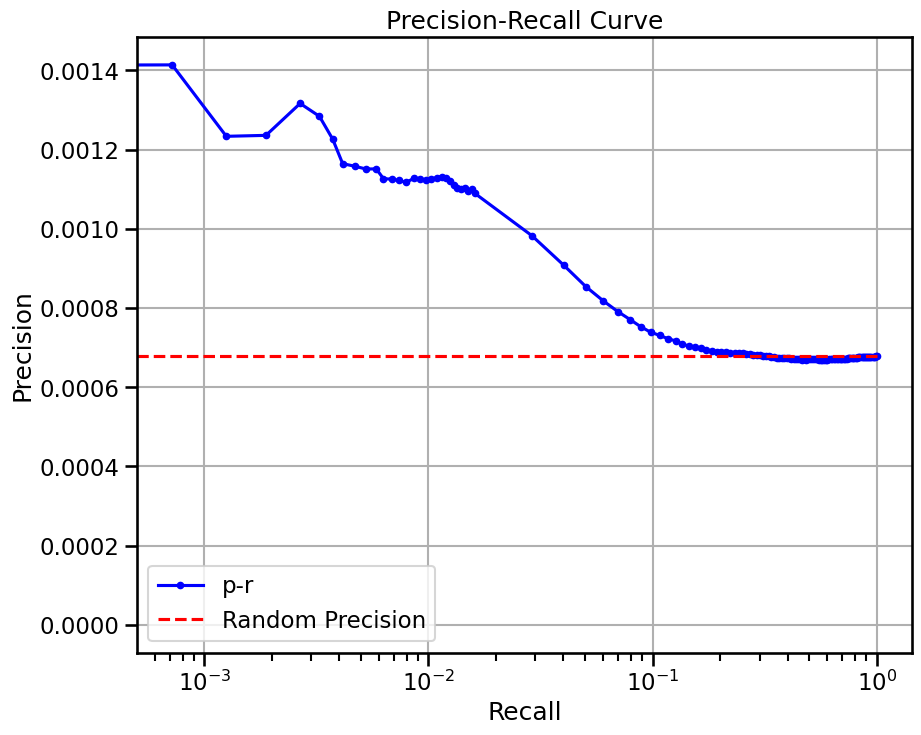

  0%|          | 0/15 [00:00<?, ?it/s]

  7%|▋         | 1/15 [00:02<00:41,  2.99s/it]

 13%|█▎        | 2/15 [00:05<00:32,  2.50s/it]

 20%|██        | 3/15 [00:06<00:24,  2.08s/it]

 27%|██▋       | 4/15 [00:08<00:21,  1.93s/it]

 33%|███▎      | 5/15 [00:10<00:18,  1.83s/it]

 40%|████      | 6/15 [00:11<00:15,  1.76s/it]

 47%|████▋     | 7/15 [00:14<00:15,  1.97s/it]

 53%|█████▎    | 8/15 [00:15<00:12,  1.83s/it]

 60%|██████    | 9/15 [00:17<00:10,  1.71s/it]

 67%|██████▋   | 10/15 [00:18<00:08,  1.61s/it]

 73%|███████▎  | 11/15 [00:19<00:06,  1.54s/it]

 80%|████████  | 12/15 [00:21<00:04,  1.49s/it]

 87%|████████▋ | 13/15 [00:22<00:02,  1.44s/it]

 93%|█████████▎| 14/15 [00:23<00:01,  1.41s/it]

100%|██████████| 15/15 [00:24<00:00,  1.14s/it]

100%|██████████| 15/15 [00:24<00:00,  1.65s/it]

base enrichment


Top central genes: []
The DataFrame contains only the same values.


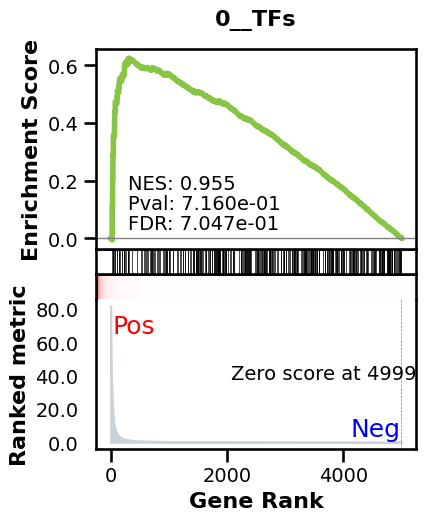

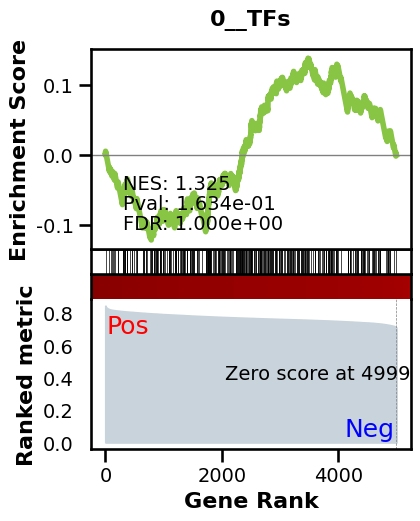

_________________________________________
TF specific enrichment


found some significant results for  10.606060606060606 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.0018330143823302558 
recall:  1.0 
random precision: 0.0018335017565345446


  0%|          | 0/128 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:00<00:03, 38.39it/s]

  7%|▋         | 9/128 [00:00<00:02, 39.82it/s]

 11%|█         | 14/128 [00:00<00:02, 40.63it/s]

 15%|█▍        | 19/128 [00:00<00:02, 41.38it/s]

 19%|█▉        | 24/128 [00:00<00:02, 41.42it/s]

 23%|██▎       | 29/128 [00:00<00:02, 41.41it/s]

 27%|██▋       | 34/128 [00:00<00:02, 41.13it/s]

 30%|███       | 39/128 [00:00<00:02, 40.54it/s]

 34%|███▍      | 44/128 [00:01<00:02, 39.94it/s]

 38%|███▊      | 48/128 [00:01<00:02, 39.75it/s]

 41%|████      | 52/128 [00:01<00:01, 39.78it/s]

 45%|████▍     | 57/128 [00:01<00:01, 40.64it/s]

 48%|████▊     | 62/128 [00:01<00:01, 40.94it/s]

 52%|█████▏    | 67/128 [00:01<00:01, 40.83it/s]

 56%|█████▋    | 72/128 [00:01<00:01, 40.39it/s]

 60%|██████    | 77/128 [00:01<00:01, 40.37it/s]

 64%|██████▍   | 82/128 [00:02<00:01, 40.06it/s]

 68%|██████▊   | 87/128 [00:02<00:01, 39.47it/s]

 71%|███████   | 91/128 [00:02<00:00, 38.95it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 38.37it/s]

 77%|███████▋  | 99/128 [00:02<00:00, 38.59it/s]

 81%|████████▏ | 104/128 [00:02<00:00, 39.50it/s]

 85%|████████▌ | 109/128 [00:02<00:00, 40.04it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 40.24it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 40.51it/s]

 97%|█████████▋| 124/128 [00:03<00:00, 40.82it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:03<00:00, 40.30it/s]

Average Precision (AP):  0.0019831790741082485
Area Under Precision-Recall Curve (AUPRC):  0.0019823542894852903


EPR: 2.132222350114667


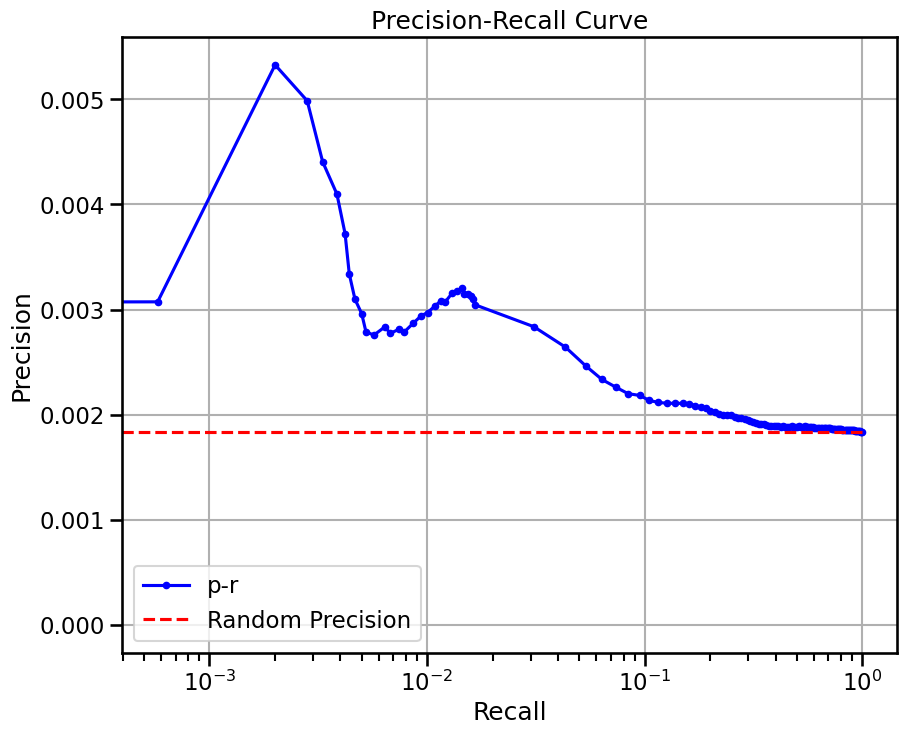

base enrichment


Top central genes: []


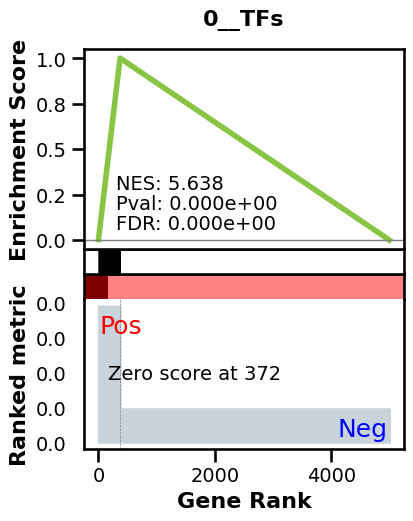

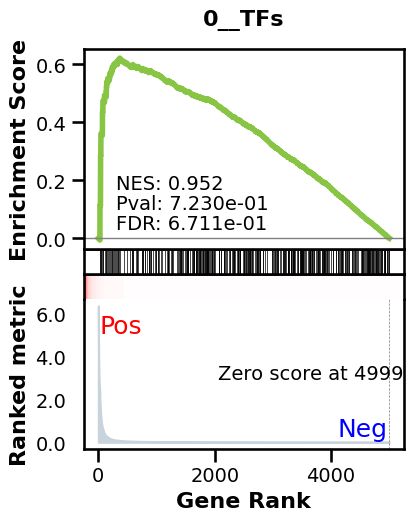

_________________________________________
TF specific enrichment


found some significant results for  4.545454545454546 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.009222253494699316 
recall:  0.4547066533035232 
random precision: 0.0018335017565345446


  0%|          | 0/128 [00:00<?, ?it/s]

  4%|▍         | 5/128 [00:00<00:02, 44.27it/s]

  8%|▊         | 10/128 [00:00<00:02, 44.34it/s]

 12%|█▏        | 15/128 [00:00<00:02, 44.19it/s]

 16%|█▌        | 20/128 [00:00<00:02, 43.35it/s]

 20%|█▉        | 25/128 [00:00<00:02, 42.57it/s]

 23%|██▎       | 30/128 [00:00<00:02, 42.48it/s]

 27%|██▋       | 35/128 [00:00<00:02, 42.19it/s]

 31%|███▏      | 40/128 [00:00<00:02, 41.56it/s]

 35%|███▌      | 45/128 [00:01<00:02, 40.80it/s]

 39%|███▉      | 50/128 [00:01<00:01, 40.68it/s]

 43%|████▎     | 55/128 [00:01<00:01, 41.03it/s]

 47%|████▋     | 60/128 [00:01<00:01, 41.74it/s]

 51%|█████     | 65/128 [00:01<00:01, 42.05it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 42.56it/s]

 59%|█████▊    | 75/128 [00:01<00:01, 42.89it/s]

 62%|██████▎   | 80/128 [00:01<00:01, 43.10it/s]

 66%|██████▋   | 85/128 [00:02<00:01, 42.93it/s]

 70%|███████   | 90/128 [00:02<00:00, 43.07it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 43.45it/s]

 78%|███████▊  | 100/128 [00:02<00:00, 43.45it/s]

 82%|████████▏ | 105/128 [00:02<00:00, 42.33it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 41.51it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 41.85it/s]

 94%|█████████▍| 120/128 [00:02<00:00, 42.20it/s]

 98%|█████████▊| 125/128 [00:02<00:00, 42.56it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:03<00:00, 42.42it/s]

Average Precision (AP):  0.006552265347175383
Area Under Precision-Recall Curve (AUPRC):  0.00584281816691655
EPR: 8.844206124953837


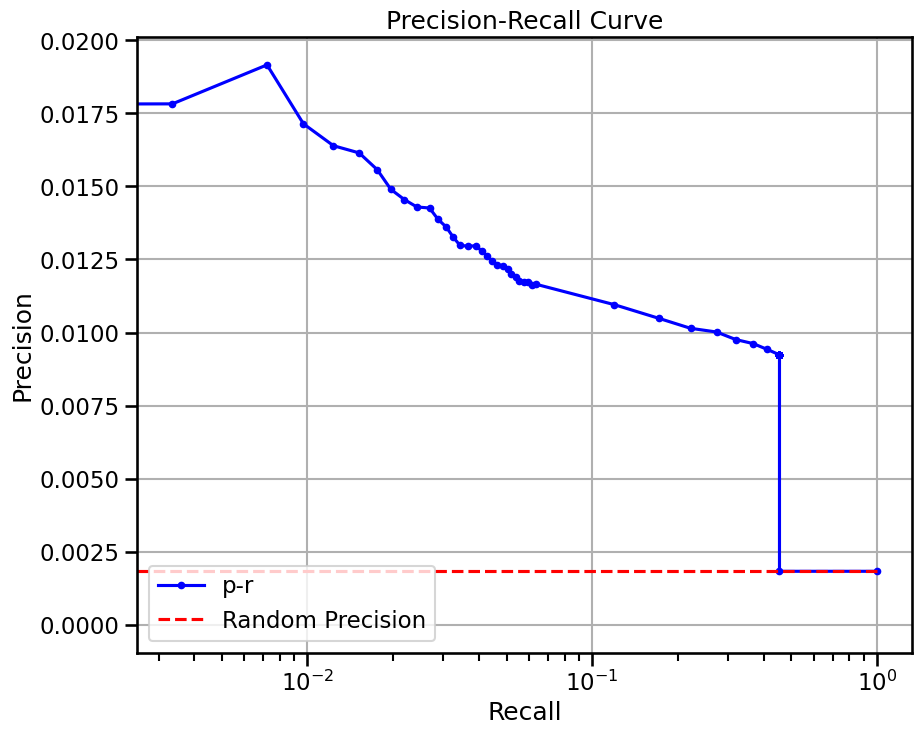

base enrichment


Top central genes: []
The DataFrame contains only the same values.


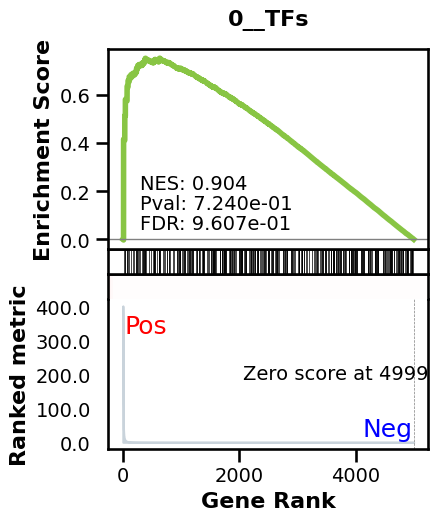

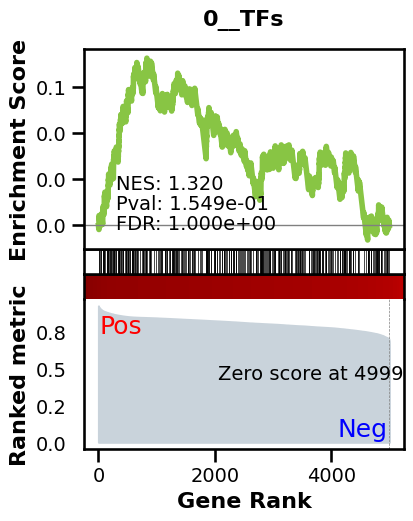

_________________________________________
TF specific enrichment


found some significant results for  9.090909090909092 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.0018330143823302558 
recall:  1.0 
random precision: 0.0018335017565345446


  0%|          | 0/128 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:00<00:03, 38.32it/s]

  6%|▋         | 8/128 [00:00<00:03, 39.12it/s]

  9%|▉         | 12/128 [00:00<00:02, 39.41it/s]

 13%|█▎        | 17/128 [00:00<00:02, 39.90it/s]

 17%|█▋        | 22/128 [00:00<00:02, 40.41it/s]

 21%|██        | 27/128 [00:00<00:02, 41.25it/s]

 25%|██▌       | 32/128 [00:00<00:02, 41.67it/s]

 29%|██▉       | 37/128 [00:00<00:02, 41.41it/s]

 33%|███▎      | 42/128 [00:01<00:02, 41.27it/s]

 37%|███▋      | 47/128 [00:01<00:01, 40.51it/s]

 41%|████      | 52/128 [00:01<00:01, 40.19it/s]

 45%|████▍     | 57/128 [00:01<00:01, 40.21it/s]

 48%|████▊     | 62/128 [00:01<00:01, 39.65it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 39.24it/s]

 55%|█████▍    | 70/128 [00:01<00:01, 39.17it/s]

 58%|█████▊    | 74/128 [00:01<00:01, 39.28it/s]

 62%|██████▏   | 79/128 [00:01<00:01, 39.65it/s]

 65%|██████▍   | 83/128 [00:02<00:01, 39.23it/s]

 68%|██████▊   | 87/128 [00:02<00:01, 39.42it/s]

 72%|███████▏  | 92/128 [00:02<00:00, 40.36it/s]

 76%|███████▌  | 97/128 [00:02<00:00, 40.05it/s]

 80%|███████▉  | 102/128 [00:02<00:00, 39.91it/s]

 83%|████████▎ | 106/128 [00:02<00:00, 39.91it/s]

 86%|████████▌ | 110/128 [00:02<00:00, 39.91it/s]

 89%|████████▉ | 114/128 [00:02<00:00, 39.76it/s]

 93%|█████████▎| 119/128 [00:02<00:00, 39.98it/s]

 96%|█████████▌| 123/128 [00:03<00:00, 39.81it/s]

 99%|█████████▉| 127/128 [00:03<00:00, 39.75it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:03<00:00, 39.99it/s]

Average Precision (AP):  0.0017825957816446957
Area Under Precision-Recall Curve (AUPRC):  0.001780384779970109
EPR: 1.5165910728750052


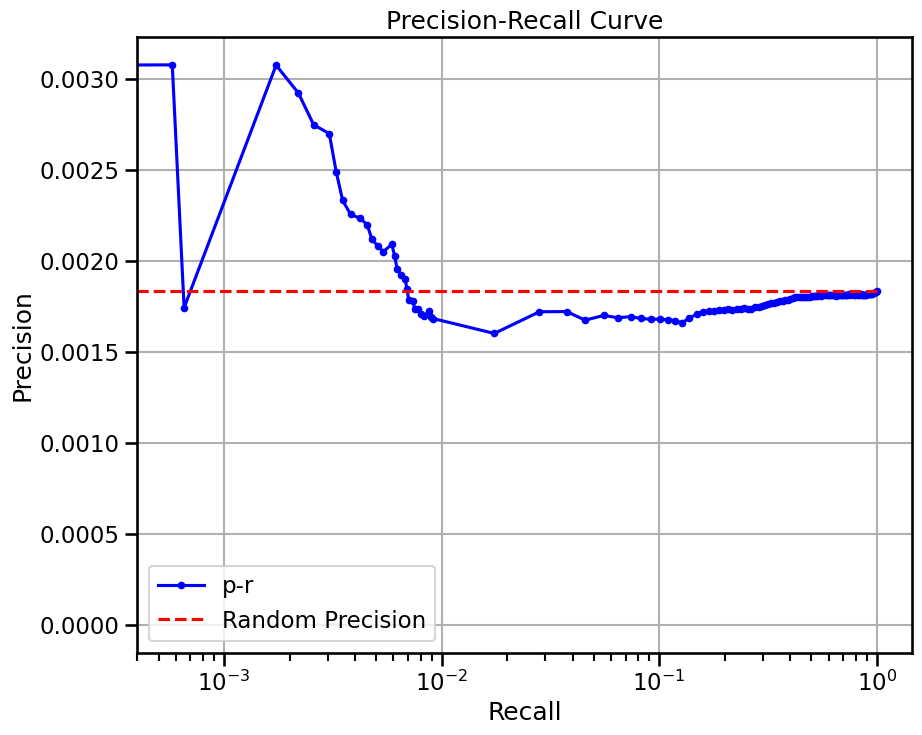

base enrichment


Top central genes: []


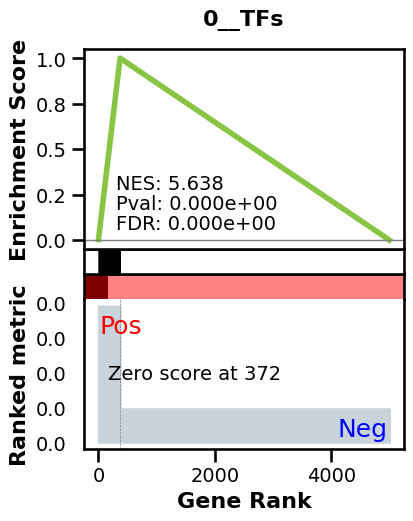

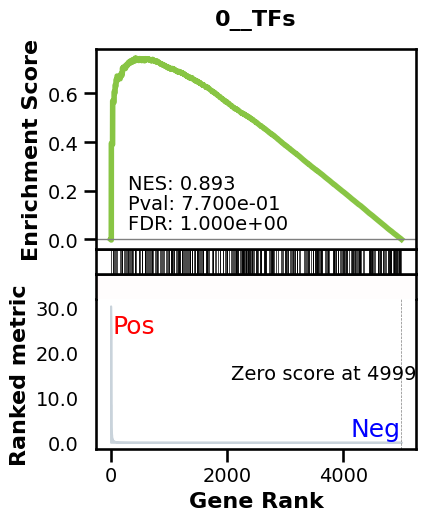

_________________________________________
TF specific enrichment


found some significant results for  3.0303030303030303 % TFs

_________________________________________
loading GT,  omnipath


intersection of 3762 genes
intersection pct: 0.7524
precision:  0.009222253494699316 
recall:  0.4547066533035232 
random precision: 0.0018335017565345446


  0%|          | 0/128 [00:00<?, ?it/s]

  3%|▎         | 4/128 [00:00<00:03, 39.78it/s]

  6%|▋         | 8/128 [00:00<00:03, 39.56it/s]

  9%|▉         | 12/128 [00:00<00:02, 39.61it/s]

 12%|█▎        | 16/128 [00:00<00:02, 39.36it/s]

 16%|█▌        | 20/128 [00:00<00:02, 38.73it/s]

 19%|█▉        | 24/128 [00:00<00:02, 37.97it/s]

 22%|██▏       | 28/128 [00:00<00:02, 37.56it/s]

 25%|██▌       | 32/128 [00:00<00:02, 37.78it/s]

 28%|██▊       | 36/128 [00:00<00:02, 38.20it/s]

 32%|███▏      | 41/128 [00:01<00:02, 38.83it/s]

 36%|███▌      | 46/128 [00:01<00:02, 39.32it/s]

 40%|███▉      | 51/128 [00:01<00:01, 39.75it/s]

 44%|████▍     | 56/128 [00:01<00:01, 40.39it/s]

 48%|████▊     | 61/128 [00:01<00:01, 40.74it/s]

 52%|█████▏    | 66/128 [00:01<00:01, 41.03it/s]

 55%|█████▌    | 71/128 [00:01<00:01, 41.14it/s]

 59%|█████▉    | 76/128 [00:01<00:01, 40.74it/s]

 63%|██████▎   | 81/128 [00:02<00:01, 40.36it/s]

 67%|██████▋   | 86/128 [00:02<00:01, 40.16it/s]

 71%|███████   | 91/128 [00:02<00:00, 39.57it/s]

 74%|███████▍  | 95/128 [00:02<00:00, 38.91it/s]

 77%|███████▋  | 99/128 [00:02<00:00, 38.37it/s]

 80%|████████  | 103/128 [00:02<00:00, 38.28it/s]

 84%|████████▎ | 107/128 [00:02<00:00, 38.33it/s]

 87%|████████▋ | 111/128 [00:02<00:00, 38.25it/s]

 90%|████████▉ | 115/128 [00:02<00:00, 38.57it/s]

 93%|█████████▎| 119/128 [00:03<00:00, 38.71it/s]

 96%|█████████▌| 123/128 [00:03<00:00, 38.90it/s]

/pasteur/appa/homes/jkalfon/benGRN/bengrn/base.py:750: RuntimeWarning: invalid value encountered in scalar divide
  precision = (grn[true] > threshold).sum() / (grn > threshold).sum()
100%|██████████| 128/128 [00:03<00:00, 39.30it/s]

100%|██████████| 128/128 [00:03<00:00, 39.27it/s]

Average Precision (AP):  0.00608297502323476
Area Under Precision-Recall Curve (AUPRC):  0.005405788578491621
EPR: 5.666202792654239


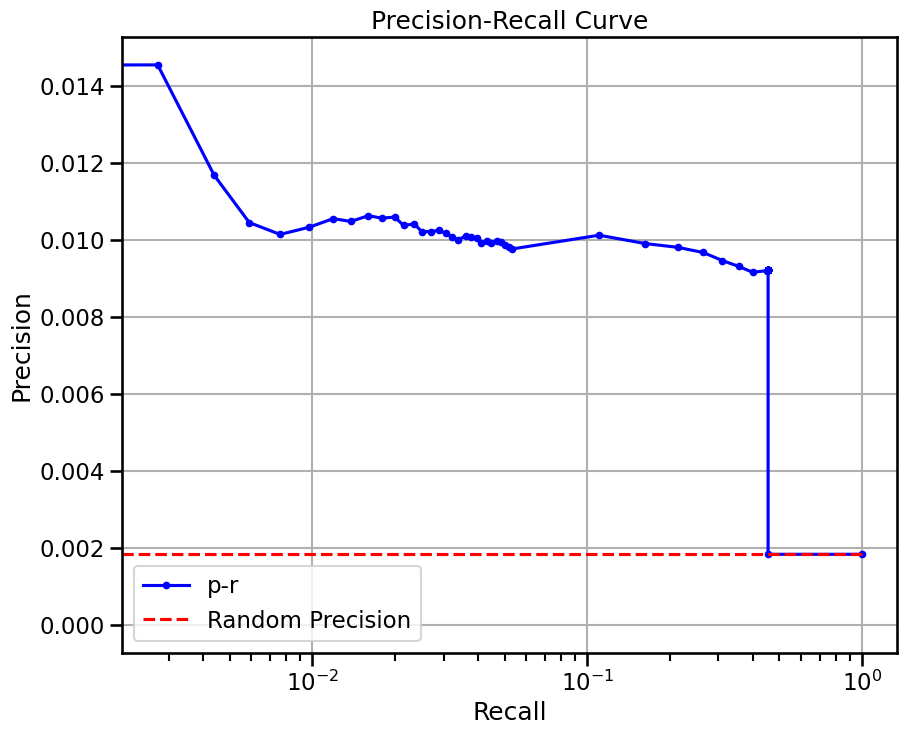

In [6]:
metrics = {}
clf_omni = None
for celltype in CELLTYPES:
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="random expr",
                        preprocess="softmax",
                        head_agg='mean',
                        filtration="none",
                        forward_mode="none",
                        num_genes=2200,
                        max_cells=MAXCELLS,
                        doplot=False,
                        batch_size=32,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    metrics[celltype+'_scprint_full'] = BenGRN(grn).scprint_benchmark()
    del grn
    grn_inferer = GRNfer(model, adata[adata.X.sum(1) > 500],
                        how="most var across",
                        preprocess="softmax",
                        head_agg='none',
                        filtration="none",
                        forward_mode="none",
                        num_genes=NUM_GENES,
                        max_cells=1024,
                        doplot=False,
                        batch_size=16,
                        )
    grn = grn_inferer(layer=list(range(model.nlayers))[:], cell_type=celltype)
    grn.var.index = make_index_unique(grn.var['symbol'].astype(str))
    grn.varp['all'] = grn.varp['GRN']
    grn.varp['GRN'] = grn.varp['GRN'][:,:,:].mean(-1)
    metrics[celltype+'_scprint_mean'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    print(grn.shape, celltype)
    metrics[celltype+'_scprint_tf_mean'] = BenGRN(grn).scprint_benchmark()
    if clf_omni == None:
        grn.varp['GRN'] = grn.varp['all']
        _, m, clf_omni = train_classifier(grn, C=1, train_size=0.6, class_weight={
                                        1: 300, 0: 1}, shuffle=True, max_iter=200, return_full=False)
        joblib.dump(clf_omni, 'clf_omni.pkl')
    grn.varp['GRN'] = grn.varp['all'][:,:,clf_omni.coef_[0] > 0].mean(-1)
    metrics[celltype+'_scprint_class'] = BenGRN(grn).scprint_benchmark()
    grn.varp['GRN'][~grn.var.isTF,:]=0
    metrics[celltype+'_scprint_tf_class'] = BenGRN(grn).scprint_benchmark()
    del grn

In [7]:
metrics

{'retinal rod cell_scprint_full': {'enriched_terms_Regulators': ['celltype.gmt__Retinal progenitor cells'],
  'TF_enr': True,
  'significant_enriched_TFtargets': 43.75,
  'precision': 0.0006618214377693767,
  'recall': 1.0,
  'rand_precision': 0.0006618672671051408,
  'auprc': 0.0006292166030988392,
  'ap': 0.0006296420580010434,
  'epr': 2.2475197135623852},
 'retinal rod cell_scprint_mean': {'TF_enr': True,
  'enriched_terms_Targets': ['celltype.gmt__Neutrophils'],
  'significant_enriched_TFtargets': 62.5,
  'precision': 0.0002208618126552002,
  'recall': 1.0,
  'rand_precision': 0.00022094140249759845,
  'auprc': 0.0003168957101930489,
  'ap': 0.00034282500211048973,
  'epr': 13.36894391259976},
 'retinal rod cell_scprint_tf_mean': {'enriched_terms_Central': ['0__TFs',
   'celltype.gmt__Embryonic stem cells',
   'celltype.gmt__Enteric neurons',
   'celltype.gmt__Beta cells',
   'celltype.gmt__Alpha cells',
   'celltype.gmt__Enteroendocrine cells',
   'celltype.gmt__Satellite cells',

In [1]:
True
True
True
True
True
False
False
True
False
True
False
True
True
False
True
False
False
True
False
True
False
False
False
False
False
False
False
True
False
False
False
False
True
False
True
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False

True

In [8]:
print('new2')

new


In [9]:
import pandas as pd

In [10]:
res = []
for k, v in metrics.items():
    res.append([k.split('_')[-1], k.split('_')[0], v['epr'], v['auprc'], v['ap'], v['rand_precision'], v['significant_enriched_TFtargets'], v.get('TF_enr', False), 'tf_' in k])

df = pd.DataFrame(res, columns=['tools','name','EPR', 'AUPRC', 'AP', 'RAND', 'TF_targ', 'TF_enr', 'TF_only'])
df

,tools,name,EPR,AUPRC,AP,RAND,TF_targ,TF_enr,TF_only
0,full,retinal rod cell,2.247520,0.000629,0.000630,0.000662,43.750000,True,False
1,mean,retinal rod cell,13.368944,0.000317,0.000343,0.000221,62.500000,True,False
2,mean,retinal rod cell,10.682560,0.000734,0.000817,0.000221,0.000000,True,True
3,class,retinal rod cell,13.368944,0.000405,0.000455,0.000221,25.000000,True,False
4,class,retinal rod cell,29.620787,0.000837,0.000940,0.000221,0.000000,True,True
5,full,Mueller cell,2.226865,0.000651,0.000651,0.000662,38.392857,True,False
6,mean,Mueller cell,2.771452,0.001519,0.001521,0.001377,24.137931,False,False
7,mean,Mueller cell,9.027729,0.003750,0.004248,0.001377,5.172414,True,True
8,class,Mueller cell,2.286426,0.001297,0.001303,0.001377,8.620690,True,False
9,class,Mueller cell,4.071151,0.003239,0.003738,0.001377,0.000000,True,True
